In [2]:
import pandas as pd
import matplotlib.pyplot as plt

%matplotlib inline


In [3]:
df = pd.read_csv('huge_rand_10k.csv', sep=',')

In [4]:
df['purchase_date'] = pd.to_datetime(df.purchase_date)


grouped = df.groupby('card_id')
# n = len(grouped)


df.to_pickle('huge_processed')

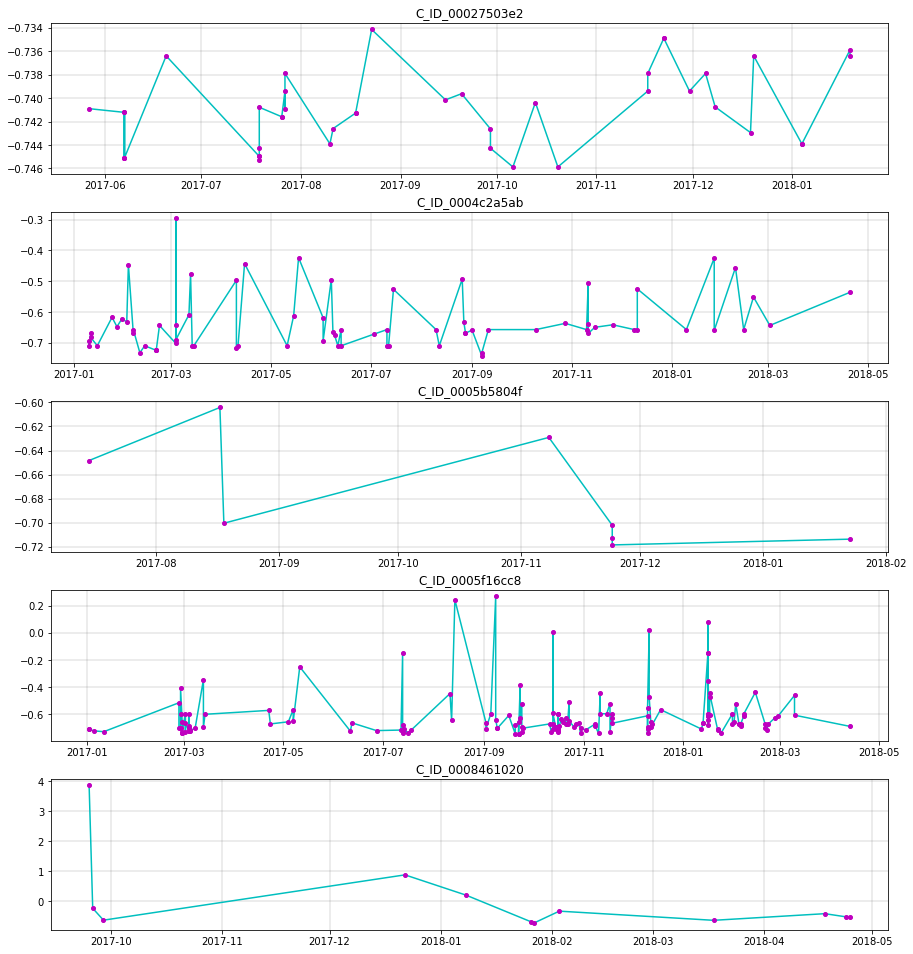

In [6]:
n = 5
f, axs = plt.subplots(nrows=n, ncols=1, sharex=False, sharey=False, figsize=(15,15))



counter = 0
for name, group in grouped:
    if counter == 5:
        break
#     print(name)
    group = group.sort_values(by = 'purchase_date')
    axs[counter].plot(group['purchase_date'], group['purchase_amount'], '-o', c='c', 
                      markerfacecolor='m', mec = 'm', markersize=4)
    axs[counter].set_title(name)
    axs[counter].grid(color='grey', linestyle='-', linewidth=0.3)
    
    
    counter += 1

plt.subplots_adjust(top=0.92, bottom=0.08, hspace=0.25,
                wspace=0.35)

In [10]:
import numpy as np
from datetime import datetime

In [111]:
counter = 0 

data = []
titles = []
for name, group in grouped:
    if counter == 40:
        break
#     print(name)
    group = group.sort_values(by = 'purchase_date')
    
#     print(group[['purchase_amount', 'purchase_date']])
#     print(group['card_id'].iloc[0])
    titles.append(group['card_id'].iloc[0])
    data.append(np.array(group[['purchase_date', 'purchase_amount']]))
    
    counter +=1

In [149]:
for i in data:
    i[:,0] = i[:,0].astype('datetime64[s]').tolist()


In [150]:
x = data[3][:,1]

In [152]:
x = x.astype('float64')

In [153]:
#Do all of the imports and setup inline plotting
import numpy as np
# from ripser import ripser, plot_dgms

%matplotlib notebook
import matplotlib.pyplot as plt
from matplotlib import gridspec
from mpl_toolkits.mplot3d import Axes3D

from sklearn.decomposition import PCA

import scipy.interpolate as interp

import ipywidgets as widgets
from IPython.display import display

import warnings
warnings.filterwarnings('ignore')

In [160]:
plt.plot(x);
# plt.subplot(x,projection='3d')

In [155]:
def getSlidingWindow(x, dim, Tau, dT):
    N = len(x)
    NWindows = int(np.floor((N-dim*Tau)/dT)) # The number of windows
    if NWindows <= 0:
        print("Error: Tau too large for signal extent")
        return np.zeros((3, dim))
    X = np.zeros((NWindows, dim)) # Create a 2D array which will store all windows
    idx = np.arange(N)
    for i in range(NWindows):
        # Figure out the indices of the samples in this window
        idxx = dT*i + Tau*np.arange(dim) 
        start = int(np.floor(idxx[0]))
        end = int(np.ceil(idxx[-1]))+2
        if end >= len(x):
            X = X[0:i, :]
            break
        # Do spline interpolation to fill in this window, and place
        # it in the resulting array
        X[i, :] = interp.spline(idx[start:end+1], x[start:end+1], idxx)
    return X

In [175]:
X = getSlidingWindow(x, 112, 1, 0.5)

In [183]:
pca = PCA(n_components = 2)
Y = pca.fit_transform(X)

<IPython.core.display.Javascript object>


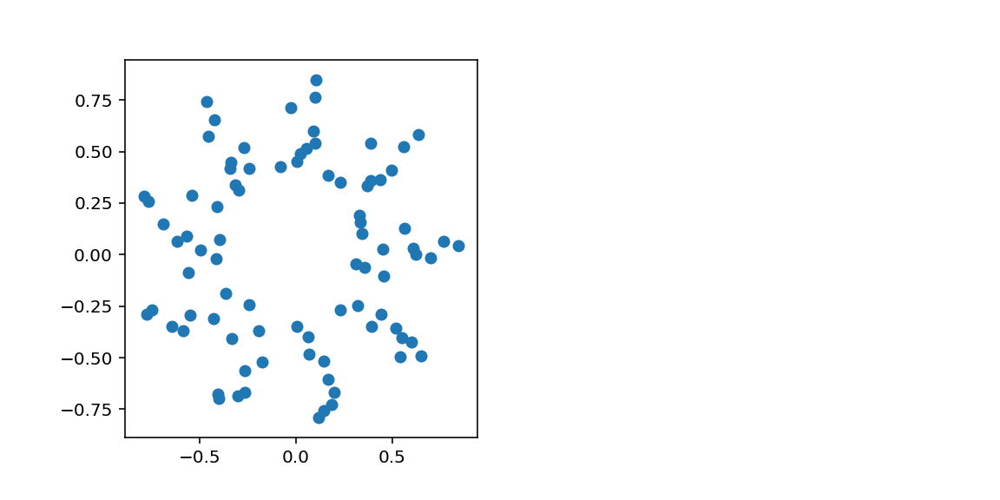

In [186]:
fig = plt.figure(figsize=plt.figaspect(0.5))

ax = fig.add_subplot(1, 2, 1)
# ax.scatter(Y[:,0], Y[:,1])
ax.scatter(Y[:,0], Y[:,1])

<IPython.core.display.Javascript object>


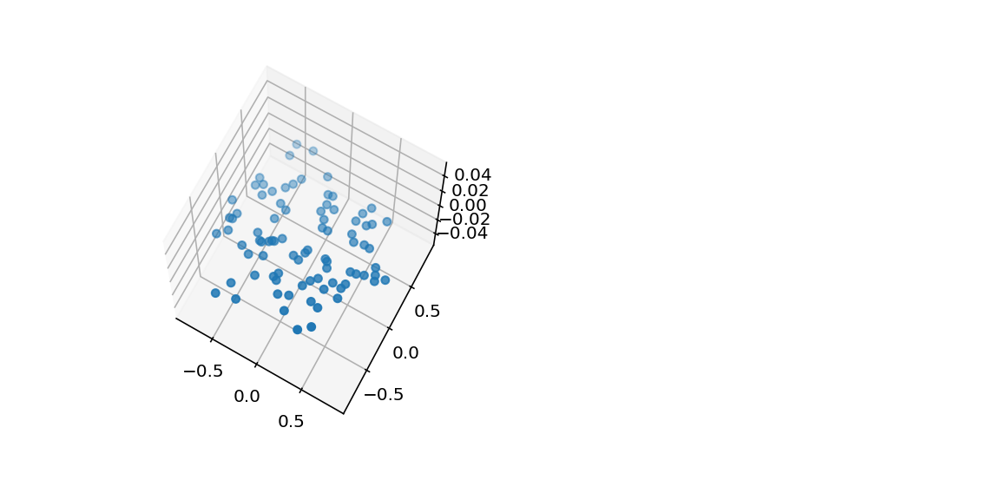

In [182]:
fig = plt.figure(figsize=plt.figaspect(0.5))

ax = fig.add_subplot(1, 2, 1, projection='3d')
# ax.scatter(Y[:,0], Y[:,1])
ax.scatter(Y[:,1], Y[:,2])


<IPython.core.display.Javascript object>


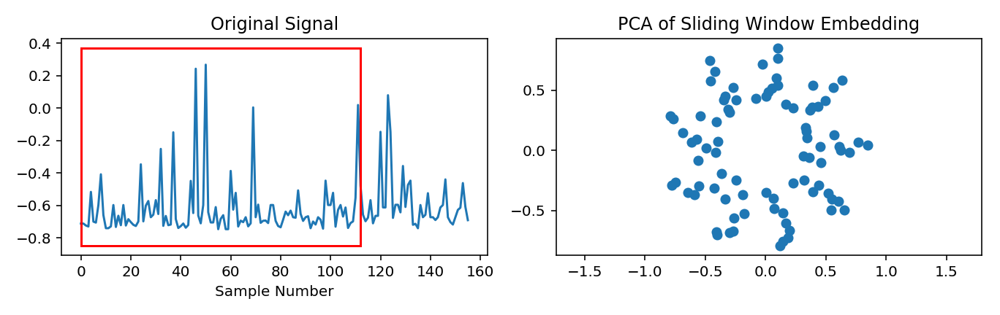

lambda1 = 0.0563536, lambda2 = 0.0538058
lambda1 = 0.127426, lambda2 = 0.125466
lambda1 = 0.191503, lambda2 = 0.189659


In [174]:
def on_value_change(change):
    execute_computation1()
    
dimslider = widgets.IntSlider(min=1,max=len(x),value=20,description='Dimension:',continuous_update=False)
dimslider.observe(on_value_change, names='value')

Tauslider = widgets.FloatSlider(min=0.1,max=5,step=0.1,value=1,description=r'\(\tau :\)' ,continuous_update=False)
Tauslider.observe(on_value_change, names='value')

dTslider = widgets.FloatSlider(min=0.1,max=5,step=0.1,value=0.5,description='dT: ',continuous_update=False)
dTslider.observe(on_value_change, names='value')

display(widgets.HBox(( dimslider,Tauslider,dTslider)))

plt.figure(figsize=(9.5, 3))
def execute_computation1():    
    plt.clf()
    
    # Get slider values
    dim = dimslider.value
    Tau = Tauslider.value
    dT = dTslider.value
    
    #Step 2: Do a sliding window embedding
    X = getSlidingWindow(x, dim, Tau, dT)
    extent = Tau*dim

    #Step 3: Perform PCA down to 2D for visualization
    pca = PCA(n_components = 2)
    Y = pca.fit_transform(X)
    eigs = pca.explained_variance_
    print("lambda1 = %g, lambda2 = %g"%(eigs[0], eigs[1]))

    #Step 4: Plot original signal and PCA of the embedding
    ax = plt.subplot(121)
    ax.plot(x)
#     ax.set_ylim((-max(x), max(x)))
    ax.set_title("Original Signal")
    ax.set_xlabel("Sample Number")
    yr = np.max(x)-np.min(x)
    yr = [np.min(x)-0.1*yr, np.max(x)+0.1*yr]
    ax.plot([extent, extent], yr, 'r')
    ax.plot([0, 0], yr, 'r')     
    ax.plot([0, extent], [yr[0]]*2, 'r')
    ax.plot([0, extent], [yr[1]]*2, 'r')
    ax2 = plt.subplot(122)
    ax2.set_title("PCA of Sliding Window Embedding")
    ax2.scatter(Y[:, 0], Y[:, 1])
    ax2.set_aspect('equal', 'datalim')
    plt.tight_layout()
    
execute_computation1()

In [336]:
df_a = pd.read_csv('output_10k.csv', sep = ';')
new_df = df_a.T.reset_index()

for i in range(len(new_df['index'][3:])):
    new_df['index'][i+3] = pd.to_datetime(new_df['index'][i+3])
    
new_df = new_df.set_index(['index'])
new_df = new_df.T

num_dates = len(new_df.columns[3:])
num_users = len(new_df)

In [329]:
def make_list(x):
    result = []
    if len(x) == 2:
        return result
    else:
        s = x[1:-1]
        lst = s.split(', ')
        result = [float(d[1:-1]) for d in lst]
        return result

In [337]:
for j in range(0, 5001, 2):
#     print(j)
#     t_y = new_df.iloc[j][0] + 'Approved'
#     t_n = new_df.iloc[j][0] + 'Denied'
    for i in range(3, num_dates+1):
        print(new_df.iloc[j][i])
        if len(new_df.iloc[j][i])==2:
            new_df.iloc[j][i] = 0
        else:
            new_df.iloc[j][i] = make_list(new_df.iloc[j][i])


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.03717559', '-0.46741468']
[]
['-0.57260026']
[]
[]
[]
['-0.33157501']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.48394384']
[]
[]
['-0.57260026']
[]
['-0.40129802', '-0.65674872']
[]
[]
['-0.56658965', '-0.56658965', '-0.67793611']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.57861086', '-0.65674872', '-0.66831914', '-0.69206103', '-0.72887598', '-0.72887598']
[]
['0.00441779', '-0.41865365', '-0.44637756']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62369040']
['-0.58762677']
[]
['-0.29611244']
[]
[]
[]
['-0.69882296']
[]
[]
[]
[]
[]
[]
['-0.66125668']
['-0.58161617']
[]
['-0.56576320', '-0.68376639']
[]
[]
[]
[]
['-0.62669570']
['-0.45238816', '-0.59964798', '-0.66275933']
[]
['-0.23450374']
['-0.70182826']
[]
[]
[]
['-0.67327789', '-0.72136273']
[]
[]
['-

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71535212']
[]
[]
[]
[]
[]
['-0.73200150']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60415593', '1.01845189']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63323223']
['-0.16087384', '1.34177734']
['-0.30852434']
[]
[]
['-0.56205165', '1.47037423']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55306579']
[]
['-0.34802904']
[]
[]
[]
[]
['-0.43946536', '-0.66275933', '1.93577536', '2.69443388']
['-0.52601807']
[]
['-0.72148294', '1.05583785']
[]
[]
[]
[]
[]
[]
['-0.44788021']
[]
[]
[]
[]
[]
['-0.22248253']
[]
['-0.60876907']
['-0.64519334']
[]
['-0.67478054']
['-0.60588398', '1.65910722']
[]
[]
[]
[]
[]
['-0.03015821', '-0.67928849']
[]
['-0.23104765', '-0.70182826']
[]
[]
[]
[]
['0.10955830', '0.24484198', '-0.30633047', '-0.48062298', '1.41690990']

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73416531']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71084417', '-0.73790691']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59754427', '-0.70822955']
['-0.72887598']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61622222', '-0.70182826', '-0.71700504']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71861287']
[]
[]
[]
['-0.73488659']
[]
['-0.73488659']
[]
[]
[]
[]
['-0.73488659']
[]
[]
['-0.40129802', '2.25839456']
['-0.69912349']
['-0.69309786']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64172221']
[]
[]
[]
[]
[]
['-0.28177715', '-0.61464444', '-0.70883061', '-0.70952183']
['-0.70869538']
['-0.61016654', '

['-0.65266151']
['-0.68489338']
[]
[]
['-0.72737333']
['-0.71685477']
['-0.58765682']
['-0.61846117', '-0.69581766']
[]
[]
[]
[]
[]
['-0.72587068']
[]
[]
[]
['-0.65921307']
[]
['-0.50365862']
['-0.67078349']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.15505858', '-0.41181658', '-0.64172221', '-0.65825138', '-0.70483356']
['-0.52752072', '-0.74239984']
[]
['-0.55156314', '-0.68169273']
['-0.61166919', '-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.09701116', '-0.27182960', '-0.70498383', '-0.70534446', '-0.70544965']
['-0.72190368']
['-0.69311288', '-0.69732031', '-0.72170834']
[]
[]
[]
[]
[]
['-0.61181945']
[]
[]
['-0.62737189']
['-0.68253422']
[]
[]
[]
[]
['-0.63297678']
[]
[]
[]
['-0.35967459

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67541165']
['-0.72466856']
[]
['-0.67927347']
[]
[]
['-0.72617121', '-0.73219684', '-0.73714056']
[]
['-0.69717004', '-0.73037863', '-0.73186626', '-0.73372954']
['-0.72692253']
[]
[]
['-0.60866389', '-0.72230940']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71407487']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.54517687']
['-0.70934152']
[]
[]
['-0.72602094']
[]
[]
['-0.71351889', '-0.72001034']
['-0.70137746']
[]
[]
['-0.70809432']
[]
['-0.71686980']
[]
[]
['-0.71034829']
[]
[]
[]
[]
[]
[]
[]
['-0.67502096']
[]
[]
['-0.73699030']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70934152']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
['-0.74022100']
[]
['-0.65676375', '-0.70197853', '-0.73161081']
['-0.70265472', '-0.71835742']
[]
['-0.55907640', '-0.73946967']
[]
[]
['-0.65088838', '-0.68683180', '-0.73563791', '-0.73592342']
[]
[]
['-0.73538246']
[]
[]
[]
['-0.73413526']
['-0.72791428']
[]
['-0.72115235']
[]
['-0.65224077', '-0.71786155']
['-0.71329349']
['-0.73192636', '-0.73300827']
[]
[]
[]
[]
['-0.73789189']
[]
[]
[]
[]
[]
['-0.73515706']
['-0.72887598']
[]
[]
[]
['-0.73789189']
['-0.69807163']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
['-0.71686980']
[]
[]
['-0.68639603']
[]
['-0.67179026', '-0.72668211']
['-0.73829760']
[]
['-0.59664268', '-0.72887598', '-0.73554775']
[]
['-0.73954480']
[]
['-0.67177524', '-0.73927433']
['-0.66741755', '-0.73037863', '-0.73488659', '-0.73526225', '-0.73804215']
['-0.66967152', '-0.71763615']
['-0.63721426']
[]
['-0.68683180', '-0.72430792']
['-0.66573458', '-0.72887598']
[]
[]
['-0.70212879', '-0.73777168']
['-0.71685477']
[]
[]
[]
[]
[]
[]
['-0.686

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71535212']
[]
['-0.69431500', '-0.72436803']
[]
[]
[]
[]
[]
[]
[]
['-0.71535212']
['-0.71384947']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71535212']
[]
[]
['-0.71535212']
[]
[]
[]
[]
['-0.62669570', '-0.71702006', '-0.73939454']
[]
['-0.69994995']
['-0.71311317', '-0.71476609']
[]
[]
['-0.73745612']
[]
[]
['-0.64923547']
[]
[]
[]
[]
['-0.62669570']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71535212']
[]
[]
[]
[]
[]
[]
[]
['-0.65524607']
[]
['-0.65225580']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71084417']
['-0.70934152', '-0.72624634']
[]
[]
[]
[]
[]
[]
['-0.65674872', '-0.70934152']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73638924', '-0.73653950']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69296262', '-0.7

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55653692']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.28093566']
['-0.68579497']
[]
[]
[]
[]
[]
[]
['-0.14584732', '-0.67478054', '-0.70934152']
[]
[]
['-0.40616661', '-0.50648361', '-0.72121246']
['-0.43135105', '-0.74014587']
[]
[]
[]
[]
['-0.71835742']
[]
['-0.60063973', '-0.61572635', '-0.66726728']
[]
['-0.50265185']
[]
[]
['-0.72016060', '-0.72460845']
['-0.58612412']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.50645355']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56652955', '-0.67840193']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.45389082']
[]
[]
[]
[]
[]
[]
['-0.59889665', '-0.67478054']
[]
[]
[]
[]
[]
['-0.56658

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69431500', '-0.73338393']
['-0.71309814', '-0.71685477']
[]
[]
[]
[]
[]
[]
['-0.71309814', '-0.72587068', '-0.73188128', '-0.73789189']
['-0.70182826', '-0.71159549', '-0.71685477', '-0.71685477', '-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69431500']
[]
['-0.69431500']
['-0.69431500']
[]
['-0.73338393']
['-0.69431500']
[]
['-0.69431500']
[]
['-0.69431500']
[]
[]
[]
['-0.69431500']
[]
['-0.71384947']
[]
[]
[]
[]
['-0.73939454']
[]
[]
[]
[]
[]
[]
[]
['-0.69431500']
['-0.67928849', '-0.72061140', '-0.73789189']
[]
['-0.68229379', '-0.73188128', '-0.73638924']
['-0.73188128']
['-0.72887598']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70896585']
[]
[]
[]
[]
['-0.71685477']
['-0.71685477', '-0.72286538', '-0.72887598']
[]
[]
['-0.72887598']
['-0.72737333']
[]
['-0.69431500']
[]
[]
[]
['-0.72436803']
[]
[]
[]
[]
[]
[]
[]
['-0.72887598'

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.39527239']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.54232184', '-0.68994229']
['-0.68229379', '-0.68614058', '-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68744789']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68943139', '-0.69461553', '-0.70333091', '-0.74391752']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71664440']
['-0.47214803']
['-0.61168422']
['-0.67177524', '-0.72034092']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
['-0.23795984']
[]
[]
[]
['-0.52902337']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65975403']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
['-0.74116767']
[]
[]
['-0.67177524', '-0.72887598']
[]
[]
['-0.67918331', '-0.73880851']
[]
[]
[]
[]
[]
[]
['-0.69431500']
[]
[]
[]
[]
['-0.73188128', '-0.73939454']
[]
[]
[]
[]
[]
[]
[]
['-0.65780058']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.50651366']
[]
[]
['-0.65674872']
[]
[]
['-0.72046113']
[]
[]
[]
[]
['-0.66606516']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70357134', '-0.72205394']
['-0.69897322', '-0.71141517']
['-0.67049798']
['-0.43135105']
[]
['-0.64352539']
[]
['-0.68459285']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71004776']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72499914']
['-0.59064710']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73488659']
[]
[]
[]
[]
[]
[]
[]
['-0.73481145']
[]
[]
[]
[]
[]
[]
[]
['-0.65524607']
['-0.70333091']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72902625']
[]
[]
['-0.71986007', '-0.73478140', '-0.74023602']
['-0.72878582', '-0.73687009']
['-0.73793697']
[]
[]
['-0.70746320']
['-0.69408961']
[]
[]
[]
['-0.66127170']
['-0.70268477']
['-0.73224192', '-0.74421805']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66876993']
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
['-0.68011495', '-0.72438305', '-0.72887598', '-0.73345907', '-0.73360933', '-0.74179878']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70185831']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72832000']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72436803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
['-0.72136273']
['0.41369490']
[]
[]
[]
['-0.56396001']
[]
[]
[]
[]
[]
['-0.51576999', '-0.64247354']
[]
[]
[]
['-0.72241458']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67928849']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64247354', '-0.70875548', '-0.71384947']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.41871375']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.51159262', '-0.64247354']
[]
[]
['-0.71129496']
[]
['-0.44637756', '-0.66426198']
['-0.52902337']
[]
[]
['-0.46789552']
[]
[]
['-0.69733533']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67300741', '-0.71685477']
[]
['-0.66426198']
[]
[]
['-0.18873299', '-0.72436803']
[]
['-0.56839284']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56779177']
[]
['-0.66907046']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53755843']
['-0.66469775']
[]
[]
['-0.74675753']
[]
[]
[]
[]
[]
[]
[]
['0.32418197', '-0.67871748', '-0.68980705']
[]
[]
[]
['-0.55556019']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
['-0.68680175']
[]
[]
[]
[]
[]
['-0.71685477']
['-0.71685477', '-0.72436803']
[]
[]
['-0.53202868', '-0.57109761', '-0.57755901', '-0.61153395', '-0.66726728', '-0.68830440']
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52151012']
['-0.71685477']
[]
[]
['-0.63270631']
[]
[]
[]
['-0.59679294']
[]
[]
[]
[]
[]
[]
['-0.68980705']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.41632454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68680175']
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.44637756']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60678557']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


['-0.66275933']
[]
['-0.69431500']
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56102984']
['-0.66892020']
[]
[]
[]
['-0.69036303', '-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59694321']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65709433', '-0.68714736']
[]
[]
[]
[]
[]
[]
['-0.70199355']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72436803']
[]
['-0.73940957']
[]
[]
[]
['-0.73638924']
['-0.72587068']
[]
[]
['-0.72436803']
[]
[]
[]
['-0.68681677']
[]
[]
['-0.64178232', '-0.71084417']
['-0.68529910']
[]
['-0.73188128']
[]
[]
[]
['-0.71685477', '-0.73188128']
[]
[]
[]
[]
[]
[]
[]
['-0.71084417']
[]
[]
[]
[]
[]
['-0.68980705']
['-0.71084417', '-0.72286538']
['-0.71685477', '-0.72136273']
['-0.57410291']
['-0.73488659']
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63420896']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71384947']
['-0.53668690']
[]
['-0.69431500']
[]
[]
[]
[]
[]
[]
['-0.56655960', '-0.71084417']
['-0.52903840', '-0.66125668']
['-0.64172221'

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73563791']
['-0.70182826']
[]
[]
[]
[]
[]
[]
['-0.70478848']
[]
['-0.73921422']
[]
['-0.56719071', '-0.67252656', '-0.70460816']
[]
['-0.70324075']
[]
['-0.73563791']
[]
[]
[]
[]
['-0.69420982', '-0.70333091']
[]
[]
[]
[]
[]
['-0.70182826']
['-0.71467593']
[]
['-0.59679294']
[]
[]
[]
['-0.69732031']
[]
[]
[]
['-0.71234682']
['-0.70477346']
['-0.59664268', '-0.59665770', '-0.69565236']
['-0.46144915', '-0.64311968', '-0.70220392']
[]
[]
[]
['-0.28920025', '-0.70182826']
['-0.61196972', '-0.69988984']
[]
['-0.52166038']
['-0.7363892

['-0.52767099']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68409698']
['-0.31169493']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61843112', '-0.72752360']
[]
['-0.58779206']
[]
['-0.46455964']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.17818438', '-0.21227953']
[]
['-0.64938573']
[]
['0.27519554', '-0.68074606']
[]
[]
['-0.68397676']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58717597']
[]
[]
[]
[]
[]
[]
['0.06362225']
['-0.59694321']
[]
[]
[]
[]
[]
[]
[]
['-0.49866982']
['0.24394039', '-0.46455964']
[]
[]
['-0.45599453', '-0.55682242', '-0.57453868']
[]
['-0.20992037', '-0.66471278']
['-0.65556163']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56118011', '-0.58807757']
['-0.53172815']
[]
[]
[]
[]
[]
[]
[]
['-0.38690263']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.39919431', '-0.45046477']
['0.04568060', '-0.59093260']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.40189908']
[]
['-0.69738041']
['-0.07011370', '-0.62445675']
[]
['-0.58230739']
['-0.64818361']
[]
['-0.38657204', '-0.48274172']
[]
[]
[]
['-0.71114470']
[]
['-0.47658085', '

[]
[]
[]
[]
[]
[]
['0.07955035', '-0.55492908', '-0.55787428', '-0.62872428', '-0.71401476']
['-0.70275990']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.35621849']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['2.19305929']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.37139527']
[]
[]
[]
[]
[]
[]
[]
['-0.54529709']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
['-0.09029431']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268', '-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.43429624']
[]
[]
[]
['-0.61677820', '-0.70761347']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67643345']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56658965']
[]
[]
[]
[]
[]
[]
['-0.51399686']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.44637756', '-0.58176643']
[]
[]
[]
[]
[]
['-0.39147069']
[]
[]
['-0.71084417']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65674872']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72136273']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72587068']
['-0.53653663', '-0.64172221', '-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69586273']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66426198

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524', '-0.72920656']
[]
['-0.73523220', '-0.73671982']
[]
[]
[]
['-0.59801009', '-0.67177524']
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.34307029', '-0.60872399']
['-0.71775636']
[]
['-0.73883856']
[]
[]
['-0.66179763', '-0.73342901']
[]
['-0.71544228']
[]
[]
[]
['-0.65829646']
['-0.52591289', '-0.70037069', '-0.71708017']
['-0.71165560', '-0.72289543']
[]
[]
[]
[]
['-0.71835742', '-0.73939454', '-0.74390249']
[]
['-0.72035595']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72587068']
['-0.71685477', '-0.74345170', '-0.74390249']
['-0.74315117']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.75574338']
[]
['-0.61016654', '-0.67177524', '-0.72962731', '-0.74089719']
['-0.59664268', '-0.65533623']
['-0.65592227', '-0.65877730']
[]
['-0.72436803']
['-0.58190167', '-0.66641077', '-0.72436803']
['-0.59303631', '-0.62962587', '-0.68079114']
[]
['-0.47084072', '-0.59656754', '-0.65750005', '-0.66606516']
['-0.68130204']
['-0.59664268', '-0.70462319']
['-0.65524607', '-0.67177524', '-0.71685477']
['-0.69882296']
['-0.68980705']
[]
[]
['-0.63871691', '-0.71535212', '-0.73638924']
[]
['-0.68161760', '-0.68558460']
['-0.69327817', '-0.70197853', '-0.71535212', '-0.73640426', '-0.73699030']
['-0.66855956']
[]
['-0.53698743', '-0.57790462', '-0.60433625', '-0.66343552', '-

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.47347036']
[]
[]
[]
[]
[]
['-0.73563791']
[]
[]
[]
[]
['-0.69179055']
[]
['-0.68695201']
[]
[]
[]
[]
[]
[]
[]
['-0.73641929']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55306579']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70540457']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69281235']
[]
[]
[]
['-0.58917450']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67252656']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68830440']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64179735', '-0.67928849']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.05289332']
[]
[]
['-0.04366704']
['0.13339035']
['-0.45117102']
[]
['-0.67210582']
[]
['-0.53518424']
[]
[]
['-0.22990563', '-0.40132808', '-0.45701633']
['-0.56658965']
['-0.39256762', '-0.42534044', '-0.72399236']
['-0.39408530']
['-0.74391752']
[]
['-0.58627438']
[]
['-0.14659865', '-0.48406405', '-0.50678414', '-0.62684597']
['-0.49147212', '-0.62929529']
[]
[]
['-0.66209816']
['-0.20625390', '-0.38147805']
[]
['-0.20895867', '-0.53925643', '-0.55516950']
[]
['-0.55592083', '-0.63571161', '-0.6642

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72979260']
['-0.74014587']
['-0.73554775']
['-0.73488659']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73638924']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67943876', '-0.70633621', '-0.72526962', '-0.74193402']
[]
['-0.62178203', '-0.65377348']
['0.26738175', '-0.65704925']
[]
['-0.66576463']
[]
[]
[

[]
[]
[]
[]
['-0.51282479', '-0.72288040', '-0.73640426']
['-0.55156314']
[]
[]
[]
[]
['-0.43249306']
['-0.66741755', '-0.67177524']
['-0.63438927', '-0.68824429']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.29611244']
[]
[]
[]
[]
[]
['-0.28036466', '-0.58552306']
[]
['-0.62519305', '-0.66627553']
['-0.64773282']
['-0.73415029']
['-0.67778584']
[]
[]
[]
['-0.64302952']
['-0.23901170', '-0.59529029']
[]
['-0.61467449']
[]
[]
['-0.50648361', '-0.64172221']
[]
['-0.61933271', '-0.69883798', '-0.74196407']
['-0.69592284', '-0.69883798']
[]
['-0.65067801', '-0.70483356']
[]
['-0.67628319']
[]
['-0.63420896']
['-0.62970100']
['-0.66741755']
['-0.64923547']
[]
[]
[]
[]
[]
['-0.60565858']
['-0.62973106']
[]
[]
[]
['-0.49897035']
[]
[]
[]
['-0.42383779']
[]
[]
[]
[]
[]
[]
['-0.67135449']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63054249']
[]
[]
[]
[]
[]
[]
['0.94357478']
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
['-0.71162555']
['-0.66576463', '-0.72813968']
['-0.72436803']
[]
[]
[]
[]
['-0.72436803', '-0.73188128']
['-0.55171341']
[]
[]
[]
[]
[]
[]
['-0.72436803']
[]
['-0.71700504', '-0.72436803', '-0.74014587']
['-0.73308340', '-0.73593844']
['-0.70483356', '-0.71658429', '-0.72752360']
['-0.73338393', '-0.73640426']
['-0.69694464', '-0.73188128']
['-0.67027259']
['-0.72436803']
['-0.73188128']
['-0.72436803']
[]
['-0.71610345']
['-0.72061140']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71174576']
[]
[]
[]
['-0.71105454']
[]
[]
['-0.69732031', '-0.71384947', '-0.73541251']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69581766']
[]
[]
['-0.70934152']
[]
[]
[]
[]
['-0.55186367', '-0.64187248', '-0.65689899']
['-0.70184329', '-0.73338393', '-0.73490161']
['-0.69505130', '-0.70032561', '-0.71550239', '-0.73188128', '-0.73413526']
[]
[]
['-0.73490161']
['-0.73940957']
[]
[]
[]
[]
[]
[]
['-0.39599367', '-0.58912942']
['-0.26376036', '-0.52151012', '-0.59664268', '-0.7048

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61317184', '1.19002460']
['2.25839456']
[]
['-0.59664268', '-0.68680175']
['-0.58441110']
['-0.14584732', '-0.54750598', '-0.66170747']
['-0.52902337', '-0.55156314']
['-0.59664268']
[]
['0.96611455']
['-0.11864934', '-0.50265185', '-0.51850482', '-0.59664268', '-0.63514060']
['-0.02563523', '-0.66876993']
['-0.29618757', '-0.55021076', '-0.63270631', '-0.65317241', '0.68716238']
['-0.2

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['1.02697192']
['-0.67778584']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.00309546', '-0.28108593']
[]
[]
[]
[]
[]
['-0.65975403']
[]
[]
['-0.55156314']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68537423']
[]
[]
[]
['-0.341

['-0.62985127']
['-0.71685477']
[]
[]
[]
[]
[]
[]
['-0.67778584']
['-0.71685477']
[]
['-0.67177524']
[]
[]
[]
['-0.70182826']
['-0.70483356', '-0.71084417']
[]
['-0.68680175']
[]
[]
['-0.61978351', '-0.68680175', '-0.70783886']
['-0.68394671', '-0.70182826', '-0.71308312', '-0.72235448', '-0.72286538', '-0.73954480']
['-0.64160200']
[]
['-0.51854990', '-0.69446527', '-0.71685477', '-0.72890603']
[]
[]
['-0.70182826']
[]
[]
['-0.67177524']
['-0.70131736']
['-0.70182826']
[]
[]
[]
[]
['-0.69051330']
['-0.70182826']
[]
[]
['-0.72286538']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64187248', '-0.73563791']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.10209012']
['-0.55156314']
[]
[]
[]
[]
['-0.73105483']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70393197']
[]
[]
['-0.72662200']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
['-0.55607110']
[]
[]
[]
[]
[]
[]
['-0.65073812']
[]
[]
[]
[]
[]
[]
[]
['-0.61091786']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72256485']
[]
[]
['-0.73700532']
[]
[]
[]
[]
[]
[]
[]
['-0.67132444']
[]
[]
[]
[]
[]
['-0.31433960']
['-0.62819835', '-0.68544936']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61166919']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
['-0.71685477', '-0.72286538']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73338393']
['-0.67327789', '-0.68980705']
['-0.71685477']
[]
['-0.73338393']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66516357', '-0.69130970', '-0.69188071', '-0.69732031', '-0.70633621', '-0.70934152']
[]
['-0.72436803']
['-0.72887598']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62669570']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477', '-0.74157338']
['-0.37050870', '-0.71685477', '-0.71986007']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70472838', '-0.70738807', '-0.73524722', '2.24371366']
[]
[]
[]
[]
[]
[]
['-0.68220364']
[]
[]
['-0.66741755', '-0.69581766']
[]
[]
['-0.74089719']
['0.46630271', '-0.71084417', '-0.71550239']
[]
['-0.65689899']
['-0.34119198', '-0.72143786', '-0.72907133']
['-0.73372954', '-0.73488659']
[]
[]
[]
[]
[]
[

[]
['-0.29606736']
['-0.43821816', '-0.63270631', '-0.72286538', '-0.73789189']
[]
[]
['-0.22849314']
[]
['-0.59063207']
['-0.52151012', '-0.61166919']
['-0.50798626']
['-0.54749096', '-0.71858282']
['-0.59664268', '-0.60565858', '-0.62970100', '-0.64638043']
['-0.51189315']
['-0.66801861']
[]
['-0.44637756', '-0.59664268', '-0.68454777']
['-0.14584732']
['-0.59682300', '-0.71084417']
['-0.61166919', '-0.62669570']
[]
['-0.35917871', '-0.35950929', '-0.57109761']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.40881128', '-0.42083249', '-0.59664268', '-0.64624519', '-0.66275933']
[]
['-0.67928849']
[]
[]
[]
[]
[]
['-0.55516950']
[]
[]
['-0.60565858', '-0.66576463']
['-0.64337513', '-0.65825138']
[]
[]
[]
[]
[]
[]
['-0.48093854']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62068510']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69976963']
[]
[]
[]
[]
[]
[]
[]
['-0.43135105', '-0.67027259', '-0.68980705']
['-0.22097988', '-0.30756264', '-0.35681955', '-0.47570931', '0.90537739']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
['-0.16844720', '-0.65070807', '-0.71685477']
['-0.67177524', '-0.72887598']
['-0.14584732', '-0.33086876', '-0.54450068', '-0.64172221', '-0.64187248', '-0.64980648', '-0.68710228', '-0.70334594', '-0.71835742', '-0.72286538']
['-0.71460079', '-0.72887598']
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
['-0.69072367']
['-0.48998450', '-0.72887598']
['-0.68248914', '-0.73796702', '-0.73804215']
['-0.67177524']
['-0.66160229', '-0.69345849']
[]
[]
['-0.63496028', '-0.71685477']
[]
['-0.63429912']
['-0.63423901', '-0.70363144', '-0.73789189']
[]
[]
[]
[]
[]
['-0.59679294', '-0.70498383']
['-0.65817624']
['-0.60669541', '-0.63420896', '-0.66005456']
[]
['-0.65073812', '-0.65825138', '-0.69010758']
['-0.59664268', '-0.72286538']
['-0.64021956']
['-0.20721560', '-0.68169273', '-0.70040074']
['-0.70633621', '-0.72511935']
['-0.51590523']
[]
['-0.66801861']
['-0.70408224', '-0.71700504', '-0.72962731']
['-0.50096888']
[]
['-0.63120365']
['-0.68457782']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73694522']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65154955']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.54959467']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74136301']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.43841351', '-0.49145709']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73542754']
[]
[]
[]
['-0.55930180']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66711702']
[]
[]
[]
[]
['-0.69811671']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.31911803']
[]
[]
[]
[]
[]
['-0.61166919']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.57942229']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66178261']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.46960855']
[]
[]

['-0.68193316']
['0.10209012', '-0.69596792', '-0.70934152']
[]
['-0.69551712']
[]
[]
[]
['-0.38627151']
[]
[]
['-0.67177524']
['-0.68041548', '-0.73652448']
[]
['-0.66456251']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['1.02688176', '2.61632607']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68454777']
['-0.17590035', '-0.57410291', '-0.67179026']
[]
[]
[]
['-0.62335982', '-0.68830440']
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
['-0.67177524', '-0.70035566']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67327789']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61174432']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


['-0.40452872', '-0.68980705', '-0.69553215']
[]
['-0.30593978', '-0.39002814', '-0.58160114', '-0.63165445']
['-0.66818390', '-0.73431558']
['0.00973718', '0.14245133', '-0.17840977', '-0.61076760', '-0.74315117']
[]
[]
['-0.26605942', '-0.54332861', '-0.71315825']
[]
['-0.30144685', '-0.62363029']
[]
[]
['-0.59169895', '-0.72919154']
['-0.18341360', '-0.73789189']
[]
[]
[]
[]
[]
[]
['-0.64472752']
[]
[]
[]
[]
[]
[]
['-0.62669570']
[]
['-0.74689277']
[]
['-0.19406740']
[]
[]
['-0.65013706']
['-0.72271511']
['-0.50247153']
[]
['-0.62369040']
[]
[]
[]
[]
[]
['-0.66095615']
[]
[]
['-0.60415593']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59964798']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

['-0.69732031']
['-0.71234682']
['-0.68366121']
[]
[]
[]
['-0.66426198']
[]
[]
[]
[]
[]
[]
[]
['-0.72399236']
[]
[]
[]
[]
[]
[]
[]
['-0.68259432']
['-0.70062614']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
['-0.69040811']
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
['-0.58161617']
[]
['-0.62668067', '-0.66275933']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72587068', '-0.73037863']
[]
['-0.68875519']
['-0.70182826']
['-0.73670479']
['-0.71000268', '-0.71384947']
['-0.73221187']
['-0.73263261', '-0.74083708']
['-0.70190339', '-0.74331646']
['-0.71825224', '-0.72032590', '-0.73790691']
[]
['-0.73188128', '-0.73808723']
['-0.71371423']
['-0.73188128']
['-0.63780029', '-0.71539720', '-0.72932678', '-0.74352683']
[]
[]
[]
[]
[]
['-0.73865824']
['-0.64595969', '-0.72151299', '-0.73091959', '-0.73144551', '-0.73488659']
['-0.69446527', '-0.69659903', '-0.69961936']
['-0.72919154', '-0.72920656', '-0.73682501']
['-0.69577258', '-0.71700504']
['-0.72211405']
['-0.73927433']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70579526', '-0.72211405', '-0.72483385']
['-0.71817710', '-0.72907133']
['-0.72459343', '-0.73147557']
[]
['-0.71843256', '-0.72633650', '-0.74397763']
['-0.71760610', '-0.73939454']
['-0.7108

[]
[]
[]
[]
[]
[]
['-0.71234682']
['-0.73345907', '-0.74315117']
[]
[]
[]
['-0.72436803']
['-0.53743822', '-0.70047587', '-0.70513409', '-0.73653950']
['-0.61166919', '-0.73188128', '-0.74406778']
['-0.72819979']
[]
[]
[]
[]
['-0.72737333']
['-0.71568270']
['-0.71384947']
[]
[]
[]
['-0.74164852']
[]
['-0.67012232', '-0.71692990', '-0.73188128', '-0.73789189']
['-0.73790691']
[]
[]
['-0.71986007']
[]
[]
['-0.68319539', '-0.71384947', '-0.72203892', '-0.73611876']
['-0.72412760']
['-0.71986007', '-0.73188128']
['-0.70949178', '-0.74164852']
['-0.73315854', '-0.73563791']
[]
['-0.62684597']
['-0.73188128']
['-0.72566031']
['-0.73188128']
['-0.71685477']
['-0.73188128']
['-0.73494669']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74450355']
[]
[]
[]
['-0.74164852']
['-0.73345907']
['-0.71084417']
['-0.73188128']
[]
['-0.73939454']
['-0.73638924', '-0.74315117']
['-0.70047587']
['-0.59664268']
['-0.71234682', '-0.73563791']
['-0.71685477']
['-0.73188128']
['-0.73939454', '-0.74265529']
['-0.65348797', '-0.

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72887598']
[]
['-0.70483356', '-0.72662200']
['-0.66275933', '-0.72059637', '-0.73849295']
[]
['-0.73037863']
[]
['-0.73849295']
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
['-0.71009284', '-0.72608105', '-0.72917651']
[]
[]
['-0.72136273']
[]
['-0.72985270']
[]
['-0.73638924']
[]
[]
[]
[]
[]
[]
[]
['-0.72887598', '-0.73007810']
['-0.72298559', '-0.73849295']
['-0.70182826']
[]
['-0.73188128']
['-0.73714056']
[]
[]
[]
[]
[]
[]
['-0.72737333', '-0.73300827']
[]
[]
[]
['-0.73638924']
['-0.56673992']
[]
['-0.69431500']
[]
[]
[]
['-0.67177524']
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.03447082']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74390249']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71384947']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73037863']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['1.81962042']
['0.12254120']
[]
[]
[]
['0.02201384', '-0.70859019', '-0.74540514']
[]
['-0.73526225', '-0.74089719']
[]
[]
[]
['-0.65719952', '-0.71721541']
['-0.03044371']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71249708']
[]
[]
[]
[]
['-0.65697412']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71249708']
[]
[]
['-0.73066414']
[]
[]
[]
['-0.67192550']
[]
[]
[]
[]
['-0.73218181', '-0.73224192']
['-0.72167828', '-0.72663703']
[]
[]
[]
[]
[]
['-0.73018329', '-0.73213673']
['-0.29611244', '-0.32616547', '-0.64172221']
['-0.66278938', '-0.69434506']
[]
[]
['-0.59504987', '-0.70648648']
['-0.72203892', '-0.72797439']
['-0.23853085']
['-0.71766620', '-0.72747852']
[]
['-0.39455112', '-0.57049655', '-0.70995760'

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.18686970', '-0.45232806']
['-0.70708754']
['-0.73263261']
[]
['-0.70041577', '-0.70475843', '-0.71610345', '-0.73563791']
[]
[]
[]
['-0.73789189']
[]
[]
['-0.73714056', '-0.74014587']
[]
['-0.67177524', '-0.74465382']
[]
[]
[]
[]
['-0.73222689', '-0.74164852']
[]
['-0.73577315', '-0.73954480', '-0.74023602']
[]
['-0.69431500', '-0.73488659', '-0.74239984', '-0.74315117']
[]
[]
['-0.74164852']
['-0.73563791']
['-0.71954452', '-0.73939454', '-0.73939454', '-0.74465382']
[]
['-0.73638924']
[]
[]
['0.38020080', '-0.73864321', '-0.73864321', '-0.74089719']
['-0.72737333', '-0.73188128']
['-0.73563791']
['-0.61166919', '-0.69130970']
[]
['-0.72286538']
[]
['-0.72737333', '-0.73638924']
[]
['-0.72737333']
[]
['-0.73563791']
[]
[]
['-0.73638924']
[]
['-0.73638924']
[]
['-0.73714056', '-0.73714056']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.27334728']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68680175', '-0.73488659']
[]
[]
[]
[]
['-0.7

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62669570']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70765855', '-0.70989750']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

['-0.72301564', '-0.73879348']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59665770']
[]
[]
[]
[]
['-0.69431500']
['-0.67628319']
[]
['-0.69909343']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73300827']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73939454']
[]
[]
[]
[]
[]
[]
['-0.71643403']
[]
[]
[]
[]
['-0.73413526', '-0.73939454']
[]
['-0.70859019', '-0.73189631']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72812466', '-0.74091222']
[]
[]
[]
[]
['-0.69762084']
['-0.73188128']
[]
[]
[]
[]
['-0.68304512', '-0.73338393']
['-0.72061140']
['-0.68454777', '-0.69717004', '-0.69907841']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73668977']
['-0.71986007']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73

[]
[]
[]
[]
['-0.57408788']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72481882']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68695201']
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59414828']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59682300']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70549473']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.32455763', '-0.59664268', '-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72256485']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
[]
[]
[]
['-0.65363824']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71368418']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58657491']
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
['-0.46579181']
[]
['-0.68079114']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71329349']
[]
[]
[]
['-0.31467018']
[]
[]
[]
[]
['-0.30572941', '-0.31158975']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.57410291']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.07372007']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53353133', '-0.58612412']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66576463']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55883597']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66801861']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68232385']
[]
['-0.67177524', '-0.71656927']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67174518']
[]
['-0.68260935']
[]
[]
[]
[]
['-0.59679294', '-0.71686980']
[

[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
['-0.54803191']
['-0.69732031']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62669570', '-0.71685477']
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60415593']
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
['-0.67478054']
[]
['-0.69506633']
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53474848']
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
['-0.70447293']
['-0.61511026']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53653663']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65825138']
['-0.72576549']
[]
[]
[]
[]
[]
[]
[]
['-0.59889665']
['-0.72737333']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.22975537']
[]
[]
[]
[]
[]
[]
['-0.65689899']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70578023']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71451064']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71234682', '-0.73188128']
['-0.66426198']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
['-0.74167857']
[]
[]
[]
['-0.73188128']
[]
[]
['-0.73189631']
[]
[]
[]
[]
['-0.73186626']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477', '-0.73182118']
[]
['-0.72429290']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70931146']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
['-0.73188128']
[]
['-0.72436803']
[]
[]
[]
['-0.73188128', '-0.73488659']
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
['-0.

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66058049']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55006049']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.42969813']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68094141']
[]
['-0.67339810']
[]
['-0.67789103']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.37147040']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.33334814']
[]
[]
[]
[]
[]
[]
[]
['-0.74089719']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.34720258']
['-0.32466281', '-0.62822841']
[]
[]
['-0.74540514']
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
['-0.70633621']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71986007']
[]
[]
[]
[]
[]
['-0.72136273']
[]
['-0.71986007', '-0.73488659']
[]
['-0.72436803', '-0.73188128']
['-0.71685477']
['-0.43135105', '-0.71535212', '-0.72136273']
[]
['-0.19062633']
[]
['-0.71685477', '-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.02262993', '-0.73188128']
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74540514']
[]
['0.27489501', '-0.73183620']
[]
[]
['-0.73488659']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58912942']
[]
[]
[]
[]
[]
['-0.6642

['-0.44637756', '-0.52151012', '-0.61918245']
[]
[]
[]
['-0.73263261']
[]
[]
[]
['-0.73189631']
['-0.72361670']
['-0.72286538', '-0.72436803', '-0.73879348']
['-0.71835742', '-0.72286538']
['-0.67177524', '-0.70182826', '-0.72286538']
['-0.73263261']
[]
[]
[]
[]
['-0.64172221', '-0.72511935']
['-0.13082081', '-0.59213472', '-0.65674872', '-0.72406750']
['-0.73449590']
['-0.61166919']
[]
[]
[]
[]
[]
[]
[]
['-0.72887598']
[]
[]
[]
['-0.72587068']
[]
[]
[]
[]
[]
['-0.71251211']
['-0.53653663', '-0.71685477', '-0.72361670']
['-0.67853717', '-0.69296262']
['-0.67928849', '-0.70630616']
[]
[]
[]
[]
[]
[]
['-0.73112996']
[]
[]
[]
[]
[]
[]
['-0.22097988', '-0.64187248']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73027345']
[]
[]
['-0.73188128', '-0.73338393']
['-0.62218775', '-0.69431500', '-0.71159549']
[]
['-0.40129802', '-0.40129802', '-0.52151012', '-0.71685477', '-0.72436803']
['-0.72226432']
['-0.63541108', '-0.72286538']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
['-0.52902337']
[]
[]
[]
[]
['-0.38627151']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.10780020']
[]
[]
[]
['-0.35447541', '-0.66262409', '-0.71362407', '-0.73999560']
[]
['-0.55171341', '-0.62671073']
[]
[]
[]
[]
['2.25839456']
[]
[]
[]
[]
[]
[]
[]
['

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73638924']
['-0.66516357', '-0.66576463']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74089719']
[]
[]
[]
[]
[]
[]
[]
['-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66426198']
[]
['-0.71685477', '-0.73638924']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69957428']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73563791']
[]
[]
[]
[]
[]
[]
['-0.73488659']
[]
[]
[]
[]
[]
[]
[]
['-0.65674872', '-0.71520186', '-0.72106220', '-0.72136273', '-0.72737333']
['-0.73924427']
[]
[]
[]
[]
[]
['-0.74089719']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74089719']
[]
[]
['-0.63496028', '-0.69957428']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74089719']
[]
['-0.59664268', '-0.65524607']
['-0.61016654', '-0.66501331']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62086541', '-0.63736452', '-0.67496086', '-0.68952155']
['-0.73563791']
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.42834575']
[]
['-0.49147212']
['-0.72887598']
[]
[]
['-0.59658257']
[]
[]
[]
[]
[]
[]
['-0.69822190']
[]
[]
['-0.70182826']
['-0.71460079']
['-0.67448001']
[]
[]
['-0.70813939', '-0.72414263', '-0.72747852']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72749354']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.23600639']
[]
['-0.74095730']
['-0.73162583']
['-0.70032561']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68695201', '-0.69732031']
['-0.58164622', '-0.70408224', '-0.71159549']
[]
[]
[]
[]
['-0.72361670', '-0.73338393']
['-0.66426198', '-0.68995732', '-0.70182826']
[]
['-0.72211

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['2.19828852']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
['-0.63802569']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55156314']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.11879960']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.35498631']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.22073946', '-0.64172221']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53315567']
['-0.70648648', '-0.72865058']
['-0.16822180', '-0.70923633', '-0.72089690']
['-0.66463764', '-0.72251977']
[]
['-0.73088953']
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826', '-0.71685477']
[]
[]
[]
['-0.71685477']
[]
[]
['-0.70633621', '-0.71685477']
['-0.73037863']
[]
['-0.67177524', '-0.71986007', '-0.73188128']
['0.26578894']
[]
['-0.74239984']
['-0.72887598']
[]
[]
['-0.67177524']
[]
[]
[]
['-0.66050535']
['-0.71461582']
[]
['-0.73103980']
[]
[]
[]
[]
['-0.72151299']
[]
[]
[]
['-0.54959467']
[]
[]
['-0.74014587']
[]
['-0.73188128']
['-0.66426198']
['-0.74209931']
[]
['-0.73503685']
['-0.70266974']
['-0.70934152', '-0.73638924']
['-0.70680204']
['-0.70866532', '-0.72774899']
[]
['-0.57061676']
[]
['

['-0.67192550', '-0.67192550']
[]
['-0.70934152']
['-0.61655281', '-0.72812466']
['-0.65061791', '-0.68379645', '-0.72001034', '-0.72889101', '-0.73037863']
['-0.68695201', '-0.72602094']
['-0.70636627', '-0.72587068']
[]
['-0.70049090', '-0.73338393']
['-0.67192550', '-0.70187334', '-0.72887598']
['-0.56057905', '-0.67835685']
[]
['-0.58561322']
[]
[]
[]
[]
['-0.72740338']
['-0.70674193']
[]
['-0.68725254', '-0.73078435', '-0.73488659']
['-0.70931146', '-0.72151299', '-0.72812466', '-0.74239984']
[]
['-0.69213616', '-0.72812466']
[]
[]
[]
['-0.27808063']
[]
[]
[]
[]
[]
['-0.64337513', '-0.72719301', '-0.72737333']
[]
['-0.65547147', '-0.70333091', '-0.72674222', '-0.73638924']
[]
['-0.70859019', '-0.71901859', '-0.72331617']
['-0.34945656', '-0.62671073', '-0.69362378']
['-0.71129496', '-0.73717062']
[]
['-0.72887598', '-0.73090456']
[]
[]
[]
[]
[]
[]
[]
['-0.71099443', '-0.72288040', '-0.73488659', '-0.74089719']
[]
[]
[]
[]
[]
['-0.65275167', '-0.71248206']
['-0.55456844']
['-0.6130

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.23826037']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56358435']
[]
['-0.67402921']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71384947']
[]
['-0.71324841']
['-0.71981499']
[]
[]
[]
[]
['-0.70916120

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.50654371']
['-0.72436803']
['-0.73188128']
['-0.72887598']
['-0.73563791', '-0.73939454']
['-0.68830440', '-0.72361670', '-0.72887598', '-0.73185123', '-0.73804215']
['-0.69431500']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66729734']
[]
[]
[]
[]
['-0.52376410', '-0.68003982', '-0.74107751']
['-0.64623017', '-0.67012232', '-0.72436803']
[]
['-0.69296262']
[]
[]
[]
[]
[]
[]
['-0.70483356']
['-0.70934152']
[]
[]
[]
['-0.73789189']
['-0.73939454'

['-0.68881530']
[]
['-0.63706399']
['-0.44388316']
[]
[]
[]
[]
[]
[]
['-0.53521430']
['-0.57126290']
[]
[]
['-0.63165445', '0.97633258']
['-0.25824563']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64187248']
[]
['-0.42488965']
[]
[]
[]
['-0.66125668']
[]
[]
[]
[]
[]
[]
['-0.53954193']
['1.23659176']
[]
[]
[]
['-0.64472752']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64187248']
[]
['0.56791199']
['-0.39978035']
[]
[]
[]
['-0.55837015']
[]
[]
[]
[]
[]
[]
[]
['1.41690990']
[]
[]
[]
[]
[]
[]
['-0.58912942']
[]
['-0.51309527']
[]
[]
[]
[]
[]
['-0.59679294']
[]
[]
[]
['-0.66689162']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.29611244']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52319309']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70053598']
['-0.65994937', '-0.68507370', '-0.69299267']
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56758140', '-0.67252656']
[]
[]
[]
['-0.35208620', '-0.43132099', '-0.46053253', '-0.69583268']
[]
['-0.59964798']
[]
['-0.44637756']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.42836077', '-0.67266180']
['-0.19092686', '-0.56658965']
[]
[]
[]
['-0.64346529', '1.18695919']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.42063714']
['-0.32401667', '-0.33086876', '-0.43545329']
['-0.38260504']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.47793

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.11119619']
[]
[]
[]
[]
[]
['-0.50676911', '-0.51201336', '-0.54936927', '-0.57562059']
[]
[]
['0.01444048', '-0.16040801']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.47955610', '-0.55754369']
[]
['0.02380199']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.02546994', '-0.50498096']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
[]
[]
[]
[]
['-0.73939454']
['-0.73690014']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74091222']
[]
[]
[]
[]
[]
[]
['-0.65060288', '-0.69915354', '-0.73488659']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66145202']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71087422', '-0.72436803']
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72753862']
[]
['-0.72082177']
['-0.65969392']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73455600']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72887598']
[]
[]
[]
[]
['-0.71835742']
['-0.74089719']
[]
[]
['-0.69130970']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73338393', '-0.74255011']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73112996']
[]
['-0.65470512']
[]
['-0.69183563', '-0.73188128']
[]
[]
['-0.70182826', '-0.72812466', '-0.72893609']
[]
['-0.72451829']
['-0.6779661

[]
['-0.71084417']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60469689']
[]
[]
['-0.64352539', '-0.67177524']
[]
['-0.48458998', '-0.50534159']
['-0.70663674']
[]
[]
[]
[]
['-0.68680175']
[]
[]
[]
[]
['-0.69296262']
[]
[]
[]
['-0.52947417', '-0.72698264']
['-0.68680175']
[]
['-0.61180443', '-0.69656898']
['-0.68680175', '-0.72538983']
[]
[]
['-0.62989635']
[]
['-0.61592169']
[]
['-0.67177524']
['-0.60439636', '-0.63270631']
['-0.48706935', '-0.66074578']
[]
['-0.54301306']
[]
[]
['-0.59679294']
['-0.66426198']
[]
[]
[]
[]
[]
[]
['-0.65855191']
[]
[]
['-0.72421776']
[]
[]
['-0.68710228']
['-0.44319194', '-0.5215

[]
[]
['-0.70967210']
['-0.60773224']
['-0.62610967', '-0.65246617', '-0.68053569']
['-0.42778976']
[]
[]
[]
['-0.61646265']
[]
['-0.69013763']
[]
[]
[]
[]
['-0.65135421']
[]
['-0.67034772']
[]
[]
[]
['-0.59874639', '-0.72895111']
['-0.64172221']
[]
['-0.63512557']
[]
[]
[]
[]
['-0.69081383']
['-0.74092724']
[]
[]
[]
['-0.69429998', '-0.69780115']
['-0.64172221']
['-0.60169159', '-0.72803450']
[]
[]
[]
[]
['-0.68892049']
[]
['-0.61772487']
['-0.54800186']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71986007']
[]
[]
[]
[]
['-0.29611244']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

['-0.74029613']
[]
[]
[]
[]
[]
['-0.68702715']
[]
[]
[]
[]
[]
['-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72593078']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73720067']
['-0.73144551']
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74540514']
[]
[]
['-0.68212850']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56818246']
[]
['-0.73638924']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61783006', '-0.64202274', '-0.68680175', '-0.72587068']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
['-0.61608698', '-0.67825166']
['-0.45148657', '-0.70182826', '-0.71439042', '-0.72535978']
['-0.40280068', '-0.52676940', '-0.72023574', '-0.72469861', '-0.73112996', '-0.73204658']
['-0.68920599', '-0.70483356', '-0.73500680']
['-0.64173724', '-0.67804129', '-0.68647116', '-0.68905572', '-0.70605071', '-0.71632884', '-0.71760610', '-0.71910875', '-0.73526225']
['-0.69490104']
['-0.64322486', '-0.70182826']
[]
['-0.51210352', '-0.72212908', '-0.73939454']
['-0.67177524', '-0.67252656', '-0.71796673', '-0.72265501', '-0.72523957', '-0.72827492', '-0.73285801', '-0.73578818']
[]
['-0.38627151']
[]
[]
[]
['-0.53536456', '-0.63300684', '-0.67132444', '-0.72106220']
[]
['-0.57290079']
[]
['-0.70934152']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53052603']
[]
[]
['-0.68980705', '-0.73338393']
['-0.64089575']
[]
[]
[]
[]
[]
[]
['-0.74089719']
['-0.58848328', '-0.60941521']
['-0.58462147', '-0.69281235', '-0.73488659']
['-0.54029326', '-0.62068510', '-0.66480293']
['-0.544

[]
[]
['-0.59589135']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.31113895']
['2.39363317']
[]
['-0.08811547', '-0.52075879']
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.44960826', '-0.61909229']
[]
['-0.57516979']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.08811547']
[]
[]
[]
['-0.47644561']
[]
[]
[]
[]
[]
[]
['-0.67177524']
['-0.59664268']
[]
['0.44367279']
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.32646600']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.16850730']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.90600850']
['-0.49596505']
[]
[]
['-0.04055656', '-0.20865814', '-0.32557943']
[]
['-0.16484083', '-0.51527412', '-0.69674930']
['-0.07949025', '-0.23600639', '-0.30972646', '-0.32616547', '-0.44637756', '-0.44637756', '-0.59664268', '-0.67177524']
['0.02353152', '0.75574338']
['-0.28201757', '0.96851879']
['-0.39994564', '-0.68514883', '-0.68680175']
['0.14281197']
[]
[]
['0.06640216', '0.23268

['-0.46331244', '-0.59664268', '-0.65372840']
[]
[]
[]
['0.06282585', '0.54071400']
[]
[]
['-0.00746818', '-0.39010327', '-0.44637756', '-0.56478647', '-0.70182826', '-0.71114470', '-0.74315117', '-0.74315117']
['-0.20595337', '-0.44637756', '-0.67177524', '-0.68154247']
['-0.22503704', '-0.44788021', '-0.54269750', '1.00539385']
[]
['0.04822008', '-0.35411478']
['-0.09896461', '-0.13983672', '-0.24787734', '-0.25388794', '-0.30559417', '-0.38777416', '-0.65810111']
['-0.25103291', '-0.31624797']
['1.49964588']
['-0.70934152', '-0.70964205', '-0.72436803', '-0.73563791']
['-0.56208170', '-0.59393791', '-0.59664268', '-0.59664268', '-0.67177524', '-0.67177524', '-0.69882296', '-0.71121983']
['-0.34569993', '-0.62369040', '-0.72136273']
['-0.15626070', '-0.21496928', '-0.27369289', '-0.68154247', '-0.73188128']
['-0.15293984', '-0.22360952', '-0.47946594', '-0.55907640']
['-0.29552641', '-0.59321663', '1.95786433']
['-0.07997110', '0.15447254', '-0.32015486', '-0.48875232', '-0.63991903'

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72436803']
['-0.71685477']
[]
['-0.73653950']
['-0.72932678']
['-0.71685477']
['-0.55458347', '-0.73490161']
[]
[]
[]
['-0.72887598']
['-0.73864321', '-0.74420302']
['-0.72286538', '-0.72436803']
[]
['-0.69281235']
['-0.71700504']
[]
[]
['-0.47647566', '-0.66290959']
['-0.69732031', '-0.69747057', '-0.70384181', '-0.73954480']
[]
['-0.69431500']
[]
[]
[]
['-0.72932678']
['-0.72436803', '-0.73578818']
['-0.70785389']
['-0.73789189']
[]
[]
['-0.67703452', '-0.72962731']
[]
[]
[]
[]
[]
[]
['-0.74092724']
[]
[]
[]
[]
[]
[]
['-0.74224958']
[]
[]
[]
[]
[]
[]
[]
['-0.72887598']
[]
[]
[]
[]
[]
[]
[]
['-0.72887598']
['-0.73736596']
[]
[]
[]
[]
['-0.70032561', '-0.70032561', '-0.71986007', '-0.72887598', '-0.73939454']
[]
[]
[]
['-0.74379731']
['-0.74393255']
[]
[]
['-0.72737333', '-0.73488659']
[]
[]
[]
[]
[]
[]
[]
['-

[]
[]
[]
['-0.72226432']
['-0.64938573']
[]
[]
[]
[]
[]
['-0.70182826']
['-0.62647030']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72692253']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53231418']
['-0.59664268', '-0.69733533']
['-0.66426198']
[]
[]
[]
[]
[]
[]
['-0.70369155']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71686980']
['-0.07071476', '-0.67177524', '-0.69356368']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.46906759', '-0.46906759', '-0.64803335']
[]
[]
['-0.68680175']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53653663']
['-0.54404989']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70184329', '-0.72887598']
[]
[]
[]
['-0.55485395']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61178940', '-0.67228614']
[]
[]
['-0.65353305', '-0.71550239']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.26230279']
[]
[]
['-0.72887598']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59888163']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68830440']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69580263', '-0.71741075']
[]
[]
[]
[]
['-0.65948355']
[]
[]
['-0.68810905']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68079114']
[]
['-0.59664268']
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52151012']
[]
[]
[]
[]
['-0.70647145']
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55907640', '-0.67577229']
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['2.55892480']
[]
[]
[]
[]
[]
[]
['2.40550411']
[]
[]
[]
[]
[]
[]
['2.40865968']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.20291802']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['5.56422716']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.32075592']
[]
[]
[]
[]
[]
[]
[]
[]
['5.41396204']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.26666048', '-0.43480715', '-0.46392853', '-0.67628319', '-0.68710228']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.28153673', '-0.44639259']
['-0.34077123']
[]
[]
[]
[]
[]
['0.05550793']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.23750905', '-0.58161617']
['-0.29611244']
[]
[]
[]
[]
[]
['0.05353946']
[]
['0.43567868']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.44083278']
['-0.42323673']
['-0.01060872']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['4.51237133']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
['-0.59664268']
[]
[]
['-0.71524693']
[]
[]
[]
['-0.59664268']
[]
['-0.70453303']
[]
[]
['-0.69218124']
['-0.59664268']
[]
[]
[]
['-0.72587068', '-0.74360196']
['-0.68612556']
['-0.71986007']
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
['-0.67553186']
[]
[]
[]
['-0.67431472']
[]
['-0.59664268']
[]
[]
['-0.71951446', '-0.72624634']
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
['-0.59664268']
['-0.66441225']
['-0.71535212']
[]
[]
[]
['-0.59664268', '-0.72098706', '-0.72582560']
[]
[]
[]
[]
['-0.68620069', '-0.72887598']
['-0.71266237']
['-0.71835742']
[]
[]
['-0.71188100', '-0.72286538', '-0.74089719']
[]
[]
['-0.59664268']
[]
['-0.69897322']
[]
[]
['-0.72662200']
[]
[]
['-0.66441225', '-0.71986007']
[]
['-0.59664268', '-0.69964942']
['-0.68379645', '-0.73333886']
[]
[]
[]
['-0.70348118', '-0.72511935']
[]
[]
[]
[]
['-0.59664268']
[]
['-0.70639632']
[]
['-0.73790691']
[]
[]
['-0.59664268', '-0.73793697', '-0.74164852']
['-0.71975489', '-0.72588571']
[]
[]
[]
['-0.71

[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68696704']
[]
[]
[]
['0.30494803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.51081124']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68696704']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.30978657']
[]
[]
[]
[]
[]
['-0.68696704']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64624519', '-0.64797324']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.38293563']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.30494803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
['-0.63187985', '-0.71838748']
['-0.70689219', '-0.72737333']
[]
['-0.72887598']
['-0.71644906', '-0.72887598']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66585479', '-0.66816887', '-0.68079114', '-0.73073927']
[]
['-0.70406721', '-0.71835742']
['-0.47643058', '-0.67177524', '-0.71685477', '-0.73045376', '-0.73563791']
['-0.67036274', '-0.69431500']
['-0.61557608', '-0.66426198', '-0.72925164', '-0.73263261', '-0.73939454']
['-0.57363709', '-0.60693584']
['-0.70032561', '-0.70633621', '-0.71814705']
['-0.68830440', '-0.69526167', '-0.69732031']
['-0.71685477']
[]
[]
['-0.73188128', '-0.73781676', '-0.74205423']
[]
[]
['-0.69057340', '-0.71159549']
['-0.69581766']
['-0.68409698']
['-0.72662200', '-0.73496172']
['-0.72522454', '-0.72887598', '-0.73646437']
[]
['-0.70160286']
['-0.72970244']
['-0.68154247']
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62654544']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72286538']
['-0.71986007']
[]
[]
['-0.57109761']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524', '-0.72800444']
[]
[]
['-0.73520214']
[]
[]
['-0.72737333']
[]
['-0.67173016']
[]
[]
[]
['-0.72194876']
[]
[]
[]
[]
[]
[]
[]
['-0.67173016']
[]
[]
[]
[]
[]
['-0.72498411']
[]
[]
[]
[]
[]
[]
['-0.73054392']
[]
['-0.67177524']
[]
[]
['-0.73192636']
[]
[]
[]
[]
[]
[]
['-0.72270008']
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
['-0.73114498']
['-0.68680175']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72737333']
[]
[]
[]
['-0.67177524']
[]
[]
[]
['-0.73993549']
[]
[]
['-0.73004805']
[]
['-0.73338393']
[]
[]
['-0.67177524']
['-0.73266266']
['-0.72244463']
[]
['-0.68379645']
[]
[]
['-0.71683975']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74179878']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
['-0.67177524']
['-0.61993377', '-0.63308197']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60565858', '-0.68830440']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66442727']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71249708']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71249708']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71249708']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71249708']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71249708']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71249708']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.08861134', '-0.44637756', '-0.69327817']
[]
['-0.42222995', '-0.53649155']
[]
['-0.68529910']
['-0.28273885', '-0.46144915']
[]
[]
['-0.49596505']
['-0.45516807']
[]
[]
['-0.70122720']
['-0.41782719', '-0.64773282', '-0.68680175']
[]
['-0.67287217']
[]
[]
[]
[]
[]
['-0.43321434']
['-0.64247354', '-0.69356368', '-0.70200858', '-0.73188128', '0.92839800']
[]
[]
[]
[]
['-0.73001800']
['-0.60746177', '-0.61775493']
['-0.20730576', '-0.66426198', '-0.72737333', '-0.72925164']
['-0.69085891']
[]
[]
['-0.67808637', '-0.70648648']
['-0.71963468']
['-0.03468119', '-0.69249680', '-0.70489367']
['-0.65674872', '-0.68680175', '-0.7

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72526962', '-0.72905630']
['-0.73789189', '-0.73954480']
[]
['-0.73263261', '-0.73835771']
['-0.74089719']
['-0.73939454', '-0.74239984']
['-0.71085919', '-0.73789189']
['-0.71820716', '-0.73461611']
['-0.74164852', '-0.74239984']
['-0.71990515']
['-0.74239984']
[]
['-0.69747057']
[]
[]
[]
[]
[]
[]
['-0.72698264']
[]
[]
[]
[]
[]
[]
['-0.73714056']
[]
['-0.72578052']
[]
[]
[]
['

['-0.62251833']
[]
[]
[]
[]
[]
[]
['-0.64549387']
[]
[]
[]
[]
[]
[]
['-0.43963066']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62275875', '-0.70851506']
['-0.19665196', '-0.52451542']
[]
[]
[]
[]
[]
[]
['-0.37803698', '-0.49286959', '1.14643269']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.49446240']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.38257499']
[]
['-0.17890565']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56658965', '-0.68680175', '-0.71880822']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.57422312', '-0.69671925']
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56704045']
['-0.72118241', '-0.72200887']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73792194']
[]
[]
[]
[]
['-0.71986007', '-0.74092724']
['-0.58474168', '-0.71219655']
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72436803']
['-0.73112996']
['-0.68728260', '-0.71192608']
['-0.71835742']
[]
[]
[]
[]
['-0.62278881']
['-0.73231705']
['-0.73865824']
[]
[]
[

[]
[]
[]
[]
[]
[]
['-0.67177524', '-0.71460079']
['-0.72887598', '-0.73789189']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

['-0.74121275', '-0.74253508']
['-0.70182826']
[]
[]
['0.26568376', '-0.41794740']
[]
[]
[]
['-0.45919517', '-0.67279704', '-0.71009284']
['-0.04825013', '-0.53353133']
['-0.27841121', '-0.64172221', '-0.70184329']
['0.38159827', '-0.56057905', '-0.61181945', '-0.61758963', '-0.61882181', '-0.66651596', '-0.68379645', '-0.69055838', '-0.70182826', '-0.71989013', '-0.73188128']
['-0.10225541', '-0.45587431', '-0.56658965', '-0.60833330', '-0.61882181', '-0.66651596']
[]
[]
['-0.67177524', '-0.70483356']
['-0.61392317', '-0.68680175']
['-0.59574109', '-0.59626701', '-0.60701097', '-0.61467449', '0.74956749']
[]
['-0.07092514', '-0.70182826']
[]
[]
['-0.27475977', '-0.43165158', '-0.50492085', '-0.72361670']
['-0.49304991', '-0.53683716', '-0.56358435', '-0.67484064', '-0.68821424', '-0.69569744', '-0.72164823', '-0.72436803']
['0.01035327', '-0.70182826', '-0.71685477', '-0.71986007', '-0.72436803']
['-0.32568462', '-0.53232921', '-0.70152773', '-0.70182826', '-0.71873309', '-0.72608105'

[]
[]
['-0.53503398', '-0.71685477']
['-0.70182826', '-0.70483356', '-0.73227197']
['-0.12091834', '-0.49949628', '-0.65163971', '-0.68980705', '-0.71595318', '-0.71685477', '-0.73037863', '-0.73774162', '-0.74578081']
['-0.59168393', '-0.72436803', '-0.72850032', '-0.72880085', '-0.73188128', '-0.73413526']
['0.02222421', '-0.54630386', '-0.59964798', '-0.61166919', '-0.64172221', '-0.64322486', '-0.65599740', '-0.70934152', '-0.70941665', '-0.71685477']
['-0.68680175', '-0.72436803', '-0.73188128']
['-0.64172221', '-0.66275933', '-0.70333091', '-0.71685477', '-0.73413526']
['-0.57414799', '-0.59794998', '-0.65900270', '-0.66876993', '-0.68454777', '-0.70182826', '-0.71685477', '-0.72842519']
['-0.51549951', '-0.70182826']
['-0.56858818', '-0.60761203', '-0.71685477', '-0.71685477', '-0.72932678', '-0.73413526']
['-0.29629276', '-0.66281944', '-0.67478054', '-0.68680175']
['-0.71685477', '-0.71685477', '-0.73789189']
[]
[]
['-0.69732031', '-0.70182826', '-0.72436803', '-0.73338393', '

['-0.41963037']
[]
[]
[]
[]
['-0.64674107']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.44319194']
[]
[]
[]
[]
[]
[]
[]
['1.65733409']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['1.19151223']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53653663']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64134655']
[]
[]
[]
[]
[]
[]
['-0.67275196']
['-0.71084417']
[]
[]
[]
[]
[]
['-0.66689162', '-0.71686980']
[]
['-0.55446326']
[]
['-0.65212056']
[]
[]
[]
['-0.68529910']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.47643058']
['-0.62970100']
[]
['-0.69889809']
['-0.67533652']
[]
[]
[]
[]
['-0.68442756']
[]
[]
[]
[]
[]
['-0.64597472']
[]
[]
[]
[]
[]
[]
['-0.67763558']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71850769']
[]
[]
[]
[]
[]
['-0.63608727', '-0.69176050', '-0.70934152']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61181945']
[]
['-0.65106870']
['-0.68501

[]
[]
[]
[]
[]
[]
['-0.37950958']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.31857708']
[]
['-0.46140407', '-0.54735572']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56661971', '-0.59665770']
['-0.64666594', '-0.66878496']
[]
[]
[]
['-0.65150447']
[]
['-0.58161617']
['-0.63351774']
[]
['-0.70896585', '-0.72462348']
[]
[]
['-0.70001005']
[]
['-0.69550210']
['-0.67168508']
['-0.66050535', '-0.70644140']
[]
[]
[]
[]
['-0.57410291']
['-0.68020511']
['-0.73195642']
[]
[]
[]
[]
['-0.69793639']
[]
['-0.66777818']
[]
[]
['-0.69637364', '-0.71986007', '-0.72767386']
[]
['-0.57410291', '-0.6554

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70047587']
[]
[]
['-0.69916857', '-0.71445053', '-0.73087451']
['-0.68980705']
[]
[]
[]
[]
[]
[]
['-0.66290959']
[]
[]
['-0.69457045']
['-0.69431500', '-0.71446556', '-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70197853', '-0.72587068']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.54855784']
[]
[]
[]
[]
[]
[]
[]
[]
['-0

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.04076693']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.13818380', '-0.67177524']
['-0.67009227']
[]
[]
[]
[]
[]
['-0.12129400']
['-0.60490726']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.03716056', '-0.67177524']
['-0.64899504']
['-0.64397619', '-0.69109933']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.63553129']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524', '1.22176059']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.11707155']
['-0.73210668']
[]
[]
['1.33454959']
[]
[]
['-0.25085259']
['-0.57093232']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63243583']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
['-0.44637756']
[]
[]
[]
[]
['-0.56658965']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64322486']
[]
[]
[]
[]
[]
[]
['-0.62369040', '-0.70182826']
['-0.59664268']
[]
['-0.65374342']
[]
[]
[]
['0.19074654']
[]
[]
['-0.66776316']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64472752']
[]
[]
[]
[]
['-0.54254723']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68980705']
['-0.61166919', '-0.63420896']
['-0.64052009', '-0.70179821']
[]
[]
['-0.70333091', '-0.71683975', '-0.73338393']
['-0.71305306']
['-0.62669570']
['-0.42098275', '-0.50347830', '-0.69581766']
[]
[]
[]
['-0.66839427']
['-0.59664268']
[]
[]
[]
[]
['-0.62669570']
['-0.61918245']
[]
['-0.62669570']
['-0.65674872']
['-0.62669570']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62683094']
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71578789']
[]
['-0.72286538', '-0.72436803', '-0.72587068', '-0.72887598']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268', '-0.72887598']
['-0.72136273']
[]
['-0.60415593', '-0.72887598', '-0.73578818']
['-0.73189631', '-0.74089719']
[]
[]
[]
[]
['-0.72887598']
[]
[]
['0.03124012', '-0.73037863']
['-0.68680175']
[]
[]
['-0.70052095', '-0.71685477', '-0.73188128']
['-0.50836192']
[]
[]
['-0.62390077', '-0.69581766', '-0.69733533', '-0.70032561', '-0.72502919']
['-0.71550239', '-0.71686980', '-0.71686980', '-0.71986007', '-0.74091222', '-0.74391752']
['-0.53054105', '-0.72061140']
[]
[]
['-0.72587068']
[]
[]
['-0.71234682', '-0.72838011']
['-0.54908377', '-0.73488659']
[]
[]
[]
['-0.7

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.00309546']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.33367872']
[]
[]
[]
[]
[]
['-0.25103291']
[]
['-0.17905591', '-0.40609148']
['-0.15780843']
[]
['0.08942277']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['2.25839456']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.17722268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.23600639']
[]
[]
[]
[]
[]
[]
['-0.38176356']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52749067', '-0.59324669']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.32503848']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.34119198']
[]
[]
[]
[]
[]
[]
['-0.25591652']
[]
[]
[]
['-0.22838795']
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
['-0.66251891']
['-0.71460079', '-0.72076166']
['-0.70182826', '-0.74239984']
['-0.67177524']
['-0.62669570', '-0.69494612', '-0.70182826']
[]
['-0.67177524', '-0.73714056']
[]
['-0.70182826', '-0.72587068']
['-0.68154247', '-0.71685477']
['-0.69698972', '-0.70182826', '-0.72187363']
['-0.53653663', '-0.67177524', '-0.70182826', '-0.73714056', '-0.73714056']
[]
['-0.70182826']
['-0.71550239', '-0.71685477', '-0.71685477']
['-0.72537480']
[]
[]
[]
[]
[]
['-0.67441990']
['-0.72451829']
[]
[]
[]
['-0.68680175', '-0.70182826', '-0.71084417']
[]
[]
[]
[]
[]
[]
['-0.70182826', '-0.73188128']
['-0.72851534']
[]
[]
[]
['-0.61166919']
[]
[]
[]
['-0.73939454']
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
['-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73488659']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.07221742']
['-0.59157874']
['-0.67177524', '-0.70182826']
[]
['-0.71188100', '-0.71523191']
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65224077']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72767386', '-0.72798942']
['-0.51489845']
['-0.70182826']
[]
[]
[]
['-0.72294051']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524', '-0.72310580', '-0.72576549']
['-0.54855784', '-0.67177524']
['-0.69521659']
[]
['-0.67177524']
['-0.72723809']
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67778584', '-0.67805632', '-0.70175313', '-0.72339130']
['-0.71312820']
['-0.67177524']
[]
['-0.42233514']
['-0.71638895']
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70889072']
[]
['-0.60366006', '-0.67506604'

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69638866', '-0.73789189']
[]
[]
['-0.74390249']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477', '-0.74239984']
[]
['-0.74239984']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73488659']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73353420']
['-0.73789189']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


['-0.47041998', '-0.47643058', '-0.47643058', '-0.71691488', '-0.72887598', '-0.73188128']
['-0.70182826', '-0.70182826', '-0.72100209', '-0.73375960']
['-0.68925107']
['-0.59664268', '-0.70783886', '-0.71874811', '-0.73446584', '-0.74239984']
[]
['-0.73260256']
['-0.52151012', '-0.52151012', '-0.52151012', '-0.62669570', '-0.70182826', '-0.71685477', '-0.72642666']
['-0.65374342', '-0.66967152', '-0.73338393', '-0.73338393', '-0.73375960']
[]
[]
['-0.59664268', '-0.62106076', '-0.68680175', '-0.73227197', '-0.73688511']
['-0.70182826', '-0.70783886', '-0.72737333', '-0.73263261']
['-0.70182826', '-0.72286538', '-0.73122012', '-0.73503685', '-0.73601357']
['-0.53653663', '-0.67177524', '-0.70182826', '-0.71084417']
[]
[]
[]
[]
[]
['-0.66334536']
[]
[]
[]
['-0.52151012', '-0.70648648']
['-0.71685477']
[]
['-0.46140407', '-0.69198589']
['-0.71377434', '-0.73715559']
['-0.71685477']
[]
['-0.62849888']
[]
[]
['-0.68680175']
['-0.73819242']
[]
[]
['-0.71685477']
[]
['-0.72749354']
[]
['-0.7

[]
[]
['-0.65674872']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67198561']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64923547']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64472752']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67198561']
[]
[]
[]
[]
['-0.19376687', '-0.52093911', '0.60547827', '-0.60720632']
[]
[]
[]
[]
[]
['-0.65674872']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72514941']
[]
[]
[]
[]
[]
[]
[]
['-0.67198561']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.49144207']
[]
[]
[]
[]
[]
[]
[]
['-0.62970100']
[]
[]
[]
[]
[]
['-0.72514941']
[]
[]
[]
[]
[]
[]
[]
['-0.67198561']
[]
[]
[]
[]
['0.12387856', '0.30645068', '-0.40159855', '0.45521315']
[]
[]
[]
[]
['-0.60708610', '-0.64623017', '-0.64623017']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67198561']
[]
[]
[]
[]
['-0.67177524']
['-0.61395322']
[]
[]
[]
[]
['-0.61378793', '-0.66426198']
['-0.67177524']
[]
[]
[]
['-0.59814533']
[]
[]
[]
[]
[]
[]
['-0.71763615']
[]
[]
['-0.71309814']
[]
[]
[]
[]
['-0.67198561']
[]
[]
[]
[]
[]
[]
[]
['-0.25403821']
[]
[]
[

['-0.52541701', '-0.54211147', '-0.68229379']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72738836']
[]
[]
[]
[]
[]
[]
[]
['-0.70182826', '-0.70197853', '-0.73518712']
[]
[]
[]
['-0.61287131']
[]
['-0.40280068']
['-0.74032618']
[]
[]
['-0.67808637']
[]
[]
[]
[]
[]
[]
['-0.20694512']
[]
[]
['0.11363048']
['0.04649203']
[]
['-0.68680175']
[]
['-0.68459285']
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
['-0.73338393']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68830440']
['-0.68229379', '-0.70182826', '-0.71084417']
['-0.70182826', '-0.72286538', '-0.73263261']
['-0.68229379', '-0.70633621']
[]
['-0.69206103', '-0.70185831', '-0.72436803']
[]
[]
[]
['-0.67402921']
['-0.69281235', '-0.70185831']
[]
[]
['-0.70633621']
[]
['-0.70182826', '-0.70185831', '-0.71835742']
['-0.69506633', '-0.73338393']
['-0.69281235', '-0.70483356', '-0.71084417']
[]
[]
['-0.70185831', '-0.70558489', '-0.72136273']
['-0.68079114']
['-0.68079114']
[]
[]
[]
[]
[]
['-0.69431500']
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.38792443', '-0.63586187', '-0.67562202', '-0.71760610', '-0.73126520', '-0.73131028', '-0.73466119']
[]
[]
['-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73338393']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73868829', '-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53052603', '-0.72541988', '-0.72770391', '-0.73789189', '-0.73864321', '-0.74480408']
[]
[]
[]
[]
['-0.73789189']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73445082']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65674872', '-0.72436803', '-0.73219684',

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.50648361', '-0.65750005']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73206160']
[]
['-0.72436803']
[]
[]
[]
['-0.73912406']
['-0.72818476']
['-0.64125639', '-0.72974752']
[]
[]
[]
[]
[]
[]
['-0

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.02563523', '-0.56658965', '-0.64472752', '0.89098199']
[]
[]
[]
[]
[]
['-0.54404989', '-0.54792673']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.15035528']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61166919', '-0.69130970']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70920628']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69431500']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69326315']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65674872', '4.19831724']
['-0.44637756']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.38627151']
[]
[]
['-0.08269089']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.17821443', '-0.66668125']
[]
['-0.44637756']
[]
['-0.70182826']
['-0.47658085', '-0.70559991']
['-0.52151012']
[]
[]
['-0.44637756', '-0.71700504']
['-0.72211405']
[]
['-0.40129802']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

['-0.67245143', '-0.70783886']
[]
[]
[]
[]
[]
['-0.41606909']
[]
['-0.65444967', '-0.72647174']
[]
['-0.73451092']
['-0.69732031']
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64683123', '-0.67590753', '-0.71705012']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69581766']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67628319']
[]
[]
[]
[]
[]
[]
['-0.72361670']
[]
[]
['-0.69124960']
[]
[]
[]
['-0.56057905']
['-0.72893609']
[]
[]
['-0.64639546']
[]
[]
[]
['-0.73188128']
[]
[]
[]
[]
['-0.73563791']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68980705', '-0.69440516']
[]
[]
['-0.64956605', '-0.71514175']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64172221']
['-0.67454011']
['-0.65148945']
['-0.54404989']
[]
[]
[]
['-

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63150418']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55231447']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74540514']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52151012']
[]
[]
[]
['-0.70197853']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.54780651']
[]
[]
[]
['-0.52301277']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70197853']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.12786059']
['-0.55156314', '-0.59964798', '-0.70663674']
['-0.43961563', '-0.65224077', '-0.69928878', '-0.70591547', '-0.70591547']
['0.02320093', '-0.22959007', '-0.25103291', '-0.69070864']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58185659']
['-0.53503398']
[]
[]
['0.00291514']
['-0.70934152']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.33518137']
[]
[]
['-0.63541108']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65674872']
['-0.67054306']
['-0.59063207']
[]
[]
[]
['-0.58912942']
['-0.53653663', '-0.66290959']
['-0.62143642']
['-0.53653663', '-0.59658257']
['-0.64938573']
[]
[]
[]
['-0.29611244', '-0.64833388', '-0.74689277']
[]
[]
[]
[]
[]
[]
['-0.52151012']
['-0.38326621', '-0.59819041']
[]
[]
[]
['-0.65171484', '-0.68980705']
[]
['-0.69686951']
[]
['-0.42008116', '-0.52301277', '-0.68761318', '0.97963841']
['-0.44634751', '-0.66370600']
['-0.58800243', '-0.

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71114470', '-0.73114498']
['-0.73060403']
['-0.67177524', '-0.73188128']
[]
[]
[]
[]
[]
['-0.69039308']
[]
['-0.70935654', '-0.72789926']
['-0.72977757']
[]
[]
[]
[]
[]
['-0.68680175']
['-0.71467593']
[]
[]
['-0.72406750']
['-0.70558489']
[]
['-0.65524607']
['-0.71387952']
[]
['-0.72713291']
[]
['-0.72789926', '-0.73909401', '-0.74239984']
['-0.72534475', '-0.73188128']
['-0.70964205']
['-0.72170834']
['-0.73239218']
[]
[]
['-0.72211405', '-0.74239984']
[]
['-0.72575047', '-0.73007810']
['-0.71009284']
[]
[]
[]
['-0.72061140']
['-0.73188128', '-0.73526225']
['-0.73105483']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56660468', '-0.71120480']
['-0.68244406']
[]
['-0.73563791']
[]
[]
[]
['-0.73638924']
['-0.73413526']
[]
[]
['-0.74088216', '-0.74089719']
['-0.72887598']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71745583']
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70196350', '-0.72016060', '-0.74130291']
['-0.73488659']
[]
[]
[]
[]
['-0.71775636', '-0.72384210', '-0.74221952', '-0.74540514', '-0.74675753']
['-0.74465382']
['-0.64923547', '-0.72373691', '-0.72436803', '-0.74420302']
['-0.72887598']
['-0.73939454', '-0.74089719', '-0.74277550']
[]
[]
['-0.73864321']
[]
[]
[]
[]
[]
[]
[]
[]
['

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.41013361']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.40760916']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64928055', '-0.68980705', '-0.69145997']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.04949733']
['-0.59529029', '-0.69299267', '-0.69888306']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56809230']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71415000']
[]
['-0.44637756']
[]
[]
[]
[]
['-0.52752072']
['-0.72740338', '-0.73189631', '-0.73338393']
['-0.72436803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63030206', '-0.64257872', '-0.71685477', '-0.73789189']
['-0.62669570', '-0.64122634']
['-0.68950652']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.46968368', '-0.58063944', '-0.68680175']
['-0.73037863']
[]
[]
[]
['-0.67216593', '-0.68531412']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74540514']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61166919']
[]
[]
[]
['-0.49217837', '-0.61166919']
[]
[]
[]
[]
[]
['-0.70973221']
[]
['-0.72737333']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71700504']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60125582']
[]
[]
[]
['-0.67778584']
[]
['-0.52992496', '-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73257250']
['-0.71685477', '-0.73421039', '-0.73674987']
['-0.73413526', '-0.73421039', '-0.73674987', '-0.74182883']
['-0.69532178', '-0.72535978', '-0.73188128', '-0.73563791', '-0.73563791']
['-0.67013735', '-0.68761318', '-0.72436803', '-0.73638924', '-0.73939454']
['-0.72767386', '-0.72887598', '-0.73000297']
[]
[]
['-0.73494669']
['-0.68215856', '-0.73488659']
['-0.71685477', '-0.73345907']
['-0.69084388', '-0.72600592']
['-0.71685477', '-0.73793697']
[]
['-0.71685477']
[]
['-0.70675696', '-0.71685477', '-0.71748589']
['-0.73421039', '-0.74182883']
['-0.71685477', '-0.72913143']
['-0.71577286']
['-0.72023574']
['-0.72806455', '-0.73488659']
['-0.71685477', '-0.73421039']
['-0.71114470', '-0.71948441', '-0.72587068', '-0.7348

[]
['-0.73383473', '-0.73789189', '-0.73789189']
[]
['-0.65344289']
['-0.71979997']
['-0.63285657', '-0.64547884']
['-0.69323310']
[]
['-0.73421039']
['-0.29229571', '-0.59664268', '-0.72965736']
['-0.66223340']
['-0.59664268', '-0.73954480']
['-0.44029182']
['-0.71592313']
[]
[]
[]
[]
[]
['-0.72436803']
[]
[]
[]
[]
[]
['-0.58615417', '-0.61166919', '-0.72602094']
['-0.65165474', '-0.67928849', '-0.72301564']
[]
[]
['-0.48093854', '-0.72842519']
['-0.73188128']
['-0.72286538']
['-0.73015323', '-0.73488659']
['-0.37235696', '-0.39373969']
[]
[]
['-0.70055101']
['-0.73188128', '-0.73768152']
['-0.70783886', '-0.72286538']
['-0.70077640']
['0.60397562']
['-0.66726728']
[]
['-0.67996469', '-0.72591576']
[]
['-0.59664268', '-0.72946202']
['-0.72587068']
['-0.69281235', '-0.73042371']
[]
[]
['-0.71249708', '-0.72839513']
[]
[]
[]
[]
[]
[]
['-0.71174576']
['-0.73562288']
['-0.69807163', '-0.72436803']
['-0.65676375']
['-0.68103157']
[]
[]
['-0.59296118', '-0.71399973']
[]
['-0.70031058']
['-0

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71990515']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74140809']
[]
[]
[]
[]
['-0.73879348']
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524', '1.50706897']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.64941579', '1.31599185']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['

['-0.70690722']
['-0.71835742', '-0.74273043']
['-0.62112087']
['-0.40129802', '-0.66232356', '-0.67177524', '-0.69822190', '-0.73037863']
['-0.56658965', '-0.72113733']
[]
[]
[]
['-0.74239984']
['-0.70292520']
['-0.74149825']
[]
['-0.40165866']
[]
['-0.59664268', '-0.65674872']
['-0.58540285', '-0.59664268', '-0.68759815']
['-0.68917594', '-0.70783886', '-0.72749354', '-0.72902625']
['-0.50367365', '-0.68484830', '-0.73789189']
['-0.14599759', '-0.67218095', '-0.67417948', '-0.70934152', '-0.71865795', '-0.73338393']
['-0.59679294', '-0.63420896', '-0.63653807', '-0.68635095', '-0.71415000']
['-0.58161617', '-0.73638924']
['-0.74089719']
['-0.70058106', '-0.70528436']
['-0.73638924', '-0.73939454']
['-0.67177524', '-0.71640398', '-0.71685477', '-0.72061140']
[]
['-0.58062442', '-0.71685477', '-0.71695996']
['-0.60346471']
['-0.61166919', '-0.73939454']
['-0.73789189']
['-0.54834747']
['-0.59919718', '-0.67801124', '-0.73037863']
['-0.55832507', '-0.70934152', '-0.72327109', '-0.724368

[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
['-0.66046027']
['-0.56275789']
['0.00441779', '-0.25103291', '-0.68830440', '-0.68830440']
['-0.16688444', '-0.50131449', '-0.58462147', '-0.68986716', '-0.69281235', '-0.72743344']
['-0.52151012']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61542582', '-0.72136273']
[]
['-0.53187841']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65073812']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


['-0.61317184', '-0.70919125', '-0.72587068']
['-0.70828966']
[]
[]
[]
['-0.51112680', '-0.70642637', '-0.71689985']
['-0.61617714']
[]
[]
[]
[]
[]
['-0.59683802']
[]
[]
[]
[]
['-0.61166919']
['-0.56477145']
[]
[]
[]
['-0.70061111']
[]
['-0.52033805', '-0.62218775']
[]
[]
['-0.68771837']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69882296']
[]
[]
[]
[]
[]
['-0.68770334']
[]
[]
[]
[]
['-0.41156113']
['-0.31414426']
[]
[]
[]
[]
[]
['-0.16772592', '-0.67907812']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
['-0.70457811']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.25155883', '-0.55882095', '-0.72453332']
[]
[]
[]
['-0.69581766']
[]
['-0.66899533', '-0.69892814']
['0.15006977', '-0.71066385']
[]
[]
[]
[]
['-0.45908999']
[]
['-0.73789189']
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.02960223', '-0.27454940', '-0.52227647', '-0.66591490']
['-0.65112881', '-0.69823692']
[]
[]
[]
[]
['-0.71575784']
[]
['-0.69581766']
[]
[]
[]
['-0.66519362']
['-0.68674164', '-0.69747057']
['-0.48694914']
['-0.

[]
[]
['-0.27199489', '-0.37274765', '-0.55528972', '-0.60565858', '-0.70272985', '-0.73939454']
['-0.66576463', '-0.70190339', '-0.71685477', '-0.73188128']
['-0.63871691', '-0.66907046', '-0.72887598']
[]
[]
[]
[]
['-0.58756666', '-0.60866389', '-0.69281235', '-0.70934152', '-0.70934152']
['-0.24033403', '-0.55157817', '-0.72324104']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65840164', '-0.66426198']
['-0.62974608', '-0.68304512']
['-0.67117418', '-0.71535212', '-0.73112996']
[]
[]
[]
[]
[]
[]
['-0.53788902', '-0.73490161']
['-0.04847553', '-0.35636875', '-0.47673111', '-0.55157817', '-0.63765003', '-0.64172221']
['-0.01060872', '-0.50756552', '-0.53668690', '-0.62819835', '-0.67853717', '-0.71009284', '-0.71670451', '-0.72046113', '-0.74092724']
['-0.73563791']
[]
[]
['-0.66035509', '-0.70483356']
['-0.49746770', '-0.62974608', '-0.73490161', '-0.73789189']
['-0.67177524', '-0.68755307', '-0.69766592']
['-0.41782719', '-0.59964798']
['-0.52280240', '-0.73338393']
[]
['-0.50425968', '-0.706336

['-0.67177524', '-0.71194110', '-0.73781676']
['-0.40430333', '-0.65975403', '-0.70983739', '-0.71625371', '-0.72887598', '-0.73488659', '-0.73879348']
['-0.56072931']
[]
['-0.70184329']
[]
[]
['-0.53281006']
['-0.55892613', '-0.69374400', '-0.71625371', '-0.72535978']
['-0.72047616', '-0.74385741']
['-0.54310322', '-0.67118920', '-0.68680175', '-0.72737333', '-0.73879348']
['-0.65825138']
['-0.68310523', '-0.68980705', '-0.72567533', '-0.73257250']
['-0.65674872', '-0.71823721', '-0.73670479']
['-0.52475584', '-0.73548765', '-0.73714056']
['-0.56254752', '-0.56508700', '-0.72212908', '-0.72339130', '-0.72789926']
['-0.72089690']
['-0.52320811', '-0.56713061']
['-0.62792787']
['-0.72316591', '-0.73789189']
['-0.71099443', '-0.72436803', '-0.72737333', '-0.73037863']
['-0.71858282', '-0.73563791']
['-0.71625371']
['-0.69882296', '-0.72315088', '-0.73939454']
['-0.73176107']
['-0.73037863']
[]
['-0.70919125', '-0.72370686', '-0.73789189', '-0.73895877']
['-0.71419508', '-0.73518712']
['-

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.30424178', '-0.59664268', '-0.60415593', '-0.64187248', '0.81266381', '3.16329110']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68995732', '-0.71700504']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68995732']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68995732']
[]
[]
[]
[]
[]
[]
['-0.29656324']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.13382611', '-0.15366111', '-0.25253556', '-0.61647767', '-0.70438277']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68995732']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68785360']
[]
[]
[]
['-0.37126003', '-0.44637756', '-0.52151012', '-0.57978293', '-0.58912942', '-0.634

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.00441779']
[]
[]
['-0.54404989', '-0.72887598']
[]
['-0.68680175']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68379645']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.35797659']
[]
['-0.68119686']
['-0.67748531']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73538246', '-0.74315117']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
['-0.72737333']
[]
['-0.21783934']
['-0.70333091', '-0.71084417', '-0.71422513']
[]
['-0.67928849', '-0.73173102']
[]
['-0.70355631', '-0.70498383']
[]
['-0.71986007']
['-0.63796558', '-0.71685477']
['-0.69433003', '-0.69897322']
[]
[]
[]
[]
['-0.14584732']
['-0.71234682', '-0.71910875', '-0.73338393']
[]
['-0.69010758']
['-0.59022636', '-0.60265328', '-0.63796558', '-0.69161023', '-0.71685477', '-0.71880822']
['-0.71384947', '-0.72346644']
[]
[]
['-0.73488659']
[]
[]
['-0.69046822']
[]
['-0.68680175']
['-0.62344997', '-0.62549358', '-0.70257959']
['-0.72762878']
['-0.33393417', '-0.71820716']
[]
['-0.71535212']
[]
[]
['-0.63901744', '-0.64923547', '-0.72013055']
[]
[]
['-0.72812466']
['-0.57229973', '-0.69632856']
['-0.70581029', '-0.72333120']
[]
[]
[]
['-0.69732031']
[]
['-0.70813939']
['-0.47988668']
[]
[]
[]
[]
['-0.57710821', '-0.67478054', '-0.71986007']
[]
[]
[]
[]
[]
[]
['-0.58056431', '-0.70197853', '-0.73188128']
[]
[]
[]
['-0.69566739']
[]
['-0.71422513']
[]
[]
['-0.4

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62914502', '-0.67898796']
['-0.66012969']
['-0.71811700']
['-0.69799650']
['-0.63129381']
[]
[]
['-0.59664268', '-0.71760610']
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58036897', '-0.60253307', '-0.65524607', '-0.73252742']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69724517']
[]
[]
['-0.37214659', '-0.61260083']
['-0.32932103']
['-0.46305699', '-0.69431500']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69431500']
['-0.53803928', '-0.67342815']
['-0.69281235', '-0.70573515']
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60173666']
[]
[]
[]
['-0.70944670']
['-0.18341360']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.00441779']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65674872']
[]
['-0.65674872']
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68695201', '-0.69281235', '-0.70212879', '-0.70648648']
[]
[]
['-0.19717789', '-0.72701269']
['-0.53656668']
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
['-0.65674872']
['-0.71983002']
[]
['-0.72511935']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65676375']
['-0.73112996']
['-0.68079114', '-0.68244406', '-0.70785389']
['-0.57410291', '-0.74391752']
['-0.67493080', '-0.70859019']
[]
[]
[]
[]
[]
['-0.72887598']
[]
[]
[]
['-0.70333091', '-0.71910875', '-0.73324870', '-0.73488659']
['-0.73338393', '-0.73674987']
['-0.74014587', '-0.74014587']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268', '-0.70032561', '-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70151270']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72256485']
['-0.72091193', '-0.72902625', '-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55156314']
[]
[]
['0.15122681', '-0.31164985', '-0.62308934'

[]
[]
[]
[]
[]
[]
[]
['-0.70866532']
[]
[]
['-0.53202868', '-0.58176643', '-0.59664268', '-0.60970072', '-0.67365355']
['-0.71910875', '-0.73338393']
[]
[]
[]
['-0.34269463']
['-0.70182826']
['-0.71610345']
['-0.65892757', '-0.71384947', '-0.73263261']
[]
['-0.74239984']
[]
[]
[]
[]
[]
[]
['-0.65900270']
[]
[]
[]
['-0.57136808']
[]
[]
['-0.69431500']
['-0.58510232']
[]
[]
[]
[]
['-0.65825138']
['-0.46140407', '-0.70182826']
['-0.26605942', '-0.58447120']
['0.21178366', '-0.65674872', '-0.71685477', '-0.72286538', '-0.72587068']
['-0.59664268', '-0.66125668', '-0.69762084', '-0.70483356']
['-0.46437932', '-0.70429261', '-0.72166326']
['-0.70226403', '-0.70242932', '-0.71384947']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.34078626']
['-0.38657204', '-0.73789189']
['-0.07071476', '-0.67177524']
['-0.64181237', '-0.70088159']
['-0.54884334']
['-0.63626759', '-0.65239104']
['-0.61933271', '-0.65990429', '-0.71960462']
[]
[]
[]
[]
['-0.51679179', '-0.59387780',

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.29158946']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71084417']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
['-0.67177524']
[]
[]
[]
['-0.67342815']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.39333397']
['-0.56689018']
[]
[]
[]
[]
['-0.67784595']
[]
[]
['-0.60558345']
[]
[]
[]
[]
[]
['-0.73696024']
[]
[]
[]
[]
['-0.71987510']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.34415220', '-0.72146791']
[]
[]
[]
[]
[]
['-0.71649414']
[]
['-0.67177524']
[]
[]
['-0.71084417', '-0.73650945']
[]
['-0.72720804']
[]
[]
[]
['-0.68680175']
[]
[]
[]
[]
['-0.31809623']
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
['-0.67177524']
[]
[]
[]
['-0.67177524']
[]
['-0.69957428']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.31421939']
[]
[]
[]
[]
['-0.72035595']
['-0.67177524']
[]
[]
['-0.67177524',

[]
[]
[]
['-0.68995732']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.42274086']
['-0.13773301']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.50813652']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.31264160']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.37124500', '-0.62086541']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65544142']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.32616547']
[]
[]
[]
[]
[]
['-0.69112938']
[]
[]
['-0.63879204']
['-0.71281264']
[]
['-0.67162497']
[]
[]
[]
[]
['-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71700504']
['-0.64339016']
[]
[]
[]
[]
[]
['-0.57169867']
[]
[]
[]
[]
[]
['-0.65228585', '-0.71850769', '-0.71921393']
[]
[]
[]
[]
[]
[]
['-0.38642178']
[]
[]
[]
[]
[]
['-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69744052', '-0.72161818']
['-0.70337599', '-0.70498383', '-0.72157310', '-0.72361670']
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
['-0.28108593']
[]
['1.55211846']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.47643058']
[]
['-0.58462147']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.42383779']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.57410291']
['-0.59647739', '-0.63638780', '-0.66591490']
[]
[]
[]
[]
[]
['-0.07502737']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.49145709']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74540514']
[]
[]
[]
['-0.47491291', '-0.52640876']
['-0.57072194']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.

[]
['-0.70483356', '-0.72511935']
[]
['-0.71945436']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72962731']
['0.75574338']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71925901', '-0.73640426']
['-0.56828765', '-0.73048382', '-0.73189631']
['-0.70197853']
['-0.68695201', '-0.72602094', '-0.73715559']
[]
['-0.72436803', '-0.72887598']
[]
[]
['-0.70498383', '-0.73206160']
['-0.69381913', '-0.70534446', '-0.73491664', '-0.74456366']
['-0.70800416', '-0.72964233', '1.05627362']
['-0.70498383']
['-0.68041548', '-0.69431500']
['-0.70182826', '-0.72211405', '-0.73490161']
[]
[]
['-0.72887598']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74089719']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
['1.71834173']
[]
[]
['-0.61598180']
[]
[]
['-0.67958902', '-0.70221895']
['-0.71909372']
[]
[]
[]
[]
[]
[]
[]
['1.12804024']
[]
[]
['-0.46873701']
[]
[]
[]
[]
[]
[]
[]
['-0.13324008', '-0.55697269', '-0.69254188']
['-0.67466033', '-0.67928849', '-0.69958931']
['-0.67206074', '-0.67252656', '-0.71700504']
['-0.47643058', '-0.71384947', '-0.73400002', '-0.73714056']
['-0.63120365', '-0.67177524', '-0.70934152', '-0.72061140', '-0.73488659']
['-0.70182826']
['-0.71384947', '-0.73428553']
['-0.67177524']
[]
[]
[]
['-0.68420216']
['-0.67177524', '-0.67738013', '-0.73164086']
[]
[]
['-0.69281235']
['-0.71685477']
[]
[]
[]
['-0.30822381', '-0.65227082']
[]
[]
['-0.70483356']
[]
['-0.70256456']
[]
['-0.72391723']
[]
[]
[]
[]
[]
['-0.67417948']
['-0.64480265', '-0.65822132']
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68480322']
[]
[]
['-0.56658965']
['-0.61166919', '-0.71084417']
[]
[]
[]
[]
[]
[]
['-0.61168422']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.37142532']
[]
[]
[]
[]
['-0.2

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62516300', '-0.67177524', '-0

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70238424']
[]
[]
[]
[]
['-0.47713683', '-0.67258667']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71159549']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71700504', '-0.72451829']
['-0.72002537']
['-0.73458606']
[]
[]
['-0.48702427', '-0.73736596']
[]
[]
['-0.66952126']
['-0.59664268']
[]
[]
['-0.70182826']
['-0.66773310']
['-0.68950652', '-0.71249708']
['-0.72774899']
[]
[]
[]
['-0.72998794']
['-0.70197853', '-0.70934152']
[]
['-0.69894317']
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65073812']
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
['-0.53653663']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73072424']
[]
[]
['-0.14656860']
[]
[]
[]
['-0.65431443']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64334508']
[]
[]
[]
[]
[]
['-0.53952691']
['-0.53788902', '-0.65900270', '-0.69882296']
['-0.10665818', '0.25

[]
[]
[]
[]
['-0.72151299']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.04504948']
[]
[]
[]
['-0.52600305']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72151299']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.46613742']
[]
[]
[]
[]
[]
[]
[]
['-0.50182539', '-0.51695709']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72151299']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.01936917']
[]
[]
[]
[]
[]
[]
['-0.44667809']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72151299']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.15788356']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55156314']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72151299']
[]
[]
[]
[]
[]
[]
['-0.55156314']
[]
['-0.66602008']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52310293', '-0.61587661']
[]
['-0.65674872']
[]
[]
[]
[]
[]
['-0.72151299']
[]
[]
[]
[]
[]
[]
['0.33727006']
[]
[]
['-0.50648361']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.46472493']
[]
[]
[]
[]
['-0.50648361']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52902337', '-0.69470569']
[]
[]
[]
['

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70197853', '-0.70388689']
['-0.71161052']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.44652782', '-0.74540514']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68379645']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.39393503', '-0.70478848']
[]
[]
[]
['-0.44652782']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.40998335']
[]
[]
[]
[]
[]
[]
[]
['-0.49145709']
[]
[]
[]
[]
[]
[]
[]
['-0.44652782']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.44652782']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.41782719']
[]
['7.14201090']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.44652782']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.44652782']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68695201']
[]
[]
[]
['-0.12144427']
[]
[]
[]
['-0.70197853']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52870782']
['-0.65004690']
['0.00441779']
[]
[]
[]
[]
[]
['-0.20904883']
[]
[]
['-0.36374677', '-0.51549951']
[]
[]
[]
[]
['-0.68379645']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.43004374']
[]
[]
[]
[]
[]
[]
[]
['-0.47767778']
[]
['0.26580397']
['-0.61181945']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.38642178']
[]
[]
['-0.61918245']
['-0.24012366']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53665684']
['-0.21744865']
['-0.73188128']
[]
[]
[]
[]
['5.71449228']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.17235409']
[]
['0.23206945']
['-0.45428150', '-0.59378764']
[]
[]
['-0.73939454']
[]
[]
[]
[]
['-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73939454']
[]
[]
[]
[]
[]
['-0.35420494']
['-0.73939454']
[]
['-0.73188128', '-0.73939454']
['-0.65291696']
[]
['1.08022588']
[]
[]
[]
['-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.38026091']
[]
[]
[]
[]
['0.75273808']
[]
[]
[]
[]
['-0.22097988', '-0.62711644']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60110555', '-0.61767979', '-0.62369040', '-0.63218038']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.05244253']
[]
[]
['0.05244253']
[]
[]
[]
[]
[]
[]
[]
['0.66683151']
[]
['-0.53785896']
['0.35929892']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['2.25839456']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66937099', '-0.67297736']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.03317854', '-0.68400682', '-0.72166326']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52154017', '-0.66837924', '-0.69581766', '-0.69972455', '-0.70813939']
['-0.19704265', '-0.64036983', '-0.72245966', '-0.72270008', '-0.74089719']
[]
[]
[]
['-0.72378199', '-0.72662200']
[]
['-0.71685477', '-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73572807']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.49332038', '-0.59664268', '-0.60115063']
[]
['-0.64262380']
[]
[]
[]
[]
[]
['-0.64532858', '-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.42944268']
[]
['-0.69882296', '-0.72737333']
['-0.62468215', '-0.70333091', '-0.72136273', '-0.72887598']
['-0.70333091']
['-0.71685477']
['-0.73042371']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
['-0.19152792', '-0.70022042', '-0.73488659', '-0.73488659']
[]
['-0.71535212']
[]
[]
[]
[]
[]
['-0.64029469']
['-0.71685477']
['-0.70934152']
[]
[]
[]
[]
[]
['-0.68755307']
['-0.68079114', '-0.70949178']
[]
[]
[]
[]
['-0.71715530']
['-0.72970244', '-0.73037863']
[]
[]
[]
[]
[]
['-0.69025785']
['-0.73939454']
[]
[]
[]
[]
[]
['-0.70633621']
[]
[]
[]
[]
['-0.64202274', '-0.71700504', '-0.71760610']
['-0.69299267']
[]
[]
[]
[]
['-0.72737333', '-0.73488659']
['-0.68830440']
[]
['-0.47943589']
[]
[]
['-0.66426198']
['-0.61921250']
[]
[]
['-0.60008375', '-0.70483356']
[]
[]
['-0.61590667']
['-0.70633621']
['-0.73203155']
['-0.68620069']
[]
['-0.71236184', '-0.71236184']
[]
['-0.73263261']
['-0.67357842', '-0.69661406', '-0.72738836']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74014587']
['-0.52151012', '-0.71159549', '-0.71700504', '-0.72301564', '-0.73297822', '-0.73488659', '-0.73789189']
[]
['-0.69431500']
[]
[]
[]
['-0.64998679', '-0.68681677', '-0.73188128']
[]
[]
[]
[]
['-

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.20691507']
[]
[]
[]
[]
['-0.14738003']
[]
['-0.48553665']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.70916120']
[]
['-0.51324554']
['0.00441779', '-0.29611244', '-0.65674872']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52347859']
[]
[]
['-0.31823147']
[]
[]
[]
[]
[]
[]
[]
['-0.47605492', '-0.52151012', '-0.65674872']
[]
['-0.67814648', '-0.70032561']
[]
['-0.51399686']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.29911774']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.02966233', '0.02966233']
[]
[]
['-0.33536169', '-0.63796558']
['0.07194694']
['-0.57861086']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66430706']
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69748560', '-0.73428553']
[]
['-0.67765060']
[]
[]
['-0.72056632']
['-0.68839456']
['-0.71709520', '-0.74059666']
['-0.71484122']
[]
[]
[]
[]
[]
[]
[]
['-0.61662794']
[]
['-0.05430581', '-0.56012825', '-0.58350951', '-0.65043759', '-0.73608871']
['-0.55817481', '-0.61166919', '-0.70608076']
['-0.73188128']
['-0.73188128', '-0.73188128']
['-0.73638924']
['-0.43322936', '-0.53392202']
['-0.50347830', '-0.72887598']
['-0.52277235', '-0.57378735', '-0.61592169']
['-0.37199633', '-0.71685477']
['-0.55852042']
['-0.69656898']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52090906', '-0.68229379']
['-0.64923547']
['-0.70843993']
['-0.61489989', '-0.71694493']
['-0.70520923']
['-0.57874610', '-0.59004604', '-0.70406721']
[]
['-0.27400844', '-0.46

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60415593']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67399916']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.29791562']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67327789', '-0.74540514']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67327789']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.15468291']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59964798']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59964798']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66275933']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66275933']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

['-0.73338393']
[]
[]
[]
[]
[]
[]
[]
['-0.73804215']
[]
[]
[]
['-0.69900328', '-0.72288040']
[]
[]
[]
[]
[]
[]
[]
['-0.73297822']
[]
[]
[]
[]
[]
[]
['-0.54561264', '-0.69506633']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73789189']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72534475']
[]
['-0.74089719']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73488659']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73625400']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73909401']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73638924']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73668977']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63270631', '-0.67018243']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65676375', '-0.69135478']
['-0.73333886']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


['-0.01471096', '-0.40176385']
[]
['-0.67432974']
['-0.67368360', '-0.71007781']
[]
['-0.14939358']
[]
[]
['-0.55891111']
[]
[]
[]
[]
['-0.68064088']
[]
['-0.58891905']
[]
['-0.69987481']
['-0.67177524', '-0.71091930']
[]
[]
[]
[]
['-0.67177524', '-0.71395465']
['-0.65224077']
['-0.56658965']
['-0.40881128', '-0.68980705']
[]
['-0.47895504', '-0.67493080', '-0.68695201', '-0.71685477']
['-0.67177524']
[]
[]
['-0.61007638', '-0.74151328', '-0.74218947']
['-0.38553521']
[]
[]
['-0.47369576']
[]
['-0.40881128']
['-0.71027316']
['-0.67027259']
['-0.52902337']
['-0.33868255']
['-0.61808551', '-0.67177524']
['-0.62734184', '-0.66280441']
[]
[]
[]
['-0.71945436']
['-0.44744444', '-0.58244262']
[]
['-0.40881128']
[]
[]
['-0.66172250']
['-0.64842404', '-0.67177524']
[]
[]
['-0.61166919']
['-0.64597472']
['-0.60271339', '-0.65608756']
[]
['-0.63530589']
['-0.50761059', '-0.52592791', '-0.66828909']
[]
['-0.62002393', '-0.72086685', '-0.74406778']
['-0.72294051']
['-0.46678356', '-0.67177524', '-

['-0.58866360', '-0.67224106']
[]
[]
['-0.40056172']
[]
['-0.67177524']
[]
['-0.29938822']
['-0.54268247']
[]
[]
[]
[]
[]
[]
['-0.43135105']
['-0.70633621']
['-0.57046649', '-0.63644791', '-0.72436803']
['-0.56809230']
['-0.53653663', '-0.68830440']
[]
[]
['-0.28533843']
['-0.50510117', '-0.58912942']
[]
['-0.68529910']
[]
[]
['-0.68379645']
['-0.40027622']
['-0.62293907']
[]
['-0.32861479']
[]
[]
[]
['-0.59664268']
['-0.59664268']
[]
['-0.45745210', '-0.62891962']
['-0.13683142']
[]
[]
[]
[]
['-0.30886995', '-0.69499120', '-0.70182826']
[]
['-0.68621571']
[]
[]
['-0.35516663']
['-0.56809230', '-0.60295381']
['-0.63880707']
[]
['-0.73638924']
[]
[]
['-0.51255432', '-0.59305134']
['-0.40033633']
[]
[]
[]
[]
[]
[]
[]
['-0.66050535']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
['2.97302541']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55607110']
['-0.60522282', '-0.64172221']
[]
['-0.47073554']
[]
[]
[]
[]
['-0.07071476']
[]
[]
['-0.45933041']
['0.03145049']
['-0.60918981', '-0.72887598']
[]
[]
[]
[]
[]
[]
[]
['-0.26865900']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70478848', '-0.72776402', '-0.73745612']
['-0.70934152', '-0.74089719']
[]
[]
[]
['-0.73188128']
['-0.71267740']
['-0.70582531']
[]
['-0

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.36490381']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61918245']
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64803335']
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.03586828', '-0.68680175', '-0.70958194']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65351802']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61467449', '-0.70656161']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.09337474', '-0.72145288']
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.17190329']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73049884']
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.15235380']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70884564', '-0.72541988']
[]
['-0.70934152']
['-0.69431500']
[]
[]
[]
[]
[]
['-0.70934152']
['-0.70686214']
[]
[]
[]
[]
['-0.06446374', '-0.72436803']
[]
[]
[]
[]
[]
[]
['-0.56208170', '-0.70235419']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524', '-0.7

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
['-0.47793323', '-0.52301277']
[]
[]
['-0.52151012']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64172221']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61918245']
[]
[]
[]
[]
[]
[]
['-0.71030321']
[]
[]
['-0.71986007', '-0.72436803']
[]
[]
[]
[]
[]
['-0.73413526']
[]
[]
['-0.73488659']
[]
[]
[]
['-0.64172221', '-0.73338393']
[]
['-0.73488659']
[]
[]
['-0.73188128', '-0.73488659']
[]
['-0.71685477', '-0.72436803', '-0.72436803']
['-0.72528464', '-0.72662200', '-0.72887598', '-0.73473632', '-0.74390249']
['-0.70233916']
['-0.72887598']
['-0.73188128', '-0.73188128', '-0.73789189', '-0.73939454', '-0.73939454']
['-0.72964233', '-0.73037863']
['-0.73850798']
['-0.73850798']
['-0.73488659']
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
['-0.68680175']
[]
[]
[]
[]
[]
['-0.16072357']
['-0.72361670']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67598266']
[]
[]
[]
['-0.67680912', '-0.69491606', '-0.70212879']
[]
[]
[]
[]
['-0.46146418']
['-0.67237630']
['-0.25854616', '-0.53991760', '-0.65118892', '-0.67928849', '-0.69281235', '1.09364455']
['-0.62669570']
[]
[]
['0.03447082', '-0.67327789']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70122720', '-0.72917651']
[]
[]
[]
[]
[]
['-0.67718478']
[]
[]
[]
[]
[]
[]
[]
['-0.61467449']
[]
[]
[]
[]
[]
[]
[]
['-0.12276660', '-0.37124500', '-0.57260026', '-0.57710821', '-0.58462147', '-0.60716124', '-0.67417948']
[]
[]
[]
[]
[]
[]
[]
['-0.32706706']
['-0.64773282']
[]
[]
[]
['-0.59664268']
['-0.04650705', '-0.22128041', '-0.39829272', '-0.44637756']
['-0.62669570']
[]
[]
[]
[]
['-0.52352367']
[]
[]
[]
[]
[]
[]
['-0.65757518', '-0.67581737']
[]
[]
[]
[]
[]
[]
[]
['-0.32676653']
[]
[]
[]
['-0.53909114', '-0.72016060']
[]
[]
[]
[]
[]
[]
['-0.35621849', '-0.71024311']
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
['-0.70306043']
['-0.65674872']
[]
['-0.60023401', '-0.70934152']
['-0.67478054']
['-0.69281235']
[]
[]
[]
[]
[]
['-0.70940162']
[]
[]
['-0.70850003']
[]
[]
[]
[]
[]
[]
['-0.70743315']
[]
[]
[]
[]
[]
[]
['-0.69981471']
[]
[]
[]
[]
[]
['-0.70154276']
['-0.54254723', '-0.62666565']
['0.18323328', '-0.47503312']
[]
[]
['-0.71448058']
[]
['-0.69811671']
['-0.59664268']
[]
[]
[]
['-0.70575018']
['-0.69162526']
[]
['-0.67261672', '-0.70892077']
[]
[]
[]
['-0.70743315']
['-0.67928849']
[]
['-0.70552478']
['-0.57847562', '-0.70959697']
[]
[]
['-0.32491826']
['0.74372217']
[]
['-0.71535212']
[]
[]
[]
[]
['-0.64209788', '-0.64517831', '-0.65151950', '-0.65629793', '-0.68014500']
[]
['-0.69442019']
[]
[]
[]
['1.07388469', '2.06605521']
['-0.58238252']
['-0.70251948']
['-0.70035566']
['-0.72354157']
['-0.67252656']
[]
[]
['-0.60692081']
[]
['-0.48394384', '-0.61317184', '-0.69924370']
['-0.67177524']
['2.25478820']
[]
[]
['-0.62890460', '-0.69323310']
[]
['2.25839456']
['-0.26

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71535212']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69566739', '1.43642934']
[]
[]
['-0.00910607']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71512672', '-0.71780144']
[]
['-0.71580292', '-0.73638

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72337628']
[]
['-0.70182826', '-0.71781647']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
['-0.71024311']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72621629']
['-0.69710994', '-0.72552507']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
['-0.73638924']
[]
[]
['-0.71811700']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61474962', '-0.73105483']
['-0.68229379', '-0.69431500', '-0.71685477', '-0.73037863', '-0.74091222']
['-0.67177524', '-0.67628319']
['-0.24514251', '-0.72662200', '-0.74014587']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
['-0.72436803']
[]
[]
[]
[]
['-0.69715501']
[]
['-0.72660698']

[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.50047300', '-0.58161617', '-0.60263826']
['-0.40525000']
['-0.35621849']
['-0.57749890']
['-0.59664268', '-0.61482476']
['0.45521315', '-0.62729676', '-0.63420896']
['0.75574338']
['-0.15583995']
['-0.67177524', '-0.67928849']
['-0.64322486']
[]
['-0.34729274']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268', '-0.69897322']
['-0.70070127']
['-0.59529029']
['-0.46891733', '-0.73338393', '-0.73338393']
['-0.38739850']
['-0.64427672', '0.68256427']
['-0.64938573']
['-0.59664268']
['-0.65487041', '-0.69431500', '-0.69988984']
['-0.52151012', '-0.54450068', '-0.61617714', '-0.69581766']
[]
['-0.22287322', '-0.59664268', '-0.59664268', '-0.69317299', '-0.69888306', '-0.70663674']
['-0.33893800', '-0.57664239', '-0.62731179']
['-0.59275081']
['-0.56708553', '-0.68669656', '-0.73188128', '-0.74239984']
['-0.71715530']
['-0.64442698', '-0.73188128']
['-0.65855191', '-0.70333091']
['-0.67978437', '-0.71159549', '-0.73188128']
['-0.56809230', '-0.69326315']
[

[]
[]
[]
[]
[]
[]
[]
[]
['-0.55306579']
['-0.68109167']
[]
[]
[]
[]
['-0.50532657']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55133774']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67780087']
[]
[]
[]
[]
[]
['-0.68938631']
['-0.72316591']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.36706763']
['-0.18341360', '0.98564901']
['-0.57229973']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.19693746', '-0.34134224']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.49972168']
['0.38008059']
[]
[]
[]
['-0.62369040']
[]
['-0.41579861']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.41031393', '-0.44562623', '-0.56959496', '-0.65975403']
[]
['0.05325396', '-0.57184893']
['-0.69957428']
[]
[]
['-0.14344308']
['-0.10873184']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.07955035']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.36944182']
[]
[]
[]
[]
[]
[]
['-0.54555254']
[]
['-0.61692847']
['-

[]
[]
[]
['-0.47387608', '2.84424821']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68513381', '-0.68777847']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73488659']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.16930371', '-0.53770870', '-0.59070721']
['-0.59664268']
[]
[]
['-0.73939454']
[]
[]
[]
[]
[]
[]
['-0.73939454', '-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59474934', '-0.62938545', '-0.70723780', '-0.70934152', '-0.71114470', '-0.72520951']
['-0.52146504']
['-0.65674872']
[]
[]
['-0.59664268']
['-0.62812322']
[]
['-0.72248971']
['-0.69288749']
[]
['-0.70197853']
[]
['-0.67928849', '-0.68989721', '-0.72662200']
['-0.71120480']
['-0.69706486', '-0.72286538']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.50248655', '-0.65233093', '-0.67177524', '-0.70037069']
[]
['-0.55598094']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
['-0.59814533']
[]
['-0.68834948']
[]
[]
['-0.67784595']
[]
[]
[]
['-0.65021219']
[]
['-0.69960434']
['-0.69685448']
[]
[]
[]
[]
[]
[]
['-0.5

[]
[]
[]
[]
[]
[]
['0.15468291']
[]
[]
[]
['-0.71685477', '-0.74357191']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
['-0.70182826', '-0.73112996']
[]
['-0.52167541']
['-0.73939454']
[]
[]
['-0.70182826', '-0.70182826']
[]
['-0.70227906']
[]
[]
[]
[]
[]
['-0.71685477', '-0.72737333', '-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73939454']
[]
['-0.59664268']
['-0.60057962', '-0.71685477']
[]
['-0.68680175']
['-0.73188128']
[]
['-0.67928849']
[]
[]
[]
[]
[]
['-0.73939454']
[]
[]
['-0.71685477', '-0.73188128']
[]
['-0.73188128', '-0.73188128', '-0.73188128']
[]
[]
[]
[]
['-0.73188128']
['-0.73789189']
['-0.71685477', '-0.73188128']
[]
['-0.67177524']
[]
[]
['-0.53653663']
[]
['-0.59664268']
['-0.71685477', '-0.73188128']
[]
[]
[]
[]
[]
['-0.68884535', '-0.69882296']
[]
[]
[]
[]
['-0.73939454']
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68680175']
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
['-0.44637756', '-0.56959496']
['-0.42391292', '-0.63871691']
['-0.20718554', '-0.70935654']
[]
[]
[]
['-0.71925901']
['-0.59689813']
['-0.51277972', '-0.70569007']
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
['-0.66576463']
[]
['-0.59538045', '-0.63456959']
[]
[]
['-0.50457524']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
['-0.48755020']
[]
[]
[]
[]
[]
[]
[]
['-0.45013419']
[]
[]
[]
[]
[]
[]
[]
['-0.64328497']
[]
[]
[]
[]
[]
[]
['-0.51249421']
[]
[]
[]
[]
[]
[]
['-0.49347065', '-0.53201365']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53652160']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70215884']
[]
[]
['-0.59664268']
['-0.66800358']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.47643058', '-0.71930409']
[]
[]
['-0.45389082']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64923547']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64472752']
['-0.52151012', '-0.64172221']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72286538']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64405132']
['-0.67171513']
[]
[]
[]
['-0.50798626']
[]
['-0.67179026']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58462147']
[]
['-0.71835742']
['-0.70964205']
['-0.69431500', '-0.69614824']
[]
[]
['-0.72451829']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70934152']
[]
['-0.68379645']
[]
[]
[]
[]
[]
[]
['-0.72391723']
[]
['-0.57435836']
[]
[]
['-0.41632454']
['-0.67885272']
['-0.67680912']
[]
[]
[]
['-0.61166919', '-0.61948298', '-0.67793611']
[]
[]
[]
[]
['-0.52947417']
[]
[]
[]
[]
['-0.63644791']
[]
[]
[]
['-0.72436803']
[]
[]
[]
[]
[]
[]
[]
['-0.70934152']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.54310322']
['-0.73338393']
[]
['-0.66741755', '-0.69431500', '-0.70257959', '-0.73338393']
[]
[]
[]
[]
[]
[]
['-0.60565858']
[]
[]
[]
[]
[]
[]
[]
[]
['-0

['-0.74376725']
['-0.44652782', '-0.72436803', '-0.73037863']
['-0.41034398', '-0.55250981', '-0.65583211', '-0.66336039']
['-0.59979824', '-0.63921279', '-0.70922130', '-0.73037863']
['-0.14644838', '-0.71813203']
['-0.56974522', '-0.65975403']
['-0.20595337', '-0.59700331', '-0.67628319', '-0.73203155']
[]
[]
[]
[]
['-0.35621849']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62836364', '-0.69601300']
[]
[]
[]
[]
[]
[]
['-0.46140407']
['-0.09881434', '-0.44637756', '-0.72887598']
['-0.45641527', '-0.54618365', '-0.56337398', '-0.64803335', '-0.69656898', '-0.70184329', '-0.71309814', '-0.71535212', '-0.72244463', '-0.72662200']
['-0.58624433', '-0.65039251', '0.68677170', '-0.71009284']
['-0.70633621', '-0.71685477', '-0.71694493', '-0.72587068', '-0.73488659']
['-0.61918245', '-0.67177524', '-0.70008518', '-0.71535212']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.17671178']
['-0.37124500', '-0.59784480', '-0.68695201', '-0.70182826', '-0.70333091']
['-0.50646

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.35524177']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58161617']
['-0.40430333']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70633621']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61166919']
[]

[]
[]
['-0.69852243']
['-0.52948920', '-0.71535212']
['-0.68541931', '-0.69814676', '-0.73488659']
[]
[]
['-0.73338393']
['-0.71685477']
[]
['-0.69356368', '-0.71685477']
['-0.59664268']
['-0.62293907']
['-0.65825138', '-0.67207577', '-0.68834948', '-0.70468330', '-0.72286538', '-0.72288040', '-0.73348912', '-0.73488659', '-0.74239984', '-0.74255011']
['-0.41932984']
['-0.70182826', '-0.71685477']
['-0.71685477']
['-0.73638924']
['-0.45399600', '-0.72587068']
[]
[]
[]
['0.24484198']
[]
[]
[]
['-0.65674872']
['-0.70303038', '-0.71686980']
['-0.61168422']
[]
['-0.73188128', '-0.73488659']
['-0.69581766', '-0.70651653']
['-0.31264160', '-0.69433003']
['-0.60480207']
[]
[]
[]
['-0.64322486']
[]
[]
[]
[]
['-0.66967152']
[]
[]
[]
['-0.59664268']
[]
[]
[]
['-0.64172221']
[]
[]
['-0.70182826', '-0.70555483']
['-0.59664268']
[]
[]
['-0.72136273']
[]
[]
[]
['-0.71986007']
[]
['-0.66125668', '-0.70182826']
['-0.72061140']
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
['-0.50648361', '-0.74465382']
[]
[]
[

['-0.62671073']
[]
['-0.70182826']
[]
[]
[]
[]
[]
['-0.72579555']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.24953025']
['-0.62879941']
[]
[]
[]
[]
['-0.67695938']
['-0.69102420', '-0.71114470']
['-0.67192550', '-0.70686214', '-0.70848500']
[]
['-0.67177524', '-0.68280470']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.20464606']
['-0.69732031']
[]
['-0.64172221']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70483356']
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74089719']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


['-0.67628319', '-0.73386478']
[]
['-0.70934152', '-0.72662200', '-0.73317356']
['-0.67177524']
['-0.67500594', '-0.70388689']
[]
[]
['-0.62173695']
['-0.66591490']
['-0.68529910', '-0.70874046', '-0.71955954']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61166919', '-0.62728173', '-0.69656898']
[]
['-0.26605942', '-0.59664268', '-0.60415593', '-0.64894996', '-0.73052890']
['-0.52673934', '-0.63102334', '-0.65734979']
[]
['-0.59664268', '-0.67928849']
['-0.44637756', '-0.65124902', '-0.66940105', '-0.67463027', '-0.67748531']
['-0.61157903', '-0.65674872', '-0.69581766']
['-0.69431500']
['-0.63638780', '-0.65587719', '-0.71760610']
['-0.52673934']
['-0.68221866']
['-0.44788021']
['-0.59664268', '-0.59664268', '-0.59664268', '-0.59664268', '-0.63927289', '-0.64475757', '-0.66472780', '-0.69732031']
['-0.71428524']
['-0.65680883', '-0.68680175', '-0.69055838', '-0.72286538', '-0.72738836', '-0.72887598']
['-0.50047300', '-0.65984419']
['-0.59213472', '-0.61166919', '-0.64669599', '-0.66095615', '-0.7

['-0.53653663', '-0.59664268', '-0.70633621']
[]
['-0.59514003', '-0.60361498', '-0.65374342']
['-0.73535241']
['-0.68647116']
[]
['-0.71610345']
['-0.70333091']
['-0.66005456', '-0.72167828']
[]
['-0.66426198']
[]
['-0.67177524', '-0.72887598', '-0.73037863']
[]
[]
['-0.64170719']
[]
[]
['-0.59664268']
[]
['-0.70889072']
[]
[]
['-0.59070721', '-0.66726728']
['-0.72737333']
[]
[]
['-0.71164057']
['-0.52151012']
['-0.66125668']
['-0.53085661']
['-0.65674872', '-0.70934152']
['-0.68938631']
['-0.34194330', '-0.59664268']
['-0.50648361', '-0.67861230', '-0.69837216', '-0.71399973']
['-0.73551770']
['-0.50574731', '-0.71986007', '-0.73563791']
['-0.58912942', '-0.64917536']
['-0.37779656']
['-0.28123619', '-0.44337226']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71544228']
[]
['-0.72259490']
[]
['-0.68800387']
[]
[]
['-0.72602094']
['-0.70182826', '-0.73563791']
['-0.64166211', '-0.67342815']
['-0.60576377', '-0.67928849']
[]
[]
['-0.64923547']
['-0.54096945', '-0.72617121']
[]
['-0

[]
[]
[]
[]
[]
[]
[]
['-0.71234682']
['-0.51270458', '-0.61873165', '-0.65148945']
[]
[]
[]
[]
[]
['-0.60235275', '-0.71640398']
['-0.53742319']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69957428']
[]
['-0.04366704', '-0.51249421', '-0.59662765', '-0.67240635']
[]
[]
[]
[]
[]
['-0.73037863']
['-0.52151012', '-0.59664268']
['-0.66426198']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70651653']
['-0.72977757']
[]
[]
['-0.59664268', '-0.67179026', '-0.72182855']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.31714956']
[]
[]
[]
[]
[]
[]
[]
['-0.65374342']
[]
['-0.48918809']
[]
[]
[]
[]
['-0.21046132', '-0.53803928']
[]
['-0.57710821']
[]
[]
[]
['-0.54404989']
[]
['-0.65374342']
[]
[]
[]
['-0.49897035', '-0.65801095']
['-0.59363737']
[]
[]
[]
[]
[]
[]
[]
['0.47625026']
[]
['-0.30963630']
['-0.41719607']
['-0.21363192']
[]
[]
[]
['-0.38331129']
[]
[]
[]
['-0.55757375']
[]
[]
['

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68680175']
[]
[]
['-0.73632913']
[]
[]
[]
[]
[]
['-0.73714056']
['-0.73072424']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73939454']
[]
[]
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73939454']
['-0.73338393']
[]
['-0.73338393']
['-0.70182826', '-0.73338393']
['-0.73638924', '-0.74089719']
['-0.72481882']
['-0.73188128']
[]
[]
['-0.73714056']
[]
['-0.71685477']
[]
['-0.73263261']
['-0.73939454']
[]
[]
['-0.67177524']
[]
['-0.73792194', '-0.73940957', '-0.74089719', '-0.74390249']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73939454']
[]
['-0.73939454']
[]
['-0.73714056']
[]
[]
[]
['-0.74239984']
['-0.73969507']
[]
[]
[]
[]
[]
['-0.73714056']
[]
['-0.73744109']
[]
[]
[]
['-0.73263261']
[]
['-0.73518712']
[]
[]
[]
[]
['-0.7018282

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72734328']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72587068']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73488659']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68079114']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67904807', '-0.70182826', '-0.71685477']
[]
[]
[]
['-0.67665885', '-0.72267003']
['-0.70130233', '-0.73188128']
[]
['-0.72887598']
['-0.72887598']
[]
[]
[]
[]
['-0.63042228']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72887598']
['-0.70067122']
['-0.72887598']
['-0.72887598']
['-0.69282738', '-0.72887598']
['-0.72887598']
['-0.68432237', '-0.72887598']
[]
[]
[]
['-0.66299975']
[]
[]
[]
[]
[]
[]
[]
['-0.69840222']
[]
['-0.71700504', '-0.72587068']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70875548', '-0.74089719']
['-0.70068625']
[]
[]
['-0.16378898', '-0.71993521']
['-0.72517946']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
['-0.73360933']
[]
['-0.73079937']
['-0.73284298']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73203155', '-0.73263261', '-0.73998057']
['-0.68529910', '-0.74241487']
['-0.74390249']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66426198']
[]
[]
[]
['-0.63511055', '-0.72782413']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826', '-0.71790663']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


['-0.62091049']
[]
[]
['-0.64172221', '-0.72436803']
['-0.02864053', '-0.70765855']
[]
[]
[]
[]
['-0.66964147', '-0.69145997']
[]
['-0.64172221', '-0.64943081', '-0.69436008']
[]
['-0.74540514']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60418599', '-0.62669570']
['-0.58026378']
[]
[]
[]
[]
[]
['-0.66803363']
[]
['-0.58399035']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66964147']
['-0.64172221']
[]
['-0.56673992']
['-0.56580828', '-0.62744703']
['-0.64172221', '-0.67411937']
['-0.68062585']
[]
[]
[]
['-0.69297764']
[]
[]
['-0.61933271', '-0.64971632']
[]
[]
['-0.69807163']
[]
['-0.67852214']
[]
[]
[]
[]
[]
[]
['-0.56640934']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.37477623', '-0.66067064']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.46140407']
[]
['-0.70934152', '-0.73039366']
['-0.56960998', '-0.70182826']
[]
['-0.72767386', '-0.73640426']
['-0.70934152', '-0.71760610']
['-0.68003982']
['-0.63901744', '-0.71835742']
[]
['-0.72140780']
[]
['-0.67783092']
['-0.73263261']
['-0.71760610']
[]
['-0.72136273']
[]
['-0.73263261']
[]
['-0.72767386']
['-0.70934152', '-0.71685477']
['-0.71986007', '-0.72887598', '-0.73039366']
['-0.71535212']
[]
[]
['-0.46140407', '-0.72465353', '-0.73188128', '-0.73263261', '-0.73939454']
['-0.72767386']


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68680175']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68086628']
[]
[]
[]
[]
['-0.70325578', '-0.71535212']
[]
[]
[]
[]
[]
['-0.72436803', '-0.73116001']
['-0.72587068']
['-0.67466033']
[]
[]
[]
[]
['-0.68680175']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71384947', '-0.71685477', '-0.72286538', '-0.73653950']
['-0.59664268', '-0.62669570', '-0.70107693', '-0.73037863', '-0.73037863']
[]
['-0.71309814', '-0.73188128', '-0.73789189']
['-0.70934152', '-0.72887598']
[]
[]
[]
[]
[]
['-0.54404989']
[]
[]
['-0.73518712']
[]
[]
[]
['0.53635631']
['-0.73375960']
['-0.67928849', '-0

[]
[]
[]
[]
[]
[]
['-0.69882296']
[]
['-0.70513409']
['-0.70182826']
[]
[]
[]
['-0.66876993']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65674872']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65434448']
[]
['-0.71384947']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['4.51237133']
['-0.27525564']
[]
[]
[]
['0.51531920']
[]
['0.22290328']
[]
[]
[]
[]
[]
[]
[]
['-0.28012423']
[]
[]
['-0.03314849']
['1.53560432']
[]
[]
['1.24072405']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['2.18326200']
[]
[]
[]
[]
[]
[]
[]
['-0.39863833']
[]
[]
['-0.41632454', '-0.66426198']
[]
[]
[]
[]
[]
[]
['-0.29761509']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['6.45079135']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.34972704']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53954193', '-0.70633621']
[]
[]
[]
[]
['-0.63871691']
['-0.73353420']
[]
['-0.66426198']
[]
[]
[]
[]
[]
['-0.57945235']
['-0.69882296']
[]
[]
['-0.70651653']
['-0.68379645', '-0.72887598', '-0.73949972']
[]
[]
[]
['-0.74435329']
[]
[]
[]
[]
['-0.73263261']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65423930']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73263261']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69581766']
[]
[]
[]
['-0.73188128']
['-0.72887598']
['-0.55156314']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
[]
[]
[]
['-0.73188128']
[]
[]
[]
[]
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72768889']
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['5.59581289']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.49978178']
[]
[]
[]
[]
['-0.69867269']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52152514']
[]
[]
[]
[]
[

['-0.74406778']
['-0.58537279', '-0.71493138', '-0.71685477', '-0.73865824']
['-0.72436803']
['-0.74318122']
[]
['-0.74241487']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73565294', '-0.74526991']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74361699', '-0.74567562']
['-0.74450355']
[]
['-0.55832507']
['-0.74513467']
['-0.53655166']
[]
['-0.73490161', '-0.74076195', '-0.74602123']
[]
['-0.74558546']
[]
['-0.74558546']
[]
['-0.65883741']
['-0.71685477', '-0.74542017']
['-0.74052153']
['-0.73638924', '-0.74250503']
[]
[]
['-0.74484916']
[]
['-0.74091222']
['-0.74436831', '-0.74447350']
[]
[]
[]
[]
[]
['-0.74430821']
[]
['-0.44637756', '-0.73061906']
['-0.73138541', '-0.73717062']
[]
['-0.73638924', '-0.74526991']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73886861']
['-0.65874725']
['-0.34724766', '-0.55171341', '-0.60124079', '-0.63434420', '-0.70859019', '-0.74241487']
['-0.64623017', '-0.72361670', '-0.73790691']
['-0.72400739', '-0.72484888', '-0.73339896', '-0.73714056']
[]
[]
['-0.74402271']


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.43943531', '-0.61181945']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.90450585']
[]
[]
[]
[]
[]
[]
['1.43193642']
[]
[]
[]
[]
[]
[]
['1.02772325']
[]
['-0.59698829']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['2.39333264']
[]
[]
[]
[]
[]
[]
['0.99616757']
[]
[]
[]
['2.19828852']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.15089623']
['-0.29160449']
[]
['-0.24351965', '-0.58399035', '-0.64173724', '-0.71009284']
[]
[]
[]
[]
['-0.38612125']
['-0.33674413', '-0.57001570']
[]
[]
[]
['-0.54134511']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.11038476']
[]
['0.27387320']
[]
['5.09840529']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61483978']
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
['-0.68830440']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65547147']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.41632454']
['-0.33020760']
['-0.69972455']
['-0.54822726', '-0.71219655']
['-0.56095471']
['-0.58955016']
[]
[]
['-0.71234682']
[]
[]
[]
[]
[]
[]
['-0.46741468']
[]
[]
['-0.72292548']
[]
[]
[]
[]
[]
['-0.62128616', '-0.71726049']
['-0.69611819', '-0.74164852']
['-0.59608670']
[]
['-0.66950623', '-0.70822955']
['-0.72211405', '-0.73338393']
['-0.71958960']
['-0.70483356']
[]
[]
[]
[]
[]
[]
[]
['-0.66426198']
['-0.65644819']
[]
['-0.70834977']
['-0.70122720']
[]
[]
['-0.69433003']
[]
['-0.70333091']
[]
['-0.70837982']
[]
['-0.14434467', '-0.70934152']
['-0.71993521']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
['-0.72436803']
['-0.65311231']
['-0.65365326']
[]
['-0.55163827']
[]
[]
[]
[]
['-0.70502891']
[]
['-0.72517946']
[]
[]
[]
['-0.73009313']
[]
[]
['-0.66839427', '-0.71282767']
[]
['-0.70

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66974666']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.54404989']
['-0.62172193']
['-0.68089633']
[]
[]
[]
[]
[]
[]
['-0.65719952']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65075315']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70133239']
[]
[]
[]
['-0.6

['-0.60507255']
['-0.03546257', '-0.59438870', '-0.60295381', '-0.66876993']
[]
['-0.17513399', '-0.66771808', '-0.71940928']
['-0.63635775', '-0.64466741', '-0.68680175', '-0.71189602', '-0.71490133']
['-0.61169924', '-0.71137009', '-0.71700504']
['-0.09894958', '-0.43886430', '-0.50948891', '-0.61046707', '-0.67327789']
[]
['-0.67816150', '-0.71114470']
[]
[]
[]
[]
[]
[]
[]
['-0.72286538']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70786892']
[]
[]
[]
[]
[]
['-0.46140407']
['0.59646236']
['-0.71129496']
[]
[]
['-0.54239697', '-0.72519449']
[]
[]
['-0.70333091']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70798913']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70738807', '-0.71589307']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
['4.99472236']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['4.88202352']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.27357267']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
['-0.72354157']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71715530']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69686951']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72188865']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72068653']
[]
[]
[]
[]
['-0.71835742']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72068653']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72549502']
[]
[]
[]
[]
[]
[]
[]
['-0.71955954']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69183563']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69303775']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72436803', '-0.73037863']
[]
[]
['-0.73977020']
['-0.57715329', '-0.72737333']
['-0.51784365']
[]
['-0.70783886', '-0.73338393']
[]
['-0.70321070', '-0.71402979', '-0.73984533']
[]
['-0.65019717', '-0.69191076']
[]
[]
[]
[]
['-0.67306752']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64266888', '-0.69769597']
['-0.65550152', '-0.72620126', '-0.74082206']
['-0.32616547', '-0.69943904', '-0.70783886', '-0.71700504', '-0.74406778']
['-0.70002508', '-0.73643432']
[]
['-0.72774899']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52108938', '-0.53021047', '-0.68605042', '-0.73844787']
['-0.59996354', '-0.66441225', '-0.70408224', '-0.71147528']
['-0.70197853']
['-0.71195613', '-0.74076195']
['-0.63701891', '-0.70182826']
['-0.68889043', '-0.70107693']
['-0.71454069', '-0.74139307']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71386450', '-0.73188128']
[]
[]
[

[]
['-0.70182826']
[]
[]
[]
[]
[]
['-0.61784509']
[]
[]
[]
[]
[]
[]
['-0.53683716', '-0.62970100']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.37620375']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62970100']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.02084177']
[]
[]
[]
['-0.37192119']
[]
['-0.53683716']
[]
[]
[]
[]
['-0.62970100']
[]
[]
[]
[]
[]
['-0.37718047']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62970100']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53683716']
[]
[]
[]
[]
[]
['-0.62970100']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62970100']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66005456', '-0.69115944']
['-0.38243975']
['-0.64923547']
['-0.41333426']
['-0.49214831', '-0.663

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71986007']
[]
['-0.68896557']
[]
['-0.70182826']
[]
[]
['-0.72436803']
[]
['-0.67506604']
[]
[]
[]
[]
['-0.61166919']
[]
[]
[]
[]
['-0.71835742']
[]
[]
['0.71258724']
[]
[]
['-0.52181065', '-0.70333091', '-0.70333091']
[]
['-0.73270774']
[]
['-0.71910875']
[]
[]
[]
['-0.66952126']
['-0.51715243', '-0.68079114', '-0.71685477', '-0.72436803']
[]
[]
[]
[]
[]
['-0.71309814']
[]
['-0.68229379']
[]
[]
[]
['-0.67243640']
[]
[]
[]
[]
['-0.71386450']
[]
[]
[]
[]
[]
['-0.72025076']
['-0.50678414']
[]
[]
[]
['-0.70182826', '-0.72436803']
[]
['-0.66426198', '-0.71957457', '-0.71957457', '-0.73188128']
[]
[]
['-0.71395465']
[]
[]
['-0.69906338']
['-0.70212879']
['-0.68079114', '-0.68379645']
[]
[]
[]
['-0.72354157']
['-0.70378171']
['-0.70032561', '-0.70783886']
[]
[]
[]
[]
[]
[]
['-0.69506633', '-0.72196379']
['-0.69506633', '-0.71324841', '-0.71460079']
[]
[]
['-0.72354157']
[]
['-0.71831234']
[]
[]
['-0.71871806']
[]
[]
[]
[]
[]
[]
['

['-0.66295467']
['-0.72647174', '1.35558671', '18.17554274']
['-0.66465267', '-0.71685477']
['-0.51262945', '-0.71822218']
['-0.66726728', '-0.73159578']
['-0.72118241']
['-0.18040830', '-0.60145116', '-0.67632827', '-0.70288012', '1.75829722']
['-0.03182615']
['-0.65375845', '-0.73042371', '2.16100774']
[]
['-0.58161617', '-0.68771837']
['-0.45912004', '-0.66000948', '-0.70463822']
['-0.19454825', '-0.72815471', '-0.73433060']
['-0.27312188', '-0.45551368', '-0.47673111', '-0.68251919', '-0.68424724', '-0.70783886', '-0.71700504', '-0.71850769', '-0.73488659', '-0.73488659', '-0.73777168']
['-0.50454519', '-0.59664268', '-0.62242817', '-0.62714650', '-0.68695201', '-0.71685477', '-0.71946938', '-0.73488659', '-0.73638924']
['-0.68062585', '-0.72460845', '-0.73042371']
['-0.67177524']
['-0.43150131', '-0.52857258', '-0.53954193', '-0.72677227', '-0.73091959']
['-0.73037863']
['-0.67177524']
['-0.56663473', '-0.58869365', '-0.61168422', '-0.67192550', '-0.68244406', '-0.70573515']
['-0.

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
['-0.49716717']
[]
['0.06151854', '-0.46748981', '-0.57661234', '1.60113494']
[]
[]
[]
[]
['-0.63213530', '-0.67885272', '-0.70798913']
['-0.63114355', '-0.69521659']
[]
[]
[]
[]
[]
['-0.58507226', '-0.61001627', '-0.69287246', '-0.70355631']
['-0.62444172', '-0.65682386']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59375759', '-0.70259461']
[]
[]
['-0.70935654']
[]
[]
[]
[]
[]
['-0.70417240']
['-0.66290959']
[]
['-0.70487864']
[]
[]
[]
['-0.70275990']
['-0.70635124', '-0.70938660']
[]
[]
[]
[]
['-0.69439014', '-0.71730557']
[]
[]
['-0.65025727']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
[]
['-0.68391666']
['-0.67031766', '-0.68680175']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58927969', '-0.71700504']
[]
[]
[]
[]
[]
[]
[]
['-0.61783006', '-0.62684597', '-0.68483328', '-0.68880027', '-0.69434506', '-0.70184329']
[]
[]
[]
[]
[]
[]
[]
['-0.69996497', '-0.72588571']
[]
['-0.72211405'

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.16766582']
[]
[]
['-0.59574109']
[]
[]
['-0.61016654', '-0.71895848']
[]
['-0.22849314']
[]
[]
[]
['-0.03699527', '-0.50678414']
[]
[]
[]
['-0.39979537', '-0.47733217', '-0.54885837', '-0.72887598']
['-0.59363737', '-0.60445646', '-0.65734979']
[]
[]
['-0.28105588', '-0.58244262', '-0.69581766']
['-0.52151012', '-0.57410291', '-0.62909994']
['-0.57410291', '-0.62774756', '-0.71084417']
['-0.07071476', '-0.22490180', '-0.59664268', '-0.61692847', '-0.62393082', '-0.63871691', '-0.72436803']
['-0.52151012', '-0.65073812', '-0.65990429', '-0.67177524']
[]
['-0.62684597', '-0.66801861', '-0.69748560', '-0.69882296']
['-0.71084417']
[]
['-0.25103291', '-0.70348118', '-0.73128022', '-0.73789189']
[]
[]
[]
['-0.68695201']
['-0.62834862']
['-0.68094141', '-0.68855985', '-0.70032561', '-0.72887598']
['-0.44637756']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.18088915', '-0.71535212']
['-0.71610345']
['-0.40159855']
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71467593', '-0.71685477', '-0.72436803', '-0.74103243']
[]
['-0.65975403', '-0.67177524']
['-0.65299210']
['-0.62669570', '-0.64423164']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477', '-0.72436803', '-0.72932678']
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
['-0.39301842', '-0.63270631', '-0.67177524', '-0.68229379', '-0.68845466', '-0.70581029']
['-0.64172221', '-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64172221']
[]
[]
[]
['-0.69843227', '-0.71099443']
[]
[]
['-0.67177524', '-0.72436803']
['-0.67177524']
[]
[]
[]
[]
[]
[]
['-0.70182826', '-0.71309814']
['-0.72451829']
['-0.68680175', '-0.70182826', '-0.70197853', '-0.73188128']
['-0.15

[]
[]
[]
['-0.71535212']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61181945', '-0.67177524', '-0.72438305']
['-0.72887598']
['-0.71535212']
[]
[]
[]
['-0.71986007']
[]
['-0.73052890']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67595261']
['-0.73191134']
[]
[]
[]
[]
[]
[]
[]
['-0.68680175']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73638924']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


['-0.71224163']
[]
[]
[]
[]
[]
[]
['-0.73939454']
['-0.29611244', '-0.34419728', '-0.42383779', '-0.58462147', '-0.65351802', '-0.67177524']
['-0.08498995', '-0.09656036', '-0.46140407', '-0.47973642', '-0.52451542', '-0.69718507', '-0.72737333', '1.29519516', '3.06682090']
['-0.23600639', '-0.25133344', '-0.56658965', '-0.59423844', '-0.62819835', '-0.65674872', '-0.71835742', '-0.72436803']
['0.01343370', '-0.43969076']
['-0.31274679', '-0.52984983']
['0.03221684']
['-0.68220364', '-0.71393963', '1.50706897', '1.55153242']
['-0.45839877', '-0.63901744']
['-0.49746770', '-0.57560556', '-0.60051952', '-0.62669570', '0.64304455', '-0.67177524', '-0.69266209', '-0.71384947']
['0.00441779', '-0.53849008', '-0.71399973', '0.75574338']
['-0.19468349', '0.57392259', '-0.57861086', '-0.68680175']
['-0.70934152', '1.20653874']
['-0.61467449']
['0.22079956', '-0.29611244', '-0.68680175', '1.29669781']
['0.32177772', '-0.62669570', '-0.71685477']
['-0.72361670']
['-0.57560556']
['-0.52151012', '

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.10076779']
[]
[]
[]
[]
[]
[]
['-0.48156965']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.03435061']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72286538']
['-0.57410291']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.44646772']
[]
[]
[]
[]
['-0.68529910']
[]
[]
['-0.44637756']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63276641']
['-0.32646600']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59514003', '-0.63811585']
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.18886823']
[]
[]
[]
['-0.58800243']
['-0.69153510']
['-0.63195498', '-0.63341255']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69269214']
[]
['-0.32285963']
[]
[]
[]
[]
['-0.64502805']
[]
[]
[]
[]
[]
['-0.46996918']
[]
[]
[]
['-0.60430620', '-0.67177524']
[]
[]
[]
['-0.66878496']
[]
[]
['-0.52098419', '-0.52151012', '-0.71828229', '-0.72684740', '-0.73052890']
[]
['-0.70182826']
[]
[]
[]
[]
['-0.66065562']
['-0.64922044', '-0.71986007', '-0.72887598']
[]
[]
[]
[]
[]
[]
[]
['-0.72367681']
['-0.64172221']
['-0.70663674']
[]
[]
['-0.72265501']
['-0.62411114', '-0.71732059']
[]
['-0.64172221']
[]
['-0.70540457']
['-0.69732031']
['0.35500134', '-0.37739084', '-0.38717310', '-0.53190846', '-0.58552306', '-0.71535212']
[]
[]
[]
['-0.33367872']
[]
[]
[]
[]
[]
['-0.61332211', '-0.71520186', '-0.73413526']
['-0.66878496']
[]
[]
['-0.68680175', '-0.71986007', '-0.72529967']
['-0.70549473']
[]
[]
[]
['-0.70934152', '-0.72436803']
['-0.5966

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.00441779']
['-0.35847247']
[]
[]
[]
[]
['0.56420044']
['-0.63571161']
[]
[]
[]
[]
[]
[]
['-0.00610076', '-0.51024023']
[]
[]
[]
[]
[]
['-0.45839877']
['-0.44487491', '-0.72001034']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.14284202']
[]
[]
[]
[]
[]
['-0.03803210']
[]
[]
[]
[]
['-0.49333541']
[]
['-0.18341360']
[]
[]
[]
['-0.57109761']
[]
['1.28167130']
[]
[]
[]
[]
[]
['-0.64547884']
[]
[]
['-0.04366704']
[]
[]
['-0.44788021']
[]
['-0.04742367']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.51024023']
[]
[]
[]
['-0.62684597']
['-0.46741468']
[]
[]
['-0.61166919']
[]
[]
[]
['-0.18679457']
['0.37331866']
[]
[]
[]
[]
[]
['-0.55081182']
['0.02695756']
[]
[]
[]
[]
[]
[]
['0.04874600']
[]
[]
[]
[]
[]
['-0.39979537']
[]
['-0.46741468']
['-0.51024023']
[]
[]
['-0.47643058']
['0.42516012']
[]
['-0.46741468']
['-0.06868619']
[]
[]
['0.41614422']
['0.88121476']
[]
[]
['-0.47643058']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.16943895']
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70648648']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74242989']
[]
[]
[]
[]
[]
[]
['-0.69303775', '-0.74019094']
['-0.60415593', '-0.65674872', '-0.73191134']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71532207']
[]
['-0.71649414', '-0.74166354']
[]
[]
['-0.70648648']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73943962']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65733476', '-0.73296319']
[]
['-0.66576463', '-0.70483356']
['-0.67416445']
['-0.56057905', '-0.70550976', '-0.73638924']
[]
['-0.63871691', '-0.72752360']
[]
[]
['-0.71149031']
['-0.66576463']
['-0.55456844', '-0.70489367']
['-0.72732825']
[]
['-0.72137775']
['-0.71685477']
[]
['-0.57410291', '-0.7258

[]
[]
[]
[]
[]
[]
[]
['-0.67804129', '-0.72699767']
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524', '-0.73037863']
['-0.64923547', '-0.71686980']
['-0.42413832', '-0.70182826']
[]
[]
[]
['-0.57524492']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71798176']
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65674872', '-0.68307517']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55507935']
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
['-0.54404989']
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71084417']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66155721', '-0.71760610']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71482619']
[]
['-0.63285657']
['-0.68680175']
[]
['-0.58912942', '-0.61166919']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.51700216']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55235955', '-0.68680175']
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.42391292']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65725963']
[]
[]
[]
[]
['-0.61166919']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64812351']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66133181']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.50047300']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
['-0.22097988']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.30494803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69882296']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61434391']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.38185372', '-0.56606373']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71700504']
[]
['-0.73353420']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73353420']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71700504']
[]
['-0.52592791']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.71066385']
['-0.71700504']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71700504']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71700504']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71700504']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71700504']
[]
[]
[]
[]
[]
['-0.42165895']
['-0.53001512']
['-0.65096352', '-0.70566002']
['-0.69401447']
[]
['-0.70541960']
['-0.48777560']
['-0.61386306']
[]
[]
['-0.69030293', '-0.71700504']
[]
[]
[]
[]
['-0.62366035']
['-0.69168536']
[]
['-0.66095615']
['-0.70893580']
[]
['-0.67963410']
['-0.47105109']
[]
['-0.63339753', '-0.71700504']
['-0.46141910']
[]
['-0.46440937']
['-0.11756743', '-0.68259432']
['-0.47333512', '-0.52151012']
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[

[]
[]
[]
['-0.52166038', '-0.70949178']
[]
[]
['-0.71937923', '-0.72286538']
['-0.71535212', '-0.71986007']
[]
['-0.71084417', '-0.72004039']
[]
[]
[]
[]
['-0.31414426', '-0.71895848', '-0.72962731', '-0.74390249']
[]
[]
['-0.70423250']
['-0.54555254']
['-0.68379645']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69852243']
[]
[]
[]
['-0.72436803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58226231']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53518424', '-0.74540514']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56658965']
[]
[]
[]
[]
[]
['-0.67387895']
[]
[]
[]
[]
[]
[]
[]
['-0.68605042']
['-0.72674222']
[]
['-0.71700504']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.54404989', '-0.74540514']
['-0.43315423']
[]
[]
[]
['-0.70055101', '-0.70182826']
['-0.63030206']
[]
['-0.71399973']
[]
['-0.73097969']
[]
[]
[]
[]
['-0.71685477']
[]
[]
['-0.59378764']
[]
['-0.52295266', '-0.728875

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
['-0.68412703']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69674930', '-0.70735802', '-0.72212908', '-0.72337628']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72436803']
[]
[]
[]
[]
['-0.73933443']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70865030', '-0.72056632']
['-0.73638924']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74361699']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68046056', '-0.73789189']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.42867633

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72008547']
[]
['-0.69529173']
[]
[]
['-0.31414426']
['-0.68587010']
[]
[]
[]
['-0.70747823']
[]
[]
[]
[]
['-0.72436803', '-0.72737333']
[]
['-0.65674872']
[]
['-0.73413526']
[]
[]
['-0.72606602']
[]
[]
[]
[]
['-0.72887598']
[]
[]
[]
['-0.68680175']
['-0.73067916']
[]
['-0.70922130', '-0.72436803', '-0.72737333']
[]
[]
[]
['-0.67541165', '-0.72289543']
['-0.71942431']
[]
[]
['-0.72759873']
[]
['-0.66426198']
['-0.50651366']
['-0.72904127']
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
['-0.73580320']
[]
['-0.72752360']
['-0.62671073', '-0.68393168']
['-0.72436803', '-0.72737333']
[]
[]
['-0.69291754']
['-0.67177524', '-0.70182826']
[]
['-0.71601329']
['-0.65975403']
[]
[]
['-0.72662200']
['-0.70934152', '-0.73203155']
[]
['-0.71362407', '-0.73377462']
[]
['-0.67177524', '-0.7

['-0.65674872', '-0.73939454']
['0.98114106']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61933271']
[]
[]
[]
[]
['-0.62379558']
['-0.70483356']
['-0.58818275', '-0.67177524', '-0.70182826', '-0.70354128', '-0.70997263']
['-0.50159999', '-0.73428553']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.60547827']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64322486']
[]
[]
[]
['-0.59778469']
[]
['-0.37274765']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

['-0.66214324', '-0.73186626']
[]
['-0.72436803']
['-0.68094141']
['-0.64773282', '-0.68423221', '-0.68830440']
[]
['-0.67177524']
[]
['-0.68441253']
['-0.73007810']
['-0.62248828']
['-0.65073812']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
['-0.69925873']
[]
['-0.68801890']
['-0.72618624']
['-0.65194024', '-0.73464616']
[]
[]
[]
['-0.70934152']
['-0.74241487']
['-0.71338365', '-0.73188128', '-0.73198647']
['-0.69469067', '-0.69700475', '-0.73703538']
[]
[]
['-0.72074664']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65674872']
[]
[]
[]
[]
[]
['-0.72436803']
[]
['-0.73067916']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65674872', '-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.710

[]
[]
[]
[]
['-0.73452595']
[]
['0.14239123']
[]
[]
[]
[]
[]
['-0.67177524', '-0.72737333']
[]
['-0.49528886', '-0.70633621', '-0.70934152']
[]
[]
['-0.64863441', '-0.68680175']
[]
[]
[]
[]
[]
[]
['-0.58912942']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
['-0.74466885']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71682472']
[]
[]
[]
[]
[]
['-0.74334651']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71550239']
['-0.66651596']
['-0.67778584', '-0.70179821', '-0.72597586']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67176021']
[]
[]
[]
[]
[]
['-0.6

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
['-0.26605942']
[]
[]
['-0.70182826']
[]
[]
['-0.64173724']
[]
[]
[]
[]
[]
[]
['-0.72587068']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67192550']
['-0.53954193']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72511935', '-0.73563791']
[]
[]
[]
[]
['-0.72898117']
[]
[]
[]
[]
['-0.73939454']
['-0.72136273', '-0.74089719']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72740338']
['-0.74095730']
[]
[]
[]
[]
[]
[]
[]
['-0.74327138']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73790691']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
['-0.67855219', '-0.70445790']
['-0.69312791', '-0.73119006', '-0.73188128']
['-0.50649863', '-0.50660382', '-0.67553186', '-0.72893609', '-0.73146054']
['-0.66630559', '-0.73264764']
['-0.59679294']
['-0.69039308']
['-0.72702772']
['-0.73838776', '-0.73939454']
[]
[]
[]
[]
['-0.29611244', '-0.72436803', '-0.73203155', '-0.73203155']
['-0.73939454']
['-0.63287160', '-0.65840164', '-0.71084417', '-0.74390249']
['-0.68680175', '-0.70257959', '-0.72436803', '-0.73189631']
['-0.73789189']
['-0.73312848', '-0.73714056']
[]
[]
['-0.72958223']
['-0.72815471']
['-0.73488659']
[]
[]
[]
['-0.66355573']
['-0.73387981']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71082914']
['-0.68681677', '-0.73037863']
[]
[]
[]
['-0.73188128', '-0.73249737', '-0.73789189']
['-0.68611053', '-0.71760610']
['-0.70708754', '-0.73452595']
['-0.52151012']
[]
[]
[]
[]
[]
[]
['-0.74675753']
[]
[]
[]
['-0.14584732', '-0.65103865', '-0.69897322']
[]
['-0.73245229']
['-0.67778584', '-0.68680175', '-0.69885301', '-0.71371423']
[]
[]

[]
[]
[]
[]
[]
[]
[]
['-0.71452566']
['-0.65180500', '-0.71366915', '-0.71987510', '-0.72248971']
['-0.68239898', '-0.70182826', '-0.70363144', '-0.70678701']
['-0.72046113', '-0.72361670', '-0.73954480']
['-0.71810197', '-0.72436803']
[]
[]
['-0.44637756', '-0.71114470', '-0.71535212', '-0.72925164', '-0.73556278']
['-0.60430620']
['-0.70375165']
['-0.71987510']
[]
[]
[]
[]
[]
[]
['-0.71708017']
['-0.71685477']
[]
['-0.71685477']
['-0.71685477', '-0.72242961']
['-0.70182826', '-0.70412732', '-0.70893580', '-0.71422513', '-0.71592313', '-0.71987510', '-0.72541988', '-0.73488659']
[]
['-0.66224843', '-0.67756044', '-0.70599060', '-0.71700504', '-0.73930438']
['-0.70405218', '-0.71152036']
['-0.67643345']
['-0.70483356', '-0.72526962']
['-0.28108593', '-0.71987510', '-0.73939454']
['-0.72331617', '-0.73353420']
['-0.68394671', '-0.68744789', '-0.71987510']
['-0.67883770', '-0.72780910']
[]
['-0.70690722', '-0.70810934', '-0.70919125', '-0.71685477', '-0.72313585', '-0.73518712']
[]
[]
[]

[]
[]
[]
[]
[]
['-0.69431500']
[]
[]
['-0.67177524', '-0.71610345']
['-0.50347830', '-0.62459199', '-0.66923576', '-0.66943110', '-0.70633621', '-0.71084417']
['-0.68454777', '-0.71234682']
[]
[]
[]
[]
[]
[]
['-0.58421575']
['-0.59664268', '-0.61467449', '-0.62737189', '-0.67778584', '-0.68379645']
['-0.44921757', '-0.49078090', '-0.55084187', '-0.66426198', '-0.72541988']
['-0.69055838']
['-0.45683601', '-0.50693440', '-0.55827999', '-0.69251182', '-0.73714056', '-0.74014587', '-0.74089719']
['-0.56343409', '-0.65915297']
['-0.59664268', '-0.67222603', '-0.72136273']
['-0.64938573']
['-0.64175227', '-0.67027259', '-0.69521659', '-0.71084417', '-0.72812466']
[]
[]
['-0.74014587', '-0.74014587']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68830440']
[]
['-0.65470512', '-0.69807163', '-0.70182826']
['-0.71835742']
['-0.67339810', '-0.67478054']
['-0.11098582', '-0.62143642', '-0.64923547', '-0.65765032']
[]
['-0.49866982', '-0.68109167']
['-0.41662507', '-0.66275933', '-0.66876993'

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70124223']
['-0.71736567']
['-0.72016060']
['-0.68367623']
['-0.70300033']
['-0.66582474', '-0.72334622']
['-0.70393197', '-0.72361670']


['-0.59664268']
['-0.31474532']
['-0.34254436']
[]
[]
['-0.57592112']
['-0.58483184']
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
['-0.56619896']
[]
[]
[]
[]
['-0.04679256']
[]
[]
[]
['-0.64172221']
['-0.62669570']
['-0.59063207']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67027259']
[]
[]
[]
[]
['-0.61317184']
['-0.67568213']
[]
[]
['-0.67117418']
['-0.62669570']
[]
[]
['-0.62669570']
['-0.61918245']
[]
['-0.52151012', '0.60403572', '-0.61918245', '-0.64172221']
[]
[]
[]
[]
['-0.64021956']
[]
['-0.63420896']
['-0.67350329']
[]
['-0.59664268']
['-0.60415593']
['-0.62669570']
['5.36183507']
['-0.65548650']
['-0.56658965']
['-0.62669570']
[]
[]
['-0.62669570']
[]
[]
[]
[]
[]
[]
[]
['-0.63417890', '-0.67200063']
['-0.52151012', '-0.52226144']
[]
['-0.62669570', '-0.64172221']
['-0.49581478']
[]
['-0.62669570']
['-0.57635689', '-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52151012']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
['-0.71554747']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68003982', '-0.70182826']
[]
[]
[]
[]
['-0.65674872']
[]
[]
[]
[]
[]
[]
['-0.41500220']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68079114']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69469067', '-0.70348118', '-0.70708754']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61036188']
[]
[]
[]
[]
[]
[]
['-0.61497502']
[]
[]
[]
[]
[]
[]
['-0.38657204']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.57201422', '-0.68199326']
[]
['-0.70862024']
[]
[]
['-0.28288911', '-0.70289514', '-0.71137009']
[]
[]
[]
[]
['-0.70708754']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66863470', '-0.70708754']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71925901']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72674222']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64173724']
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63616240', '-0.71700504']
[]
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69813174', '-0.71822218', '-0.72211405']
['-0.72241458', '-0.73330880']
[]
[]
[]
[]
['-0.72511935', '-0.72758370', '-0.74095730']
[]
[]
['-0.72519449']
[]
['-0.73413526']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71264735']
[]
['-0.68124194', '-0.74390249']
[]
[]
[]
[]
['-0.72602094', '-0.73188128']
['-

[]
[]
['-0.56604870', '-0.69108430', '-0.69611819', '-0.71685477']
['-0.70881559', '-0.70934152']
['-0.72136273']
['-0.70047587']
['-0.63605722', '-0.69281235', '-0.71389455']
['-0.53653663', '-0.65022722']
['-0.71685477', '-0.72994286']
[]
['-0.59635717', '-0.60091021', '-0.62121102', '-0.66636569']
['-0.69611819', '-0.70934152']
[]
['-0.59664268', '-0.71685477', '-0.73188128']
[]
[]
['-0.67177524', '-0.70934152']
['-0.68967181']
['-0.70934152']
['-0.70549473']
[]
['-0.56613886', '-0.66922073', '-0.73601357']
['-0.68779350', '-0.70914617']
['-0.64979145']
['0.53034571', '-0.59667273', '-0.60115063']
[]
[]
['-0.66426198']
['-0.67523133', '-0.71658429']
['-0.50648361', '-0.70182826']
['-0.54265242', '-0.62290902', '-0.70934152']
[]
[]
[]
['-0.68680175', '-0.69431500', '-0.71643403']
['-0.52151012', '-0.66818390', '-0.73112996', '-0.73260256']
['-0.68868006', '-0.70528436', '-0.72436803']
['-0.52358378', '-0.61521545', '-0.70197853', '-0.71475106']
['-0.69004747', '-0.73548765']
['-0.701

[]
['-0.72591576', '-0.73031853']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71916885']
[]
[]
[]
[]
[]
[]
['-0.53805431']
[]
[]
[]
[]
[]
[]
['-0.64525344']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68830440']
[]
[]
[]
[]
[]
[]
[]
['-0.39620404']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.51730270']
[]
[]
['-0.73638924', '-0.74089719']
[]
[]
[]
[]
[]
['-0.72173839']
['-0.70633621']
['-0.69658401']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73183620']
[]
[]
[]
[]
[]
['-0.62672575', '-0.69055838', '-0.73500680']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65674872', '-0.66876993', '-0.73823750']
[]
['-0.63843141']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.48978915']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65674872']
[]
[]
[]
[]
[]
['-0.59369748']
[]
[]
[]
[]
['-0.73342901']
[]
[]
['-0.68968684']
[]
['-0.72128759']
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
[]
['0.03451590']
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.30494803', '-0.65329263']
[]
[]
[]
[]
[]
[]
[]
['-0.71099443']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.08423863', '-0.43585900', '-0.44637756']
[]
['-0.53613091']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64172221']
['-0.58792730']
['-0.70384181']
[]
['-0.61242051']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67658372']
['-0.53653663']
[]
[]
[]
['-0.07071476']
['2.10812945']
[]
[]
[]
['-0.51549951']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['2.05553665']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.57437339']
[]
[]
[]
[]
[

[]
['-0.70934152']
['-0.44637756', '-0.62870925']
[]
[]
[]
['-0.65975403']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68680175']
[]
[]
[]
[]
['-0.54404989', '-0.71454069']
[]
[]
[]
[]
['-0.72962731']
[]
[]
[]
[]
[]
['-0.73458606']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70333091']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68680175']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68680175']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65009198']
[]
[]
['-0.73789189']
[]
[]
['-0.71249708']
[]
[]
[]
[]
[]
[]
['-0.64173724']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73488659', '-0.73789189']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.57193909']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72160315']
[]
['-0.70483356']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71266237']
[]
[]
[]
[]
[]
['-0.48105875']
['-0.72588571']
[]
['0.97933788']
['-0.67478054']
['-0.58462147']
[]
['-0.63722929', '-0.66284949']
[]
[]
[]
[]
[]
[]
[]
['-0.66441225']
[]
[]
[]
['-0.46140407', '-0.72001034']
[]
['-0.59664268', '-0.67177524']
[]
[]
['-0.58807757']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73037863', '-0.73638924']
[]
[]
[]
[]
['-0.56658965']
['-0.61617714', '-0.70663674', '-0.7

[]
[]
[]
[]
[]
[]
['-0.70759844']
[]
[]
[]
[]
[]
[]
[]
['-0.72511935']
[]
[]
[]
[]
[]
['-0.52151012']
[]
['-0.31865221']
[]
[]
[]
['-0.44637756']
[]
[]
[]
[]
[]
[]
['-0.72211405']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72887598']
['-0.72211405']
[]
['-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71986007']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72211405']
[]
[]
[]
[]
['-0.44637756']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66917565']
['-0.65689899']
[]
[]
[]
[]
[]
[]
['-0.67928849', '-0.71055866']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.51700216']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69033298']
[]
[]
[]
[]
[]
['-0.28108593']
[]
[]
[]
['-0.66907046']
[]
[]
['-0.57859584']
[]
[]
['0.05701059', '-0.46885722']
[]
[]
['-0.62917508']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['2.25839456']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58541787']
[]
[]
[]
['-0.39754140']
[]
[]
['-0.54254723', '-0.65674872']
['0.11765759']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59886660', '-0.74505953', '0.83087594']
['-0.52966951', '-0.67371366']
['0.28778775', '-0.58

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62729676']
['1.26410530']
['-0.39979537']
['-0.56995559']
['-0.46440937', '-0.66005456']
['-0.71384947']
[]
[]
['0.04949733', '0.08664287']
['-0.65915297', '1.75801172']
['-0.60701097', '-0.71234682']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.18792156', '-0.62669570']
[]
['-0.64187248']
[]
[]
['-0.64427672']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.51805402', '-0.70197853']
['-0.42609177']
[]
[]
['-0.53458318',

[]
[]
['-0.55157817']
['-0.67628319']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524', '-0.72139278', '-0.73732088']
[]
['0.15026512', '-0.68433740']
[]
[]
['-0.70934152']
[]
[]
['-0.70197853', '-0.74540514']
[]
[]
['-0.73189631']
['-0.72868064']
[]
['-0.72842519']
['-0.62684597']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70197853']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73338393']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.40812006', '-0.56749124']
[]
['-0.69769597', '-0.73714056']
[]
[]
[]
[]
['-0.71986007', '-0.73188128', '-0.74164852']
['-0.55865566']
['-0.68995732']
[]
['-0.67628319']
[]
[]
['-0.52152514']
[]
['-0.73608871']
[]
[]
[]
[]
[]
['-0.35113953']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.08620710', '-0.65674872']
[]
['-0.69889809']
[]
[]
['-0.71805689']
['-0.70934152', '-0.71910875', '-0.71986007', '-0.71986007']
[]
['-0.68995732']
[]
[]
['-0.65362321', '-0.65825138', '-0.67997971', '-0.71685477']
[]
[]
[]
[]
[]
[]
[]
['-0.71054364']
[]
[]
[]
[]
['-0.68143728']
[]
[

[]
[]
['-0.66579468', '-0.71986007', '-0.73188128', '-0.73766649']
['-0.73263261']
['-0.72334622']
[]
['-0.71685477', '-0.74089719']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73263261', '-0.73263261']
['-0.70205366', '-0.72842519', '-0.73990544']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61166919', '-0.71535212', '-0.71685477']
['-0.69976963']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477', '-0.72310580']
[]
[]
[]
[]
[]
[]
['-0.70934152', '-0.73338393']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70785389', '-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64172221', '-0.72587068', '-0.72587068', '-0.74687774']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59718363']
[]
['-0.74687774']
['-0.60227762']
[]
[]
[]
[]
['-0.27716401', '-0.65774047', '-0.72587068']
[]
[]
[]
['-0.60719129', '-0.65963381']
[]
[]
[]
[]
[]
[]


[]
[]
[]
['-0.69311288']
[]
[]
['-0.20595337', '-0.61166919', '-0.67177524', '-0.67751536', '-0.70077640', '-0.70723780']
['-0.23089738', '-0.72662200']
['-0.58087987']
['-0.72166326']
['-0.72436803', '-0.72812466']
[]
[]
[]
[]
[]
[]
['-0.66211319', '-0.67177524', '-0.71393963', '-0.72887598']
[]
['-0.73368446']
[]
['-0.68529910']
['-0.51265950']
['-0.59664268']
[]
[]
[]
['-0.20700523', '-0.61882181', '-0.69461553', '-0.73188128']
[]
[]
['-0.69354865']
['-0.70934152']
[]
['-0.67177524', '-0.67177524', '-0.72436803']
[]
[]
[]
['-0.63462970', '-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70815442']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.16527660', '-0.54780651', '-0.73488659']
[]
['-0.53649155']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70484859']
[]
['-0.51294501']
[]
['-0.65374342', '-0.67177524', '-0.67787600']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.04072185']
['-0.56272784']
['-0.18040830']
[]
[]
['-0.35751077']
['-0.44491999']
['-0.61181945']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.41183161']
['-0.38299573']
[]
['-0.47417661']
[]
['-0.06169886']
[]
[]
[]
[]
['-0.38379214']
[]
['-0.44929270']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.05764170', '-0.44464951']
[]
['0.01585297']
['-0.33518137']
[]
[]
[]
['-0.36772880']
[]
[]
[]
['-0.64397619']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69912349']
[]
[]
[]
[]
['0.35474589', '-0.43405582']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.46065275']
[]
[]
[]
['-0.59357727']
['-0.44195976']
['-0.47082569']
[]
[]
[]
['-0.47643058']
[]
['-0.46418398']
[]
[]
[]
[]
[]
[]
['0.38008059']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.38066662', '-0.61166919', '-0.66665120', '-0.66837924', '-0.67844701', '-0.71760610']
['-0.67625314', '-0.73434563']
['-0.36143269', '-0.61748445']
[]
[]
[]
[]
[]
[]
['-0.58139077']
['-0.50984955', '-0.61

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.14414933']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70934152']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.15919087']
[]
[]
[]
['-0.62937042']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
['-0.67045290']
[]
['-0.59664268', '-0.72436803', '-0.73789189']
[]
['-0.61731916', '-0.64795822', '-0.69563734']
[]
['-0.71670451']
[]
[]
['-0.72451829']
['-0.63285657']
[]
['-0.64442698']
[]
[]
[]
['-0.71384947']
['-0.73067916']
['-0.62819835']
[]
['-0.54329856', '-0.70197853']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62384066', '-0.67177524', '-0.67402921', '-0.70423250', '-0.73789189']
[]
[]
['-0.62669570']
[]
[]
[]
[]
[]
['-0.61798032', '-0.70182826']
['-0.70089662']
[]
[]
[]
[]
[]
[]
['-0.67177524', '-0.67252656', '-0.73203155']
['-0.68680175', '-0.69130970', '-0.70403716']
[]
[]
[]
[]
['-0.72436803']
['-0.67177524']
[]
[]
[]
[]
['-0.56658965', '-0.70710257']
['-0.67252656', '-0.67795113']
[]
['-0.65264649']
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
['-0.65674872']
['-0.71592313']
['-0.62669570']
[]
[]
[]
[]
[]
[]
[]
['-0.69703480', '-0.70558489']
[]
['-0.59087250']
[]
[]
[]
[]
[]
['-0.69732031']
['-0.59664268', '-0.71930409', '-0.72932678']
[]
[]
['-0.70484859', '-0.72288040', 

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60899447', '-0.73188128']
[]
[]
[]
['-0.53653663']
[]
[]
[]
['-0.66822898', '-0.73188128']
[]
['-0.59664268', '-0.59664268']
[]
['-0.57524492']
[]
[]
[]
['-0.71894346']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65928821']
[]
[]
['-0.68101654', '-0.70648648']
[]
['-0.70082148']
['-0.67040782']
[]
[]
[]
[]
[]
[]
[]
['-0.73939454']
[]
['-0.70271482']
[]
[]
[]
[]
['-0.49109646', '-0.69942402']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66055043']
[]
[]
['-0.72774899']
['-0.69200092']
[]
['-0.67521631']
[]
['-0.62181208']
[]
['-0.64472752', '-0.69883798']
[]
['-0.73488659']
[]
['-0.69680940']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.40129802']
[]
['-0.19681725', '-0.62671073', '-0.66626051', '-0.69506633', '-

[]
[]
[]
[]
[]
[]
['-0.68379645']
['-0.71574281', '-0.72436803', '-0.72511935', '-0.73188128']
['-0.43594916', '-0.73188128']
['-0.55907640', '-0.62947561', '-0.64172221']
['-0.70889072', '-0.71685477']
[]
['-0.67928849', '-0.71084417', '-0.73488659']
['-0.01182586', '-0.71685477', '-0.71835742', '-0.72466856']
['-0.71685477', '-0.72316591']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72436803']
['-0.71046850']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66967152']
[]
['-0.73339896']
[]
[]
['-0.72737333']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68229379', '-0.68830440']
['-0.73789189']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71386450']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68898059', '-0.72436803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
['-0.44637756']
[]
['0.00441779']
['-0.59664268', '-0.64172221', '-0.68680175', '-0.71384947', '2.09310293']
['0.00441779']
['1.09537260']
['1.22907851']
[]
[]
['0.75574338']
[]
['-0.66275933', '-0.67503599']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.75574338']
[]
[]
[]
[]
['-0.71987510']
['-0.14584732', '0.96761720']
[]
[]
[]
[]
[]
[]
['0.00441779']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.75574338']
[]
[]
[]
[]
['0.66558431']
[]
['0.75574338']
[]
[]
[]
[]
['-0.22097988', '-0.38627151', '1.28167130']
['-0.52151012', '1.13140618']
[]
[]
[]
['0.15468291', '-0.50648361', '-0.52151012', '-0.62669570']
[]
[]
['0.50032274']
[]
['1.35680386']
[]
[]
['1.50706897']
[]
[]
['0.90600850', '1.05627362']
['-0.65674872', '1.05627362']
['-0.14584732', '-0.48394384']
[]
[]
[]
[]
[]
[]
['0.00441779']
['-0.33367872']
[]
[]
[]
[]
[]
['-0.29611244']
[]
[]
[]
[]
['-0.31729982']
['-0.41632454']
[]
[]
[]
[]
['0.00441779']
['-0.29626271']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

['-0.70333091']
[]
['-0.70783886']
['-0.59664268']
['-0.70182826']
[]
['-0.59401304', '-0.60640991', '-0.72838011']
['-0.70483356']
['-0.73488659']
['-0.72436803']
['-0.73188128']
['-0.59664268', '-0.72136273', '-0.73338393']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72887598']
[]
['-0.69732031']
['-0.69411966']
['-0.67179026']
[]
['-0.70708754']
[]
[]
['-0.72663703']
[]
['-0.60020396']
['-0.72286538']
[]
['-0.72436803']
[]
[]
['-0.29611244', '-0.72887598']
['-0.59378764', '-0.64176729', '-0.66130176', '-0.70182826', '-0.70184329', '-0.73221187', '-0.73338393']
[]
['-0.70182826']
['-0.68680175', '-0.72490898', '-0.72711788', '-0.73188128']
[]
['-0.71535212', '-0.71685477', '-0.73188128']
[]
['-0.71467593', '-0.72662200']
['-0.59300626', '-0.71685477', '-0.71843256']
[]
[]
['-0.73957486']
['-0.72587068']
['-0.71084417']
[]
['-0.70746320', '-0.73338393']
['-0.44896212', '-0.71986007']
['-0.53655166', '-0.59288605', '-0.61978351', '-0.65778555']
['-0.53925643', '-0.70333091', '-0.73188128']
['-0.68728

[]
[]
[]
[]
[]
[]
[]
['-0.09532819']
['0.00441779']
[]
[]
[]
[]
['-0.31892269']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69130970']
['-0.60940019']
['-0.31714956']
['-0.69121954']
[]
[]
[]
[]
['-0.50344825']
[]
[]
[]
[]
[]
['-0.48394384']
[]
[]
[]
['-0.04812992', '-0.62247325']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.17197843', '-0.22754647', '-0.35369403', '-0.54451571', '-0.57202925', '-0.58630444', '-0.72136273']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64547884', '-0.66922073', '-0.72992784']
['-0.61016654', '-0.73789189']
['-0.63187985']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62585422']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66006958']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.67922839']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
['-0.67718478', '-0.72740338']
['-0.71177581', '-0.73188128']
[]
[]
[]
['-0.57410291']
[]
['-0.51399686']
[]
['-0.72471364']
['-0.58462147', '-0.59063207', '-0.70934152']
[]
[]
['-0.70840987']
['-0.71700504']
[]
[]
[]
['-0.70185831', '-0.72439808', '-0.73037863']
[]
[]
['-0.59829559', '-0.69934889']
[]
[]
[]
['-0.54465095']
[]
[]
[]
[]
[]
['-0.70857516', '-0.70865030']
[]
['-0.72896614']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71760610', '-0.71760610']
[]
[]
[]
['-0.63222546']
[]
[]
[]
['-0.70019037', '-0.72361670', '-0.73188128', '-0.73638924']
[]
[]
[]
[]
[]
[]
[]
['-0.14599759', '-0.72073161']
[]
['-0.69626845']
[]
['-0.70663674']
[]
[]
[]
[]
[]
['-0.71685477', '-0.73126520']
[]
['-0.73413526']
[]
[]
['-0.66447235']
[]
['-0.72056632']
[]
[]
[]
['-0.71021305']
[]
[]
[]
[]
[]
[]
[]
['-0.02091690']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60418599']
[]
[]
[]
[]
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58912942', '-0.66125668']
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71212142']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72797439']
[]
['-0.72962731']
['-0.49145709']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
['-0.73488659']
['-0.70280498']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73488659']
['-0.72286538']
[]
[]
[]
[]
[]
['-0.72436803']
[]
['-0.70656161']
['-0.72917651']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72977757']
[]
[]
['-0.73535241']
[]
[]
[]
[]
['-0.71084417']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72376697']
['-0.73272277']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
['-0.71661435']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.50648361', '-0.67306752']
[]
[]
[]
[]
[]
[]
['-0.69882296']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477', '-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.51531920']
[]
['-0.49145709']
[]
[]
['-0.56673992']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56143556']
[]
[]
[]
[]
[]
[]
[]
['-0.54435042']
['-0.57425317']
[]
['-0.23901170']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.25674298']
[]
[]
[]
[]
['-0.53655166']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.25112307']
[]
['-0.44165923', '-0.66937099']
['-0.72025076']
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66426198']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55474876', '-0.57667244', '-0.70994258']
['-0.56283303

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72738836']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72438305']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72438305']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72438305']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72438305']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.14577219']
[]
[]
[]
[]
['-0.56911411']
[]
[]
[]
[]
['-0.72438305']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72438305']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72438305']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.5

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66426198']
[]
[]
[]
[]
[]
['-0.22097988']
['-0.36222909']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72436803']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64172221', '-0.73188128']
[]
[]
[]
[]
['-0.38627151']
['0.15468291', '-0.31414426']
[]
[]
[]
['-0.63067773', '-0.72436803']
[]
[]
[]
['-0.68379645']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68680175']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55767893', '-0.61166919']
[]
[]
[]
[]
[]
['-0.71685477']
[]
['-0.70378171']
['-0.72436803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.44637756', '-0.67177524', '-0.67177524']
['-0.71685477']
[]
[]
['-0.70934152']
[]
[]
[]
[]
['0.15468291']
[]
[]
[]
['-0.64172221']
[]
[]
[]
[]
['-0.72436803']
[]
[]
['-0.29611244']
['-0.72633650', '-0.73188128']
[]
['-0.55156314']
['-0.31893771', '-0.38927681', '-0.72436803']
[]
['-0.70182826']
[]
[]
['-0.65399887']
['-0.33367872', '-0.69431500']
[]
['-0.72436803']
[]
['-0.70176815']
[]
['-0.64172221', '-0.72436

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60508758']
[]
[]
[]
[]
[]
[]
['-0.58717597', '-0.64532858', '-0.72828995']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524', '-0.69882296']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73415029']
[]
[]
[]
[]
[]
[]
['-0.71835742']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56433568', '-0.70182826', '-0.71234682']
['-0.72061140', '-0.73300827']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70934152']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73490161']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72737333']
[]
[]
['-0.64172221']
['-0.67478054']
['-0.71088925']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72382707'

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
['-0.68995732', '-0.72279024']
[]
['-0.70197853']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66426198']
[]
[]
[]
[]
[]
['-0.68995732']
[]
['-0.72662200']
['-0.72436803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68995732', '-0.72587068', '-0.74540514']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68995732', '-0.74540514']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68995732']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68626079']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68995732']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68995732']
[]
[]
['-0.70062614']
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

['-0.71850769']
['-0.62471220']
[]
[]
['-0.67326286', '-0.70483356', '-0.73638924']
['-0.67027259', '-0.67218095']
[]
['-0.11579430', '-0.65178998', '-0.71685477']
[]
['-0.52413976', '-0.68941636']
[]
[]
['-0.68079114', '-0.72239955']
[]
['-0.72812466']
[]
[]
['0.11931050']
[]
[]
[]
[]
[]
['0.22681017', '-0.70212879', '-0.73188128', '-0.73188128']
[]
[]
[]
[]
[]
['-0.59820543', '-0.67306752']
['-0.63285657', '-0.68818419']
['-0.67928849']
['-0.68788366']
['-0.66283446', '-0.69123457']
['0.09307421', '-0.33034284', '-0.36500900', '-0.64848414']
['-0.47222316']
['-0.41632454', '-0.62218775', '-0.63420896', '-0.70953686']
['-0.68695201']
['-0.38642178', '-0.59423844', '-0.67478054', '-0.71535212', '-0.71986007']
['-0.51865508', '-0.58492200']
['-0.67991961']
['-0.71347381']
['-0.71052861']
['-0.29626271', '0.75572836']
['-0.52722019', '-0.69644877', '-0.72684740']
['-0.69141489']
[]
['-0.62699623', '-0.67454011', '-0.70182826', '-0.71535212']
['-0.68680175', '-0.69922867']
[]
['-0.7308594

[]
[]
[]
[]
[]
[]
[]
[]
['-0.70636627']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73518712']
[]
[]
['-0.63420896']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67252656']
[]
['-0.52860263', '-0.66366092']
['-0.725

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69431500']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.14970914']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.43195211', '-0.44888699', '-0.44888699', '-0.44888699']
[]
[]
[]
[]
[]
['-0.69431500']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.44888699']
[]
[]
[]
[]
[]
[]
[]
['-0.69431500']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.44667809']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.48520607']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.28391091']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.38056144']
[]
[]
['-0.38742855']
[]
[]
[]
['-0.39013333']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.36583546', '-0.36583546', '-0.36583546']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65704925', '-0.65704925']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.36283015', '-0.36488879']
[]
[]
['0.59273578']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


['-0.56244234', '-0.73338393']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.27086790']
['-0.60232270', '-0.61918245']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62068510']
['-0.67493080']

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
['-0.59138340', '-0.60716124']
[]
[]
[]
[]
[]
[]
['-0.70474340']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66426198', '-0.66441225']
['-0.55012060']
[]
[]
['-0.73158075']
[]
['-0.66196292']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63184979']
[]
[]
[]
[]
['-0.49461266']
['-0.57109761']
[]
['-0.58118040']
[]
[]
['-0.50648361']
['-0.69882296', '-0.70611082']
[]
[]
[]
['-0.55536485']
[]
[]
[]
['0.03214171']
['-0.71091930']
[]
['-0.35357382']
[]
[]
[]
['-0.56173609']
[]
[]
['

[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73031853']
[]
[]
[]
[]
[]
[]
[]
['-0.71545731']
[]
[]
['-0.38627151']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.50540170', '-0.61168422', '-0.72523957']
['-0.73939454']
['-0.73638924']
[]
[]
[]
['-0.72436803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59569601']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72549502', '-0.73188128', '-0.73195642']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59679294', '-0.62669570']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.50648361']
[]
[]
['-0.73188128']
[]
['-0.73188128']
[]
[]
[]
[]
[]
['-0.68680175', '-0.73188128']
[]
[]
[]
['-0.73730585']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
['-0.68469804']
[]
['-0.69130970', '-0.72812466']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.32616547']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71124988', '-0.73653950']
['-0.67592255', '-0.70184329', '-0.72587068']
[]
['-0.70050593']
[]
['-0.71783149']
[]
['-0.56689018']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70719272']
[]
[]
[]
[]
['-0.68597529']
[]
[]
[]
['-0.72602094']
[]
[]
[]
[]
[]
['-0.70513409', '-0.72714793']
[]
[]
['-0.69405955', '-0.72436803']
[]
['0.14446488']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71249708', '-0.74540514']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70498383']
[]
[]
['-0.70851506']
[]
['-0.65909286']
[]
['-0.70947675', '-0.73796702']
[]
[]
[]
['-0

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61524550']
['-0.69311288']
['-0.69867269']
['-0.73409018']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62429146', '-0.64773282', '-0.67928849']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73632913', '-0.73702035']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71873309']
['-0.60777732', '-0.72061140']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70989750', '-0.72226432']
[]
[]
[]
['-0.70182826', '-0.73508193']
[]
[]
[]
[]
['-0.70182826', '-0.73188128', '-0.73338393']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73299325']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.7296

['-0.45389082', '-0.62588427', '-0.67177524', '-0.67177524', '-0.70032561']
['-0.68680175', '-0.72752360']
['-0.70182826', '-0.70934152']
['-0.70182826', '-0.70420245']
['-0.61694349', '-0.70182826', '-0.73342901']
['-0.50648361', '-0.70182826', '-0.71685477']
['-0.69414971', '-0.70182826', '-0.74315117']
['-0.68089633', '-0.69431500', '-0.69610316', '-0.73237716']
['-0.59093260', '-0.70370657']
['-0.70182826']
['-0.70179821', '-0.70182826', '-0.70182826', '-0.71685477']
['-0.70182826', '-0.74014587']
['-0.51081124', '-0.70182826', '-0.71685477', '-0.73363939', '-0.74172365']
['-0.52151012', '-0.68695201', '-0.71685477', '-0.72061140', '-0.72136273']
[]
['-0.62669570', '-0.71685477', '-0.73987539']
['-0.69164028', '-0.70182826', '-0.71605837', '-0.71685477', '-0.72085182']
['-0.72719301']
['-0.73488659']
['-0.68680175', '-0.73676490', '-0.74239984']
['-0.69431500']
['-0.54290787', '-0.64592964', '-0.69429998', '-0.71604334']
['-0.71810197', '-0.72070156', '-0.73219684', '-0.73398500']


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.97603205']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.53455313']
[]
['-0.66265414']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.18942421', '-0.29761509', '-0.42377769', '-0.52226144', '-0.62669570', '-0.70708754', '-0.71685477']
['-0.63961850']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63526081', '-0.64176729']
['-0.52151012', '-0.70934152']
['-0.71998029']
['-0.54552248']
['-0.71249708']
['-0.66052038', '-0.66426198', '-0.68169273', '-0.71084417', '-0.71685477', '-0.72286538']
['-0.69882296']
['-0.68782355']
[]
[]
[]
['-0.72782413']
['-0.59664268']
[]
[]
['-0.61891197']
['-0.61918245']
[]
['-0.51730270']
['-0.64172221', '-0.71285772', '-0.71665943']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.1

[]
['-0.66426198']
[]
[]
['-0.63562145', '-0.70184329', '-0.71700504', '-0.71894346', '-0.72511935']
[]
['-0.69257193']
[]
['-0.70182826', '-0.71088925']
['-0.71084417']
[]
['-0.67177524', '-0.70934152']
['-0.70783886']
[]
[]
['-0.72949207']
[]
['-0.72546496']
['-0.68830440']
['-0.70783886']
[]
[]
['-0.72511935']
['-0.46140407', '-0.70008518', '-0.72017563']
[]
['-0.72887598', '-0.72887598']
[]
['-0.70182826']
[]
['-0.72726814']
['-0.72511935']
['-0.66662114', '-0.68680175', '-0.71685477']
[]
[]
[]
[]
['-0.72871069']
['-0.68118183']
['-0.73114498']
[]
['-0.58985069', '-0.67192550', '-0.69514146']
[]
[]
['-0.72552507']
['-0.46140407', '-0.72938688']
[]
[]
[]
[]
['-0.72782413']
['-0.67177524', '-0.72502919']
['-0.71249708', '-0.73037863']
['-0.66786834', '-0.71640398']
[]
['-0.70994258']
[]
['-0.68980705', '-0.70182826']
['-0.71708017']
['-0.72737333']
[]
['-0.69792137']
['-0.72737333']
['-0.67177524', '-0.70543462', '-0.71466090']
['-0.65674872', '-0.72737333']
['-0.64172221', '-0.65674

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.46407879']
[]
['0.00610076']
[]
[]
[]
['-0.23750905']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68803392']
[]
[]
[]
[]
['-0.18016788']
[]
['-0.68594524']
[]
[]
[]
[]
[]
[]
['0.23342183']
[]
[]
[]
[]
[]
[]
['0.43498746', '-0.54044352']
[]
[]
[]
['-0.68803392']
[]
[]
['-0.05169120']
[]
[]
['-0.67147471']
[]
['-0.71865795']
[]
[]
[]
[]
[]
['-0.00571007', '-0.23092743']
[]
['0.15125687', '-0.59461410']
[]
['-0.43540821']
[]
['-0.45997655']
[]
[]
['-0.19188856', '-0.36854023']
[]
[]
[]
[]
[]
['-0.68803392']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.78429376']
[]
[]
[]
[]
[]
['-0.57742377']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66290959', '-0.67207577']
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69912349']
[]
[]
[]
[]
[]
['-0.63405869']
['-0.69251182']
['-0.55171341']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67090370', '-0.68710228']
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
['-0.70648648']
[]
['-0.67177524']
[]
[]
[]
[]
['-0.63831119']
['-0.67674901']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70483356']
[]
[]
['-0.67177524', '-0.68962673']
[]
[]
[]
[]
['-0.72481882']
[]
[]
[]
[]
[]
[]
[]
['-0.65734979']
[]
['-0.67099386']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64302952']
[]
[]
[]
['-0.68834948', '-0.69297764']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65520099']
[]
['-0.70321070']
['-0.67329291']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64911526']
[]
[]
[]
[]
[]
[]
['-0.67631324']
[]
[]
[]
[]
['-0.70581029', '-0.72738836']
[]
[]
['-0.69224135']
[]
['-0.72152802']
[]
['-0.66782326']
[]
[]
['-0.67177524', '-0.67973929']
[]
[]
[]
[]
[]
[]
['-0.64172221', '-0.68624577']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65224077']
[]
[]
[]
['-0.73593844']
[]
[]
[]
[]
[

[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63700389', '-0.69735036']
[]
[]
['-0.67177524']
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
['-0.44637756', '-0.64620011']
[]
[]
['-0.70179821']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.15175274']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.25103291']
[]
['-0.66094112']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66579468']
[]
[]
[]
[]
[]
['-0.50586752']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59814533']
[]
[]
[]
[]
[]
['-0.71399973', '-0.72436803']
['-0.45990142']
['-0.26718641']
['-0.62669570']
['-0.70182826']
['-0.67177524', '-0.74378228']
['-0.72842519', '-0.74044640']
['-0.46391350', '-0.49745267', '-0.69786126', '-0.70768860']
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
['-0.67177524']
['-0.59661262']
[]
['-0.73638924']
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
['-0.61617714']
['-0.59664268']
[]
[]
[]
[]
[]
[]
['-0.66513352']
['-0.59664268', '-0.70798913', '-0.71099443']
['-0.72887598']
['-0.70498383']
[]
[]
[]
[]
['-0.73789189']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70934152']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64863441']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

['-0.25400816']
[]
['-0.67052804', '-0.71685477', '-0.71792165']
[]
[]
['-0.73514204']
['-0.73638924', '-0.74106248']
['-0.70067122', '-0.70445790', '-0.70597558', '-0.72226432']
['-0.71685477']
['-0.71784652']
[]
[]
[]
[]
['-0.72750857', '-0.72977757', '-0.73894374']
['-0.71900356', '-0.73067916', '-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74089719', '-0.74540514']
[]
['-0.32975680', '-0.37929921', '-0.57521487', '-0.66896528', '-0.68657635', '-0.69296262', '-0.71685477']
['-0.48887253']
['-0.65090341', '-0.72789926']
['-0.73043874', '-0.73721570']
[]
['-0.72767386']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.37929921', '-0.53348625', '-0.62977614', '-0.67493080', '-0.68244406', '-0.70182826', '-0.71399973', '-0.71685477', '-0.71850769', '-0.72136273', '-0.72752360', '-0.72857545']
['-0.57538016', '-0.67130941', '-0.68683180', '-0.70543462', '-0.72800444', '-0.72812466']
[]
['-0.73524722']
[]
[]
[]
['-0.65960376']
['-0.65148945', '-0.73097969']

['-0.73729083']
[]
['-0.73188128']
[]
[]
['-0.69695967']
[]
['-0.73638924']
[]
[]
['-0.73188128']
[]
['-0.74014587']
[]
[]
[]
[]
[]
[]
['-0.71835742']
[]
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71234682']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71986007']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71084417']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

['-0.57154840']
[]
[]
[]
[]
[]
[]
['-0.69130970']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69431500', '-0.73052890']
[]
[]
[]
[]
[]
[]
['-0.53799420']
[]
[]
[]
[]
['-0.61166919']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.34340087']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.84418943']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.60367508']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.16357861']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['3.46051551']
['-0.47057024']
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56839284']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63136895', '-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.16820677']
[]
[]
['-0.62669570']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.41782719', '-0.59665770']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67514117', '-0.74615647']
[]
['-0.73278287']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.48570194', '-0.64352539']
['0.15041538']
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65900270', '-0.73022837', '-0.73037863', '-0.73197144', '-0.73488659', '2.41098879']
['-0.37537729', '-0.72893609', '-0.73515706']
[]
['-0.42418340', '-0.66501331', '-0.70182826']
['-0.73254245']
['-0.70357134']
['4.50389638']
['-0.73281293']
[]
['-0.20614872']
['-0.66334536', '-0.67461525']
['-0.66858962']
[]
[]
['-0.42362742', '1.44044142']
['-0.17620088', '-0.36302550', '-0.72182855', '-0.73715559']
['0.00628108']
[]
['0.02763376', '-0.46020195']
[]
['-0.47701662', '-0.72606602', '-0.74169360', '2.58131430']
['-0.72932678']
[]
[]
['-0.7281

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61291639', '-0.73037863']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55907640', '-0.67045290', '-0.70182826', '-0.71685477']
['-0.65674872', '-0.71835742']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67342815', '-0.72369183', '-0.73189631', '-0.74466885']
['-0.55907640', '-0.70708754']
[]
['-0.68680175', '-0.72689248', '-0.73502182']
['-0.71430026']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53653663', '-0.57410291', '-0.70182826', '-0.73421039']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55156314', '-0.73188128']
['-0.65674872']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65676375']
['-0.68520894']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.11579430', '-0.68680175']
['-0.70934152', '-0.72489396', '-0.73940957']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74089719']
[]
[]
[]
[]
['-0.47643058', '-0.6674

['-0.67288720']
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['1.18429950', '1.18429950']
['0.00441779']
['-0.61166919']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.45521315']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.14584732', '-0.60172164']
[]
[]
[]
[]
['-0.19002527']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68764323']
['-0.67177524', '-0.68454777', '-0.70729791', '-0.73188128']
[]
['-0.66756781', '-0.68003982', '-0.71691488']
[]
[]
[]
[]
['-0.67628319', '-0.69852243']
['-0.67027259']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
['-0.71084417']
['-0.63511055', '-0.70859019']
['-0.71448058', '-0.72587068']
['-0.69927375']
['-0.60412588', '-0.70783886']
['-0.68181295']
[]
[]
[]
[]
[]
['-0.15035528', '-0.66636569', '-0.70306043', '-0.74615647']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68280470']
['-0.73188

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69221129', '-0.71686980', '-0.72752360']
[]
[]
['-0.66876993']
['-0.57410291']
[]
['-0.58033891']
['-0.65975403', '-0.72061140']
[]
[]
[]
['-0.72752360']
[]
['-0.71685477', '-0.74239984']
['-0.70363144']
[]
['-0.72887598']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53354635']
['-0.64172221']
['-0.70626108']
['-0.64923547']
['-0.70591547']
['-0.68868006']
['-0.70480351']
[]
[]
[]
[]
[]
['-0.72136273']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64172221', '-0.69656898']
[]
[]
[]
['-0.59972311']
[]
['-0.70182826']
['-0.65224077']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69581766']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67478054']
[]
[]
[]
['-0.67182032']
[]
[]
['-0.64187248']
[]
[]
[]
[]
[]
['-0.70333091']
[]
[]
[]
['-0.40730863']
[]
[]
[]
[]
[]
['-0.73886861']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61166919']
[]
[]
[]
[]
[]
['-0.41196685']
[]
['-0.64925

[]
[]
[]
[]
[]
['-0.61852128']
[]
[]
[]
[]
['-0.39378477']
['-0.64172221']
[]
[]
[]
['-0.72136273']
[]
['-0.37725561']
['-0.69656898']
['-0.40340174']
[]
[]
[]
['-0.58692052']
['-0.64405132']
['-0.69732031']
[]
['-0.50798626']
['-0.66585479']
[]
[]
[]
['-0.43360502']
['0.13268410']
[]
[]
[]
[]
[]
['0.28992152', '-0.47136665', '-0.48117896', '-0.48998450', '-0.50798626', '-0.58462147', '-0.67835685']
['-0.57004575']
['-0.70934152']
['-0.64923547', '2.15621428']
[]
['-0.67036274', '-0.68605042', '-0.72436803']
['0.08105300', '-0.19844011', '-0.50798626', '-0.69431500']
['-0.36373174', '-0.67478054', '-0.71234682']
['-0.51399686', '-0.52912856']
['-0.44332718', '-0.49295975', '-0.58914445']
['-0.34861507', '-0.37334871']
['-0.51365125']
[]
['-0.55159319', '-0.56305842', '-0.59213472']
['-0.03021832']
['-0.10121858', '-0.55456844', '-0.62068510']
[]
['-0.43736165']
['-0.64623017', '-0.69732031']
[]
['0.32876505']
[]
['-0.12616259']
[]
['1.73246665']
['-0.49295975', '-0.59018128']
['-0.4801

['-0.71009284']
[]
['-0.69431500', '-0.71685477']
[]
['-0.71535212']
[]
[]
[]
[]
[]
[]
[]
['-0.67177524', '-0.71123486', '-0.71595318']
[]
['-0.70701241']
[]
[]
['-0.70558489', '-0.71556249']
[]
['-0.69081383', '-0.69611819']
['-0.68830440', '-0.73463114']
[]
[]
[]
['-0.73538246']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74179878']
['-0.71685477', '-0.71835742', '-0.73759136']
['-0.57859584', '-0.73037863']
[]
[]
['-0.71685477']
[]
['-0.72286538', '-0.72484888', '-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72605100']
[]
['-0.73290309']
['-0.73126520']
['-0.72752360']
[]
['-0.73228700']
['-0.60520779', '-0.71415000']
['-0.73362436']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
['-0.71234682']
['-0.73052890']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61918245']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64172221']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61647767']
['-0.5

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55985778']
[]
['-0.68632090']
[]
[]
['-0.57248005']
[]
[]
[]
[]
[]
[]
['-0.57713827', '-0.69057340']
['-0.60265328']
[]
['-0.61728910']
[]
[]
[]
['-0.47129152', '-0.70312054']
[]
['-0.55306579', '-0.67177524', '-0.70182826']
['-0.71925901']
[]
[]
[]
['-0.70025048', '-0.72902625']
['-0.69529173']
['-0.60415593', '-0.67703452']
['-0.52114948']
[]
['-0.67177524']
['-0.71578789']
[]
[]
['-0.70182826']
[]
['-0.67177524']
['-0.73067916', '-0.73714056']
[]
['-0.55063150', '-0.69676433']
[]
['-0.68003982', '-0.72889101'

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61719895']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.28025947', '-0.38586580', '-0.47643058', '-0.63882210', '-0.67605779']
['-0.06237505', '-0.67634330']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61166919']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69584771']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.686

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67192550', '-0.74540514', '-0.74540514']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.32316016']
[]
['-0.68995732']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.69686951']
[]
[]
[]
[]
['-0.67192550']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68995732']
[]
['-0.61918245']
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
['-0.34968196']
[]
[]
['-0.70197853']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72436803']
[]
[]
['-0.56809230', '-0.70498383']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60415593']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.57891139', '-0.65524607']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.20745602']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69732031']
[]
[]
[]
[]
[]
['-0.63420896']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.47643058']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69732031']
[]
[]
[]


[]
[]
[]
[]
['-0.64345026']
['-0.72211405']
[]
['-0.71535212']
['-0.67177524']
[]
['-0.65674872']
[]
['-0.65344289', '-0.70558489']
['-0.69934889']
[]
[]
[]
['-0.52151012', '-0.65344289', '-0.72211405']
[]
['-0.65344289']
[]
[]
[]
[]
['-0.69732031']
['-0.60415593']
['-0.65344289']
[]
[]
[]
[]
['-0.64172221']
['-0.65344289', '-0.73541251']
[]
[]
['-0.59664268']
[]
[]
[]
['-0.71189602']
[]
['-0.62858904']
['-0.68034035']
['-0.56508700', '-0.67266180', '-0.73037863']
['-0.54308819', '-0.68274459', '-0.69802655']
[]
['-0.50123935']
[]
[]
[]
['-0.63670336']
['-0.70513409']
[]
[]
[]
['-0.22097988', '-0.56746119', '-0.65323252', '-0.72136273', '-0.74390249']
[]
[]
[]
[]
['-0.67194053']
[]
['-0.71972484', '-0.73037863']
[]
['-0.42748923']
[]
['-0.62707136']
['-0.54675466']
['-0.72211405']
[]
['-0.68034035']
[]
[]
['-0.67087365']
['-0.73188128', '-0.73939454', '-0.73939454']
['-0.73037863']
['-0.63112852']
['-0.54713032', '-0.62369040', '-0.66956634']
['-0.70648648']
[]
['-0.72887598']
['-0.605

[]
[]
[]
[]
[]
[]
[]
['-0.70994258', '-0.71490133']
['-0.60292376', '-0.66505839', '-0.72136273']
['-0.68680175']
['-0.71685477', '-0.71685477']
['-0.73488659']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72436803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68680175', '-0.70182826', '-0.70934152', '-0.73188128']
['-0.72151299', '-0.73819242']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65674872', '-0.71996526']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.21478896']
[]
['-0.59664268']
['-0.61891197']
['-0.61918245', '-0.71850769']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
['-0.59964798', '-0.60287868', '-0.72436803']
[]
[]
['-0.23450374', '-0.59476436', '-0.65073812']
[]
[]
['-0.50715980', '-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62223283', '-0.67177524']
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.35651902']
[]
[]
['-0.52151012', '-0.52948920']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66442727']
[]
[]
[]
[]
[]
['-0.41183161']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68266946', '-0.68985213']
[]
['-0.64923547']
['-0.37823233', 

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.24111541', '-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.15468291']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73189631']
[]
[]
['-0.66351065', '-0.70633621']
[]
['-0.68083622']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65157960']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67631324']
[]
[]
[]
[]
[]
[]
[]
['-0.46140407']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71159549']
[]
['-0.63420896']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70483356']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71033327', '-0.73548765']
['-0.70892077']
[]
['-0.42984840']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70185831']
[]
['-0.30407649', '-0.52151012', '-0.55156314', '-0.65674872']
[]
[]
['-0.68923604', '-0.70184329']
['-0.70791400']
[]
[]
['-0.71039337', '-0.71418005']
[]
[]
[]
[]
['-0.72309077']
[]
[]
[]
[]
[]
['-0.64735715']
['-0.72983768']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58161617', '-0.74277550']
[]
['-0.69055838']
[]
['-0.72707280', '-0.72887598']
['-0.69281235']
['-0.67327789', '-0.71249708', '-0.72677227', '-0.72887598', '-0.74242989']
['-0.67327789', '-0.70483356', '-0.71309814', '-0.72061140', '-0.72507427',

[]
[]
[]
['-0.69602803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73413526', '-0.74239984']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73807221']
[]
[]
['-0.69649385']
['-0.68152744']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70783886']
[]
[]
[]
[]
['-0.70934152']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70340604']
[]
['-0.73640426']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74511964']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


['-0.52151012', '-0.63420896', '-0.72436803']
['-0.72136273']
['-0.72436803']
['-0.72436803']
['-0.28108593']
[]
['-0.72436803']
[]
[]
['-0.70182826']
['-0.70182826', '-0.70182826']
['-0.67177524', '-0.69431500']
[]
[]
['-0.72436803']
['-0.72136273']
[]
[]
['-0.53653663', '-0.67177524']
[]
[]
[]
[]
[]
[]
['-0.67177524']
['-0.70982236']
[]
[]
['-0.67177524']
[]
[]
['-0.37124500', '-0.67177524']
[]
[]
[]
[]
[]
['-0.72436803']
['-0.65958874', '-0.73037863']
['-0.70197853', '-0.72977757', '-0.73037863']
['-0.72436803']
[]
[]
[]
[]
[]
['-0.69904836']
[]
[]
[]
['-0.71646408', '-0.72932678', '-0.73488659']
[]
['-0.47253872', '-0.50842203', '-0.59063207', '-0.67177524']
[]
[]
['-0.72436803']
['-0.71685477']
['-0.52376410']
[]
[]
['-0.61009141']
[]
['-0.72436803']
[]
[]
[]
['-0.67177524', '-0.73252742']
[]
['-0.72286538', '-0.72617121', '-0.73203155']
['-0.65088838', '-0.72436803']
['-0.71685477']
['-0.72436803']
['-0.67177524', '-0.72436803']
['-0.68680175']
['-0.67177524', '-0.67928849']
['-0

['-0.66898031']
[]
['-0.70333091', '-0.70859019']
['-0.70333091', '-0.70333091']
['-0.69882296']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67853717']
['-0.71685477']
['6.24042019']
[]
['-0.33252168']
[]
[]
[]
[]
[]
['-0.59664268', '-0.69281235']
[]
['-0.44111828']
['-0.61163914', '-0.70603568']
['-0.63420896']
['-0.64172221']
['0.13965640', '-0.57410291']
[]
[]
[]
[]
[]
['0.00441779']
[]
['-0.38409267', '-0.43135105', '-0.64172221', '-0.68980705']
['-0.63871691']
[]
[]
[]
[]
[]
[]
['-0.66606516']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
['0.49112651']
[]
['-0.64678615']
[]
[]
[]
['-0.50338815', '-0.52601807']
['-0.55413268', '-0.59664268']
[]
['-0.59664268', '-0.71542725']
['-0.11654563', '-0.71234682']
['-0.58161617']
[]
['-0.52752072', '-0.54179591']
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69990487', '-0.73440574', '-0.73638924']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67034772', '-0.71249708']
[]
[]
[]
[]
[]
[]
['-0.68830440']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69894317']
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70315059']
[]
['-0.71780144']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.01060872']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477', '-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56463621', '-0.59814533']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64367566', '-0.65704925', '-0.68681677', '-0.70184329']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64953600']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63557637']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
['-0.59553072', '-0.60819806', '-0.61724403']
['-0.66441225']
['-0.61401332', '-0.61664296', '-0.63276641', '-0.63276641', '-0.64214296', '-0.68574989']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.43138110', '-0.57518482', '-0.69736539', '-0.70197853', '-0.73052890']
['-0.59664268']
['-0.51686693', '-0.53909114', '-0.65943847']
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
['-0.72436803']
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.43135105', '-0.71090427']
['-0.5891294

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66580971']
['-0.49147212', '-0.49147212', '-0.55516950']
['-0.55812973']
[]
[]
[]
['-0.65374342']
['-0.67568213', '-0.67754542']
[]
['-0.41031393', '-0.59679294', '-0.61166919']
[]
['-0.63425404']
['-0.65952863', '-0.67928849']
[]
[]
['-0.28059005', '-0.64653070', '-0.66181266']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.20745602']
[]
[]
[]
[]
['-0.47967631', '-0.5

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60716124', '-0.72737333']
[]
[]
['-0.44337226']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56658965', '-0.66881501', '-0.70182826', '-0.73033355']
['-0.65530618', '-0.68710228', '-0.72587068', '-0.73488659']
['-0.50678414', '-0.54286279',

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72158812', '-0.72617121']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60686071', '-0.65212056']
[]
['-0.55547004', '-0.62612469']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66059551']
[]
[]
[]
[]
[]
['-0.56873844', '-0.60115063']
['-0.56498182']
[]
[]
[]
['-0.55159319', '-0.68203834']
['-0.67027259']
[]
[]
[]
[]
[]
['-0.64623017']
['-0.52151012', 

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64923547', '-0.67781589', '-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
['-0.71838748']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53653663']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.49160736']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52151012']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72737333']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62669570']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.84590246']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.19242951']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.06452384']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52169044']
[]
['-0.71685477']
['-0.32744272']
['-0.73281293', '-0.74109254', '-0.74466885']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60370514', '-0.61181945', '-0.70142254', '-0.72436803', '-0.72451829', '-0.73939454', '-0.74405276']
['-0.74119772', '-0.74233974', '-0.74405

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['10.72105553']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65389369', '-0.66689162']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.51351601']
['-0.65127907']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.57861086']
['-0.29612747']
['0.07071476']
[]
['-0.29611244']
['0.15465286']
['-0.49632568']
['-0.43174174', '-0.68908578', '-0.70949178']
['-0.47644561', '-0.52681448']
['-0.46884219']
['-0.29611244']
['-0.67296233']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.48397389', '-0.55566538']
[]
['-0.49952633', '-0.49952633']
[]
['-0.46878209', '-0.65826640', '-0.67327789', '-0.67790605']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.42516012']
[]
['-0.63420896']
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.48995444']
[]
[]
[]
[]
[]
['-0.61910731']
['-0.64172221', '-0.70926638']
['-0.68830440']
[]
[]
[]
[]
['-0.59664268', '-0.63650801']
[]
['-0.47644561', '-0.62068510', '-0.71535212', '0.74071687']
['-0.55384717', '-0.63721426']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69617829']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.18186587']
[]
[]
[]
[]
[]
['-0.65607253']
['-0.52143499', '-0.61933271']
['-0.57683773']
['-0.35914866']
['-0.72752360', '-0.74252005']
[]
[]
[]
[]
[]
[]
['-0.43794769', '-0.49919575']
['-0.44637756', '-0.54574788']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.50347830']
['-0.72587068', '-0.73565294']
['-0.73188128', '-0.73488659']
[]
['-0.69649385', '-0.71153539']
['-0.67417948']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63159434', '-0.70976226', '1.05627362']
['-0.27207002']
[]
['-0.68680175']
[]
['-0.71835742']
[]
['-0.72436803']
[]
['-0.59664268']
[]
['-0.71084417']
['-0.72436803', '-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69341341', '-0.6965689

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53728796']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65674872']
[]
[]
[]
[]
['-0.31113895']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61542582']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.14584732', '0.15468291', '-0.29609741', '-0.29611244', '-0.29611244', '-0.74390249']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67658372']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.00441779']
['-0.47643058']
[]
[]
[]
[]
[]
[]
['-0.69055838']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.75574338']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55900127']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68408195']
[]
['-0.56658965']
[]
[]
[]
['-0.73040869']
['-0.63682357', '-0.70082148']
[]
['-0.47644561

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.54404989']
['-0.18792156']
[]
['-0.56358435']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.24557828']
['-0.28709653']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60716124']
[]
[]
[]
['-0.73638924', '-0.73789189']
['-0.73789189']
['-0.67177524']
['-0.69365384']
['-0.64393111', '-0.65686894', '-0.65949858', '-0.66397648', '-0.69281235']
['-0.43951044', '-0.62493760', '-0.73781676']
['-0.69581766', '-0.70708754']
['-0.67973929']
['-0.58762677']
['-0.43456672', '-0.53647652']
['-0.62065504']
['-0.46843648', '-0.69882296']
[]
[]
[]
['-0.72436803']
['-0.70032561', '-0.70723780', '-0.73488659', '-0.73789189']
['-0.67177524', '-0.73084445', '-0.73864321']
[]
['-0.73188128', '-0.73744109']
['-0.72028082', '-0.72436803', '-0.73503685']
['-0.72538983']
['-0.69216621', '-0.70166297', '-0.71057369', '-0.73488659', '-0.73488659']
['-0.68964176', '-0.71236184', '-0.71992018', '-0.72436803', '-0.73203155', '-0.73263261', '-

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62669570']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68994229', '-0.72744846']
[]
['-0.65674872', '-0.68379645']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73640426']
['-0.72436803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128', '-0.73789189']
[]
['-0.71986007', '

[]
[]
['-0.34134224', '-0.67524636', '-0.69282738', '-0.71234682']
[]
[]
['0.99601731']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['2.82940201']
[]
[]
[]
[]
[]
[]
[]
['-0.41932984']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.80067265']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.07804770']
[]
['-0.17289504']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
['-0.66185774']
[]
[]
['-0.70483356']
['-0.68980705']
[]
[]
[]
[]
['-0.61647767', '-0.71535212']
[]
['-0.70934152', '-0.71963468']
[]
[]
['-0.70543462']
[]
['-0.53637134']
[]
[]
[]
[]
['0.02910635', '-0.56639431']
[]
['-0.71535212']
[]
[]
[]
[]
[]
[]
['-0.47803842', '-0.68520894']
['-0.63721426', '-0.68980705']
[]
['-0.50523641', '-0.61467449']
[]
[]
[]
['-0.67868743']
[]
[]
[]
[]
[]
[]
['-0.58188664']
[]
['-0.70182826']
[]
[]
[]
[]
['-0.63166948']
[]
[]
['0.07634971', '-0.62669570', '-0.62970100', '-0.66091107', '-0.67742520']
[]
[]
['-0.70348118']
['-0.71386450']
['-0.70483356']
[]
['-0.62699623', '-0.67177524']
[]
[]
[]
[]
['-0.71039337']
[]
['-0.66629056']
[]
[]
[]
['-0.61972340']
[]
['-0.70182826']
[]
[]
[]
[]
['-0.62358521', '-0.71535212']
[]
[]
[]
['-0.55886603', '-0.68680175']
['-0.58002336']
['-0.16416464']
['-0.71535212']
['-0.66666622']
[]
[]
[]
['-0.70182826']
[]
['-0.47420666']
['-0.70768860']
[]
[]
['-0.54436544']
[]
['-0.44059235', '-0.66230853', '-0.67482562', 

['-0.70182826']
[]
['-0.70182826']
[]
['-0.68973192']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.51264448', '-0.69735036']
['-0.69671925']
[]
[]
[]
['-0.67670393']
[]
[]
['-0.69081383']
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
['-0.70863527']
[]
[]
['-0.69443522']
['-0.51264448', '-0.56523727', '-0.62280383', '-0.68556957']
[]
[]
[]
[]
[]
[]
[]
['-0.71626874', '-0.71685477']
[]
['-0.69850740']
[]
['-0.71046850']
[]
[]
['-0.68301507', '-0.69569744', '-0.71822218']
[]
[]
[]
['-0.68346586']
[]
[]
['-0.71084417']
[]
[]
[]
[]
[]
[]
[]
['-0.68680175']
[]
[]
['-0.13319500', '-0.51264448', '-0.62227791', '-0.66073075']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63777024']
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
['-0.69025785']
['-0.70633621']
[]
[]
[]
['-0.68331560']
[]
[]
[]
[]
['-0.53354635', '-0.56523727', '-0.70889072', '-0.71269243']
[]
[]
['-0.56676997']
[]
[]
[]
['-0.69129468']
[]
[]
[]
['-0.68502862', '-0.70182826']
['-0.65374342', '-0.70182826', '

[]
[]
[]
[]
[]
[]
[]
[]
['-0.49160736']
[]
['-0.32660123']
['-0.65993435']
[]
[]
[]
['-0.60656018']
[]
[]
[]
[]
[]
[]
['-0.59363737', '-0.66800358']
[]
[]
['-0.67919833']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65553158']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['1.02121677', '1.02121677']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.10960338']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
['-0.72406750']
[]
[]
[]
['-0.68980705', '-0.70182826']
[]
[]
['-0.67177524']
['-0.65036246', '-0.65674872']
[]
['-0.68484830']
[]
['-0.43285370']
['-0.67124931', '-0.70934152', '-0.72737333']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.38326621']
['-0.68154247']
[]
[]
['-0.65676375']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67099386']
[]
[]
['-0.68925107']
['-0.59380267', '-0.66158726']
[]
[]
[]
[]
[]
[]
['-0.68680175']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
['-0.65689899']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56504192']
['-0.66133181']
['-0.70184329']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.44347744']
[]
['-0.14584732']
['-0.46891733']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65374342']
[]
[]
[]
['-0.68680175']
['-0.69882296']
[]
[]
[]
[]
[]
[]
['-0.38559532']
[]
[]
[]
[]
[]
['-0.66411172', '-0.70608076', '-0.71685477', '-0.72623132']
['-0.45964597', '-0.57109761', '-0.65765032']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70934152']
[]
[]
[]
[]
[]
[]
[]
['-0.70934152', '-0.71536715']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65144437', '-0.71686980']
['-0.66647088']
[]
[]
[]
[]
[]
[]

['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65674872', '-0.72677227']
['-0.58735629', '-0.72887598']
['-0.69706486', '-0.73789189']
['-0.70678701']
['-0.66952126']
[]
[]
[]
[]
['-0.72887598', '-0.73078435']
['-0.67177524', '-0.68771837', '-0.69296262', '-0.70934152', '-0.72474369']
[]
[]
[]
['-0.67177524', '-0.69018271']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.48394384', '-0.67177524', '-0.70122720']
['-0.71216650', '-0.72151299']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68680175']
['-0.71084417']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68680175']

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67928849', '-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55907640', '-0.72136273']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
['-0.64684625']
[]
['-0.69581766']
[]
[]
[]
[]
[]
[]
['-0.73488659']
[]
[]
[]
['-0.74247497']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72587068']
['-0.71587805']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73729083']
[]
[]
['-0.71850769']
['-0.71835742', '-0.72436803', '-0.73999560']
['-0.59665770', '-0.59679294', '-0.66215827', '-0.72890603']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70871040', '-

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72151299']
[]
[]
[]
['-0.74089719']
['-0.69108430', '-0.71798176']
['-0.68280470']
[]
[]
['-0.71673456']
['-0.68773339', '-0.71179084']
['-0.71883827']
[]
['-0.67628319', '-0.70247440']
[]
[]
[]
['-0.71712525']
['-0.71091930']
[]
['-0.70333091', '-0.70962702', '-0.72184357']
['-0.70931146']
[]
['-0.73123514']
['-0.73073927']
[]
[]
[]
[]
[]
[]
['-0.71689985', '-0.72151299']
['-0.70857516']
[]
[]
[]
[]
[]
['-0.71602831']
['-0.70905601']
['-0.73146054']
['-0.73103980']
[]
[]
[]
[]
['-0.72496909']
['-0.71647911', '-0.71647911', '-0.72795936']
['-0.69398442']
[]
[]
['-0.72013055', '-0.72956720']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72151299']
['-0.70109196', '-0.73638924']
[]
[]
['-0.73007810']
['-0.71022808']
[]
['-0.71345878', '-0.72376697']
['-0.68780852']
[]
[]
[]
[]
[]
[]
[]
['-0.70648648']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61036188']
['-0.70292520']
['-0.63682357', '-0.68785360']
[]
[]
[]
['-0.67188042']
['-0.63443435', '-0.70596055']
[]
[]
['-0.72442813']
['-0.71865795']
[]
[]
[]
[]
['-0.70137746']
[]
[]
[]
[]
[]
['-0.70998766']
[]
[]
['-0.72148294']
[]
[]
['-0.66552421', '-0.69431500', '-0.71700504']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.06302119']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52902337']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.14272181', '-0.67928849', '-0.691309

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52152514', '-0.60716124', '-0.64367566', '-0.70182826', '1.65733409']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58163119']
['-0.60445646']
['-0.71084417']
[]
['-0.67177524', '-0.67177524', '-0.72286538']
[]
[]
[]
[]
[]
[]
['-0.61169924', '-0.64577937']
[]
[]
[]
['-0.11765759', '-0.50651366']
['-0.10527574']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61919747']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61919747']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.29611244', '-0.71685477']
[]
['-0.25759949', '-0.46501043', '-0.47658085', '-0.53428265', '-0.62444172', '-0.62894968']
['-0.59664268', '-0.59664268', '-0.60791256', '-0.71085919', '-0.74256513']
[]
['-0.71775636']
[]
[]
[]
['-0.61919747']
[]
[]
['-0.57048152', '-0.73188128']
[]
['-0.70979231']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-

['-0.69957428']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70965707']
[]
['-0.69837216']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73942459']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71837245']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67765060']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
['0.90600850']
[]
[]
[]
['-0.70896585']
[]
['-0.26605942']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['6.44817674']
[]
[]
[]
[]
[]
['0.08190952']
['-0.53922638', '-0.71954452']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.29611244']
[]
[]
['-0.59664268', '-0.65674872']
[]
[]
[]
[]
['-0.59664268', '-0.65153452']
[]
[]
['-0.59664268']
[]
['0.08260074']
[]
[]
[]
[]
['-0.46616748']
['-0.59664268']
[]
[]
[]
['-0.67728997']
['-0.67342815']
['-0.55267510', '-0.66170747']
[]
['-0.55156314']
['-0.51997741

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477', '-0.72211405']
['-0.64172221', '-0.71685477']
['-0.70372160']
['-0.71239190']
['-0.71685477']
[]
[]
['-0.64477259']
['-0.71445053']
[]
[]
[]
[]
[]
[]
['-0.72737333']
['-0.71685477']
[]
[]
[]
['-0.70166297']
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
['-0.69266209']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59679294']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.51865508', '-0.73347409']
['-0.63108344']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61285628']
[]
['-0.67057312', '-0.67252656']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69390929']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.56941464']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59063207', '-0.69372897']
[]
['-0.72288040']
[]
[]
[]
[]
[]
[]
[]
[]
[]

['-0.64370571']
[]
[]
['-0.64472752']
[]
[]
['-0.64472752', '-0.68681677', '-0.69882296']
['-0.56673992']
[]
[]
['-0.53668690']
['-0.02171331', '-0.16538179', '-0.70815442', '-0.72662200']
['-0.63916771']
['-0.41632454', '-0.69882296', '-0.70483356', '-0.70558489', '-0.71460079', '-0.71535212']
['-0.20610364', '-0.58462147', '-0.70499885']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74687774']
['-0.14780077', '-0.71682472']
['-0.49205816']
[]
[]
[]
[]
['-0.60483213']
['-0.23630692', '-0.52502632', '-0.59664268']
['-0.33590264', '-0.47117130', '-0.62143642']
['-0.53653663', '-0.62970100']
[]
['0.10960338', '-0.42295123', '-0.72827492']
['-0.65825138']
['-0.55461352', '-0.63910760', '-0.64187248', '-0.72376697']
['-0.59784480', '-0.66354071']
[]
[]
[]
[]
[]
[]
['-0.61604190']
['-0.51564978']
[]
[]
[]
['-0.59664268']
[]
[]
['-0.59679294']
['-0.65734979', '-0.70550976']
[]
[]
[]
['-0.68073104']
['-0.10227044']
[]
['-0.62474225']
[]
[]
['-0.57994822']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
['0.40406290']
['-0.57464386']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['1.28167130']
[]
[]
[]
[]
[]
[]
[]
['-0.54519190']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.49426705']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.46290672', '-0.50340317']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64732710']
['-0.50649863']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.40129802']
['0.75574338']
[]
[]
[]
[]
[]
['0.15468291', '-0.34119198', '-0.65674872']
[]
[]
[]
[]
['-0.62669570']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66719215']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.37139527']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.26380544', '-0.67027259', '-0.71084417']
[]
['-0.71060374']
[]
[]
[]
['-0.44637756']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.51549951']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
['-0.69611819', '3.00972015']
['-0.58806254', '-0.74014587']
['-0.44634751']
['-0.38078684', '-0.66486304']
['-0.68327052', '-0.73819242', '-0.74014587']
['-0.49894030', '-0.69206103', '-0.69987481', '-0.71644906', '-0.72181352']
['-0.69311288', '-0.73781676', '-0.74014587']
['-0.68514883', '-0.73819242', '-0.73864321']
['-0.57279560', '-0.74014587']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64607990']
['-0.37008796', '-0.68062585', '-0.73128022', '-0.73819242']
['-0.68259432', '-0.73819242']
['-0.74014587']
['-0.52966951', '-0.70934152', '-0.73188128']
['-0.45390584', '-0.61121839']
['-0.02491396', '-0.71234682', '-0.73939454', '-0.74014587']
['-0.53278000']
[]
[]
[]
['-0.70934152', '-0.73338393']
[]
['-0.66466770']
[]
['-0.71658429']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.54060881']
['-0.68722249', '-0.70483356', '-0.72572041', '-0.72797439', '-0.73188128', '-0.73789189', '-0.73789189']
['-0.67568213', '-0.72887598', '-0.73864321']
['-0.57094734']
['-0.

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70303038', '-0.71963468']
[]
[]
['-0.68167771']
[]
['-0.69281235']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65855191']
['-0.65049770', '-0.73488659']
[]
['-0.63745468', '-0.72806455']
['-0.69957428', '-0.73203155']
['-0.71831234', '-0.73037863']
['-0.69408961']
[]
['-0.52703987', '-0.69592284']
[]
['-0.73350415']
['-0.71658429', '-0.73934946']
['-0.72387215']
['-0.63025698']
['-0.71137009']
['-0.69099414', '-0.73339896']
['-0.67067830']
['-0.51916598', '-0.69596792', '-0.69629850', '-0.71354894']
['-0.69744052', '-0.71500651']
['-0.65611761', '-0.70100180']
[]
[]
[]
['-0.68861996']
['-0.54609349', '-0.66092609']
[]
['-0.46284662', '-0.58492200', '-0.71362407']
['-0.71623868']
['-0.70047587', '-0.73225695']
['-0.65455485', '-0.72737333']
[]
['-0.66738749', '-0.70492372']
['-0.53533451', '-0.60287868', '-0.64172221']
['-0.54420015', '-0.62669570', '-0.68845466', '-0.72695259', '-0.73861316']
['-0.63015180', '-0.68744789']
['-0.70

['-0.49295975']
['-0.66907046']
[]
[]
['-0.49416187', '-0.68409698', '-0.73789189']
[]
[]
[]
[]
[]
[]
[]
['-0.72892106', '-0.73789189']
[]
[]
[]
[]
[]
[]
[]
['-0.58714592']
[]
['-0.66426198']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67943876']
[]
[]
['-0.61166919']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.15468291']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65151950']
[]
[]
['-0.31609770']
[]
[]
[]
[]
['-0.44639259']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.08574128']
['-0.52797152']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.49150217', '-0.52181065', '-0.62376553', '-0.70182826', '-0.74149825']
['-0.65674872']
[]
[]
[]
[]
[]
[]
['-0.68680175', '-0.73188128']
[]
[]
['-0.66825903', '-0.73189631']
[]
['-0.70182826', '-0.73188128', '-0.73189631']
[]
[]
[]
[]
['-0.68773339']
['-0.72324104']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.00441779']
[]
['-0.73188128', '-0.73189631']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64164708', '-0.66187277', '-0.69937894']
['-0.70182826', '-0.71427021']
['-0.71924399']
[]
[]
[]
['-0.73188128', '-0.73189631']
[]
[]
['-0.73188128', '-0.73565294']
[]
['-0.69777110', '-0.72451829']
[]
[]
[]
['-0.71700504', '-0.72738836']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72136273', '-0.72136273', '-0.72887598', '-0.73188128', '-0.73

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.44576147']
[]
['-0.53078148']
[]
[]
[]
[]
['-0.69219627']
[]
['-0.63464473']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64947589', '-0.71234682']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60582388']
[]
[]
[]
[]
['-0.67177524', '-0.70408224']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67802627']
[]
[]
[]
[]
['-0.49160736']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69359373']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.5

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55186367', '-0.61166919', '-0.69882296']
[]
[]
[]
[]
['-0.67523133', '-0.73918417']
[]
[]
[]
['-0.24882401', '-0.41659501', '-0.65825138']
[]
[]
[]
['-0.64172221']
['-0.65972397', '-0.67297736']
[]
['-0.40189908', '-0.61251067', '-0.66426198', '-0.68109167', '-0.70693727', '-0.72602094']
[]
[]
[]
[]
['-0.39002814']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61981356', '-0.65374342']
[]
[]
[]
[]
[]
['-0.65670364']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55297563', '-0.59664268']
[]
[]
[]
[]
[]
['-0.73410521']
[]
[]
[]
[]
['-0.61767979']
[]
[]
['-0.67246646']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.40134310', '-0.53655166', '-0.64438191', '-0.67928849']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62669570', '-0.63420896', '-0.64169216']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.35268726']
[]
['-0.61169924']
['-0.61317184']
[]
['-0.33911832']
[]


[]
[]
[]
['-0.59664268']
['-0.71129496']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.16970942']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
['-0.72061140']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70423250', '-0.72511935', '-0.73939454']
[]
[]
['-0.71392460']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.57861086']
[]
[]
[]
[]
[]
[]
[]
['-0.73939454']
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61895705', '-0.69766592']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72800444']
[]
['-0.62669570', '-0.62669570']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73550267']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.06425336']
[]
[]
[]
[]
[]
[]
[]
['0.29653318', '-0.41767692']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.47658085']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.19393216']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['4.52358111']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74239984', '-0.74241487', '-0.74241487']
[]
['-0.74241487']
[]
[]
['-0.74241487']
[]
['-0.74241487']
[]
[]
['-0.18341360', '-0.64172221', '-0.73

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.42822553', '-0.62699623', '-0.63420896']
[]
[]
['-0.64172221', '-0.73789189']
[]
[]
['-0.10076779', '-0.73789189']
['-0.48544649', '-0.68529910', '-0.73789189']
[]
[]
['-0.63745468']
['-0.37724058', '-0.65975403', '-0.66486304']
[]
[]
[]
[]
[]
[]
['0.22981547', '-0.49205816', '-0.

['-0.69153510']
['-0.68834948', '-0.72511935']
['-0.72737333', '-0.73090456', '-0.74091222']
['-0.48875232', '-0.68382650', '-0.70678701', '-0.71415000', '-0.71910875', '-0.73338393', '-0.73638924']
['-0.70633621']
['-0.67380382', '-0.71891340', '-0.71986007', '-0.73188128', '-0.74089719']
['-0.64774784', '-0.67568213', '-0.71021305', '-0.71550239', '-0.73037863', '-0.74346672']
['-0.68755307', '-0.70669685', '-0.73638924']
['-0.68022014', '-0.72962731', '-0.73563791', '-0.73940957']
['-0.69747057', '-0.73536743', '-0.73638924']
['-0.71129496', '-0.71461582', '-0.71910875', '-0.73714056', '-0.73729083']
['-0.72288040']
['-0.71106956', '-0.73338393']
['-0.69281235', '-0.71986007', '-0.72737333', '-0.73168594', '-0.73789189']
['-0.59260055', '-0.59820543', '-0.68608048', '-0.73102477']
['-0.69581766']
['-0.48466511', '-0.71846261', '-0.71986007', '-0.73188128', '-0.73488659']
['-0.68875519', '-0.69431500', '-0.70257959', '-0.72662200', '-0.72907133', '-0.72959725', '-0.74569065']
['-0.66

[]
[]
[]
[]
[]
[]
[]
[]
['-0.64923547', '-0.69165531']
['-0.60119571', '-0.65994937', '-0.72288040', '-0.72738836']
['-0.68680175']
[]
[]
['-0.63012175', '-0.70517917']
[]
['-0.70934152']
[]
['-0.33055321', '-0.53655166', '-0.66645585', '-0.72438305', '-0.73682501']
['-0.69583268', '-0.73000297']
[]
[]
[]
[]
['-0.53688224', '-0.67831177']
[]
[]
[]
[]
['-0.62519305', '-0.63332239', '-0.64172221', '-0.69634358']
['-0.64092581', '-0.67402921']
[]
['-0.55910645']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70233916', '-0.70785389', '-0.71234682']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.00291514']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55306579']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70995760']
[]
[]
[]
[]
['0.47775292']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
['-0.73789189']
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.33500105', '-0.40302607', '-0.62684597']
['-0.59664268']
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.41151605', '-0.54260734', '-0.61076760', '-0.73112996']
['-0.43736165', '-0.51854990']
['-0.53632626', '-0.65674872', '-0.67177524']
['-0.62284891']
[]
[]
['-0.68680175']
[]
[]
[]
[]
[]
[]
['-0.63676346', '-0.67177524']
['-0.39190645', '-0.45181716']
['-0.54113474']
['-0.16538179', '-0.40616661']
[]
['-0.69897322']
['-0.40099749', '-0.70184329', '-0.72286538']
['-0.40244004', '-0.49295975']
['-0.42233514', '-0.51401189', '-0.56809230', '-0.70182826', '-0.70821453', '-0.71084417', '-0.72902625']
['0.18473594', '-0.24502230', '-0.37425030']
['-0.63571161', '-0.72436803']
[]
[]
[]
['-0.61880678', '-0.70783886', '-0.72662200']
[]
[]
['-0.61918245']
['-0.21092715']
[]
[]
['-0.68920599']
['-0.39997569', '-0.69807163']
[]
[]
['-0.67177524']
[]
[]
[]
['-0.61181945']
['-0.20895867']
['-0.45629506', '-0.649

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72986773', '-0.73717062']
[]
['-0.37124500']
['-0.68499857', '-0.70182826']
[]
[]
['-0.73372954', '-0.73939454']
['-0.58311882']
['-0.69557723']
['-0.59363737', '-0.62029441', '-0.71933415']
[]
['-0.68680175']
[]
[]
[]
['-0.67177524']
[]
['-0.70182826']
['-0.44637756', '-0.72740338']
[]
['-0.59679294', '-0.66523870', '-0.72031087']
[]
['-0.62684597']
[]
[]
['-0.61623725', '-0.62669570', '-0.69431500', '-0.7014

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71359402']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.41638464']
[]
[]
[]
[]
[]
[]
[]
['-0.57489931']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.42132836']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70199355']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63734950']
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69431500']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68498354']
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71102449']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
['-0.70182826']
[]
['-0.73774162']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268', '-0.65123399', '-0.67177524']
['-0.61166919']
[]
['-0.67928849']
['-0.64508815', '-0.74167857']
[]
[]
['-0.67177524', '-0.72361670']
[]
[]
[]
[]
[]
[]
['-0.49907554']
[]
['-0.67177524', '-0.69356368']
[]
[]
['-0.67706457', '-0.71209137', '-0.72376697']
['-0.64944584', '-0.69133975']
['-0.59664268', '-0.60209730', '-0.67177524', '-0.72211405']
[]
['-0.65665857']
['-0.52151012', '-0.57799478', '-0.70633621']
[]
[]
['-0.60160143', '-0.69490104']
[]
['-0.44637756']
['-0.62774756', '-0.73191134']
['-0.68659138']
[]
[]
[]
['-0.49232863', '-0.62522310']
['-0.47670106']
[]
['-0.68731265', '-0.69656898', '-0.73715559']
['-0.55701777']
[]
[]
['-

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69584771']
[]
['-0.71550239']
['-0.72136273']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72436803']
[]
['-0.72324104']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73864321']
[]
['-0.73377462']
['-0.70934152']
['-0.69350357']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62819835']
[]
[]
[]
['-0.73203155', '-0.73638924', '-0.74059666']
[]
[]
[]
['-0.73164086']
[]
[]
[]
['-0.74050650']
[]
[]
[]
['-0.70949178', '-0.72181352', '-0.72731322', '-0.73188128', '-0.74360196']
['-0.65111378']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826', '-0.73189631', '-0.74244492']
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71174576', '-0.72400739']
[]
['0.22981547']
[]
['-0.62669570', '-0.71685477', '-0.72887598', '-0.73338393']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.33488084']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52152514']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.14586235', '-0.20440564']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63796558']
[]
[]
[]
[]
['-0.59205959']
[]
[]
[]
['-0.43886430']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64021956']
[]
[]
['-0.72865058']
[]
[]
[]
[]
['-0.55204399', '-0.72463850', '-0.73188128']
['-0.69581766']
['-0.56658965']
['-0.63901744']
[]
['-0.72815471']
['-0.62669570']
[]
['-0.69158018', '-0.71986007', '-0.72438305']
['-0.68387158']
['-0.65775550', '-0.67952892']
['-0.53656668', '-0.69423987']
[]
['-0.72567533']
['-0.70800416']
[]
[]
[]
['-0.68235390', '-0.70182826']
[]
[]
[]
[]
[]
[]
['-0.70182826']
['-0.56669484', '-0.56831770']
[]
[]
[]
[

[]
[]
[]
['-0.73759136']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.38622643']
[]
['0.75574338']
['-0.57109761', '-0.66876993']
['-0.55165330', '-0.62412617', '-0.65434448']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52899332']
[]
[]
[]
[]
['-0.71535212']
[]
[]
[]
[]
['-0.44878180']
[]
[]
[]
[]
[]
['-0.07662018', '-0.41177150', '-0.64681620', '-0.73404510']
[]
[]
[]
[]
['-0.64783800', '-0.67288720']
[]
['-0.66125668', '-0.68304512']
[]
[]
[]
['-0.63856665', '1.67987386']
['-0.50137459', '-0.52451542', '-0.67177524']
[]
['-0.27352759', '-0.63595203', '-0.68898059']
[]
[]
[]
[]
[]
[]
[]
['-0.66387129']
[]
[]
[]
['-0.60819806', '-0.64810848']
[]
[]
['-0.53353133', '-0.67207577', '-0.68710228']
[]
[]
['-0.52962443', '-0.70483356', '-0.71309814']
['-0.56692024']
[]
['-0.57109761', '-0.61166919']
['-0.33271702', '-0.66937099', '-0.67545673']
[]
[]
[]
['-0.71986007', '-0.72662200']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69619332']
[]
['-0.68695201']
['-0.72890603']
['-0.69305278', '-0.71285772']
[]
['-0.64807843']
[]
[]
['-0.67177524', '-0.72136273']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71940928']
[]
[]
[]
[]
['-0.662

[]
[]
[]
['-0.73451092', '-0.73864321', '-0.73864321', '-0.74164852']
['-0.68809403']
['-0.73939454']
[]
['-0.72707280', '-0.73676490']
['-0.73804215']
['-0.72151299', '-0.73488659', '-0.74239984']
['-0.70976226']
[]
[]
[]
[]
[]
[]
[]
['-0.73864321', '-0.74089719', '-0.74242989']
['-0.15035528']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73897380']
[]
[]
[]
[]
[]
[]
[]
['-0.73578818', '-0.74052153']
['-0.72324104', '-0.73972512']
[]
['-0.71084417', '-0.72962731']
[]
[]
[]
[]
['-0.72567533', '-0.72587068', '-0.73563791']
['-0.70633621', '-0.72964233', '-0.73150562']
['-0.70934152', '-0.71384947', '-0.71986007', '-0.72792931', '-0.72892106', '-0.73413526']
[]
[]
[]
[]
[]
['-0.65689899', '-0.70113704', '-0.72001034', '-0.72061140', '-0.72752360', '-0.73037863']
['-0.17620088', '-0.72339130', '-0.73559283', '-0.73933443']
['-0.70182826', '-0.70182826', '-0.70934152', '-0.70934152', '-0.71685477']
['-0.68830440', '-0.69375902', '-0.73112996',

[]
[]
[]
['-0.69123457']
['-0.66752273']
['-0.71610345']
['-0.07071476']
[]
['-0.71685477']
[]
[]
[]
[]
['-0.48544649', '-0.66606516', '-0.70182826', '-0.72436803']
['-0.58912942']
['0.11711663', '-0.24051435', '-0.45238816', '-0.50948891', '-0.58687544', '-0.65674872', '1.38685688', '1.70091098', '3.41543597']
['0.17872533', '-0.29641297', '-0.38627151', '-0.50798626', '-0.52151012', '-0.65674872', '2.41917824', '2.57395131', '3.70965507']
[]
[]
[]
['-0.70032561', '-0.71242195']
['-0.44637756', '-0.69431500', '-0.71745583']
[]
[]
[]
['-0.65689899']
[]
[]
[]
['-0.69263203', '-0.71986007', '-0.72436803']
['-0.47943589', '-0.63384832', '-0.71685477']
['-0.71640398']
['-0.23600639', '-0.44637756', '-0.67064825', '-0.72136273']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.37124500', '-0.72977757']
['-0.71685477']
[]
[]
['1.63479432']
[]
['-0.57861086']
[]
[]
[]
[]
[]
['-0.59664268']
['-0.59544056', '-0.62681591']
[]
[]
[]
[]
[]
['-0.68695201']
[]
[]
['-0.70107693', '-0.701

['-0.72016060']
['-0.72578052', '-0.72587068', '-0.73751623']
[]
['-0.72166326', '-0.72361670', '-0.73285801', '-0.73338393']
['-0.68444259', '-0.72887598']
[]
['-0.71384947', '-0.72859048', '-0.73037863']
['-0.73338393']
['-0.73488659']
[]
['-0.71535212', '-0.73488659']
['-0.68680175']
[]
['-0.68593021', '-0.70859019', '-0.73409018']
[]
[]
['-0.70483356', '-0.73037863']
['-0.67488572', '-0.73638924']
['-0.72812466']
['-0.69431500']
['-0.71835742', '-0.72549502', '-0.73413526']
['-0.71927404']
['-0.63420896', '-0.73789189']
['-0.74014587']
[]
[]
['-0.71798176']
[]
[]
['-0.45626500', '-0.71309814', '-0.72887598']
[]
['-0.73939454']
['-0.72436803']
[]
['-0.69844729', '-0.69882296']
[]
['-0.73112996']
['-0.72016060']
['-0.69066356', '-0.73251240']
['-0.68830440']
[]
[]
[]
[]
['-0.73835771']
[]
[]
[]
['-0.71497646', '-0.73419537']
['-0.64227819', '-0.70483356', '-0.71939425', '-0.73789189']
['-0.72902625']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.32909563']
[]
['-0.55757375']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68394671']
['-0.70708754']
['-0.65703423', '-0.66801861']
[]
[]
[]
['-0.72061140']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66125668', '-0.69732031', '-0.70934152']
[]
[]
['-0.71460079']
['-0.67177524', '-0.70197853']
['-0.70107693']
['-0.71835742']
['-0.73826755']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.32616547']
['-0.73188128']
['-0.68943139', '-0.73488659']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.14584732']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70197853']
[]
[]
[]
[]
['-0.34119198']
[]
[]
[]
[]
[]
['-0.67177524']
['-0.70596055']
['-0.67314265', '-0.70633621', '-0.72248971']
[]
[]
['-0.72887598']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70197853']
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
['-0.70564499']
[]
[]
[]
[]
[]
[]
['-0.71987510']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826', '-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62352511']
[]
[]
[]
[]
['-0.54134511', '-0.70182826', '-0.73180615']
['-0.71084417']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72436803']
[]
[]
['-0.72014558']
['-0.69408961']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.23309125', '-0.46989405']
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
['-0.59664268']
[]
[]
[]
['-0.72436803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72893609']
[]
[]
[]
['-0.72436803']
['-0.70182826']
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65224077']
[]
[]
[]
[]
[]
[]
[]
[

[]
['-0.68680175']
[]
['-0.71644906']
['-0.71212142']
[]
[]
[]
[]
['-0.47163713']
[]
[]
[]
[]
[]
['-0.70193345']
['-0.34419728', '-0.58762677']
['-0.24502230', '-0.70812437', '-0.71455572', '-0.71473603']
['-0.62864915', '-0.71451064', '-0.72001034', '-0.72257987', '-0.72576549', '-0.73188128']
[]
['-0.72029584', '-0.73183620']
['-0.70236921', '-0.73372954']
['-0.68735773', '-0.69798147']
[]
[]
['-0.64187248', '-0.67192550', '-0.67478054', '-0.70481854']
['-0.59392288']
['-0.64442698', '-0.71327846']
['-0.39047894', '-0.59664268', '-0.70647145', '-0.71278259', '-0.71919891', '-0.74615647']
['-0.71756102']
['-0.70949178']
['-0.70914617', '-0.71424016']
[]
['-0.71006279', '-0.71434534']
['-0.71476609']
[]
['-0.71348883', '-0.72113733', '-0.72372189']
['-0.71167063']
['-0.44803048', '-0.71452566']
['-0.71622366']
['-0.70644140', '-0.71308312', '-0.71925901', '-0.71925901', '-0.72662200', '-0.73526225']
['-0.54404989', '-0.70968713']
['-0.71003274']
['-0.70701241', '-0.71665943', '-0.72725

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.21361689', '-0.64537366', '-0.73638924', '-0.74089719']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74391752']
[]
[]
[]
['-0.56658965']
['-0.29761509']
[]
['-0.23600639']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['1.20503609']

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
['-0.69431500']
[]
[]
[]
['-0.69206103']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

['-0.69130970']
['-0.49727235']
[]
['-0.72127257']
[]
['-0.68085125', '-0.71996526']
[]
['-0.50114919', '-0.57458376', '-0.72451829']
['-0.63015180', '-0.70301535']
['-0.71745583']
['-0.64894996']
['-0.67177524', '-0.67177524', '-0.69350357', '-0.70895083', '-0.71700504']
['-0.70130233']
['-0.62797295', '-0.69762084', '-0.72004039']
['-0.46129889', '-0.70934152']
[]
['-0.72273014']
['-0.71816208']
[]
['-0.67703452', '-0.69130970', '-0.73064911']
[]
[]
[]
['-0.71880822']
['-0.67177524']
[]
['-0.64834890', '-0.69398442']
['-0.61918245', '-0.66483299']
['-0.65674872', '-0.69281235', '-0.71726049', '-0.72737333']
['-0.65188013']
['-0.72101712']
['-0.67177524']
[]
['-0.68931118']
[]
[]
[]
[]
[]
['-0.59764945']
[]
['-0.72226432']
[]
['-0.68621571']
[]
['-0.67177524', '-0.71756102']
['-0.52151012']
[]
[]
['-0.72451829']
[]
['-0.69401447']
[]
['-0.68982208']
['-0.67177524']
[]
['-0.71777139']
['-0.54248713']
['-0.67177524']
['-0.71565265']
[]
['-0.67930352', '-0.71276756']
[]
['-0.66705691', '

[]
[]
[]
[]
['-0.71685477']
[]
[]
['-0.71910875']
['-0.70109196']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72324104']
[]
[]
[]
[]
[]
['-0.71685477', '-0.72789926']
[]
['-0.73188128']
[]
[]
[]
['-0.73545759']
[]
[]
[]
['-0.71685477', '-0.72614116']
[]
['-0.73203155']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.28792299']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59501981']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70429261', '-0.70429261']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.08611694']
[]
[]
[]
[]
[]
['-0.65874725', '-0.70618595']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.19007035', '-0.59912205']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.06452384', '-0.21824506']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.49025497']
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.47985663']
['-0.70498383']
[]
[]
['-0.62125610']
[]
[]
['-0.48182510']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.50678414']
['-0.58136071']
[]
['-0.70498383']
[]
['-0.74615647']
[]
['-0.36463334']
['-0.50645355']
[]
[]
[]
[]
['-0.40663244']
[]
[]
[]
[]
[]
['-0.67043788']
[]
[]
[]
[]
[]
[]
[]
[]
['0.39961505']
[]
[]
['-0.63366800']
[]
[]
['-0.70498383']
[]
[]
['3.28320267']
[]
[]
[]
[]
['-0.41650485']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67141460']
[]
[]
[]
[]
[]
[]
['-0.52151012', '0.84289715']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.48795592']
[]
[]
[]
[]
[]
['-0.58762677']
[]
[]
[]
[]
[]
[]
['-0.44637756']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
['-0.72611110', '-0.73838776', '-0.73864321']
['-0.71685477', '-0.73048382', '-0.73285801']
['-0.63210525', '-0.73541251']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70934152', '-0.73375960']
['-0.44637756', '-0.73451092', '-0.73796702']
['-0.73457103']
['-0.53700245', '-0.58116537', '-0.59009112']
[]
['-0.73762141']
['-0.72889101']
['-0.66200800', '-0.68830440']
['-0.73138541']
['-0.69852243']
[]
['-0.57966272', '-0.71852271']
[]
[]
['-0.73784681', '-0.74059666']
[]
[]
[]
[]
[]
['-0.74112259', '-0.74316619']
['-0.73039366']
[]
['-0.73030350', '-0.74271540']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.44637756']
['-0.69326315']
['-0.69433003', '-0.71040840']
[]
[]
[]
[]
[]
[]
['-0.69185066']
[]
[]
[]
[]
[]
['-0.67478054']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74215942']
[]
[]
['-0.71992018', '-0.72541988']
['-0.53653663']
['-0.48564183', '-0.68016003']
[]
[]
['-0.73601357']
[]
[]
['-0.72451829']
['-0.60719129', '-0.71685477', '-0.73939454']
['-0.66140694', '-0.67027259']
[

[]
[]
['-0.72436803']
['-0.73188128']
[]
[]
[]
[]
[]
[]
['-0.68680175', '-0.72887598']
['-0.70182826', '-0.70197853', '-0.72211405', '-0.72415766']
[]
['-0.68680175']
['-0.68680175', '-0.73251240']
['-0.73037863', '-0.73577315']
[]
[]
['-0.67177524', '-0.67578731', '-0.71837245']
[]
['-0.67416445', '-0.68680175']
['-0.63981385', '-0.71986007']
[]
[]
['-0.73488659']
['-0.70783886']
[]
['-0.60356990', '-0.72887598']
[]
['-0.71685477']
[]
[]
[]
[]
['-0.73640426']
[]
[]
[]
[]
[]
[]
[]
['-0.53698743']
[]
['-0.51034542', '-0.72887598']
[]
['-0.67177524', '-0.71084417']
[]
['-0.59664268']
[]
[]
['-0.65674872', '-0.70333091']
[]
['-0.71290280']
[]
[]
[]
['-0.67177524', '-0.71835742']
['-0.71835742', '-0.72708783']
[]
['-0.68680175', '-0.72887598', '-0.73488659']
[]
[]
['-0.59664268', '-0.65224077', '-0.72286538', '-0.72887598']
['-0.65674872']
['-0.65840164', '-0.69054335', '-0.70934152', '-0.73939454', '-0.74164852']
[]
[]
[]
['-0.70834977', '-0.72887598']
['-0.71384947', '-0.72887598']
[]
[]

[]
[]
[]
[]
[]
[]
[]
['-0.73137038']
[]
['-0.71442048']
['-0.71087422']
[]
[]
[]
['-0.69933386']
['-0.72828995']
[]
[]
['-0.69433003', '-0.71203126', '-0.73360933']
[]
[]
[]
['-0.72439808', '-0.73291811']
['-0.72532972']
['-0.63312705', '-0.72456337', '-0.72456337']
['-0.65632798', '-0.73351917']
[]
[]
[]
[]
[]
[]
['-0.64265386']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73164086']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64021956', '-0.71670451']
[]
[]
['-0.37124500']
[]
['-0.70862024']
[]
['-0.71460079']
['-0.62145145']
['-0.69417977', '0.76055187']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63964855', '-0.73228700']
['-0.70223398']
['0.04408779', '-0.34720258', '-0.39833780', '-0.43435635', '-0.61302158']
['-0.38506939', '-0.46140407']
[]
['-0.64923547']
['-0.70572013']
['-0.48876735', '-0.59927232']
['-0.32631573', '1.05627362']
['-0.62669570']
[]
[]
['-0.53728796', '-0.64322486', '-0.69640369']
['-0.46305699', '-0.54209644', '-0.58163119']
[]
['-0.72737333']
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70558489']
['-0.72887598']
[]
[]
['-0.72862053']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.26726154']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70032561', '-0.70182826']
[]
[]
[]
['-0.64698149', '-0.698011

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.07071476']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.00441779']
[]
[]
[]
[]
[]
['0.44018664']
['0.23004087', '-0.63048238']
['1.05627362']
[]
[]
[]
[]
[]
[]
['0.67228614']
[]
[]
[]
[]
[]
[]
['0.42165895']
[]
['1.46879645']
[]
[]
[]
[]
['0.63354779', '0.93606153']
['1.42795439']
['-0.29611244', '-0.67177524', '0.98815844']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.53079650']
['0.38008059']
[]
['0.62654544']
['0.55703279']
['0.31396394', '1.41690990']
['0.71667445']
['-0.06688300']
[]
['1.20123438']
['0.75574338']
[]
[]
['0.24784729']
['0.74750886', '0.92106507']
['1.17762773']

[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.41543797']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63496028']
['-0.66599003', '-0.70333091']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70197853']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52111943']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68382650']
[]
[]
['-0.62885952']
[]
[]
[]
[]
['-0.44637756']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.34126711', '-0.57876113']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63817596']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63796558']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.01699498', '-0.69476580']
[]
[]
[]
[]
[]
[]
['0.09701116']
[]
[]
[]
[]
['0.13608009']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.40604640']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.54404989', '-0.68755307']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60695086']
[]
['-0.63679352']
[]
[]
[]
[]
[]
[]
[]
['-0.58161617', '-0.64172221']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
['-0.61377290']
[]
[]
[]
['-0.46047243', '-0.46047243']
[]
[]
[]
['-0.55276526']
['-0.69927375']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61166919']
[]
[]
[]
['-0.61898710', '-0.72378199']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52410970', '-0.52410970']
[]
[]
[]
[]
[]
[]
[]
['-0.51701719

[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73488659']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72436803', '-0.73188128']
[]
[]
[]
[]
[]
[]
['0.12613254']
[]
[]
[]
[]
['-0.72738836']
[]
['-0.69281235']
['-0.72436803']
[]
[]
['-0.67177524', '-0.71763615', '-0.73188128']
['-0.40129802']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70633621']
[]
[]
[]
[]
[]
['-0.74097232']
['-0.71760610']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72684740']
[]
[]
['-0.73646437']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.54705519',

['-0.59770956']
[]
[]
[]
[]
[]
[]
[]
['-0.44637756', '-0.56160085']
[]
[]
[]
[]
[]
['-0.66964147', '-0.68514883', '-0.70298530']
[]
[]
[]
[]
['-0.69431500']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.46140407']
[]
[]
[]
[]
[]
[]
[]
['-0.70795908']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.43288375', '-0.46155434', '-0.67177524']
[]
[]
[]
[]
[]
['-0.51429739']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70632119']
[]
[]
[]
[]
[]
['-0.70871040']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53656668']
[]
['-0.71838748']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59667273']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62048975']
[]
[]
[]
['-0.69227140', '-0.72645671']
[]
[]
[]
['-0.56658965', '-0.67177524']
['-0.4869

[]
[]
[]
[]
['-0.71084417']
[]
['-0.72511935']
['-0.70182826']
[]
['-0.71986007']
[]
[]
['-0.52767099', '-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68755307']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66726728']
[]
[]
['-0.69775608', '-0.70934152']
[]
[]
['-0.73218181']
[]
['-0.72151299']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73789189']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73341399']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73488659']
['-0.72737333']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73203155']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.57870102']
[]
[]
[]
[]
[]
['-0.56090963', '-0.56658965']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70212879']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.16387914', '-0.37124500']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268', '-0.65689899']
[]
[]
[]
['0.02461343']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524', '-0.72587068']
[]
['-0.47943589']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55625141']
['-0.59664268']
[]
['-0.26724651']
['-0.62819835']
[]
[]
[]
[]
['-0.54607847']
[]
[]
[]
[]
['-0.07822802']
[]
['-0.67928849']
[]
['-0.27406855']
[]
[]
[]
[]
['-0.54092437']
[]
[]
[]
[]
[]
['-0.04686769']
['-0.31223589']
[]
[]
[]
[]
[]
[]
['-0.55907640']
['-0.22939473', '-0.31068816', '-0.67928849']
[]
[]
[]
[]
[]
['-0.67928849']
[]
['-0.29763012']
[]
[]
[]
['-0.53530446', '-0.64517831']
[]
[]
[]
[]
[]
[]
[]
['-0.25363249']
['-0.67928849']
[]
[]
[]
['-0.55006049']
[]
[]
['-0.67928849']
[]
[]
[]
[]
[]
[]
['-0.23563073']
[]
[]
[]
['-0.49525880']
[]
[]
[]
['-0.15544926']
[]
[]
[]
['-0.53653663', '-0.69431500']
['-0.31211568']
['-0.33815662']
[]
[]
[]
['0.10734940']
['-0.52146504']
['-0.61918245']
['-0.43886430', '2.51685057']
['-0.69460051']
[]
[]
['-0.67042285']
[]
['-0.52809173']
['0.12462989', '-0.53114211']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53954193']
[]
['-0.27988381']
[]
[]
[]
[]
['-0.53202

[]
[]
[]
['0.31922322', '-0.48544649']
[]
[]
['-0.50498096']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53278000']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.49653606']
[]
[]
['-0.42210974']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.39486668']
[]
[]
[]
['-0.43180184']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63571161']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.22398518']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
['-0.50347830']
['-0.18040830', '0.39510710', '-0.39829272']
[]
['0.24318907']
[]
[]
[]
[]
[]
[]
['-0.49145709']
['-0.21346663']
[]
[]
['-0.42833072', '1.67942306', '4.60688809']
[]
[]
[]
[]
[]
[]
[]
['-0.53963209']
[]
[]
[]
[]
[]
['0.24333933']
[]
[]
[]
[]
[]
[]
[]
[]
['0.78579641']
['-0.44640761', '-0.51099156', '-0.51835455', '-0.61527555', '-0.65689899']
['-0.55156314']
[]
['0.07970062']
['0.73620892']
[]
[]
['0.28992152']
[]
[]
[]
[]
[]
['0.03111991']
[]
['-0.05773186']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59133832']
[]
['-0.71551741']
['-0.73140044']
['-0.60517774', '-0.64173724']
['-0.73040869', '-0.74160344']
['-0.68680175', '-0.70573515']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68124194']
[]
[]
[]
[]
['-0.66671130']
[]
[]
[]
['-0.71009284', '-0.72587068']
[]
[]
[]
[]
['-0.73499177']
[]
[]
['-0.58674021']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73341399', '-0.73804215']
['-0.71835742']
[]
['-0.7134

[]
[]
[]
[]
[]
[]
[]
[]
['-0.68379645']
[]
[]
[]
['-0.70947675']
[]
['-0.46274143']
['-0.69882296']
[]
[]
['-0.72136273']
['-0.64456222', '-0.74071687']
['-0.71783149']
[]
[]
[]
['-0.58777704']
['-0.58161617', '-0.71234682']
[]
[]
['-0.71324841']
[]
[]
[]
[]
['-0.73849295']
[]
[]
['-0.66892020']
['-0.61918245', '-0.74540514']
[]
['-0.72756867']
[]
[]
['0.26137115', '4.22129277']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.47913536']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55652189']
[]
[]
['0.25354233', '-0.57234481']
[]
['-0.57861086']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63178969']
[]
[]
[]
[]
[]
[]
['-0.65374342']
[]
[]
[]
['-0.67503599']
[]
[]
['-0.13215817']
[]
[]
['-0.49318514']
[]
['-0.68366121']
[]
[]
[]
[]
[]
[]
['-0.70907104']
['-0.63039222']
[]
[]
[]
[]
[]
[]
['-0.60920484']
['-0.47643058']
['-0.685434

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
['0.04649203', '-0.61169924']
[]
[]
[]
[]
['-0.55156314', '-0.59664268']
[]
['-0.47643058', '-0.62519305']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69957428']
[]
['-0.71643403']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.44652782']
['-0.07822802']
['-0.63420896', '-0.72887598', '-0.73338393']
['-0.59964798']
[]
[]
[]
[]
[]
['-0.69449532', '-0.72106220']
['-0.64182740']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68845466']
['-0.58163119', '-0.72738836', '-0.74014587']
['-0.73699030']
[]
[]
[]
[]
['-0.32616547', '-0.58161617']
[]
[]
[]
['-0.62669570', '-0.72001034', '-0.73341399']
['-0.69529173']
[]
['-0.69952920']
['-0.65870217']
[]
[]
[]
['-0.68559963']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55157817', '-0.63423901']
[]
[]
[]
['-0.29911774']
[]
[]
['-0.66579468']
[]
[]
[]
[]
[]
['-0.63273636']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.28990649']
[]
[]
[]
[]
[]
[]
['-0.73037863', '-0.73188128', '-0.74089719']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73338393']
[]
[]
['-0.73922925']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
['-0.70190339']
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.33491089', '-0.53353133']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55025584']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73640426']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.54555254']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71234682']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56959496']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64923547']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67411937']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.57831033']
[]
[]
[]
[]
['-0.56661971']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72436803']
[]
['-0.72436803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64382592']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61767979']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
['-0.29611244']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.49147212']
['-0.07071476']
['-0.62251833', '-0.69309786']
[]
[]
[]
[]
['-0.21797458', '-0.36102697']
['-0.51204342', '-0.55486897']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67192550']
['-0.71810197']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.15917584']
[]
[]
[]
[]
[]
[]
[]
['-0.66816887']
[]
[]
[]
[]
[]
['-0.48779063', '-0.60731150', '-0.67192550']
['-0.28822352']
[]
[]
[]
[]
[]
[]
[]
['-0.46891733']
[]
[]
[]
['-0.51399686']
[]
[]
[]
['-0.64006930']
['-0.67530647', '-0.71838748', '-0.72587068']
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.23967286', '-0.57031623']
[]
['-0.68762821']
[]
[]
[]
[]
[]
[]
['-0.20031843', '-0.53293027', '-0.67124931']
[]
[]
[]
['-0.71835742']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
[]
['-0.58882889', '-0.71685477', '-0.71835742']
[]
[]
[]
['0.97362781']
['-0.25874151']
[]
[]
[]
['-0.72301564']
['-0.72301564']
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66313499']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73263261']
[]
[]
['-0.61449417']
['-0.70783886', '-0.71685477']
['-0.66200800']
['-0.72677227', '-0.73188128']
[]
[]
['-0.65224077']
['-0.63940813']
[]
['-0.70783886', '-0.71685477']
[]
[]
[]
[]
['-0.39077947', '-0.61617714']
[]
[]
['-0.49919575']
['-0.67951389']
[]
['-0.60640991']
[]
['-0.62008404']
['-0.69847735']
[]
['-0.68169273', '-0.71957457', '-0.72917

['-0.60791256']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72142283']
[]
['-0.54645413', '-0.64830382']
[]
[]
[]
[]
[]
['-0.68740281']
['-0.64172221', '-0.71476609']
['-0.68824429']
['-0.59671781']
[]
[]
[]
[]
[]
[]
['-0.62068510']
[]
['-0.71248206']
[]
[]
[]
['-0.68615561']
[]
[]
[]
[]
['-0.52154017', '-0.71009284', '-0.71144523']
['-0.73294817']
[]
[]
[]
[]
['-0.68379645', '-0.69897322', '-0.71568270', '-0.71986007', '-0.73052890', '-0.73132530', '-0.73188128', '-0.73488659']
[]
[]
[]
['-0.64525344']
[]
[]
['-0.64328497']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59667273']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68695201']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66239869', '-0.66887512']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70934152']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.13364580']
['-0.68680175']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.33032781']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70071630']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

['-0.04081201', '-0.44637756', '-0.67177524', '-0.71535212']
['-0.59694321', '-0.64172221', '-0.69431500', '-0.72893609']
['-0.25835082', '-0.44634751', '-0.52737046', '-0.71685477', '-0.74089719']
['-0.47223819', '-0.52151012', '-0.56516214', '0.60397562', '-0.60480207', '-0.66125668', '-0.71685477', '-0.72887598', '-0.73218181']
['-0.05568825']
['-0.61076760', '-0.71686980', '1.15474235']
['-0.50274201', '-0.66242875']
['-0.44637756', '-0.68732768', '-0.69478083', '-0.71234682']
[]
['-0.64322486']
['-0.56667981', '-0.59665770', '-0.70197853', '-0.71088925', '-0.72061140']
['-0.70288012']
['-0.57410291', '-0.64923547']
[]
['-0.01060872', '-0.22097988', '-0.70062614']
['-0.04066174']
['-0.46612240', '-0.66426198', '-0.69442019', '-0.69709491']
['-0.50218602', '-0.61166919', '-0.66020482', '-0.67177524', '-0.68995732', '-0.72587068']
['-0.65599740', '-0.70728288', '-0.74255011']
[]
['-0.64172221']
['-0.21459361', '-0.68469804']
[]
['-0.53552985']
['-0.68680175', '-0.69464559']
['-0.5924

[]
['1.95786433']
['1.15669580']
[]
['-0.59664268']
[]
['-0.17890565']
['-0.43582895', '-0.45088551', '-0.56081947', '-0.56613886']
[]
['-0.31128922', '-0.61482476']
[]
['-0.49934601', '-0.67928849']
[]
[]
['-0.43736165']
['-0.19828985', '1.05627362']
[]
[]
[]
['-0.17620088']
['-0.60490726', '-0.74675753', '0.89485883']
[]
[]
[]
[]
[]
[]
[]
['0.20427040']
['-0.55746856', '-0.59664268', '-0.62369040', '0.78489482', '6.62095157']
['-0.41632454']
[]
['-0.14584732', '-0.19438296', '-0.44938286', '-0.68680175']
['-0.08646255', '-0.48199039', '-0.61196972', '-0.66005456', '-0.70092667', '-0.72370686']
['-0.40821022', '-0.41076473', '-0.60325434', '-0.73075430']
[]
['-0.28108593', '-0.47815863', '0.55796444', '-0.67177524', '-0.72034092', '2.37379817']
['-0.61243554', '0.68962673', '-0.73955983']
[]
['0.28090561', '-0.46815097', '-0.62699623', '1.63329167', '1.63329167']
['-0.53315567', '-0.57740874', '-0.63270631', '-0.66125668', '-0.66352568', '-0.68995732']
['-0.29506059', '-0.63921279', '

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.21907152', '-0.71087422']
[]
[]
['-0.40310121', '-0.43665541', '-0.55186367', '-0.60415593', '-0.68079114']
[]
['-0.31797602']
[]
['-0.66130176', '-0.70184329']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['1.89775828']
[]
[]
[]
[]
[]
[]
[]
['-0.68094141']
[]
[]
['-0.68451772']
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.37130511', '-0.38266515', '-0.46170460']
[]
['-0.49401160']
[]
['-0.61888191']
[]
[]
['-0.59326171']
[]
['-0.47507820']
[]
['-0.65975403']
[]
['-0.58161617', '1.55229877']
['-0.58176643']
['-0.65975403']
[]
['-0.47984160']
[]
['-0.37169580', '-0.58767185']
['-0.30329511', '-0.59664268']
[]
[]
[]
[]
[]
['-0.71058872']
['-0.45817337', '-0.59348711', '-0.59664268']
['-0.68980705']
[]
['-0.40709826', '-0.44652782']
[]
[]
[]
[]
[]
['-0.53697240', '-0.58466655']
[]
[]
[]
[]
[]
[]
['-0.42872141']
['-0.56598859']
[]
[]
[]
['-0.64277407', '-0.64277407']
['0.07353975']
[]
[]
['-0.49898538']
['-0.65975403']
[]
[]
[]
[]
[]
['-0.73188128']
[]
[]
[]
['-0.07852855']
[]
['-0.58807757']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.23644216', '-0.56658965']
[]
['-0.49386134']
[]
[]
['-0.35125974', '-0.59664268']
[]
[]
[]
[]
[]
['-0.34119198', '-0.59664268']
[]
[]
['-0.46936812']
[]
[]
[]
['-0.

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
['-0.69934889']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69365384', '-0.73320362', '-0.73714056', '-0.73790691']
['-0.72286538']
['-0.73263261']
[]
['-0.73360933']
[]
['-0.73413526', '-0.73714056']
['-0.74089719']
['-0.73541251']
[]
[]
[]
['-0.74049147']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70079143', '-0.70182826']
['-0.73647940']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69446527']
[]
[]
['-0.56673992', '-0.73097969']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65462999', '-0.73219684', '-0.73789189']
['-0.70493875', '-0.71236184', '-0.72737333', '-0.73278287', '-0.73939454']
['-0.57871605', '-0.70182826', '-

[]
['-0.59970809', '-0.68681677', '-0.72812466']
[]
[]
[]
[]
[]
['-0.72594581', '-0.72737333']
[]
[]
[]
[]
[]
['-0.61993377']
[]
['-0.70125725']
[]
[]
[]
['-0.71084417']
[]
[]
[]
[]
[]
['-0.72286538']
[]
[]
[]
[]
[]
['-0.47647566']
['-0.44642264', '-0.59667273', '-0.71685477']
[]
['-0.70121217']
[]
[]
[]
[]
[]
[]
['-0.71714028']
[]
[]
['-0.71084417']
['-0.65952863']
[]
[]
[]
[]
[]
[]
['-0.72286538']
[]
[]
['-0.71608842', '-0.72230940']
[]
[]
[]
['-0.59544056']
[]
[]
[]
[]
[]
[]
['-0.70026550', '-0.70576521']
['-0.70934152']
[]
[]
[]
[]
[]
['-0.69431500', '-0.70531441', '-0.71443550', '-0.72594581']
[]
[]
['-0.68529910', '-0.72492401']
[]
[]
[]
[]
['-0.70970215', '-0.72173839']
[]
[]
[]
['-0.70765855']
[]
['-0.73315854']
['-0.68094141']
['-0.70227906']
['-0.69239161']
[]
['-0.67000211', '-0.69327817', '-0.72286538']
[]
['-0.67192550', '-0.68680175']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71195613', '-0.71897351', '-0.71922896']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71084417']
[]
[]
['-0.65674872'

[]
[]
[]
[]
[]
['-0.60125582']
[]
['-0.69296262', '-0.72451829', '-0.72887598']
[]
[]
[]
[]
[]
['-0.42083249', '-0.51557465']
[]
['-0.69533681']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65870217', '-0.72463850', '-0.73638924']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56658965']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524', '-0.72436803', '-0.73189631']
[]
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.07764199']
['-0.41636962', '-0.70934152']
['-0.71535212']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56347917', '-0.56658965']
['-0.63420896']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60355487']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64172221', '-0.69623840']
['-0.70633621']
[]
[]
[]
[]
[]
['-0.63270631']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61951303', '-0.63270631']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70783886']
[]


[]
['-0.29611244', '-0.66125668']
['-0.69296262']
['-0.01060872']
[]
[]
[]
['-0.70408224']
[]
[]
[]
['-0.60169159']
[]
['-0.66426198']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59832565', '-0.74022100']
[]
[]
[]
[]
[]
['-0.66650093']
[]
['-0.69429998', '-0.73939454']
['-0.69136981', '-0.71685477']
[]
['-0.47192263']
['-0.60265328']
['-0.65659846']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.26610450']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.47649069']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70934152']
['-0.65704925']
[]
[]
[]
['-0.71685477']
[]
[]
['-0.65674872', '-0.70728288', '-0.71685477']
['-0.72436803']
['-0.71685477']
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
['-0.66726728']
[]
[]
[]
['-0.71460079']
['-0.73939454']
['-0.72435300']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
['-0.70943167']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67478054']
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
['-0.71835742']
[]
[]
['-0.72887598']
[]
[]
[]
[]
[]
[]
[]
['-0.68363115']
['-0.61166919']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73158075', '-0.73167091']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73714056']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72970244']
['-0.59309642']
[]
['0.44454432']
[]
[]
['-0.72286538']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52456050']
['-0.39077947']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59453897']
[]
[]
[]
[]
['-0.51850482']
[]
[]
[]
[]
['-0.69221129']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71497646']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71610345']
[]
[]
[]
[]
[]
['-0.35920876']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['1.65731907']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
[]
['-0.72819979']
['-0.72887598']
['-0.71647911']
['-0.68680175', '-0.71840250']
[]
['-0.73729083']
['-0.70934152', '-0.72050621', '-0.72702772']
['-0.71685477']
['-0.68003982', '-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72764381']
[]
['-0.72188865', '-0.72932678']
[]
['-0.68932620', '-0.72892106']
[]
['-0.73158075', '-0.73218181']
['-0.72199384']
['-0.73158075']
['-0.72447321']
[]
[]
['-0.69581766', '-0.71167063', '-0.72995789']
[]
['-0.71294788']
[]
['-0.72472866']
['-0.69972455', '-0.71384947', '-0.73112996']
['-0.69897322', '-0.70028053', '-0.70831971']
['-0.38987788', '-0.70663674', '-0.71715530', '-0.73263261']
['-0.66929586', '-0.72504422']

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71692990']
[]
['-0.66746263']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.28019937']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.57000067', '-0.64172221', '-0.68191813']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68747794']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.29611244']
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55186367']
[]
[]
[]

['-0.46440937']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.05869356']
['-0.66606516']
[]
['-0.59664268']
[]
[]
[]
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
['-0.47886488', '-0.66606516']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
['-0.73037863']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67553186']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70934152']
[]
['-0.68710228', '-0.69281235']
[]
[]
[]
[]
['-0.67177524']
[]
['-0.65374342']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69613321']
['-0.66726728']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69431500']
[]
[]
[]
[]
[]
[]
['-0.49145709', '-0.69581766']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61542582', '-0.72286538']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70716267']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66275933', '-0.71535212']
['-0.29611244']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


['-0.65569687']
[]
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.28138646']
['-0.68519391', '-0.71865795', '-0.73188128', '-0.73641929']
['-0.68336068']
[]
[]
['-0.68827435']
[]
[]
['-0.68680175', '-0.73203155', '-0.73563791']
['-0.71986007']
['-0.69804158']
[]
[]
[]
[]
[]
['-0.61859641']
[]
[]
['-0.68680175']
['-0.71213645']
[]
['-0.67928849', '-0.72785418']
['-0.72301564']
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
['-0.50558202']
[]
['-0.71686980', '-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67160994', '-0.69685448', '-0.70265472']
['-0.68695201']
[]
['-0.61544084', '-0.66134684', '-0.66417182', '-0.69934889']
[]
['-0.47432687', '-0.59446383', '-0.64176729

[]
[]
[]
[]
[]
['-0.68995732', '-0.74540514']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70648648']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68995732']
[]
[]
[]
[]
['-0.24051435']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70648648']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68995732']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70648648']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.25704351']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.31564691']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
['-0.72360168', '-0.72896614', '-0.74318122']
['-0.70608076']
['-0.72910138', '-0.73940957']
[]
[]
['-0.70768860', '-0.72457840']
[]
['-0.72034092']
['-0.72340633']
[]
[]
[]
[]
[]
[]
[]
['-0.71998029']
[]
[]
[]
[]
[]
['-0.72125754']
[]
[]
['-0.74436831']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72974752']
[]
['-0.70868035', '-0.73649442']
[]
[]
['-0.73263261', '-0.73563791']
[]
[]
[]
[]
[]
['-0.70896585']
[]
[]
[]
[]
['-0.73191134']
['-0.72587068']
[]
['-0.69676433']
[]
[]
['-0.72203892']
[]
['-0.67553186', '-0.69446527', '-0.72463850', '-0.72701269']
['-0.52301277', '-0.72608105']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58057934']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
['-0.71610345']
[]
['-0.67963410', '-0.69885301', '-0.71715530', '-0.73263261']
['-0.67906309', '-0.72738836', '-0.73189631', '-0.73488659', '-0.73849295', '-0.74014587', '-0.74241487']
['-0.73338393', '-0.74315117']
['-0.68797382', '-0.72286538']
['-0.72974752', '-0.73299325', '-0.74101740', '-0.74113761']
['-0.71715530']
['-0.73368446', '-0.73885358', '-0.74136301']
['-0.73748617']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67124931', '-0.73037863']
[]
[]
[]
[]
[]
['-0.73338393']
['-0.64358550', '-0.73488659']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72526962']
['-0.73269272']
['-0.73804215']
[]
[]
[]
[]
[]
['-0.68695201']
['-0.72406750']
[]
[]
[]
[]
[]
[]
['-0.73143049']
['-0.73823750']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74540514']
['-0.70182826', '-0.72883090']
[]
['-0.71114470']
[]
[]
[]
[]
[]
[]
[]
['-0.71986007']
[]
[]
['-0.70959697', '-0.71835742']
[]
[]
[]
[]
[]
['-0.71344375']
[]
[]
[]
[]
[]
['-0.70994258']
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58299860']
[]
[]
[]
[]
['-0.72361670']
['-0.67209079']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67351831']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62684597', '-0.66902538']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72737333']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67356339']
[]
['-0.59814533']
[]
[]
[]
['-0.68710228', '-0.69222632']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

['-0.56523727', '-0.64659080', '-0.73488659']
[]
[]
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72887598']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66367595']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
['-0.72436803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72887598']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
['-0.70182826', '-0.71685477', '-0.73188128']
['-0.50930859']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53102190', '-0.73345907', '-0.73942459']
['-0.71204629', '-0.73383473']
[]
[]
['-0.67991961']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70859019']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65795085', '-0.69550210']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.3571

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58161617']
[]
[]
['-0.46098333']
[]
['-0.74390249']
['-0.66876993']
[]
['-0.70182826', '-0.71784652']
['-0.72286538']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63737955']
[]
[]
[]
[]
[]
[]
['-0.39160592']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.51351601']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67478054']
['-0.71245200']
[]
[]
[]
['-0.70182826', '-0.71159549', '-0.73488659']
['-0.70182826', '-0.70182826', '-0.71685477']
[]
[]
[]
[]
['-0.70934152']
[]
['-0.70182826']
[]
['-0.67493080', '-0.68079114']
[]
['-0.69407458']
[]
[]
['-0.63094820', '-0.70218890', '-0.72501417']
[]
['-0.67177524']
['-0.70182826']
[]
[]
[]
[]
[]
['-0.69882296']
[]
[]
['-0.71070893']
['-0.70182826']
[]
['-0.72136273']
[]
[]
[]
['-0.70182826', '-0.70794

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.25836584']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67457017']
['-0.68599032']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.36008030', '-0.43459677', '-0.64026464', '-0.73868829']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.29611244']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


['-0.69431500', '-0.71685477', '-0.73293314', '-0.73338393', '-0.73939454']
[]
[]
[]
['-0.73804215']
[]
[]
['-0.71813203', '-0.72741841', '-0.73984533']
[]
[]
['-0.73338393']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73488659', '-0.73789189']
[]
[]
['-0.71399973']
[]
[]
['-0.68680175']
['-0.70483356']
[]
['-0.69236156']
[]
['-0.68836451']
['-0.64172221']
['-0.69747057']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67928849', '-0.73789189', '-0.73939454']
[]
[]
[]
[]
[]
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74239984']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74315117']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74166354']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74390249']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74315117']
['-0.74540514']
[]
[]
['-0.73939454']
[]
[]
[]
[]
['-0.73413526']
[]
[]
[]
['-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]


['-0.46056259', '-0.72439808']
['-0.60662028', '-0.66819893', '0.74372217']
[]
[]
['-0.50924848']
['-0.53311059']
[]
['-0.56658965', '-0.65775550']
['-0.62797295', '-0.65386363', '-0.68980705']
['-0.55607110', '-0.71685477', '-0.73653950', '-0.73653950']
['-0.17959687', '-0.50759557', '-0.51359115', '-0.66726728']
[]
['-0.68860493']
['-0.63097826']
[]
['0.17421738', '-0.22706562', '-0.32466281', '0.48676882', '-0.49500335', '-0.69296262', '-0.69446527', '-0.72609608']
['-0.53835484']
['-0.71084417', '-0.71835742']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.07071476', '-0.50385397', '-0.71384947']
['-0.47643058']
[]
[]
['-0.49295975']
['-0.60610938']
[]
['-0.58756666', '-0.66565945', '-0.67303746']
[]
['-0.67177524']


[]
[]
['-0.72632147']
[]
[]
[]
[]
['-0.73353420']
['-0.67177524']
['-0.70182826']
['-0.71075401']
[]
[]
['-0.50648361', '-0.68860493', '-0.69431500', '-0.70934152', '-0.71989013', '-0.72286538']
[]
[]
['-0.70871040', '-0.72962731', '-0.73781676']
['-0.73488659']
['-0.73488659']
[]
[]
['-0.73751623']
[]
['-0.72962731']
[]
['-0.72061140']
['-0.72136273']
['-0.64668096', '-0.65679380', '-0.70934152', '-0.71986007', '-0.73037863']
['-0.73082943']
[]
[]
[]
['-0.73189631']
['-0.68965679', '-0.71535212']
['-0.71266237', '-0.72557015', '-0.73901888']
[]
[]
[]
[]
['-0.73112996', '-0.73203155']
['-0.66140694', '-0.69448030', '-0.70197853', '-0.71798176', '-0.73338393']
[]
[]
['-0.73263261']
['-0.70339102', '-0.71399973', '-0.72001034']
['-0.73188128']
['-0.73901888']
[]
[]
[]
[]
['-0.73203155']
['-0.58161617', '-0.70182826', '-0.71535212', '-0.72474369', '-0.73112996']
['-0.73203155']
['-0.71565265', '-0.71835742', '-0.72474369', '-0.72774899']
['-0.72947704']
[]
[]
[]
['-0.65689899']
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67879262']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69589279']
[]
[]
[]
[]
[]
['-0.64283417']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72436803']
['-0.70037069']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
['-0.68702715']
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69431500']
[]
['-0.70663674']
[]
[]
['-0.69251182', '-0.70716267']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.39979537', '-0.70197853']
['-0.67177524', '-0.70182826']
['-0.67721483']
['-0.63748474', '-0.70182826', '-0.72196379']
[]
['-0.70182826']
[]
[]
[]
['-0.66095615']
[]
[]
[]
[]
['-0.69431500']
['-0.66777818']
[]
['-0.72211405', '-0.72286538']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68079114']
['-0.69431500', '-0.72196379']
['-0.62669570', '-0.64791314']
['-0.68379645', '-0.69019774']
['-0.59664268']
[]
['-0.67177524']
[]
['-0.69177552']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.23615666', '-0.58939990']
['-0.33914837']
[]
['-0.70460816']
['-0.02052622', '-0.69488601']
[]
['-0.7348

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55431299']
[]
[]
[]
[]
['-0.27360273']
['-0.41342442']
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.61749948']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60277349']
[]
['-0.54855784']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

['-0.72738836']
['-0.71399973']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65674872', '-0.66833417', '-0.70182826', '-0.73270774']
['-0.71986007']
[]
['-0.72142283']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71084417']
[]
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73638924']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62103071', '-0.68755307', '-0.72436803', '-0.72587068', '-0.73218181']
['-0.73371452']
['-0.62011409', '-0.67177524']
[]
['-0.67976934']
[]
['-0.73073927']
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
['-0.72590073']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70558489', '-0.72451829']
['-0.71910875', '-0.73315854']
['-0.69381913']
['-0.49806876', '-0.71760610']
[]
[]
['-0.62218775']
[]
[]
[]
[]
[]
['-0.72887598']
['-0.73865824']
[]
['-0.73052890']
[]
['-0.73661463']
[]
[]
[]
[]
['-0.72587068']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65870217']
[]
[]
[]
[]
[]
[]
['-0.72887598']
['-0.72436803']
[]
[]
[]
[]
[]
['-0.71384947']
[]
[]
[]
[]
[]
['-0.74091222']
[]
[]
[]
[]
[]
[]
['-0.61166919']
[]
[]
[]
[]
[]
[]
[]
['-0.70241429']
['-0.65309728']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
['-0.20219674', '-0.22398518', '-0.24577363', '0.29893743']
[]
['41.31249407']
[]
['6.76634810', '7.33048843']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.35636875']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['2.27762850']
['24.74935615', '52.89383242']
['25.78438228']
['7.96858926']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

['-0.71384947']
[]
[]
[]
['-0.73939454']
['-0.71099443', '2.25839456']
['-0.31113895', '-0.47958615', '-0.64472752', '-0.71384947']
['0.10399849', '-0.61184951', '-0.74139307']
['-0.58097003', '-0.68980705', '-0.71715530']
['-0.22688530']
[]
[]
['0.26269348']
[]
[]
[]
['-0.32917077', '-0.73563791']
['-0.60415593', '-0.60962558']
['-0.69810168']
['-0.72525459', '-0.72707280', '-0.73939454']
['-0.49446240', '-0.72423279', '-0.72459343']
['-0.70032561']
['-0.57891139', '-0.67757547']
['-0.53232921', '-0.73939454']
[]
['0.05822773', '-0.71841753']
['-0.71662937']
['-0.65877730', '-0.68469804', '-0.72136273', '-0.73789189']
[]
[]
['-0.70678701', '-0.73789189']
[]
[]
[]
[]
['-0.69425490']
['-0.70786892', '-0.71616355']
['-0.54624376', '-0.69362378', '-0.72286538']
['-0.73939454']
['-0.73045376']
['-0.68680175', '-0.73864321']
[]
['-0.32616547', '-0.65689899', '-0.71058872']
[]
['-0.71535212']
['-0.68244406', '-0.72587068']
['-0.67432974']
['-0.70136244', '-0.71986007', '-0.72436803']
['-0.67

[]
[]
[]
[]
[]
[]
[]
['-0.65411908']
[]
[]
['-0.70182826']
[]
[]
['-0.69581766']
[]
[]
['-0.72737333']
[]
[]
[]
[]
[]
['-0.64322486']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67493080']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70907104']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['1.67055742']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.22398518']
[]
[]
['-0.20557771']
[]
['-0.49145709', '-0.58379501', '-0.68626079']
[]
[]
[]
[]
[]
['-0.66263912']
[]
[]
[]
[]
[]
[]
['-0.48915804']
['-0.60244291']
[]
['-0.25345217', '-0.46440937', '0.69413469']
[]
[]
[]
['1.10886641']
[]
[]
[]
[]
[]
[]
['-0.65674872']
[]
[]
['-0.06019621', '0.31985433', '-0.59048181', '-0.59664268']
['-0.07221742', '0.12012194', '-0.28754733']
[]
[]
[]
[]
[]
[]
['-0.25022147']
['0.76776459']
[]
[]
[]
['-0.14598256']
['-0.33067342']
['0.16445015']
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62218775']
[]
['-0.56012825']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.05127046', '-0.65825138']
['-0.67793611']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.49897035']
['-0.41593385', '-0.48483040']
[]
['-0.72602094']
[]
['-0.70651653', '-0.71955954']
[]
[]
[]
['-0.48977413']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69431500']
['0.10688358']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.51399686']
['-0.70498383']
[]
[]
[]
[]
[]
[]
[]
['-0.68251919']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72151299']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72151299']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72151299']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72151299']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72151299']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72151299']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72151299']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
['-0.20763634']
[]
['-0.58118040', '-0.70633621']
[]
[]
[]
[]
['-0.50053311']
[]
['-0.57695795']
['-0.44637756', '-0.54329856']
['-0.63838633']
['-0.40355200']
['-0.57410291']
[]
[]
['-0.49145709', '-0.59664268']
[]
[]
[]
[]
['0.15468291']
[]
[]
[]
[]
[]
[]
['-0.26347486']
['-0.47643058']
['-0.43435635']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52154017']
[]
['-0.60848357']
['-0.73421039']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.50380889']
[]
[]
[]
['-0.58426083']
[]
[]
[]
['-0.34720258']
['-0.59764945']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.86543692']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
['-0.71192608', '-0.73191134']
['-0.69374400', '-0.73940957']
[]
['-0.70256456']
[]
['-0.73203155', '-0.73494669']
['-0.68813911']
['-0.62669570', '-0.71955954']
['-0.70074635', '-0.71910875']
[]
[]
[]
['-0.68680175', '-0.72645671']
['-0.72962731']
['-0.65577200']
['-0.72218918']
['-0.73601357']
['-0.71670451']
[]
[]
[]
[]
[]
['-0.66121160', '-0.73263261']
[]
['-0.68998737']
[]
['-0.71490133']
['-0.72459343', '-0.73566796']
['-0.71644906', '-0.73940957']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69230145', '-0.69230145', '-0.72890603']
['-0.69069361', '-0.70738807']
['-0.64343524']
['-0.71430026']
['-0.67087365']
['-0.66731236']
[]
[]
['-0.70182826', '-0.71189602', '-0.73789189']
[]
[]
[]
[]
[]
['-0.73398500']
[]
['-0.72451829']
['-0.71404481']
['-0.70708754']
['-0.70182826']
[]
[]
[]
['-0.73526225']
['-0.73037863']
[]
['-0.00531939', '-0.72887598']
[]
[]
[]
[]
['-0.72361670', '-0.73234711', '-0.73234711']
[]
[]
[]
[]
[]
[]
['-0.72587068']
[]
[]
[]
[]
['-0.

['-0.69246674', '-0.69246674', '-0.70992755']
['-0.72702772']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.00441779', '-0.71580292', '-0.73320362']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64190253']
[]
[]
[]
['-0.31088350', '-0.70233916']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73082943']
[]
[]
[]
[]
[]
[]
['-0.71819213']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64074549', '-0.73747115']
['-0.62645528', '-0.70182826', '-0.71536715']
['-0.61691344']
['-0.73317356']
[]
['-0.44637756']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70747823']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.24592389', '-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70964205']
['-0.73263261']
['-0.71790663', '-0.72633650']
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52454547']
[]
[]
['-0.66351065']
['-0.70483356']
[]
[]
[]
['-0.71835742']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66681649', '-0.68379645', '-0.68680175', '-0.68680175', '-0.72812466']
['-0.71234682', '-0.71685477', '-0.72887598', '-0.73363939']
['-0.47877472', '-0.59664268', '-0.67928849', '-0.70047587', '-0.71384947']
['-0.73638924']
[]
['-0.72587068']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71849266']
[]
['-0.69446527']
['-0.55306579']
[]
[]
['-0.71610345']
['-0.71084417']
['-0.70934152']
['-0.70573515']
['-0.65674872', '-0.71234682', '-0.74239984']
['-0.67192550']
['-0.70182826']
['-0.71856779', '-0.71986007', '-0.72812466', '-0.73037863', '-0.73638924']
['-0.66876993']
[]
[]
[]
[]
['-0.70095672', '-0.70907104', '-0.73100975']
[]
['-0.47688138', '-0.72453332']
['-0.42132836', '-0.70

['-0.32766812']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.48726470', '-0.66424695']
[]
['-0.67366858']
['-0.65066299']
[]
['-0.67126433', '-0.73808723']
[]
['-0.69179055']
['-0.67102391', '-0.68257930']
[]
[]
['-0.68475814', '-0.72587068']
['-0.59664268', '-0.62783772', '-0.64938573', '-0.70872543']
[]
['-0.52607818', '-0.65676375']
['-0.69162526']
['-0.69311288']
[]
[]
['-0.68833445', '-0.70179821', '-0.70182826']
['-0.71685477']
[]
[]
[]
[]
['-0.69353363']
['-0.66710199', '-0.67177524']
[]
['-0.65826640']
[]
[]
[]
[]
[]
[]
['-0.68680175']
['-0.62689105']
[]
[]
[]
[]
[]
[]
['-0.59075228']
[]
[]
[]
['-0.59288605', '-0.66140694']
[]
[]
[]
[]
[]
[]
[]
['-0.65574195']
[]
[]
[]
[]
[]
[]
['-0.67177524']
['-0.61437396']
['-0.22526244', '-0.43827827', '-0.59664268', '-0.65028732']
['-0.56658965']
[]
[]
['-0.64698149', '-0.68680175']
['-0.18356387']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
['-0.59799506']
[]
['-0.65479528']
[]
['-0.67631324']
['-0.66456251', '-0.67778584']
['-0.59393791']
['-0.46140407', '-0.70271482']
[]
[]
['-0.64172221']
['-0.61918245']
[]
['-0.70348118']
[]
[]
[]
['-0.64379587']
['-0.72436803']
['-0.59799506', '-0.64172221']
['-0.65689899']
['-0.71756102']
['-0.14584732']
[]
['-0.65224077', '-0.68086628', '-0.68229379', '-0.71853774', '-0.72286538', '-0.73638924']
['-0.68884535', '-0.70223398']
[]
['-0.64172221', '-0.67748531']
[]
['-0.44637756', '-0.70656161', '-0.70783886', '-0.73638924']
['-0.71084417', '-0.73488659']
[]
['-0.56060910', '-0.73901888']
['-0.56358435', '-0.69055838', '-0.72011552', '-0.73638924']
[]
[]
['-0.70055101']
['-0.67021248']
['-0.31143948', '-0.55171341', '-0.62671073', '-0.63285657', '-0.64322486', '-0.69072367', '-0.69611819', '-0.71084417', '-0.73789189']
['-0.69732031']
[]
['-0.40488936']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73488659']
[]
[]
['-0.70648648']
[]
[]
[]
[]
[]
[]
['-0.66501331']
[]
[]
[]
[]
[]
['-0.63120365', '-0

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62021927', '-0.72436803']
[]
[]
[]
[]
[]
['-0.71490133', '-0.72098706']
['-0.72143786']
['-0.72587068']
[]
['-0.72747852']
['-0.71066385']
['-0.72707280']
[]
['-0.70182826', '-0.73188128']
['-0.74119772']
[]
[]
[]
['-0.69837216']
['-0.72468358', '-0.73288806']
['-0.69431500', '-0.71234682']
[]
[]
[]
['-0.73082943']
[]
['-0.37124500']
['-0.53683716', '-0.73381970']
[]
['-0.59452394', '-0.61166919']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64923547']
[]
['-0.70636627']
[]
[]
[]
[]
['-0.61166919', '-0.68845466']
['-0.72551004']
['-0.67177524']
[]
[]
[]
[]
[]
['-0.61166919

['-0.71685477', '-0.72393226']
[]
[]
['-0.69372897']
['-0.69359373']
['0.18013782', '-0.73550267', '-0.74540514']
[]
[]
[]
[]
['-0.68681677', '-0.72122749']
['-0.71264735']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71610345']
[]
[]
[]
['-0.56426054']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64172221']
[]
['-0.67478054', '-0.71384947']
[]
[]
['-0.71384947']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66876993', '-0.69431500']
[]
[]
[]
[]
[]
['-0.73112996']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74089719']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73608871']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128', '-0.74089719']
[]
['-0.72436803']
[]
[]
['-0.70934152', '-0.73413526']
['-0.73503685']
[]
[]
[]
['-0.741047

[]
[]
[]
[]
['-0.73188128']
[]
[]
[]
[]
[]
[]
['-0.57410291']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.36499397']
[]
['-0.59664268', '-0.73188128']
[]
[]


['-0.71237687']
[]
['-0.64872457', '-0.71946938']
[]
[]
[]
[]
[]
[]
['-0.72624634']
[]
['-0.72707280', '-0.73714056']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56741611']
[]
['-0.49836929', '-0.52606315']
[]
[]
[]
[]
[]
['-0.49055550']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.31264160', '-0.63270631']
[]
['-0.58777704']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68920599']
['-0.68379645']
[]
['-0.33452021']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

['-0.73237716']
[]
[]
['-0.71685477']
[]
['-0.71472101']
[]
[]
['-0.71689985', '-0.73338393', '-0.73939454']
['-0.73820744']
[]
[]
['-0.70717770', '-0.72743344', '-0.74089719', '-0.74239984']
[]
[]
[]
['-0.73466119']
['-0.71685477', '-0.73188128', '-0.73563791']
[]
[]
[]
[]
[]
[]
['-0.74390249']
['-0.74435329']
['-0.73028847']
[]
[]
['-0.72662200', '-0.73747115', '-0.73986036']
['-0.73234711']
[]
[]
['-0.73398500']
[]
['-0.66287954']
[]
[]
[]
['-0.73512701']
['-0.62669570']
['-0.67704954']
[]
[]
[]
[]
[]
['-0.73494669']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68669656', '-0.71359402']
['-0.72436803']
['-0.70182826', '-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.41449130', '-0.65575697']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73676490']
['-0.70337599']
[]
[]
[]
['-0.46107349', '-0.65073812', '-0.69859756', '-0.70197853']
[]
[]
['-0.67778584']
[]
[]
[]
[]
['-0.60304397', '-0.71309814']
[]
[]
[]
[]
[]
['-0.70049090']
['-0.72848529']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73106985', '-0

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69130970']
[]
[]
[]
[]
['-0.71390958']
[]
[]
[]
['-0.713909

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.45521315']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.46541615']
[]
['0.15466789']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.00441779']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.42036667', '-0.65541136']
['-0.71240692']
[]
[]
['-0.71610345']
['-0.66876993']
[]
[]
['-0.44000632']
[]
[]
[]
['-0.64953600', '-0.66184271', '-0.67192550']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59108287', '0.68061083']
[]
['-0.65647825', '-0.68139220']
['-0.56108995']
['-0.66726728', '-0.70035566']
[]
[]
[]
[]
[]
[]
[]
['-0.74540514']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62511792', '-0.676268

[]
[]
[]
[]
[]
['-0.73188128']
['-0.72136273']
['-0.71384947', '-0.73188128', '-0.73969507']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70786892']
[]
['-0.73638924']
[]
['-0.73188128']
['-0.71700504']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.33044802']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73490161']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69610316']
['-0.65254130']
[]
[]
[]
[]
['-0.72902625']
['-0.67958902']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62671073']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73374457']
[]
['-0.71936420']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.09281876']
['-0.72635153']
[]
['-0

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['1.80759921']
[]
['-0.71090427']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68049061', '-0.72346644', '1.27414301']
[]
[]
[]
[]
[]
['-0.42233514']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73804215']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524', '-0.69336833']
['-0.72251977']
[]
[]
[]
[]
[]
[]
['-0.02713788']
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.35002757']
[]
['-0.14584732']
[]
[]
['-0.40038141']
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56080445']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
['-0.73112996']
['-0.70220392', '-0.72164823']
['-0.32932103']
['-0.69882296']
['-0.61022664', '-0.62074520', '-0.73563791', '-0.74315117']
['-0.67177524', '-0.68131707', '-0.70182826', '-0.70783886']
['-0.70333091', '-0.73028847']
['-0.62369040', '-0.70182826', '-0.71174576']
['-0.59664268', '-0.62669570']
[]
[]
['-0.71433032']
['-0.67634330', '-0.72286538']
['-0.58161617', '-0.62218775', '-0.70448795']
[]
['-0.64938573', '-0.67778584']
['-0.41647480']
['-0.70182826', '-0.71685477', '-0.71685477', '-0.73789189']
['-0.53876055', '-0.67177524', '-0.71120480']
['-0.67177524', '-0.69036303', '-0.70182826']
['-0.52190081', '-0.67410435']
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826', '-0.70483356']
['-0.69206103', '-0.72812466']
['-0.62039959', '-0.67177524']
['-0.45088551', '-0.47643058', '-0.67177524', '-0.71685477']
[]
[]
[]
[]
['-0.72812466', '-0.73620892']
[]
[]
['-0.67177524', '-0.70934152', '-0.71251211']
['-0.43884928']
[]
[]
[]
['-0.61332211', '-0.71685477'

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52830210']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69506633', '-0.71840250']
['-0.62684597']
[]
['-0.59664268', '-0.62669570']
['-0.60415593', '-0.70197853']
['-0.64477259']
[]
[]
['-0.62639517', '-0.72844021', '-0.73488659', '-0.73638924']
[]
['-0.72286538']
['-0.69393934']
[]
[]
[]
[]
[]
[]
['-0.72001034']
['-0.73188128']
[]
[]
[]
[]
['-0.62669570']
['-0.72707280']
[]
['-0.55485395', '-0.73188128']
[]
['-0.67177524', '-0.70801918']
[]
[]
['-0.65981413', '-0.66426198', '-0.67177524']
['-0.68860493']
['-0.62684597', '-0.68154247', '-0.71114470', '-0.72887598']
['-0.67139957']
[]
['-0.68681677']
['-0.72662200']
['-0.40132808']
['-0.32424207', '-0.62669570', '-0.72257987']
[]
[]
[]
['-0.63291668']
[]
['-0.64334508', '-0.65927318']
[]
['-0.68154247']
['-0.72436803']
[]
['-0.64169216', '-0.70964205', 

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65825138']
['-0.67586245']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69789131']
[]
['-0.66801861', '-0.67703452']
[]
[]
[]
['-0.46651309']
['-0.69446527']
[]
[]
[]
[]
['-0.65734979']
[]
['-0.69294759', '-0.70182826']
[]
[]
[]
[]
[]
[]
[]
['-0.55156314', '-0.59664268']
[]
[]
[]
[]
['-0.56508700', '-0.69135478', '-0.69135478']
['-0.29629276']
[]
[]
['-0.59752924']
[]
['-0.71467593', '-0.73188128']
['-0.52374907']
[]
[]
[]
['-0.53967717']
[]
[]
[]
['-0.19017553']
['-0.64623017']
[]
[]
[]
[]
['-0.69928878']
['-0.70866532', '-0.72286538']
[]
[]
['-0.31181515', '-0.69490104']
[]
[]
[]
['-0.65383358', '-0.73188128', '-0.73488659']
[]
[]
[]
[]
[]
['-0.62669570', '-0.73410521']
['-0.68605042', '-0.71535212']
['-0.58179648']
[]
[]
[]
['-0.71685477']
[]
[]
['-0.24587881', '-0.64172221']
['-0.69646380']
[]
[]
['-0.54654429']
['-0.19017553']
['-0.52151012']
['-0.71009284', '-0.72887598']
[]
[]
[]
['-0.62355516']

[]
[]
[]
[]
[]
[]
[]
['-0.71433032']
[]
['-0.59483950']
['-0.67177524']
['-0.67177524']
['-0.66415679']
[]
['-0.68212850']
['-0.66390134']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68980705']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74390249']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73339896']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71986007']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66728231']
[]
['-0.66235361', '-0.66657606', '-0.67177524']
[]
[]
[]
['-0.59664268', '-0.61166919']
['-0.49897035']
[]
[]
[]
['-0.65792079', '-0.69206103', '-0.70182826']
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71174576', '-0.72029584']
[]
[]
['-0.70798913', '-0.72932678']
['-0.57046649', '-0.62326966', '-0.64896499']
[]
[]
[]
[]
[]
['-0.70182826']
[]
['-0.62526818']
['-0.59664268', '-0.64073046', '-0.66456251']
['-0.43830832', '-0.70540457']
[]
['-0.41878888']
['-0.68695201']
[]
[]
[]
['-0.70633621']
[]
[]
[]
[]
['-0.48259145']
['-0.69431500']
[]
[]
[]
[]
['-0.67177524']
[]
[]
['-0.23998842', '-0.69596792']
[]
[]
['-0.58124050', '-0.64021956']
[]
['-0.61892699']
[]
[]
['-0.59664268', '-0.6902

[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66726728']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66881501']
[]
[]
[]
[]
[]
[]
[]
['-0.67269185']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70979231']
['-0.67335302']
['-0.72053627']
['-0.69882296']
[]
['-0.65186511']
[]
['-0.67

['-0.67139957', '-0.69583268', '-0.70182826', '-0.70182826', '-0.73488659']
['-0.45676088', '-0.65674872', '-0.72151299', '-0.73037863']
[]
['-0.69634358', '-0.70182826']
['-0.65901773', '-0.68584005', '-0.71384947', '-0.71493138', '-0.73395494']
['-0.73042371', '-0.73640426', '-0.73942459']
['-0.68031030', '-0.70182826']
[]
['-0.44637756', '-0.66275933', '-0.67177524']
[]
['-0.71309814']
['-0.67417948', '-0.72588571', '-0.73371452']
[]
[]
['-0.71850769', '-0.72651682', '-0.74083708']
['-0.17459304', '-0.71685477']
[]
[]
['-0.72420274', '-0.73638924', '-0.73939454']
[]
[]
['-0.74082206']
[]
[]
['-0.73992047']
[]
['-0.73458606']
['-0.73308340']
['-0.72998794', '-0.73082943', '-0.73939454', '-0.74127285']
['-0.08025660', '-0.56077439']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70708754', '-0.73730585', '-0.74361699', '-0.74689277']
['0.16159511', '-0.67177524', '-0.72620126', '-0.73819242', '-0.74149825']
['-0.72887598']
['-0.73466119', '-0.73593844', '-0.74408281']
['-0.73039366', '-0.73706543', '-0

['-0.72436803']
[]
[]
[]
[]
[]
['-0.71249708']
[]
[]
[]
[]
[]
[]
['-0.70031058']
[]
['-0.73939454']
[]
[]
['-0.73856808']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69461553']
['-0.69816179']
[]
['-0.64472752', '-0.71249708', '-0.71688482', '-0.73955983']
[]
['-0.70385684', '-0.73018329', '-0.74122777']
['-0.71482619']
['-0.71918388']
['-0.67177524', '-0.73004805', '-0.74122777']
['-0.67357842', '-0.74390249', '-0.74632176']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53853516']
[]
[]
[]
[]
['-0.58561322']
[]
[]
[]
[]
[]
[]
['-0.67287217']
['-0.61195469']
[]
['-0.73069419', '-0.73339896']
['-0.70393197', '-0.71249708']
[]
[]
['-0.68792874', '-0.72759873']
['-0.72143786']
['-0.70182826', '-0.70937157']
['-0.60884420']
['-0.63834125']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71249708']
[]
[]
[]
[]
['0.07940009', '-0.64683123', '-0.67210582', '-0.72938688']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


['-0.70716267']
['-0.67177524']
[]
['-0.52151012']
['-0.62039959', '-0.63799564']
['-0.20384966']
[]
['-0.04183381', '-0.64825875', '-0.66466770']
['-0.71084417']
[]
['-0.65673370']
[]
[]
[]
['-0.49121667']
[]
['-0.59801009']
['-0.57921192']
['-0.56628912']
['-0.64367566', '-0.65674872', '-0.66426198']
[]
[]
['-0.63330737']
[]
['-0.65674872', '-0.66579468']
['-0.64495291', '-0.66435214']
['-0.35321319', '-0.64322486']
['-0.67808637']
['-0.65674872']
[]
['3.75503514']
[]
[]
[]
[]
['0.14716966']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60415593']
[]
[]
['-0.68596026']
[]
[]
['-0.71760610']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56583833']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71461582']
[]
[]
[]
[]
['-0.71739573']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60870897']
['-0.62098563', '-0.70182826']
[]
[]
['-0.66292462']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
['-0.71828229']
[]
['-0.74089719']
[]
[]
[]
[]
['-0.73188128']
['-0.73939454']
[]
['-0.73488659']
['-0.73714056']
['-0.74139307']
[]
[]
['-0.73128022']
['-0.70934152']
['-0.68809403', '-0.73638924']
[]
[]
[]
[]
[]
[]
[]
['-0.73691516']
['-0.72587068']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73488659']
[]
['-0.72587068']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73638924']
[]
['-0.71685477']
['-0.73638924']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72922159']
[]
[]
[]
[]
['-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69431500']
[]
[]
[]
[]
[]
[]
['-0.71658429']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.51024023']
[]
[]
[]
[]
[]
[]
['-0.67042285']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64173724', '-0.64173724']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73051387']
[]
[]
[]
['-0.60866389']
['-0.64938573']
['-0.69153510']
['0.24424

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73488659']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70047587', '-0.73345907', '-0.74052153']
['-0.54568778']
[]
['-0.61030178', '-0.70940162', '-0.73799707']
[]
['-0.67724489', '-0.74091222']
[]
['-0.73496172']
[]
[]
[]
[]
['-0.67162497']
['-0.73390986']
['-0.62672575', '-0.71685477']
['-0.66821395']
[]
['-0.72887598']
['-0.62669570']
['-0.64448709']
['-0.66577966']
[]
['-0.71460079']
[]
['-0.72511935']
[]
[]
['-0.71720038', '-0.72641163']
['-0.64813853', '-0.73188128']
['-0.67640340']
['-0.69846232']
[]
[]
['-0.71596821', '-0.73363939']
[]
['-0.66717712', '-0.72737333']
[]
['-0.69494612']
[]
['-0.63257107', '-0.73685506']
[]
[]
['-0.66516357', '-0.70408224', '-0.72792931', '-0.72819979', '-0.74037126']
['-0.72647174']
[]
['-0.68995732', '-0.70182826', '-0.73278287']
['-0.55607110', '-0.73653950', '-0.74277550']
['-0.72196379']
[]
['-0.72513438'

[]
[]
[]
[]
['-0.59664268']
['-0.59536542']
['-0.67162497']
[]
['-0.67961908']
[]
[]
[]
['-0.52902337', '-0.64806340']
[]
[]
[]
[]
[]
['-0.29611244']
['-0.63871691']
[]
['-0.65203040']
[]
[]
['-0.54932419', '-0.72118241', '-0.72887598']
['-0.65153452', '-0.66260906', '-0.70934152']
['-0.72227934']
[]
['-0.70925136']
[]
[]
[]
['-0.35776622']
[]
['-0.64187248', '-0.68124194', '-0.73396997']
[]
['0.13965640', '-0.58176643', '-0.59168393']
['-0.72226432']
[]
['-0.57410291', '-0.61181945', '-0.64187248']
['-0.46959352', '-0.58912942', '-0.65835656']
[]
['-0.57610144', '-0.68869509', '-0.72614116']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55338135']
['-0.31113895', '-0.43058470']
['-0.68218861']
['-0.65674872']
['-0.56658965', '-0.72887598', '-0.72913143', '3.90530026']
['-0.59664268', '-0.73188128']
[]
['-0.63420896']
['-0.67780087', '-0.70107693']
[]
[]
[]
[]
['-0.73037863']
['-0.70182826']
['-0.55145796', '-0.62669570']
[]
['-0.73431558']
['-0.58161617']
[]
[]
['-0.61963324']
['-0.67928849']
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56974522']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69452538', '-0.71784652', '-0.72190368', '-0.74089719']
[]
['-0.28063513', '-0.72985270']
[]
[]
['-0.71717033', '-0.72466856', '-0.73248234']
[]
['-0.67634330']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72905630']
['-0.64623017']
['-0.71685477', '-0.71910875', '-0.72737333']
['-0.67628319']
[]
['-0.70182826', '-0.70257959']
['-0.70333091', '-0.71384947']
['-0.70949178', '-0.73714056']
['-0.71399973']
['-0.68447264', '-0.71399973', '-0.71850769', '-0.71910875']
['-0.51730270', '-0.72286538']
[]
[]
[]
[]
['-0.70483356']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68980705']
['-0.64938573', '-0.69554718', '-0.71835742']
[]
[]
['-0.68980705', '-0.71835742', '-0.71850769', '-0

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.34164277', '-0.53748330', '-0.58161617', '-0.61106813', '-0.65375845']
['-0.07372007', '-0.21647193', '-0.32691679', '-0.55734835', '-0.66726728']
[]
[]
['-0.52151012', '-0.73518712']
['-0.70543462']
['-0.62937042']
['-0.57299095', '-0.73488659']
['-0.40464894', '-0.41737639', '-0.58011351', '-0.68154247']
['-0.21346663', '-0.64863441', '-0.67177524']
[]
['-0.47900012']
[]
[]
['-0.07822802', '-0.64623017']
[]
['-0.62591432']
[]
['-0.37139527', '-0.50528149', '-0.68411200', '-0.71099443']
['-0.46529594']
['-0.52450039']
['-0.58161617', '-0.

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73939454', '-0.73939454', 

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.37124500', '-0.55111235', '-0.67709462', '-0.70393197', '-0.71476609']
['-0.46475498', '-0.52151012', '-0.72436803', '-0.74059666']
[]
[]
['-0.67177524', '-0.71309814']
['-0.73108488']
[]
['-0.47793323', '-0.63736452', '-0.68544936', '-0.70874046']
['-0.34269463', '-0.53235926', '-0.68680175', '-0.73188128']
['-0.28484256', '-0.43575382', '-0.64773282']
[]
[]
[]
[]
[]
[]
[]
['-0.65120394', '-0.68695201']
[]
[]
[]
[]
[]
[]
[]
['-0.72436803']
[]
['-0.64172221', '-0.65825138', '-0.70333091']
['-0.43884928', '-0.72964233']
['-0.69070864'

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.07722124']
[]
[]
['-0.58131564']
['-0.50475556']
[]
['-0.29612747']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477', '-0.72061140']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['3.67856522']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['1.86890738']
[]
[]

['-0.46236577', '-0.73033355']
[]
['-0.71535212', '-0.73744109']
[]
[]
['-0.54609349', '-0.69281235']
[]
[]
['-0.67448001']
[]
['-0.51664153', '-0.70499885']
[]
['-0.47345533']
['-0.65520099']
['-0.46140407', '-0.52750570', '-0.72887598']
['-0.71986007']
['-0.53587546', '-0.70333091']
['-0.55013562']
['-0.65239104']
['-0.69865767']
['-0.43120078', '-0.53264476', '-0.63901744', '-0.65004690']
['-0.59664268']
[]
['-0.21346663', '-0.61574137']
[]
[]
[]
[]
[]
[]
['-0.53601070', '-0.71454069', '-0.71685477']
['-0.71835742']
['-0.68379645']
['-0.44346242']
[]
[]
['-0.69732031']
['-0.66426198']
['-0.67928849']
['-0.67521631']
[]
[]
['-0.65876228']
['-0.62109081']
['-0.66876993', '-0.71685477']
['-0.64795822']
['-0.64172221', '-0.71475106']
['-0.42235017', '-0.67404424']
[]
['-0.50089374']
['-0.71084417']
['-0.58965535']
['-0.67793611']
['0.14176011', '-0.55644676', '-0.71129496']
['-0.71685477']
[]
[]
['-0.58830296']
['-0.59664268', '-0.69145997']
[]
[]
['-0.65689899', '-0.69847735']
['-0.689

[]
['-0.62879941', '-0.64029469', '-0.71865795']
['-0.67524636']
[]
[]
[]
[]
[]
['-0.71940928']
[]
['-0.71084417']
[]
[]
[]
['-0.67425461']
[]
[]
[]
[]
['-0.38222938', '-0.71692990']
[]
[]
[]
['-0.68351094']
[]
['-0.72555512']
[]
[]
['-0.41339437']
[]
['-0.44637756']
['-0.32729245', '-0.71257222', '-0.72752360']
[]
[]
[]
[]
['-0.73293314']
[]
[]
[]
['-0.62104573']
[]
[]
['-0.71535212']
[]
[]
[]
['-0.55650686']
[]
[]
['-0.71909372']
['-0.48356818']
[]
[]
['-0.73152065']
[]
['-0.71060374', '-0.71957457', '-0.72782413']
[]
[]
[]
['-0.66426198', '-0.71616355']
[]
[]
[]
['-0.57865594']
['-0.72061140']
['-0.71640398']
[]
['-0.71383444']
[]
[]
[]
['-0.57396767', '-0.67545673', '-0.68995732', '-0.72890603']
[]
[]
[]
[]
[]
['-0.64732710']
[]
[]
['-0.65750005', '-0.73714056']
['-0.66728231']
[]
[]
[]
[]
['-0.71813203']
[]
[]
[]
['-0.68424724', '-0.71835742']
['-0.68836451', '-0.72061140']
[]
['-0.42233514', '-0.70282001']
['-0.72361670']
[]
[]
[]
[]
[]
['-0.34255939', '-0.71572778']
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.47890996', '-0.65763529', '-0.67991961']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52301277']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59138340', '-0.69311288', '-0.70182826', '-0.72436803', '-0.73625400']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73052890']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
['-0.44039701']
[]
[]
['-0.73488659']
[]
[]
[]
[]
[]
[]
['-0.73559283']
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.45990142']
[]
[]
['-0.60423107']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72436803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58170632']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66154218']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
['-0.62684597']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70038571', '-0.72130262']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.47718191']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66583976']
[]
[]
[]
[]
['-0.62744703']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69431500']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68244406']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64923547']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73548765']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.5

['-0.74400768']
[]
['-0.71085919', '-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72233945']
[]
[]
[]
[]
[]
[]
['-0.69287246']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.15468291']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.00441779']
[]
['-0.01060872']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.00441779']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.44637756']
[]
[]
[]
['-0.72587068']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59260055']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.45521315']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.60547827']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.37124500']
[]
[]
[]
[]
['-0.14584732', '-0.52151012', '-0.56658965']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
['-0.34242415', '-0.71405984']
[]
['-0.58592877']
['0.09959572']
['-0.65994937']
[]
[]
['-0.72932678']
['-0.67979939']
[]
[]
['-0.52535691']
[]
[]
['-0.57109761', '0.73137038']
['-0.22097988', '-0.62701126', '-0.73344404']
['-0.58161617']
['-0.51019515']
[]
[]
[]
[]
[]
[]
[]
['-0.36030570']
[]
[]
[]
['-0.62671073']
[]
['-0.62438162']
[]
[]
[]
['0.32494832', '-0.70182826', '-0.72436803']
[]
[]
[]
[]
['-0.65674872']
['-0.60722134']
[]
['0.06306627']
[]
[]
[]
[]
['-0.22514223', '-0.73165589', '-0.74420302']
[]
[]
[]
[]
[]
['-0.67027259']
[]
['-0.60238280']
[]
['-0.73895877']
['-0.65237601', '-0.69644877', '-0.73980026']
['-0.71778642', '-0.73996555']
['-0.74011581']
['-0.73521717', '-0.73980026']
['0.31121409']
['-0.74022100']
[]
['-0.66537394']
[]
['-0.71569773']
['0.11851410']
['-0.61181945', '-0.61181945']
['-0.70898088']
[]
[]
['-0.44365776']
[]
['-0.73733591']
[]
[]
['-0.62684597']
[]
['-0.67027259']
[]
[]
[]
['-0.28663071', '-0.65350300']
[]
['-0.67347323', '-0.71649414']
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.49897035']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.37274765']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.5288

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64133152']
[]
[]
[]
['-0.71892843']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72740338']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70324075']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71700504']
[]
[]
[]
[]
[]
[]
['-0.71263232']
[]
[]
['-0.68544936']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69981471']
['-0.73200150']
[]
[]
[]
[]
[]
['-0.69500622']
[]
[]
[]
[]
[]
[]
[]
['-0.71986007']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66836422']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68877022']
[]
[]
[]
[]
[]
['-0.71986007']
[]
['-0.71425519']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69641872']
[]
['-0.64923547']
[]
[]
[]
['-0.64744731']
[]
[]
[]
['-0.45211769']
[]
[]
[]
[]
[]
[]
[]
['-0.71019803']
[]
['-0.68328554']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72827492']
['-0.64187248']
[]
['-0.72593078']
[]
[]
['-0.64740223

[]
[]
[]
[]
[]
['-0.60866389']
[]
[]
[]
[]
['-0.59664268', '-0.61918245']
['-0.62689105']
[]
[]
[]
[]
[]
[]
['-0.50648361', '-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52451542']
[]
[]
[]
[]
[]
[]
['-0.43135105', '-0.70693727']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58161617', '-0.65674872']
['-0.60265328', '-0.69581766']
[]
[]
[]
[]
['-0.58561322', '-0.65156458', '-0.66305986']
[]
[]
['-0.65832651', '-0.66426198']
[]
[]
[]
[]
[]
[]
['-0.33968933', '-0.44938286', '-0.59664268']
['-0.65524607']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56355430', '-0.58801746', '-0.66221837']
[]
[]
[]
[]
[]
[]
[]
['-0.52151012', '-0.66020482']
['-0.52752072', '-0.55820486', '-0.71745583']
[]
['-0.54959467']
[]
[]
[]
['-0.53969220', '-0.55156314', '-0.62970100']
[]
['-0.67309757', '-0.68229379']
[]
[]
[]
[]
['-0.62768745']
['-0.37130511', '-

[]
['-0.66830411', '-0.71831234']
[]
['-0.54148035', '-0.55006049', '-0.72526962']
['-0.73518712']
[]
['-0.74164852']
[]
[]
['-0.73284298', '-0.74164852']
[]
['-0.63172958']
[]
[]
[]
['-0.69735036']
[]
[]
['-0.72777905']
[]
[]
[]
['-0.69464559', '-0.71754599', '-0.74310609']
[]
[]
['-0.70786892']
[]
[]
[]
[]
['-0.73599855', '-0.74106248']
[]
[]
[]
['-0.68175284']
[]
['-0.66190282']
['-0.73699030']
[]
['-0.71410492']
[]
['-0.71686980']
[]
[]
['-0.72236950']
[]
[]
[]
['-0.70451801']
[]
['-0.64991166', '-0.73209165']
[]
[]
[]
['-0.71754599']
['-0.61662794', '-0.73503685']
[]
[]
['-0.69871777', '-0.73392489']
[]
['-0.69168536']
[]
['-0.68286480']
[]
[]
['-0.72898117']
[]
['-0.63638780']
[]
[]
['-0.65722957']
[]
['-0.44322199', '-0.70795908', '-0.73482648']
[]
['-0.68714736', '-0.73865824']
[]
['-0.66235361']
[]
['-0.68122691']
[]
[]
['-0.71574281']
[]
['-0.69604305']
['-0.73212171', '-0.74095730']
[]
['-0.70747823']
[]
[]
['-0.57907669', '-0.73702035']
[]
['-0.73702035']
[]
['-0.67177524',

[]
[]
[]
[]
[]
['1.53712200']
[]
[]
[]
['-0.35125974']
[]
[]
[]
[]
[]
[]
['-0.25558594']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.06596639']
[]
[]
[]
[]
[]
[]
['-0.46290672']
[]
[]
[]
[]
[]
[]
['0.15466789']
[]
[]
[]
[]
[]
[]
[]
['-0.20001790']
[]
[]
['-0.48634808', '-0.67345821', '1.11633459']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.11259365']
[]
['-0.44036695', '-0.46290672', '-0.48389876', '-0.67928849']
['-0.49656611']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.14584732']
['-0.44637756']
[]
[]
['-0.46290672']
[]
[]
[]
['-0.29611244', '-0.59664268', '3.05479969']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.15875510', '-0.46290672']
[]
['-0.59664268']
['0.87460309']
[]
[]
[]
[]
['-0.02022568', '-0.62684597']
['-0.72797439']
['-0.70197853']
['-0.50798626']
['-0.50684424']
[]
[]
['-0.55910645']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['1.00727217']
[]
[]
[]
[]
['-0.46290672']
['-0.59664268', '2.51534792']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.37124500', '-0.40881128', '0.93606153']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.00441779', '-0.51549951', '-0.53790404', '-0.61538074', '-0.67177524', '-0.68304512', '-0.70182826', '-0.73488659']
[]
[]
[]
[]
[]
[]
[]
['-0.42941263', '-0.44105817', '-0.52122461']


[]
[]
[]
[]
['-0.59822046']
[]
[]
[]
[]
[]
['-0.64989664']
['-0.49145709']
[]
['-0.70181323']
[]
[]
['-0.71613350']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68146734']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72065648']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59772459']
['-0.69414971', '-0.70032561']
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


['0.14656860']
['-0.32616547']
[]
['-0.56673992', '-0.66125668', '-0.67482562']
[]
['-0.43285370', '-0.49927088', '-0.57004575', '-0.61168422', '-0.63435922']
[]
['-0.07116556', '-0.70197853']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68680175', '-0.70152773', '-0.70813939']
[]
[]
['-0.29761509']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.13846931', '-0.67185037']
[]
['-0.72406750']
[]
[]
[]
[]
['-0.69844729']
[]
[]
[]
[]
[]
['-0.65689899']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72677227', '-0.73647940']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.37184606', '-0.72887598']
['-0.69676433', '-0.72211405', '-0.74089719']
['-0.72602094']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58066950', '-0.70833474']
['-0.66864972', '-0.73413526']
['-0.60716124', '-0.73188128']
[]
['-0.65674872', '-0.74164852']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70638129', '-0.72887598']
['-0.69891312', '-0.69891312', '-0.71084417']
['-0.63178969']
[]
[]
['-0.73112996', '-0.73488659

[]
[]
['-0.10006154', '-0.63798061']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70648648']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70648648', '-0.71626874']
['-0.71850769']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.37256733']
[]
['7.69799183']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.49295975', '-0.65073812']
[]
[]
[]
[]
[]
['-0.65466004']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64934065', '-0.7118

['-0.48244119', '-0.63571161', '-0.64172221', '-0.70325578']
['-0.68310523']
[]
['-0.68006987']
['-0.68184300', '-0.72720804']
['-0.66275933', '-0.67036274', '-0.68869509']
['-0.67177524', '-0.69753068']
['-0.67102391', '-0.67177524', '-0.69431500']
['-0.70752331']
[]
[]
[]
['-0.53084158', '-0.68384153', '-0.73448087']
[]
['-0.58942995', '-0.72286538']
['-0.67177524']
['-0.59664268', '-0.59665770', '-0.71309814', '-0.71422513', '-0.71700504', '-0.74540514']
[]
[]
['-0.59664268', '-0.67042285', '-0.71384947', '-0.71685477']
['-0.57785954', '-0.67222603', '-0.70633621']
['-0.67862733', '-0.69431500', '-0.70934152']
['-0.68746291', '-0.73338393', '-0.73578818']
[]
['-0.65810111', '-0.70309049']
['-0.61568127']
['-0.67177524']
['-0.66384124']
['-0.57172872', '-0.58367480', '-0.64923547']
[]
['-0.60708610', '-0.72436803']
[]
['-0.62725168', '-0.67177524', '-0.69372897']
['-0.73183620']
['-0.63780029', '-0.70333091']
['-0.69439014', '-0.73931941']
['-0.58988075', '-0.63273636', '-0.73037863'

[]
[]
[]
['-0.29761509']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67353334']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
['-0.65894260']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66726728']
[]
['-0.69807163']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70932649']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68877022']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74070185']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73909401']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62369040']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73993549']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70448795']
[]
[]
[]
[]
['-0.72587068']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73901888']
[]
['-0.72289543']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65674872']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68680175', '-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62686099']
['0.95108804']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
['-0.65225580']
[]
[]
[]
[]
[]
['-0

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72136273']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66914560']
[]
[]
['-0.73188128']
[]
[]
['-0.71625371']
[]
[]
[]
[]
[]
[]
[]
['-0.58164622']
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72136273']
[]
[]
[]
['-0.64776287']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73263261']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73488659']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.35171054']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.51302014']
[]
['-0.28303938', '-0.72707280', '-0.73699030']
[]
['-0.54555254']
['-0.51249421', '-0.65765032']
['-0.66426198', '1.28617925']
['-0.38711300', '-0.64923547', '-0.65937836', '-0.73338393']
['-0.70408224', '-0.73338393']
[]
['-0.66922073']
[]
['-0.63004661']
[]
[]
['-0.43235782', '-0.50798626', '-0.73338393']
[]
['-0.65765032']
['-0.70974723']
['-0.60145116']
['-0.45990142', '-0.52218631', '-0.73634416']
['0.01971478']
['-0.48508585', '-0.68650122', '-0.73338393']
[]
[]
['-0.66145202']
['-0.47312475', '-0.58161617', '-0.70448795']
['-0.69040811']
[]
['-0.22524741']
['-0.68980705

['-0.43135105']
[]
[]
[]
[]
[]
['-0.54406491', '-0.68695201']
[]
['-0.16413459', '-0.70197853']
['-0.55763385']
['-0.65529115', '-0.67958902']
[]
['-0.55156314']
[]
['-0.64773282']
['1.05627362']
['-0.67194053']
['-0.39698542', '-0.43165158']
[]
['-0.47688138']
['-0.56809230']
[]
[]
['-0.62519305']
[]
['-0.59664268']
[]
['-0.65036246']
['-0.61287131']
[]
[]
[]
[]
['-0.55961735']
['-0.59664268', '-0.62519305']
['-0.50347830']
['-0.68755307', '-0.71535212']
[]
['-0.71685477']
['-0.68244406', '-0.70197853']
['-0.51827942', '-0.68725254', '-0.71084417', '-0.71377434']
['-0.48455993']
['-0.41632454', '-0.53398212']
[]
['-0.42413832', '-0.70528436']
['-0.66065562']
[]
['-0.25103291', '-0.64322486', '-0.69130970']
['-0.57153338']
[]
[]
[]
['-0.65073812']
[]
[]
['-0.69010758', '-0.70232413']
[]
['-0.56658965']
['-0.64773282']
['-0.65960376']
[]
[]
['-0.35624854']
[]
[]
[]
['-0.43306407']
[]
[]
['-0.55154812', '-0.70197853']
['-0.57635689']
[]
[]
[]
[]
['-0.43280862']
['-0.58962530', '-0.626094

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.29611244', '-0.73375960']
['-0.72061140']
['-0.61843112', '-0.70182826', '-0.71535212']
[]
[]
[]
['-0.73375960']
['-0.67931855']
['-0.73375960']
['-0.72061140']
[]
['-0.71144523', '-0.73375960']
[]
[]
[]
[]
[]
[]
['-0.71688482', '-0.72061140']
[]
['-0.72136273']
[]
[]
[]
['-0.70483356']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73954480']
[]
['-0.67978437', '-0.72061140']
['-0.73263261']
[]
[]
[]
[]
[]
['-0.57861086']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
['-0.73188128', '-0.73613379']
['-0.73864321']
[]
[]
['-0.72662200', '-0.73270774', '-0.73939454']
['-0.71867298', '-0.72061140']
['-0.73188128', '-0.73188128', '-0.73188128', '-0.73188128', '-0.73188128', '-0.73188128', '-0.73939454']
[]
[]
[]
[]
['-0.73684003']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70934152']
[]
[]
[]

[]
[]
['-0.74540514']
[]
[]
[]
['-0.14915316', '-0.46443943', '0.85180787']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.04697288']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69671925', '-0.72324104', '-0.72737333', '-0.73638924']
['-0.66677141']
['-0.64172221', '-0.68101654', '-0.73042371']
['-0.71096438']
['-0.59063207']
['-0.70047587']
['-0.69493109']
[]
['-0.34554967']
['-0.70333091']
[]
[]
['-0.49739257', '-0.74465382']
['-0.70934152']
['-0.62447178']
['-0.68104659', '-0.68229379']
['-0.73895877']
['-0.56689018', '-0.61016654', '-0.68456280']
['-0.72248971']
['-0.70934152', '-0.73451092']
['-0.72286538', '-0.73687009']
['-0.48093854', '-0.71084417', '-0.71986007', '-0.72136273', '-0.72587068', '-0.73451092', '-0.73789189']
['-0.71484122', '-0.

['-0.72436803']
['0.39510710', '-0.66067064', '-0.73188128']
[]
['-0.67928849', '-0.68680175']
[]
[]
['-0.64172221']
['-0.53653663', '-0.55156314', '-0.66426198', '-0.67177524', '-0.71963468']
['-0.68680175']
['-0.46891733', '-0.67177524']
['-0.66050535', '-0.68680175']
[]
[]
[]
['-0.62669570', '-0.65674872', '-0.68680175', '2.85945504']
['-0.69732031']
['-0.74390249', '2.08019516']
[]
[]
[]
['-0.73052890']
['-0.20868820', '-0.55156314', '1.27704313']
['-0.72061140']
['-0.67087365', '-0.72776402']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68680175']
['-0.68830440']
['-0.69581766']
['-0.50648361']
['-0.62669570', '-0.67177524']
[]
[]
['-0.64172221']
['-0.71084417', '-0.71700504']
['0.07955035', '-0.67282709', '-0.67478054', '-0.71535212']
[]
[]
[]
[]
[]
['0.28992152']
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.44637756']
[]
[]
[]
[]
[]
[]
['-0.61166919']
[]
[]
['-0.69686951', '-0.73745612', '-0.74164852']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65689899']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.47643058']
[]
[]
[]
[]
['-0.74089719']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74239984', '-0.74390249']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71219655']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73413526']
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67189545']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74089719']
['-0.68349592']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71309814']
[]
[]
[]
[]
[]
['-0.63465975']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73789189']
[]
[]
['-0.73338393']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71460079']
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.50528149', '-0.65009198']
['-0.53195354']
[]
[]
[]
[]
['-0.34054584']
[]
[]
[]
[]
[]
[]
['-0.55027086']
['-0.60209730']
[]
[]
[]
['-0.29911774', '-0.65689899']
[]
[]
['-0.56734098']
[]
[]
[]
[]
['-0.29611244']
[]
[]
[]
[]
['-0.43686578']
[]
[]
[]
['-0.59482447']
[]
[]
['-0.20152055']
[]
[]
[]
[]
['-0.52930888']
['-0.43126089']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.21513457']
[]
[]
[]
['-0.43763213']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.54316332']
[]
[]
['-0.38613627', '-0.53249450']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62429146']
[]
[]
['-0.40219961']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.44788021']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53653663']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
['-0.59664268']
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64782298']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67928849']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67174518']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72136273']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68379645']
[]
[]
[]
[]
[]
[]
['-0.67928849']
['-0

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67928849']
[]
['-0.58537279']
[]
[]
[]
['-0.64187248']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69281235']
[]
[]
['-0.68367623']
[]
[]
[]
['-0.72487893']
[]
['-0.56758140', '-0.58206696']
[]
[]
['-0.73451092']
[]
['-0.70333091', '-0.73266266']
['-0.65674872', '-0.71581794']
['-0.73037863', '-0.74178375']
['-0.74239984']
['-0.71610345', '-0.72738836', '-0.73260256']
['-0.57432831', '-0.67417948']
['-0.70843993']
['-0.73306838']
['-0.64293936']
['-0.61918245', '-0.69882296', '-0.73037863']
['-0.72104717']
['-0.72137775']
['-0.66861967', '-0.68574989', '-0.73804215']
['-0.62946058', '-0.64472752', '-0.67478054', '-0.73252742']
['-0.72436803', '-0.73207663']
['-0.71685477', '-0.72869566', '-0.73977020']
['-0.72511935']
[]
['-0.67179026']
['-0.55895619']
['-0.73790691']
['-0.69957428', '-0.71986007', '-0.72887598', '-0.73789189']
['-0.73338393']
['-0.67177524', '-0.73129525', '-0.74315117']
[]
['-0.69581766', '-0.73191134']
['-0.55120251', '-0.68574989', '

['-0.72842519', '-0.73751623']
['-0.59694321', '-0.68161760', '-0.68229379', '-0.70498383', '-0.71216650', '-0.72041606', '-0.73188128', '-0.73789189', '-0.74122777']
['-0.67177524']
['-0.72100209', '-0.72301564', '-0.72713291']
['-0.72200887']
['-0.70086656', '-0.70182826', '-0.73037863']
['-0.63270631', '-0.70182826', '-0.72384210', '-0.74375223']
['-0.67177524', '-0.69281235', '-0.74086714']
['0.38008059', '-0.38627151', '-0.70182826', '-0.73458606']
['-0.66426198', '-0.69206103', '-0.70182826', '-0.72436803', '-0.72662200', '-0.73368446']
['-0.67177524', '-0.70934152', '-0.71775636', '-0.73641929']
['-0.70483356', '-0.73315854']
['-0.71685477', '-0.72985270']
['-0.56658965', '-0.73587834']
['-0.70182826', '-0.72361670']
[]
['-0.66327023', '-0.73789189']
['-0.70182826']
['-0.73789189']
['-0.70182826', '-0.72590073']
[]
[]
['-0.73939454']
[]
[]
[]
[]
['-0.69662909', '-0.74376725']
['-0.71798176', '-0.72962731']
['-0.70182826', '-0.70498383', '-0.72887598']
[]
['-0.70798913']
['-0.722

['-0.58702571', '-0.64172221']
[]
[]
['-0.49596505']
['-0.56809230', '-0.60866389', '-0.67177524']
[]
[]
['-0.71641900']
['-0.64172221', '-0.67177524']
[]
['-0.35727034', '-0.52151012', '-0.64187248']
[]
[]
[]
['-0.67177524', '-0.73188128']
['0.00441779', '-0.54404989', '-0.71685477']
['-0.50694943', '-0.59664268']
['-0.67177524', '-0.72101712']
['-0.67177524', '-0.69581766']
[]
[]
['-0.67177524']
['-0.71685477']
['-0.66125668', '-0.68229379']
[]
['-0.64187248']
['-0.67177524']
[]
[]
['-0.64187248']
['-0.67177524']
['0.30494803', '-0.67177524']
[]
['-0.62197738']
[]
['-0.56658965', '-0.63481002']
[]
['-0.67177524']
['-0.73188128']
[]
['-0.64187248']
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
['-0.67928849', '-0.72779407']
['-0.66426198', '-0.67177524', '-0.72663703']
[]
['-0.55156314', '-0.64187248']
[]
['-0.71700504']
[]
['-0.67027259', '-0.67177524']
['-0.64923547', '-0.71685477']
['-0.70783886', '-0.71685477', '-0.71808695']
['-0.05568825', '-0.31103377', '-0.67177524']
[]
[]
['-0.5064

[]
['-0.74239984']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74218947']
[]
['-0.71094935']
['-0.73338393']
['-0.72082177']
[]
[]
[]
['-0.72110727', '-0.72136273']
[]
[]
[]
[]
[]
[]
['-0.70468330', '-0.73578818']
['-0.70759844', '-0.71475106']
['-0.74077698']
['-0.70714765', '-0.72436803']
[]
[]
[]
[]
['-0.72926667']
[]
['-0.72436803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66125668', '-0.72142283']
[]
[]
['-0.70513409']
[]
[]
['-0.71324841']
[]
['-0.73164086', '-0.73338393', '-0.74247497']
[]
['-0.70916120']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73780173']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52151012']
[]
[]
[]
[]
[]
['-0.61166919']
[]
[]
[]
[]
[]
[]
[]
['-0.64496794'

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.14070826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.30508327']
['-0.70492372']
['-0.55006049', '-0.58912942', '-0.64923547']
[]
[]
['-0.65321749']
['-0.63045233', '-0.65981413', '-0.71986007', '-0.72789926']
[]
[]
['-0.67194053']
[]
['-0.70182826']
[]
['-0.54555254', '-0.71572778', '-0.72286538']
['-0.59363737', '-0.61323195', '-0.64172221', '-0.67882267', '-0.70633621', '-0.72016060']
['-0.68635095', '-0.72587068']
['0.32503848', '-0.68454777']
['-0.66336039']
['-0.57972283', '-0.72665206']
['-0.47132157', '-0.60543319']
['-0.61166919', '-0.67963410', '-0.71685477', '-0.71730557']
['-0.64953600', '-0.72361670']
['-0.57407286']
['-0.67958902', '-

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65975403', '-0.70182826']
['-0.72136273']
[]
['-0.64172221']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
['-0.66504336', '-0.72277522']
['-0.46696388', '-0.66726728', '-0.69898825', '-0.70937157', '-0.71315825']
[]
[]
['-0.44329712', '-0.68686185', '-0.71384947']
['-0.63760495', '-0.71309814']
['-0.67508107', '-0.71804187']
['-0.66436717']
['-0.67928849', '-0.70080646']
['-0.01277254', '-0.41647480', '-0.59679294', '-0.62925021', '-0.66576463', '-0.72514941']
['-0.45237314', '-0.67402921']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.43087020']
['-0.71234682']
['-0.46392853', '-0.58029383', '-0.64659080', '-0.70483356', '-0.71596821']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69281235', '-0.71159549']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71399973', '-0.72511935', '-0.73191134']
[]
[]
[]
[]
[]
[]
[]
['-0.61407343']
['-0.60247296']
[]
[]
[]
[]
[]
[]
[]
['-0.63646293']
['-0.61166919', '-0.72767386']
[]
['-0.73204658']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
['-0.69183563']
[]
[]
[]
[]
['-0.71837245']
[]
[]
[]
['-0.66626051']
[]
[]
[]
[]
[]
['-0.68229379']
[]
[]
['-0.61166919']
[]
['-0.70154276', '-0.72457840']
[]
[]
['-0.28300932', '-0.58825788']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65961879', '-0.71732059']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66275933']
['-0.70635124']
[]
['-0.59664268']
['-0.62514797', '-0.70735802']
[]
[]
[]
[]
[]
[]
[]
['-0.71225666']
[]
[]
[]
['-0.70128731']
[]
['-0.68176787']
[]
[]
['-0.73188128']
[]
['-0.61166919']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64580942', '-0.73723072']
[]
[]
[]
['-0.29611244', '-0.66855956']
['-0.56078942']
[]
[]
[]
[]
[]
['-0.65520099', '-0.70633621']
[]
['-0.70783886']
[]
[]
[]
[]
[]
['-0.69312791']
['-0.61560614', '-0.71635890']
['-0.70370657']
['-0.69574252']
[]
[]
['-0.69732031']
['-0.66346558']
[]
['-0.44709883', '-0.68502862']
[]
[]
['-0.71670451']
[]
['-0.66215827']
['-0.72409755']
['-0.66876993']
[]
['-0.67384889']
[]
['-0.69105425', '-0.72167828']
[]
['-0.65674872', '-0.703751

[]
[]
['-0.69772602']
[]
['-0.62409611']
['-0.68043051']
[]
[]
[]
[]
[]
['-0.36625620', '-0.68546439']
[]
[]
['-0.69732031', '-0.71060374']
[]
['-0.69732031']
['-0.67732002']
[]
['-0.71775636']
['-0.68732768']
[]
[]
[]
[]
[]
[]
['-0.71234682']
[]
[]
['-0.54018807']
[]
['-0.72136273']
['-0.43135105', '-0.71685477']
[]
[]
[]
['-0.72436803']
['-0.67103894']
['-0.65254130']
[]
['-0.48244119']
['-0.60415593']
['-0.69963439', '-0.73413526']
['-0.69197087', '-0.72230940']
[]
[]
['-0.70397705', '-0.71685477', '-0.72737333']
['-0.34063600', '-0.65719952', '-0.65719952', '-0.71685477']
[]
['-0.68980705', '-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.47889493', '-0.71685477']
[]
[]
[]
[]
[]
['-0.72752360']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72136273']
[]
[]
[]
[]
[]
[]
[]
['-0.66355573']
[]
[]
[]
[]
['-0.67979939']
['-0.20826745']
[]
['-0.59664268', '-0.71685477']
['-0.34069610', '-0.47890996']
[]
['-0.63781532']
['-0.69885301', '-0.73871835']
[]
[]
[]
['-0.43135105']
[]
[]
[]
[]
['-0.64773282']

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56839284']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69351860',

[]
['-0.73188128']
['-0.70019037']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65674872']
[]
['-0.71170068', '-0.72436803']
[]
[]
[]
[]
['-0.69801153', '-0.70585537']
['-0.58161617']
['-0.51204342', '-0.51775349', '-0.69231648', '-0.69732031']
['-0.61175935']
['-0.49145709', '-0.58206696', '-0.70783886']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64617006']
[]
[]
[]
[]
[]
['-0.72436803']
['-0.32135698', '-0.58161617', '-0.70952183']
[]
[]
[]
[]
['-0.70197853']
[]
[]
[]
['-0.66749268']
[]
[]
['-0.71384947', '-0.73009313']
[]
[]
[]
['-0.70783886']
[]
[]
[]
[]
[]
[]
['-0.72807958']
['-0.67102391']
[]
['-0.72737333']
[]
['-0.72737333']
[]
['-0.58161617', '-0.72436803', '-0.72438305']
[]
['-0.72436803']
['-0.32135698', '-0.67852214']
[]
[]
[]
['-0.68430735']
['-0.66238367', '-0.70783886', '-0.72514941']
[]
[]
['-0.68247411', '-0.72436803']
['-0.60740166']
['-0.65595232']
[]
[]
['-0.68871012']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.40915689', '-0.44637756', '-0.54014299', '-0.

[]
[]
[]
[]
['-0.63120365']
[]
['-0.69792137']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65260141', '-0.70934152', '-0.72211405']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74315117']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72286538', '-0.72932678']
[]
['-0.73978523']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67928849']
[]
['-0.74352683']
[]
[]
[]
[]
['-0.73614881']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


['-0.64172221', '-0.68379645', '-0.73434563']
['-0.59664268', '-0.70182826', '-0.72444316', '-0.73518712']
['-0.69296262']
[]
[]
[]
['-0.73242224']
[]
[]
[]
[]
['-0.72265501']
['-0.73188128', '-0.73188128']
[]
[]
[]
['-0.73338393']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65825138', '-0.72130262', '-0.73144551']
['-0.71685477', '-0.71822218', '-0.72436803', '-0.72887598', '-0.73188128']
['-0.65148945']
['-0.63345763', '-0.73895877']
['-0.44280125', '-0.70052095', '-0.71234682']
['-0.71986007']
[]
['0.31696924', '-0.70182826', '-0.73544257']
[]
[]
[]
['-0.72286538', '-0.73308340', '-0.73488659']
[]
[]
['-0.56658965']
[]
[]
['-0.69882296', '-0.72286538']
[]
[]
[]
[]
['-0.71931912']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62369040', '1.16581689']
[]
['-0.72926667']
[]
['-0.65028732', '-0.72587068']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
['-0.257043

[]
[]
[]
[]
[]
['0.69314294']
[]
[]
[]
[]
['0.39210180']
[]
[]
[]
['-0.74615647']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.50902309', '1.09642446']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.38008059']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68995732', '-0.70182826']
['-0.68477317', '-0.68680175']
[]
['-0.66719215']
[]
[]
['-0.69697470', '-0.70182826']
[]
['-0.67255661']
['-0.70182826']
['-0.70633621']
['-0.71822218']
[]
['-0.59518511', '-0.70585537']
[]
['-0.68683180']
[]
['-0.63571161']
[]
['-0.70188837']
['-0.64457725']
['-0.17196340', '-0.70657664']
[]
['-0.69153510']
[]
[]
[]
['-0.73323367']
[]
['-0.72785418']
[]
[]
[]
['-0.66908549']


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.28942564', '-0.70498383']
[]
[]
['-0.53653663']
[]
[]
['-0.71685477']
['-0.61559111']
[]
[]
[]
['-0.70182826']
[]
[]
[]
['-0.71685477']
['-0.59326171']
[]
[]
['-0.58630444', '-0.58630444']
[]
[]
[]
[]
['-0.01511667']
[]
[]
[]
[]
[]
[]
['-0.70498383']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.47743736', '-0.74615647']
['-0.28915517']
[]
[]
[]
['-0.35037318']
['-0.53656668']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.29134904']
['-0.70498383']
[]
[]
[]
['-0.14584732']
[]
[]
[]
[]
[]
[]
[]
['-0.21801966']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68995732']
[]
[]
[]
['-0.61948298']
[]
[]
['-0.32917077']
[]
[]
['1.23508911']
['-0.00835474']
[]
[]
[]
[]
[]
[]
[]
[]
['0.45521315']
[]
[]
[]
[]
['-0.21076185']
[]
[]
['0.64905515']
[]
[]
['-0.68995732']
['0.31782575']
[]
['-0.09325453']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.07343456']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58834804']
['-0.50648361']
[]
[]
[]
['-0.62214267']
[]
[]
[]
[]
[]


['-0.65452480']
['-0.64970129']
['-0.62591432']
[]
[]
['-0.70934152']
['-0.71294788']
['-0.65898767']
[]
['-0.68229379']
[]
['-0.67993463']
['-0.68379645', '-0.69703480']
[]
['-0.66543405', '-0.71493138']
['-0.66200800']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65674872']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70196350']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65677878']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
['-0.49794855', '-0.69954423']
['-0.70707251']
['-0.65825138', '-0.69966444']
[]
['-0.07927988', '-0.71090427']
['-0.59664268', '-0.66324018', '-0.69311288']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60145116']
['-0.42812035']
[]
['-0.71204629']
['-0.41632454']
[]
['-0.68680175', '-0.73112996']
['-0.53399715']
['-0.22629927', '6.30399736']
['-0.71260227']
['-0.70092667']
['-0.65825138', '-0.69718507']
['-0.47787313', '-0.69431500']
['-0.30321998']
[]
['-0.70483356', '-0.70483356']
['-0.66681649', '-0.69793639']
['-0.45542352', '-0.65825138']
[]
[]
['-0.68199326', '-0.69279733']
[]
['-0.67730499']
['-0.69658401']
['-0.45380066', '-0.69613321']
['-0.69281235', '-0.70107693']
[]
['-0.68680175']
['-0.50828679', '-0.72686243']
[]
['-0.71399973']
['-0.69829703']
['-0.44938286', '-0.69281235', '-0.70917622']
[]
['-0.03945962', '-0.72301564']
['-0.71161052']
['-0.63826612', '-0.68079114']
[]
['-0.70845495']
['-0.70774871']
['-0.46911267', '-0.69281235', '-0.69688454']
['-0.51619073'

['-0.72887598']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
['-0.68529910']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
[]
['-0.49996210']
['-0.53954193', '-0.73016826']
['0.72538983']
[]
[]
[]
['-0.70648648']
[]
[]
[]
[]
[]
['-0.53653663']
['-0.67188042', '-0.74089719']
[]
['-0.63401361']
['-0.46215540']
[]
[]
['-0.72136273']
[]
['-0.72603597']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

['-0.62669570']
[]
[]
[]
[]
[]
['-0.73877845']
['-0.73338393', '-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52151012']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63571161', '-0.69326315', '-0.69431500', '-0.72301564']
[]
[]
['-0.65512586']
[]
[]
[]
[]


[]
['-0.72926667']
[]
[]
[]
['-0.70032561']
[]
[]
[]
['-0.67177524', '-0.71996526']
[]
[]
[]
[]
[]
['-0.68680175']
[]
['-0.72286538']
[]
['-0.72023574']
['-0.55497416']
[]
[]
[]
[]
['-0.70783886']
[]
[]
['-0.70633621']
[]
[]
[]
[]
['0.14975422']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.36823970']
[]
[]
[]
[]
['-0.58912942']
[]
[]
[]
['-0.73338393']
[]
['-0.71399973']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.30494803', '-0.69448030']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.00838479']
['-0.56053397', '-0.69461553']
[]
['-0.70636627']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.28874945', '-0.50649863', '-0.60897944', '-0.68397676', '-0.70648648', '-0.71399973']
['-0.59664268', '-0.59664268']
['-0.50666392']
['-0.33818667', '-0.39411535', '-0.61918245', '-0.68956663']
[]
[]
['-0.60743171']
[]
['0.43880420']
['0.30044008', '-0.48816629', '-0.62669570', '-0.70889072']
['-0.33534666', '-0.68003982']
[]
[]
[]
[

[]
[]
['-0.71293285', '-0.71315825', '-0.72505925']
[]
[]
['-0.04141307', '-0.58311882', '-0.71234682', '-0.72286538']
['-0.72471364']
[]
[]
['-0.72677227']
['-0.72459343', '-0.73204658']
[]
['-0.73308340', '-0.73977020']
['-0.18566758', '-0.65344289']
[]
['-0.72466856', '-0.72902625', '-0.74164852', '-0.74277550']
['-0.70254953', '-0.71572778']
[]
['-0.71685477']
['-0.73114498', '-0.73375960']
['-0.49897035', '-0.69882296', '-0.69882296', '-0.71685477', '-0.72436803', '-0.73158075']
['-0.70783886', '-0.71162555', '-0.73422542', '-0.73638924']
['-0.70070127']
['-0.68577995', '-0.73751623']
['-0.24351965']
[]
[]
[]
['-0.65674872', '-0.65734979', '-0.68680175', '-0.69431500', '-0.71685477', '-0.74390249']
['-0.37130511', '-0.44221522', '-0.68336068', '-0.69661406', '-0.71336862', '-0.71685477', '-0.73732088', '-0.74112259', '-0.74405276']
[]
[]
['-0.71685477', '-0.73407515']
['-0.57897150']
['-0.17139239', '-0.73413526']
['-0.66576463', '-0.72436803', '-0.72850032', '-0.72887598', '-0.73

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71798176']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73846290']
[]
[]
[]
[]
[]
['-0.73631410']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74271540', '-0.74504451']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74352683']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74367710']
[]
[]
[]
[]
[]
[]
['-0.74306101', '-0.74403773']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73383473']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74083708']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
['-0.44637756']
[]
[]
[]
[]
[]
[]
['-0.60891934']
['-0.44637756']
[]
['-0.68605042']
[]
[]
[]
[]
[]
['-0.44637756']
[]
['-0.66629056']
[]
['-0.02327607', '-0.62015917']
[]
[]
['-0.44637756']
[]
[]
[]
[]
[]
[]
[]
['-0.58009849']
['-0.23603645']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55922666', '-0.61181945', '-0.66287954']
[]
['-0.44637756', '-0.61855133']
[]
[]
['-0.59664268']
['-0.63060259']
[]
[]
[]
[]
[]
[]
[]
['-0.44637756']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.57112766']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.50335809']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56661971']
[]
[]
[]
['0.02075161']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

['-0.67605779']
[]
[]
[]
['-0.65689899']
[]
[]
[]
['-0.67129439', '-0.70750828']
['-0.48541644']
[]
[]
[]
[]
['-0.70795908']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.46316217']
[]
['-0.71249708']
[]
['-0.52576262', '-0.63144408', '-0.64360053', '-0.73419537']
[]
[]
['-0.64979145', '-0.70348118']
[]
[]
['-0.71986007', '-0.73300827']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71249708']
['-0.72887598', '-0.72887598', '-0.72887598', '-0.73789189']
[]
['-0.56406520']
['-0.73939454', '-0.73939454']
['-0.73493167', '-0.73595347', '-0.73638924', '-0.73939454']
['-0.73939454']
[]
['-0.67153481', '-0.67871748']
[]
[]
['-0.73638924']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74112259']
[]
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71535212']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69311288']
[]
[]
[]
[]
[]
[]
['-0.69320304']
[]
[]
[]
[]
[]
[]
['-0.63871691', '-0.72887598']
['-0.70483356', '-0.72436803', '-0.73338393']
[]
[]
['-0.71401476']
[]
[]
['-0.63571161', '-0.66173753', '-0.72887598', '-0.73188128', '-0.73188128', '-0.73189631']
['-0.73653950']
[]
[]
[]
[]
[]
[]
['-0.74026608']
[]
[]
['-0.68980705']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67027259', '-0.70182826']
['-0.71415000']
[]
['-0.14584732']
[]
[]
[]
[]
[]
['-0.66501331']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128', '-0.73574310']
['-0.71249708', '-0.72315088', '-0.72316591', '-0.73240721']
[]
[]
['-0.74255011']
[]
[]
['-0.14584732']
[]
[]
['-0.72887598']
[]
[]
[]
['-0.69954423', '-0.73112996']
['-0.73638924']
['-0.70363144']
[]
['-0.66821395']
[]
[]
['-0.67246646', '-0.69611819', '-0.74148322']
['-0.68229379']
[]
[]
[]
['-0.72699767', '-0.73805718']
['-0.65674872', '-0.71556249', '-0.

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.49151720', '-0.62684597']
[]
['-0.55156314']
[]
[]
[]
['-0.56655960']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55156314']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55156314']
[]
[]
[]
[]
['-0.56657463']
[]
[]
[]
[]
[]
[]
[]
['-0.55156314']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55156314']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55156314']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68146734']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74540514']
[]
[]
['-0.69596792']
['-0.27397839', '-0.54104458', '-0.65885244']
['-0.232

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58026378', '-0.68678672', '-0.70931146']
['-0.55076674', '-0.58161617', '-0.71685477']
[]
['-0.65574195', '-0.70373663']
[]
['-0.55894116', '-0.59102276', '-0.64322486', '-0.69130970', '-0.70746320', '-0.72286538']
['-0.54104458', '-0.73505188', '-0.74089719', '-0.74089719']
[]
['-0.50948891', '-0.71296291']
[]
['-0.51399686']
['-0.65674872']
['-0.73427050']
[]
['-0.71685477', '1.46198944']
[]
['-0.63078291']
['-0.73572807']
['-0.73613379']
['-0.68725254', '-0.69867269']
['-0.70182826']
[]
[]
['-0.73554775']
[]
[]
[]
[]
[]
['-0.46155434']
[]
['-0.61196972', '-0.65674872']
['-0.51438755']
['-0.73596849']
['-0.67538160']
['-0.68995732', '-0.69206103', '-0.74540514']
[]
[]
['-0.56658965', '-0.67697441', '-0.72271511', 

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
['-0.71700504', '-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.32990707']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477', '-0.73640426']
[]
[]
[]
[]
[]
['-0.69437511']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.75574338']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65689899']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65689899']
['-0.65674872']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66653098']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.648

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.30494803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.38008059']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.21253498']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.48544649']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.42271080']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.12462989']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.30494803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.45521315']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66549415']
['-0.67042285', '-0.74255011']
[]
['-0.68680175']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61166919']
['-0.72587068']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.46636282', '-0.54698006', '-0.62657549', '-0.64722192', '-0.71084417']
[]
['-0.67177524', '-0.69891312']
['-0.72587068']
['-0.67177524', '-0.67622308', '-0.70585537']
['-0.56658965', '-0.60009878']
[]
[]
[]
[]
[]
[]
['-0.71384947']
[]
[]
[]
[]
['-0.71808695']
[]
[]
[]
[]
[]
[]
['-0.72436803']
[]
[]
[]
[]
['-0.72436803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70197853', '-0.70288012']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64923547', '-0.65674872', '-0.69792137', '-0.72286538']
[]
['-0.73638924']
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.29611244']
[]
[]
['-0.52151012']
[]
[]
[]
['1.49204246']
['-0.64848414']
[]
[]
['-0.43649011', '-0.49653606']
['-0.32828420', '-0.52151012', '-0.68992726', '-0.74089719']
['-0.41219225']
[]
[]
['-0.62647030']
[]
['-0.51805402', '-0.52151012']
['-0.68079114']
[]
[]
['-0.60574874']
['-0.70182826']
['-0.52151012', '-0.62499771', '-0.67930352']
[]
[]
['-0.43608440']
['-0.59664268', '-0.67628319']
['-0.52151012']
[]
['-0.52902337', '-0.69732031']
['-0.52151012', '-0.65667359']
['-0.66576463', '-0.67695938']
['-0.19429280', '-0.43195211', '2.99168834']
['0.04949733', '-0.71986007', '1.49204246']
['2.25839456']
[]
[]
['-0.14088857', '-0.52151012']
[]
[]
['-0.69070864']
['-0.70498383']
['-0.44637756']
[]
['-0.66426198', '-0.68194818', '-0.71084417']
['-0.68101654', '-0.73500680']
['-0.46045740', '-0.64872457', '-0.70382679']
['-0.67177524', '-0.68379645']
['-0.50948891', '-0.52151012', '-0.55757375',

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72752360', '-0.73188128']
['-0.70107693', '-0.70934152', '-0.72752360']
[]
['-0.68680175']
[]
['-0.67177524']
[]
['-0.71399973']
['-0.72752360']
[]
[]
[]
[]
[]
[]
['-0.72151299', '-0.73037863', '-0.73550267']
['-0.72845524']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70935654']
[]
['-0.71685477']
['-0.61617714']
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72436803']
[]
[]
[]
[]
[]
[]
[]
['-0.69431500']
['-0.68307517', '-0.69130970']
['-0.67177524', '-0.71264735']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72538983']
[]
[]
[]
[]
['-0.59664268', '-0.71475106', '-0.72361670', '-0.72511935']
[]
['-0.58311882', '-0.72970244', '-0.73503685']
['-0.72361670']
['-0.72887598']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
['-0.14653854']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
['-0.55156314']
[]
[]
[]
[]
[]
[]
['-0.62519305']
[]
[]
[]
[]
[]
[]
[]
['0.63553129']
[]
[]
[]
[]
[]
[]
[]
['-0.59616183']
[]
[]
[]
['-0.71437540']
[]
[]
[]
['-0.21647193', '-0.51174289']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55178854']
[]
[]
[]
['0.20906386']
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.18676452', '0.18676452']
['-0.53653663']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.48694914', '-0.65674872']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.49446240']
[]
['-0.65674872']
[]
[]
[]
[]
[]
[]
[]
['-0.70366149']
[]
[]
['0.53650658']
['-0.53653663']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
['-0.62970100']
[]
[]
['0.97011160']
[]
[]
[]
[]
[]
[]
[]
['-0.61918245']
[]
[]
['-0.56658965', '-0.67805632']
[]
[]
[]
[]
[]
[]
[]
['-0.5705566

[]
[]
['0.08571122', '-0.20745602', '0.24183668', '-0.46894738', '-0.55652189', '-0.69145997']
[]
['-0.17726776']
[]
['-0.46747478']
[]
[]
[]
[]
['0.00441779', '-0.17289504']
['-0.53719780']
[]
[]
['-0.66876993']
[]
[]
[]
[]
[]
[]
[]
['-0.02577047', '-0.66077583', '-0.70633621', '-0.71219655']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.00667177', '-0.38897628', '-0.53619102']
['-0.50011237', '-0.58161617', '-0.60565858', '-0.67928849']
['-0.03411018']
['-0.62708639']
[]
[]
['-0.35877300']
['-0.65674872', '-0.66997205', '-0.68529910']
[]
['-0.30497808', '-0.39378477']
['-0.72136273']
[]
[]
[]
[]
[]
[]
['-0.22117523']
[]
['-0.41967545', '-0.58552306']
[]
[]
[]
[]
[]
[]
[]
['-0.70863527', '-0.71057369', '-0.71476609', '-0.74089719']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.51279474']
[]
['-0.44592676', '-0.61046707', '-0.69754570']
['-0.50332804', '-0.57748387', '1.80309126']
['-0.57410291', '-0.73413526']
[]
['-0.466062

['-0.71626874', '-0.73813231']
['-0.74044640']
[]
['-0.73864321']
['-0.71159549']
['-0.74459371']
['-0.69155013', '-0.73789189', '-0.74029613']
['-0.72651682']
['-0.68680175']
['-0.73886861']
['-0.73052890', '-0.74157338']
['-0.73858311', '-0.73939454']
[]
['-0.71415000', '-0.73517209']
['-0.73317356', '-0.74049147']
[]
['-0.73638924', '-0.74390249']
['-0.53653663', '-0.72801947', '-0.73789189', '-0.73835771']
['-0.72251977', '-0.73835771', '-0.74014587']
['-0.58568835', '-0.72959725', '-0.73188128']
['-0.69732031', '-0.73206160']
['-0.73880851']
['-0.72587068']
['-0.72364676']
[]
['-0.74615647']
[]
['-0.52146504']
['-0.65354808', '-0.71835742', '-0.71835742', '-0.73097969', '-0.73789189']
['-0.72286538', '-0.72602094']
[]
[]
['-0.71835742', '-0.71864293']
['-0.69033298', '-0.73188128']
['-0.73045376']
['-0.71434534']
[]
['-0.74089719']
['-0.73575812']
['-0.71580292', '-0.73431558']
['-0.71835742']
['-0.71828229', '-0.71829732']
['-0.73676490', '-0.74301593']
['-0.73436066']
['-0.71009

[]
['-0.67177524', '-0.72288040']
[]
[]
[]
['-0.67177524', '-0.71535212']
['-0.44652782']
[]
[]
['-0.68244406']
[]
['-0.68086628']
[]
['-0.54591317', '-0.67087365']
[]
[]
[]
[]
['-0.65674872']
[]
['-0.40807498', '-0.59554574', '-0.69372897', '-0.73789189']
['-0.62985127', '-0.73789189']
[]
['-0.24051435']
[]
[]
[]
['-0.60265328', '-0.62669570', '-0.63571161', '-0.73789189']
['-0.56244234']
[]
['-0.67177524']
['-0.72286538', '-0.73804215']
['-0.63318715', '-0.65674872', '-0.67177524']
['-0.66567447']
['-0.69927375', '-0.71622366']
[]
[]
[]
['-0.63135392']
[]
[]
['-0.63263117', '-0.72587068']
['-0.65674872']
[]
['-0.73491664']
[]
[]
['-0.56657463']
[]
[]
[]
[]
['-0.65674872', '-0.68816916']
[]
['-0.73384976']
[]
[]
[]
[]
[]
['-0.65674872', '-0.68995732']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63420896']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67192550', '-0.72238453']
['-0.66645585', '-0.72887598']
[]
[]
['-0.72529967']
[]
[]
['-0.74505953']
['-0.68905572']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
['-0.68535920']
[]
['-0.67177524', '-0.68840958', '-0.70934152']
['-0.71237687']
['-0.67177524']
['-0.64036983']
['-0.63384832']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61174432', '-0.70836479']
[]
[]
['-0.67177524', '-0.72887598']
[]
['-0.44777502']
[]
[]
[]
[]
['-0.64322486', '-0.69882296', '-0.71686980']
[]
[]
['-0.41647480', '-0.70934152']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.45058498', '-0.58912942']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
['-0.52902337', '-0.64502805', '-0.69117446', '-0.71986007']
[]
['-0.66717712']
[]
['-0.69013763']
['-0.66522368']
[]
['-0.70182826']
[]
['-0.47913536']
['-0.64923547', '-0.66818390', '-0.70182826', '-0.73640426']
['-0.60432122', '-0.73473632']
['-0.68858990']
['-0.67102391', '-0.72020568']
['-0.71745583']
[]
[]
['-0.53198360', '-0.71384947', '-0.72887598']
['-0.67192550', '-0.71986007', '-0.72804952']
[]
['-0.70633621']
['-0.55903132', '-0.66516357']
['-0.72451829']
['-0.69829703', '-0.72962731', '-0.73488659']
['-0.69882296', '-0.71912377']
['0.07955035', '-0.66810877', '-0.73037863', '-0.74086714']
['-0.59891168', '-0.71986007', '-0.72061140']
[]
[]
['-0.70124223']
[]
['-0.68681677', '-0.72211405']
['-0.56698034']
[]
[]
['-0.66366092']
['-0.63261615']
['-0.58045912', '-0.58462147', '-0.67342815']
['-0.62819835', '-0.73353420']
['-0.72286538']
['-0.72436803', '-0.74023602']
['-0.62143642', '-0.73451092', '-0.73940957']
['-0.59363737', '-0.72061140']
[]
[]
['-0.42026148', '-0.42

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.41187669']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52187075']
[]
[]
[]
[]
[]
[]
['-0.26605942']
['-0.51486840']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.50648361']
['-0.40129802']
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
['-0.71393963']
[]
[]
[]
[]
[]
['-0.62519305']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68680175']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.40129802']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.32618049']
[]
['-0.55967746', '-0.61181945']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59679294', '-0.65674872', '-0.65750005']
['-0.57320132']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68047559', '-0.70182826']
[]
['-0.72200887']
['-0.64172221']
['-0.59233007']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59823549', '-0.67177524']
['-0.60508758', '-0.64247354']
[]
[]
[]
[]
[]
[]
[]
['-0.59679294', '-0.

[]
[]
[]
['-0.58110526', '-0.65674872', '-0.70798913', '-0.72286538', '-0.72887598']
['-0.09995636']
['-0.66122663', '-0.67192550']
['-0.07071476']
['-0.67177524', '-0.69039308', '-0.69281235', '-0.72587068']
['-0.42388287']
[]
['-0.38101223', '-0.45100573', '-0.68874017']
[]
[]
[]
[]
[]
[]
['-0.70783886']
[]
['-0.70423250']
[]
['-0.55763385']
['-0.64623017']
['-0.70783886']
['-0.57649213', '-0.62018922', '-0.66876993', '-0.68680175', '-0.73037863', '-0.73338393']
['-0.21788442', '-0.56971517', '-0.59664268', '-0.65701920']
['-0.62429146']
['-0.66426198', '-0.71084417']
['-0.72683238']
['-0.71084417', '-0.72121246', '-0.72511935']
[]
[]
['-0.59288605']
['-0.72541988']
[]
['-0.35635373', '-0.65674872', '-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
['-0.71384947']
[]
['-0.70813939']
['-0.69566739', '-0.73972512']
['-0.38627151', '-0.56086455', '-0.71986007', '-0.73864321']
['-0.38627151', '-0.71685477', '-0.73886861']
[]
['-0.37893857', '-0.69206103', '-0.69206103', '-0.70182826

[]
[]
['-0.52753575', '-0.70348118']
['-0.63420896', '-0.70746320', '-0.71165560']
['-0.72175341']
['-0.71873309']
['-0.69822190', '-0.70935654', '-0.71685477', '-0.72436803', '-0.73789189']
[]
[]
[]
['-0.68029527']
[]
['-0.72202389']
['-0.71708017', '-0.71844758']
['-0.71234682']
['-0.65780058', '-0.70949178', '-0.73789189']
['-0.70182826', '-0.73638924', '3.22009132']
[]
[]
[]
[]
[]
[]
['-0.70272985', '-0.73789189']
['-0.71009284']
[]
[]
[]
[]
[]
['-0.71637392']
['-0.71760610']
['-0.65704925']
['-0.70520923']
[]
[]
[]
['-0.71986007']
['-0.71805689']
['-0.72184357']
['-0.72184357']
['-0.72022071', '-0.73042371']
['-0.18837235', '-0.70197853']
[]
['-0.71664440']
['-0.72361670']
['-0.71925901']
['-0.71957457']
['-0.69897322', '-0.70468330', '-0.72355660']
[]
['-0.66681649', '-0.73954480']
['-0.71535212']
['-0.72193373']
['-0.73227197']
['-0.66807871', '-0.72061140']
['-0.72001034']
[]
[]
['-0.65401390', '-0.72602094']
['-0.71909372']
['-0.66576463', '-0.73338393', '-0.73488659']
['-0.67

[]
[]
[]
[]
['-0.67192550', '-0.68695201', '-0.71765118', '-0.72432295']
['-0.71085919', '-0.73711051']
[]
['-0.74161846']
[]
[]
[]
['-0.70396202']
['-0.74322630']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128', '-0.73828258']
[]
['-0.53653663', '-0.64187248']
[]
[]
[]
[]
['-0.73102477', '-0.73897380']
['-0.74453361']
['-0.73966502']
[]
[]
['-0.67177524', '-0.72962731', '-0.73699030']
['-0.70902596', '-0.72774899', '-0.74211434']
[]
['-0.66674135']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67294730', '-0.74214439']
['-0.55491405', '-0.73390986', '-0.74256513']
[]
['-0.65231590']
['-0.74346672']
['-0.74487922']
['-0.74453361']
['-0.74309106']
[]
['-0.73219684', '-0.73565294']
[]
['-0.74367710']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.00441779', '-0.56658965', '-0.66765797']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70094170']
[]
[]
[]
[]
[]
[]
['-0.59814533']
['-0.18491625', '-0.18491625']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74089719']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.29611244', '-0.66336039']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68082120']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.51536428', '-0.70483356', '-0.73037863']
['-0.67004719', '-0.70850003']
[]
['-0.66125668']
[]
[]
['-0.71234682']
['-0.47211797', '-0.70182826', '-0.72211405']
['-0.56854310', '-0.58323903']
['-0.56822754', '-0.58191670', '-0.63877702', '-0.67177524', '-0.67478054', '-0.71876314']
[]
['-0.52948920', '-0.63273636', '-0.67712467', '-0.69130970', '-0.71121983', '-0.7168

['-0.70934152']
[]
['-0.72286538']
[]
[]
['-0.61347237', '-0.69918359']
[]
[]
['-0.60798769', '-0.67928849', '-0.73940957']
[]
[]
['-0.70783886']
[]
[]
[]
[]
[]
[]
[]
['-0.70693727', '-0.72902625']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70351123']
[]
[]
[]
[]
['-0.62686099', '-0.73191134']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71013792']
[]
[]
[]
['-0.72887598']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71610345']
[]
[]
[]
[]
[]
[]
['-0.71685477', '-0.73473632']
[]
[]
[]
['-0.71925901', '-0.72887598', '-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68680175']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72436803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72890603']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64172221']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63435922']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


['-0.71176078']
['-0.66206811', '-0.73119006', '-0.73490161']
[]
['-0.73111493']
['-0.73345907']
['-0.74118269']
['-0.73188128', '-0.74167857']
['-0.44041203', '-0.70520923']
['-0.67608785']
['-0.66546410']
[]
[]
['-0.68526904', '-0.74319625']
['-0.71685477', '-0.73745612']
[]
['-0.71411995']
['-0.70952183']
['-0.73215176']
[]
[]
['-0.71656927']
[]
[]
['-0.70531441']
[]
[]
[]
[]
['-0.70934152', '-0.74137804']
['-0.72865058', '-0.73685506']
[]
[]
['-0.70076138', '-0.71852271']
['-0.66444230']
['-0.72288040', '-0.73351917']
[]
['-0.69668919', '-0.72260993', '-0.73188128']
['-0.71330851', '-0.73541251']
['-0.72985270', '-0.73263261']
['-0.73285801']
['-0.71976992']
['-0.70934152', '-0.71028819', '-0.72208400']
['-0.73506690']
['-0.72088188', '-0.73019831', '-0.73745612']
['-0.66935597', '-0.73565294']
['-0.74064174']
['-0.72887598', '-0.73566796']
[]
['-0.70657664']
['-0.74172365', '-0.74211434']
['-0.72746349']
['-0.70283504', '-0.73700532']
[]
['-0.70716267', '-0.73037863']
['-0.7339399

[]
[]
['-0.58779206']
[]
[]
[]
[]
[]
['-0.44075764']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73263261']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72511935']
['-0.37887847']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.17620088']
[]
[]
['-0.31564691']
[]
[]
[]
['0.01517678']


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56869337']
['-0.72599089']
['-0.59664268', '-0.68695201', '-0.71390958']
[]
['-0.66143700']
[]
['0.08826573']
['-0.72001034']
['-0.69398442']
['-0.66825903']
[]
[]
[]
['-0.63596706']
[]
['-0.66726728']
[]
[]
['-0.30152199', '-0.59664268']
[]
['-0.69401447']
[]
['-0.57462884']
[]
['-0.44637756', '-0.70711759']
[]
['-0.64172221']
[]
[]
[]
[]
[]
['-0.68977700']
['-0.72113733']
[]
[]
['-0.69625342', '-0.70759844']
[]
[]
[]
['-0.69152007']
[]
['-0.73076932']
['-0.49306493']
['-0.71326344']
['-0.68490841']
[]
[]
[]
['-0.27627745', '-0.67177524']
[]
[]
[]
['-0.61692847']
['-0.73188128']
[]
[]
['-0.61801038', '-0.62104573', '-0.70441282']
[]
[]
['-0.61963324', '-0.67177524']
['-0.73138541']
['-0.69784623']
[]
['-0.72357162']
[]
['-0.63135392', '-0.68173781']
[]
[]
['-0.34119198']
['-0.70197853']
[]
[]
[]
[]
['-0.71237687', '-0.71390958']
[]
['-0.59664268']
['-0.68680175']
['-0.70708754']
['-0.66513352', '-0.71685477', '-

[]
['-0.68710228']
['-0.44337226']
[]
[]
[]
[]
['0.92704562']
[]
['-0.49145709']
[]
[]
['-0.46981892']
['-0.59814533']
[]
[]
[]
[]
[]
[]
['-0.57139814', '-0.68680175', '-0.69847735']
[]
[]
['-0.65825138']
[]
[]
[]
['-0.65939339']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.57530503']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.35321319', '-0.46290672', '-0.50212592', '-0.63423901']
[]
[]
[]
[]
[]
[]
['1.97893150']
['2.45141011']
[]
['-0.60836336']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64848414']
[]
['-0.09550851', '-0.69987481']
[]
[]
['-0.55607110', '-0.69523162']
[]
[]
[]
[]
[]
[]
['-0.44788021']
[]
['-0.44938286']
[]
[]
['-0.69431500']
[]
[]
[]
[]
[]
['-0.57996325']
[]
[]
['-0.55757375', '-0.62669570']
['-0.67417948']
['-0.40565571']
['-0.66396145']
[]
[]
['-0.64923547']
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.54410999']
[]
['-0.64172221', '-0.67342815']
[]
[]
[]
[]
[]
[]
['-0.69656898']
[]
[]
[]
[

['-0.69979968']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71084417']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71234682']
['-0.68469804']
[]
[]
[]
[]
[]
['-0.68014500']
[]
[]
[]
[]
['-0.68680175']
[]
[]
['-0.73789189']
['-0.71873309']
['-0.69762084', '-0.73488659', '-0.73488659']
[]
['-0.71234682']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71584800', '-0.71685477']
['-0.61339724', '-0.68800387', '-0.71685477', '-0.72887598']
['-0.72212908']
['-0.70182826', '-0.71234682']
['-0.73219684']
['-0.72887598']
['-0.71685477']
['-0.70671188', '-0.72436803', '-0.73458606']
[]
[]
[]
[]
['0.14414933', '-0.71647911']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
['-0.69732031', '-0.69732031', '-0.72136273', '-0.74089719']
[]
[]
[]
['-0.71384947']
[]
[]
['-0.66100123', '-0.69849237']
[]
[]
[]
[]
[]
['-0.73783178']
['-0.63045233']
[]
[]
[]
['-0.72436803', '-0.72516443']
[]
[]
[]
[]
[]
['-0.72436803']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64172221']
['-0.70182826']
[]
[]
['-0.65674872']
['-0.68680175']
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72887598']
['-0.70934152', '-0.73338393', '-0.73638924', '-0.73789189']
[]
['-0.73650945']
['-0.71685477']
[]
[]
[]
['-0.72887598']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72436803', '-0.73203155']
['-0.73188128', '-0.73488659']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73977020']
['-0.74176873']
['-0.69882296', '-0.70783886', '-0.74014587']
['-0.70633621']
['-0.74390249']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73338393']
['-0.72436803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
[]
[]
['-0.71685477']
[]
[]
['-0.71685477']
[]
[]
[]
['-0.72214410', '-0.73488659']
[]
['-0.74127285']
[]
[]
[]
[]
[]
[]
['-0.73789189']
['-0.71986007']
['-0.73128022']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72665206']
[]
[]
[]
['-0.72641163']
[]
['-0.74472895']
[]
[]
[]
[]
[]
[]
[]
[]


[]
['-0.68382650', '0.73245229']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.45371050']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66321012']
[]
['-0.56211175', '-0.68681677', '-0.69822190', '-0.70535949']
[]
[]
[]
['-0.67177524', '-0.69282738']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61181945']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61181945', '-0.70184329']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61181945']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62672575']
[]
[]
[]
['-0.64923547', '-0.68680175']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61181945']
[]
[]
['-0.73150562']
[]
['-0.68680175']
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.46389847']
[]
[]
[]
[]
[]
['-0.60430620']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62519305']
[]
[]
[]
[

['-0.71601329']
['-0.69735036', '-0.72436803', '-0.73939454']
['-0.71685477', '-0.73263261']
['-0.68680175', '-0.69679438', '-0.72436803']
['-0.62218775', '-0.69182060', '-0.70182826']
['-0.70534446']
['-0.69919862']
['-0.69281235', '-0.70257959']
[]
[]
[]
[]
[]
['-0.62914502', '-0.66952126', '-0.72992784']
['-0.68535920', '-0.70934152']
['-0.68830440']
['-0.68680175', '-0.72436803', '-0.73037863']
['-0.70272985']
['-0.68608048', '-0.71174576', '-0.73969507']
['-0.67106899']
['-0.70378171']
[]
['-0.69882296', '-0.72436803']
['-0.70633621']
['-0.72609608']
['-0.69001742', '-0.71986007', '-0.73143049']
['-0.66876993', '-0.71685477', '-0.73188128']
['-0.69805661']
['-0.69948412']
['-0.61767979', '-0.72436803']
['-0.71384947', '-0.71685477', '-0.72436803', '-0.73188128']
['-0.70247440']
['-0.69167034']
['-0.68845466']
['-0.53963209', '-0.56658965', '-0.69363881', '-0.70182826']
['-0.68340576']
['-0.71384947', '-0.71685477', '-0.72887598']
['-0.70633621']
[]
['-0.69356368']
[]
['-0.60836336

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.40054670']
[]
['0.56478647']
[]
[]
[]
['-0.70370657']
['-0.67413440']
['-0.65151950']
[]
[]
['-0.18732050']
[]
['-0.67620806']
[]
['-0.59883655']
[]
[]
[]
[]
[]
[]
['-0.59664268', '-0.60824314', '-0.67478054', '-0.68281972', '-0.69656898']
[]
[]
['-0.70182826']
['-0.69167034']
['-0.64172221', '-0.68379645', '-0.70949178']
[]
['-0.69025785']
[]
[]
[]
[]
['-0.41557321', '-0.49859469']
['-0.62699623']
['-0.60534303', '-0.68092638']
[]
['-0.60662028']
['-0.67192550', '-0.71496143']
['-0.68079114']
[]
[]
[]
['-0.72587068']
['-0.65674872', '-0.72390221']
[]
[]
[]
[]
[]
['0.11020444', '-0.19002527']
[]
[]
[]
[]
['-0.67372868']
[]
[]
[]
[]
['-0.30526359', '-0.68695201']
[]
[]
[]
[]
[]
['-0.61061733']
[]
['-0.69882296']
['-0.52151012']
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55907640', '-0.64067036', '-0.70483356']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.29612747']
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
['-0.60716124', '-0.61166919', '-0.63003159', '-0.74239984']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72962731']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524', '-0.68681677']
['-0.68642609']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63571161']
['-0.42304139']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58161617', '-0.60692081']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59563590', '-0.68454777']
[]
[]
[]
[]
[]
[]
['-0.70934152', '-0.72759873']
[]
[]
[]
[]
[]
[]
['-0.72136273']
[]
[]
[]
['-0.56062413', '-0.69043816']
[]
['-0.32165751']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69251182', '-0.71418005', '-0.72364676', '-0.72403744']
['-0.61380295']
[]
[]
[]
['-0.70203863']
['-0.67553186']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68980705']
[]
['-0.71108459', '-0.72136273']
['-0.67925844']
[]
[]
[]
[]
[]
['-0.72040103', '-0.72856042']
[]
[]
['-0.70333091']
[]
[]
[]
['-0

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
['-0.42678299']
[]
['-0.73188128']
['-0.60310408', '-0.66441225']
['1.50346261']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.36702255']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66504336']
[]
[]
['-0.54404989', '-0.64172221']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.00291514']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.90450585']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71093433']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64214296']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62696618']
[]
[]
[]
['-0.69281235']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64472752']
[]
[]
[]
['-0.67478054']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.28864427']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72472866']
['-0.67177524']
['-0.52151012', '-0.71784652', '-0.73037863']
['0.75574338']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68947647']
['-0.41315394', '-0.59664268']
[]
['-0.50917335', '-0.73159578']
[]
['-0.59181917']
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
['-0.62669570']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.48977413']
[]
[]
['-0.37124500']
[]
[]
[]
[]
[]
[]
[]
['-0.54164564', '-0.67177524']
[]
[]
[]
[]
[]
['-0.56658965']
[]
[]
[]
[]
[]
['-0.05598878']
[]
[]
['-0.64926552', '-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70197853']
[]
[]
[]
['-0.45118604'

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.37132013', '-0.70032561']
['-0.70182826']
[]
[]
[]
['-0.71686980']
['-0.64173724', '-0.72738836']
['-0.61180443']
[]
[]
[]
[]
['-0.50522138']
[]
[]
[]
[]
[]
[]
['-0.37139527', '-0.57275052', '-0.62220277', '-0.65679380']
[]
['-0.31279187', '-0.49295975', '-0.56887368']
['-0.54304311']
[]
['-0.63868686']
['-

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.13037002']
[]
['-0.67177524']
[]
[]
['-0.73864321']
['-0.70363144', '-0.70723780']
[]
['-0.40144829', '-0.74540514']
[]
[]
['-0.32631573', '-0.63871691', '-0.68229379', '-0.69257193', '-0.70182826', '-0.70475843', '-0.70648648', '-0.72062643', '-0.72436803']
['-0.24201700']
['-0.73676490', '-0.74089719']
['-0.52577765']
['-0.47072051', '-0.72436803']
['-0.72151299']
['-0.70934152', '-0.72970244', '-0.73036361']
['-0.69431500', '-0.73583326', '-0.73584828', '-0.73676490', '-0.73723072']
['-0.36373174']
[]
['-0.73670479']
[]
[]
['-0.22103999', '-0.42038169', '-0.58063944', '-0.69967947', '-0.71287275', '-0.72041606', '-0.72531470']
['-0.67850711', '-0.70810934', '-0.71004776', '-0.71610345', '-0.71610345', '-0.71814705', '-0.72239955', '-0.72285035', '-0.72345141']
['-0.43781245', '-0.61900213', '-0.70558489', '-0.70558489', '-0.70983739', '-0.70983739', '-0.72260993', '-0.73042371'

['-0.71986007', '-0.72662200']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70014529', '-0.71004776', '-0.71940928', '-0.73939454']
['-0.59664268', '-0.68259432', '-0.73338393']
[]
['-0.67177524', '-0.68714736', '-0.71685477', '-0.73218181']
['-0.73338393']
['-0.72905630']
[]
[]
['-0.71679467']
['-0.73037863']
['-0.70953686']
[]
[]
[]
[]
[]
[]
[]
['-0.73037863']
[]
[]
[]
['-0.69882296']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72436803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73338393']
[]
[]
[]
['-0.67177524']
['-0.72889101', '-0.73339896']
[]
['-0.68683180']
[]
['-0.70378171']
[]
[]
['-0.74014587']
[]
[]
['-0.73338393']
['-0.73342901']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477', '-0.73448087']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73338393']
['-0.67177524', '-0.70002508']
['-0.73338393']
['-0.70633621']
['-0.72436803']
['-0.72273014']
[]
['-0.70635124']
[]
[]
['-0.73188128', '-0.73203155', '-0.73714056', '-0.74089719']
['-0.74211434']
[]
['-0.65562

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70596055']
[]
[]
[]
['-0.41827798']
[]
[]
[]
[]
['-0.69117446']
[]
[]
[]
[]
[]
['-0.72436803']
[]
['-0.69377405']
[]
[]
[]
['-0.65676375']
[]
[]
['-0.54296798']
['-0.61166919']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
['-0.38254494']
[]
[]
[]
[]
[]
[]
[]
['-0.58161617']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68215856', '-0.69060346']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.20294807', '-0.54705519', '-0.64172221']
[]
[]
[]
[]
[]
['-0.34765338']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61296147', '-0.65351802']
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
['-0.72958223', '-0.73789189']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56873844']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72136273']
['-0.44954815']
[]
[]
['-0.70184329', '-0.71236184']
[]
[]
[]
[]
[]
[]
[]
['-0.62956576']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.07639479']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66741755']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70537452']
[]
[]
['-0.71625371']
[]
['-0.73601357']
[]
[]
[]
[]
[]
[]
['-0.60295381', '-0.60295381', '-0.69814676']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.54325348']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.75424073']
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60622959']
[]
['-0.67177524', '-0.68680175']
[]
[]
['-0.65542639']
[]
[]
[]
[]
[]
[]
[]
['-0.67327789', '-0.69733533']
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
['-0.67192550']
['-0.41978063', '-0.71482619', '0.74324133']
[]
['-0.72016060']
['-0.69784623']
[]
[]
['-0.33518137']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
['-0.71164057']
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
['-0.71685477']
[]
[]
[]
[]
[]
['-0.67928849']
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477', '-0.72031087']
[]
[]
[]
[]
[]
[]
['-0.70483356']
['-0.68680175', '-0.71835742']
[]
[]
[]
[]
['-0.73188128']
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
[]
[]
[]
[]
[]
['-0.73413526']
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.06169886']
[]
[]
[]
[]
[]
['-0.72354157']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69431500', '-0.71694493', '5.32079767']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.48238108', '-0.48845179', '-0.64472752']
[]
[]
[]
[]
['-0.05568825', '-0.32616547', '-0.64107607']
[]
['-0.52705490', '-0.71087422']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.38027593', '-0.56628912']
[]
['-0.08574128']
['-0.12946843']
[]
[]
['-0.51243411', '-0.55886603', '-0.59213472']
['-0.59859612']
[]
['-0.51691201']
[]
[]
[]
['-0.61075257']
[]
['-0.49740759', '-0.69130970']
[]
[]
[]
[]
['-0.46741468']
['-0.35614336']
[]
['-0.56278795']
['-0.18377424', '-0.65674872', '-0.71835742', '-0.73518712']
['0.18946929', '-0.56658965']
[]
['-0.58116537', '-0.72962731']
[]
['-0.51274966']
[]
['-0.57575583', '-0.70017534']
[]
[]
[]
['-0.54113474']
[]
[]
[]
[]
[]
['-0.47303459']
[]
['-0.58161617']
[]
['-0.62669570']
[]
[]
['-0.44933778']
[]
['-0.64172221']
['-0.61196972', '-0.68154247', '-0.68830440']
[]
[

['-0.69882296']
['-0.59664268', '-0.70182826']
[]
[]
[]
[]
[]
['-0.59653749', '-0.66275933']
['-0.48495062']
['-0.70149768']
[]
[]
[]
['-0.59664268', '-0.69732031', '-0.71748589']
['-0.71431529']
['-0.72061140']
['-0.72740338']
[]
[]
[]
['-0.59664268']
[]
['-0.71533709', '-0.72436803']
['-0.59975317']
[]
['-0.59658257']
[]
[]
[]
[]
['-0.67177524']
['-0.68680175', '-0.68884535']
[]
['-0.52134483']
[]
['-0.69581766']
[]
['-0.70800416']
[]
[]
[]
[]
['-0.69882296']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
['-0.69431500', '-0.70483356']
['-0.69055838', '-0.70596055']
[]
[]
[]
['-0.59739400']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
['0.06465908', '0.07955035', '-0.25854616', '-0.35471584', '-0.67121926', '-0.67124931', '-0.73714056', '-0.73864321']
['-0.52172049', '-0.57022607', '-0.59178911', '-0.59679294', '-0.64627525', '-0.65374342', '-0.65676375', '-0.69897322', '-0.70182826', '-0.73000297']
['-0.63571161']
['-0.47643058', '-0.59664268', '-0.66426198', '-0.68379645', '-0.68680175', '-0.70868035']
['0.22981547', '-0.51399686', '-0.69356368', '-0.71084417']
['-0.71399973']
['-0.70182826']
[]
[]
['-0.39838288']
[]
['-0.73037863']
['-0.70182826']
['-0.50403429', '-0.59664268', '-0.71407487']
['-0.70911612']
['-0.67637335']
['-0.65224077', '-0.67928849', '-0.69598295', '-0.70182826', '-0.71179084', '-0.72451829']
['-0.57861086', '-0.68680175']
['-0.66357076']
['-0.62782269', '-0.65674872', '-0.67177524', '-0.71260227', '-0.72851534']
[]
[]
['-0.39228212', '-0.45667072', '-0.56358435', '-0.71632884']
['-0.50648361', '-0.56658965', '-0.69431500', '-0.71685477']
['0.15466789',

[]
[]
[]
['-0.66427701']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66427701']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60866389', '-0.61201480']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
['-0.71054364']
[]
[]
['-0.72247469']
['-0.73033355']
[]
[]
['-0.72436803']
[]
[]
['-0.67177524', '-0.68695201']
[]
[]
[]
[]
[]
['-0.72917651']
['-0.66612527', '-0.73413526', '-0.74391752', '-0.74391752', '-0.74391752', '-0.74391752']
[]
[]
[]
[]
[]
[]
[]
['-0.61181945']
['-0.71700504']
[]
['-0.72151299', '-0.73413526']
[]
[]
['-0.73078435']
[]
['-0.60310408']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64172221']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61181945']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61665799']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68244406', '-0.68710228']
['-0.61181945', '-0.67478054']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
['-0.70498383']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68860493', '-0.70859019']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.23167876', '-0.57877615']
[]
[

[]
['-0.69629850']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524', '-0.72076166']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55907640', '-0.71686980']
['-0.58176643']
[]
[]
['-0.47793323']
['-0.50648361']
[]
[]
[]
[]
[]
[]
[]
['-0.57275052', '-0.64187248', '-0.71700504']
[]
[]
[]
['-0.55543998']
[]
[]
['-0.63120365']
['-0.68680175']
['-0.67482562']
[]
[]
[]
[]
[]
[]
[]
['-0.71249708', '-0.71685477']
[]
[]
[]
[]
[]
['-0.64187248', '-0.72046113']
[]
[]
['-0.57876113']
[]
['-0.44788021']
['-0.65689899']
[]
[]
[]
[]
['-0.69433003']
['-0.641

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73189631']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71843256']
['-0.72842519', '-0.73167091', '-0.73939454']
['-0.73302330']
['-0.70182826', '-0.72474369', '-0.72819979', '-0.73464616']
[]
[]
['-0.70082148', '-0.71952949']
['-0.72853037', '-0.74391752']
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71362407']
[]
['-0.69826698']
['-0.68265443']
['-0.68953657']
[]
['-0.52151012', '-0.71685477', '-0.72286538', '-0.72812466']
['-0.73452595', '-0.74312111']
['-0.67853717', '-0.69431500']
['-0.66501331', '-0.67904807', '-0.71692990', '-0.72801947']
['-0.70182826', '-0.73348912']
[]
['-0.71535212']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

['-0.53694235']
[]
[]
[]
[]
[]
['-0.02725809', '-0.65614766', '-0.66952126', '-0.67493080']
['-0.67177524']
[]
['-0.69629850']
[]
[]
[]
['-0.72489396', '-0.73488659']
[]
[]
[]
[]
[]
[]
['-0.61662794']
[]
[]
[]
[]
['-0.71182089']
[]
[]
['-0.56471134']
['-0.45509294', '-0.62669570', '-0.66762792', '-0.70182826']
[]
[]
[]
[]
['-0.68680175', '-0.71482619', '-0.71685477', '-0.71769626']
[]
[]
[]
[]
[]
['-0.70182826', '-0.71867298']
[]
[]
[]
[]
[]
[]
['-0.50670900']
['-0.55907640', '-0.70483356', '-0.71963468']
['-0.56504192', '-0.56657463', '-0.68245909']
['-0.70340604']
[]
[]
[]
[]
['-0.70633621', '-0.70633621', '-0.71685477']
[]
[]
[]
[]
[]
['-0.53652160', '-0.65186511']
['-0.47724201']
['-0.66041519', '-0.68979202']
[]
[]
[]
[]
[]
['-0.69732031']
['-0.67177524']
[]
[]
[]
['-0.56442584', '-0.59667273', '-0.65539634']
[]
[]
['-0.70483356']
[]
[]
['-0.44517544', '-0.72136273']
[]
[]
[]
[]
[]
[]
['-0.65674872']
['-0.71910875']
['-0.61468952']
[]
[]
['-0.61166919', '-0.67177524']
[]
['-0.5739

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52143499', '-0.71085919', '-0.71711022']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.50313269']
[]
[]
[]
[]
['-0.71460079']
['-0.35440028', '-0.67628319', '-0.72436803']
['-0.71009284']
['-0.66743257']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53919632', '-0.65916799']
['-0.47283925', '-0.71411995']
['-0.71771128', '-0.72812466']
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.50251661', '-0.52809173', '-0.55832507']
['-0.70874046', '

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67822161']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.57410291']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70115207']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59694321']
[]
[]
[]
[]
[]
['-0.56660468', '-0.63574166']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

['-0.72292548']
['-0.71664440', '-0.72286538', '-0.72587068', '-0.73203155']
['-0.71986007', '-0.73939454', '-0.73939454']
['-0.72031087']
['-0.71635890']
[]
[]
['-0.68529910']
['-0.70092667', '-0.70197853', '-0.72211405', '-0.73505188']
[]
['-0.71925901']
['-0.62669570']
['-0.72241458']
['-0.62211261', '-0.70633621', '-0.71685477']
[]
['-0.60415593', '-0.73533738']
['-0.65569687', '-0.70934152', '-0.72286538']
['-0.53728796', '-0.68830440', '-0.69892814', '-0.71685477']
[]
[]
[]
['-0.72376697']
['-0.60839341', '-0.71146025']
['-0.73488659']
['-0.67164000']
['-0.72596084']
[]
[]
['-0.67177524', '-0.72436803']
[]
['-0.67565208', '-0.72590073']
['-0.72061140']
['-0.72083680']
[]
['-0.73233208']
['-0.70179821']
['-0.59664268', '-0.67557694', '-0.71399973', '-0.71685477']
['-0.64322486']
['-0.70400710', '-0.73188128']
['-0.71551741']
['-0.65524607', '-0.65900270']
['-0.66997205', '-0.72660698']
['-0.70182826']
['-0.71685477']
['-0.59736395']
['-0.72842519']
['-0.48394384', '-0.72031087']
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56689018']
[]
[]
[]
[]
[]
[]
['3.97141691', '4.21184110']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56689018']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['2.58338796', '4.73133766']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56689018']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56689018']
[]
['0.60547827']
['1.03974446']
[]
[]
[]
['1.50556632']
[]
[]
[]
['7.75809788']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56689018']
[]
[]
[]
[]
[]
['1.76627630']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56689018']
[]
['4.00146993']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['3.91131086']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55447829']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['1.61060164']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61763471', '-0.74316619']
[]
[]
['-0.74315117']
[]
['-0.70182826']
[]
[]
['-0.69732031', '-0.71550239']
['-0.60836336']
[]
[]
['-0.73413526']
[]
['-0.74182883', '-0.74196407', '-0.74525488']
['-0.67928849']
['-0.73490161', '-0.74127285', '-0.74239984', '-0.74239984']
[]
[

[]
[]
[]
['-0.71121983', '-0.72887598', '-0.73563791']
[]
['-0.51474819']
[]
[]
['-0.64555397']
[]
[]
[]
[]
[]
[]
['-0.72768889']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71377434']
[]
[]
[]
[]
[]
[]
['-0.69903333']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71590810', '-0.73375960']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61629735', '-0.69834211']
['-0.70182826', '-0.73503685']
['-0.67533652']
[]
['-0.73300827']
[]
['-0.73375960', '-0.73535241']
[]
['-0.66251891', '-0.67928849']
[]
['-0.66260906', '-0.69733533']
['-0.59664268', '-0.73300827']
[]
[]
['-0.73300827']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.54247210', '-0.69735036']
['-0.72004039', '-0.73300827'

['-0.69581766', '-0.74285064']
[]
[]
[]
['-0.68830440', '-0.69206103', '-0.71149031', '-0.72190368', '-0.73188128']
['-0.69431500']
['-0.70489367']
['-0.44938286', '-0.74217444']
[]
['-0.67177524']
[]
[]
[]
[]
['-0.73946967']
['-0.64172221']
['-0.70750828']
['-0.30663100', '-0.73623897']
[]
['-0.66952126', '-0.71873309', '-0.73879348']
['-0.41957026']
['-0.55754369', '-0.71535212']
[]
['-0.67539663', '-0.72242961']
[]
['-0.74217444']
['-0.71381942', '-0.72098706', '-0.73406013', '-0.74217444']
['0.07053445', '-0.73811729']
['-0.69581766']
[]
['-0.62574903']
[]
['-0.73406013']
['-0.62302923']
['-0.24783226', '-0.73406013']
[]
[]
[]
['-0.73946967']
['-0.67650859', '-0.68492343', '-0.72902625', '-0.74089719']
['-0.63954337']
['-0.71078406', '-0.71326344', '-0.71949944']
['-0.58356961']
[]
[]
['-0.73811729']
['-0.71671953']
['-0.61136866', '-0.63646293', '-0.68822927', '-0.72217416', '-0.72828995', '-0.72902625', '-0.73939454']
['-0.60329942', '-0.62331474', '-0.70366149']
[]
['-0.43501752

['-0.61426878', '-0.70333091']
[]
[]
['-0.62684597']
[]
[]
[]
[]
['-0.19856033']
['-0.67177524']
[]
['-0.71685477']
['-0.68402184', '-0.71685477']
[]
[]
['-0.71460079']
[]
[]
['-0.61166919']
[]
[]
[]
[]
[]
['-0.43135105']
[]
[]
[]
['-0.71285772']
[]
[]
[]
['-0.68447264']
[]
['-0.62684597']
[]
['-0.70947675']
[]
['-0.65969392']
['-0.45701633']
['-0.69586273']
[]
[]
[]
['-0.62970100']
[]
['-0.71760610']
[]
[]
['-0.71234682']
[]
[]
[]
[]
['-0.69147499']
[]
[]
[]
['-0.69904836']
['-0.69007753']
[]
[]
['-0.68109167']
[]
[]
['-0.62684597']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68785360', '-0.71688482', '-0.71760610']
[]
[]
[]
['-0.62684597']
['-0.70182826']
[]
['-0.52151012', '-0.61918245', '-0.65674872', '-0.67177524']
[]
[]
[]
['-0.70184329']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69998000']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63571161', '-0.64232327']
['-0.62684597']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69145997']
['-0.26269348', '-0.58

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.17490860']
[]
['-0.49942115', '-0.55093203', '-0.71574281']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.52161530']
['-0.61939282']
['-0.06791983']
[]
['-0.57124787']
['-0.54407994']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.35141000']
['-0.37124500', '-0.45951073']
['-0.06785973']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.50688932']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.33516635']
['-0.44637756', '-0.58765682']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.18548726', '-0.44658793', '-0.73608871']
['-0.72211405', '-0.72331617']
['-0.68505867', '-0.69431500', '-0.73188128']
['-0.04115762', '-0.30362570', '-0.59679294', '-0.67177524', '-0.67177524', '-0.68233887']
['0.24484198', '-0.70182826', '-0.71685477']
['-0.50343322', '-0.57431328', '-0.72436803']
['-0.63692876']
['-0.62894968', '-0.70520923']
['-0.70859019', '-0.70934152']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.16907831', '-0.65975403', '-0.67278201']
['-0.68680175', '-0.70813939', '-0.72436803']
['-0.64484773', '-0.72286538', '-0.73714056']
['-0.39378477', '-0.69426992', '-0.71942431', '-0.72968741']
['-0.73395494']
['-0.65765032', '-0.67933357']
[]
['0.06384765', '-0.40044151', '-0.47240348', '-0.72316591', '-0.72361670', '-0.74014587']
['-0.72211405']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.16144484', '-0.67033269']
[]
['-0.72451829']
['-0.71986007', '-0.73195642']
['-0.70303038']
[]
['-0.71324841', '-0.72813968']
[]
[]
['-0.73037863']
[]
[]
['-0.65964884']
[]
[]
[]
[]
[]
[]
[]
['-0.73112996', '-0.73451092']
[]
[]
['-0.70393197']
[]
[]
[]
[]
['-0.67177524']
[]
['-0.69882296']
['-0.69987481']
[]
['-0.67177524', '-0.73143049']
[]
[]
[]
['-0.69912349']
['-0.72587068']
['-0.70294022', '-0.72812466']
[]
[]
[]
['-0.69281235', '-0.70934152']
['-0.71775636']
[]
['-0.72217416']
['-0.70349620', '-0.71535212', '-0.73143049']
[]
[]
[]
[]
['-0.71775636']
[]
['-0.66713204']
['-0.72286538']
['-0.69281235']
['-0.71739573']
[]
[]
[]
[]
['-0.70514912', '-0.72564528']
[]
[]
['-0.12330756', '-0.68379645', '-0.69952920']
['-0.71718535']
[]
[]
[]
['-0.73488659']
[]
[]
[]
['-0.70220392', '-0.71424016', '-0.72436803']
['-0.70034064']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
['-0.67177524', '-0.69431500']
['-0.13382611', '-0.64919039']
[]
['-0.7213

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71835742']
[]
[]
[]
[]
['-0.72436803']
[]
[]
[]
[]
['-0.68680175']
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.50197565', '-0.63862675']
['-0.72887598']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68875519']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71535212']
[]
[]
[]
[]
['-0.68003982', '-0.71635890']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53353133']
['-0.65674872']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71084417']
[]
[]
[]
[]
[]
['-0.72259490']
[]
[]
[]
['-0.62009906']
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73529230']
[]
[]
[]
[]
[]
['-0.73075430']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.36222909']
[]
[]
[]
[]
[]
['-0.69130970', '-0.71685477']
[]
[]
[]
[]
[]
['-0.42860120']
[]
['-0.

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.54773138']
[]
[]
[]
[]
[]
['-0.51864005']
[]
[]
['-0.51151749']
[]
['-0.50798626']
[]
[]
[]
[]
[]
['-0.71685477']
[]
['-0.72887598']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72436803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.37274765']
[]
[]
[]
[]
['-0.72436803']
[]
[]
['-0.54855784']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72436803']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72436803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72436803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69431500']
[]
[]
[]
[]
['-0.72436803']
[]
['-0.72511935']
[]
[]
[]
[]
['-0.71384947']
[]
[]
[]
[]
['-0.71628376']
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.04066174']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.38627151']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70203863', '-0.70203863']
[]
[]
[]
[]
['-0.64773282']
['-0.43886430']
[]
[]
[]
[]
[]
[]
[]
[]
['0.00516912']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.34870523']
[]
[]
[]
[]
[]
[]
['-0.17590035']
[]
['-0.69732031']
[]
['-0.69511141']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.33412952', '1.46054689']
[]
[]
[]
['-0.27357267', '3.75969336']
[]
[]
['-0.67628319']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67342815', '1.056

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.25531546', '-0.72053627', '-0.72061140', '-0.73338393', '-0.73488659']
[]
['-0.60653012', '-0.66055043', '-0.70256456']
['-0.69085891', '-0.73413526']
[]
[]
[]
['-0.71700504']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71655424', '-0.71972484']
[]
['-0.68680175']
['-0.65010701']
['-0.44639259', '-0.54450068', '-0.72242961']
[]
[]
['-0.72436803']
[]
['-0.67206074', '-0.68516386', '-0.71451064']
['-0.37124500', '-0.71864293', '-0.72865058']
['-0.71966473']
['-0.63987395', '-0.70934152', '-0.73488659']
['-0.68875519']
['-0.72360168']
['-0.72563025']
['-0.73469124']
[]
['-0.72489396', '-0.73263261']
[]
['-0.73488659']
[]
['-0.72946202']
[]
[]
[]
[]
[]
[]
[]

['-0.70032561']
['-0.70603568']
['-0.71535212']
['-0.68454777']
[]
['-0.70188837']
[]
['-0.70032561']
[]
['-0.71535212']
[]
['-0.70934152']
['-0.64704160']
[]
[]
[]
[]
['-0.73188128']
['-0.67784595']
[]
[]
[]
[]
[]
[]
['-0.59547061', '-0.64208285']
[]
['-0.57305105']
[]
[]
[]
['-0.73052890', '-0.73248234']
[]
[]
['-0.72887598', '-0.72889101']
['-0.69130970']
['-0.70483356', '-0.70633621']
['-0.64839398', '-0.64989664', '-0.67037777', '-0.72962731']
['-0.67484064']
['-0.71535212']
[]
[]
[]
[]
[]
[]
[]
['-0.73300827']
[]
[]
[]
[]
['-0.70107693']
[]
['-0.49226853', '-0.72182855', '-0.72982265']
[]
['-0.62296913', '-0.70032561']
['-0.69161023']
['-0.71535212', '-0.72597586']
['-0.70423250']
['-0.59300626', '-0.65823635', '-0.70408224', '-0.71871806']
['-0.67177524']
[]
['-0.70408224']
['-0.71535212']
[]
['-0.68800387', '-0.70423250']
['-0.69847735', '-0.69882296', '-0.70408224', '-0.72511935']
[]
[]
['-0.38263510', '-0.68899562', '-0.70032561']
[]
['-0.71535212']
['-0.70423250']
['-0.70408

['0.14852204']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.42777474', '-0.68217358']
['0.10318706', '-0.68079114']
['0.28691622', '0.30037997']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.43662535']
[]
[]
[]
[]
[]
[]
[]
['-0.41632454', '-0.70223398']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62672575']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.14584732']
[]
[]
[]
[]
[]
['-0.63246588', '-0.64940076']
['-0.62684597']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64940076']
[]
['-0.70934152']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64940076']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

['-0.52151012', '-0.58403543', '-0.59664268', '-0.60565858']
['-0.45689612', '-0.50197565', '-0.68680175', '-0.73188128']
['-0.56358435', '-0.69088896', '-0.70182826']
[]
[]
[]
['-0.38627151', '-0.65975403', '-0.65975403', '-0.68680175', '-0.70182826', '-0.71685477', '-0.72286538', '-0.73188128']
['-0.47643058', '-0.67778584', '-0.74119772']
['-0.09776249', '-0.71685477']
['-0.67177524', '-0.71384947']
['-0.49145709', '-0.62669570', '-0.67778584']
[]
[]
['-0.67766563', '-0.70934152', '-0.71384947']
[]
[]
[]
[]
[]
[]
['-0.71986007']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69431500']
[]
[]
['-0.14584732']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.08574128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.43135105']
[]
[]
[]
[]
[]
['-0.61918245']
['-0.70182826']
['-0.71835742']
['-0.64773282']
['-0.70182826']
['-0.73789189']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74282058']
['-0.74104746']
[]
[]
[]
[]
[]
[]
[]
['-0.72738836']
['-0.65148945']
['-0.61061733', '-0.71084417', '0.75574338']
['-0.64923547', '-0.71685477

[]
['-0.47658085', '-0.57410291', '-0.59533537']
['-0.54746090', '-0.55592083', '-0.59213472', '-0.63003159', '-0.71380439', '1.24757614']
[]
[]
[]
[]
['-0.50377883', '-0.50531154']
[]
[]
['-0.24620940']
[]
[]
[]
[]
[]
['-0.67177524', '-0.67177524']
[]
[]
[]
['-0.41632454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.57410291']
[]
['-0.35621849']
[]
['-0.33367872', '-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
['0.18105444']
[]
[]
[]
[]
['-0.68562968']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.57410291']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['1.43494172']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.10377309']
[]
[]
[]
[]
['1.11172145']
['-0.57410291']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.31113895', '-0.56298329']
[]
[]
[]
[]
['0.01944431']
[]
['-0.71986007']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65825138']
['-0.56253250']
['-0.57410291']
['-0.45794797', '-0.50723493', '-0.68544936']
['-0.73563791']
['-0.68244406']
[]
['-0.61793524']
['-0.53653663', '-0.63811585']
['-0.67272191']
[]
[]
[]
['-0.62095557']
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66471278']
[]
['-0.50648361', '0.76241516', '3.29082111']
[]
[]
['-0.37620375', '-0.70902596']
['0.08300645']
[]
[]
[]
[]
[]
['-0.70197853']
[]
['-0.62627496']
[]
[]
[]
[]
[]
['-0.65524607']
['-0.68830440']
[]
[]
['-0.65554660']
[]
[]
[]
[]
[]
['-0.38628654', '-0.66142197']
['-0.69581766']
['-0.57861086', '-0.66140694', '-0.67658372', '-0.69145997', '-0.71535212']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70197853']
[]
[]
[]
[]
[]
[]
['-0.00114201']
['-0.31414426']
[]
[]
[]
['-0.56658965']
[]
[]
[]
[]
[]
['-0.43334957', '-0.68394671']
[]
[]
[]
['-0.70184329', '2.16252542']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70197853']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.47694148']
['1.03072855']
[]
[]
[]
[]
[]
[]
['-0.63871691', '-0.64773282']
['-0.48319251', '-0.51417718', '-0.57115771', '-0.59694321', '-0.69437511']
[]
[]
['-0.70197853']
['0.95409334']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.2585461

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70558489', '-0.72737333']
['-0.67177524']
[]
[]
['-0.70182826'

['-0.49295975']
[]
['-0.50047300', '-0.63246588']
['-0.68830440']
[]
[]
['-0.62669570', '-0.64172221']
['-0.50926351']
[]
[]
[]
['-0.68208342']
[]
[]
[]
[]
[]
[]
['-0.41797745']
[]
[]
['-0.37567782']
[]
['0.33202580']
['-0.63697384', '-0.70961199']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58696560', '-0.67177524']
[]
['-0.48544649', '-0.57873108', '-0.63571161', '-0.64172221', '-0.70182826']
[]
['-0.52151012', '-0.60160143', '-0.65674872', '-0.67628319', '-0.70949178', '-0.70949178', '-0.73173102']
['-0.64172221']
['-0.57867097']
['-0.57410291']
[]
[]
[]
['-0.61892699']
[]
[]
['-0.59363737', '-0.62669570', '-0.65374342']
[]
[]
[]
['-0.56433568']
[]
[]
[]
[]
['-0.05568825']
[]
[]
[]
[]
[]
[]
[]
['-0.41100515']
[]
[]
['-0.67173016']
[]
['-0.65748502']
[]
[]
[]
[]
[]
[]
['-0.61317184']
['-0.52151012']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65374342', '-0.71986007']
[]
[]
[]
['-0.67027259']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
['-0.72289543']
['-0.66698178']
['-0.73016826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.57532006']
[]
['-0.63153424']
[]
['-0.47943589', '-0.51036045']
['-0.63288662']
[]
['-0.67183534']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58474168']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.29850166']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55275024', '-0.63765003']
[]
[]
[]
[]
[]
[]
['-0.53010528', '-0.58206696']
[]
['-0.65392374']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55809967']
[]
[]
['-0.52392939']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58271310', '-0.65073812']
[]
[]
[]
[]
[]
[]
['-0.59826554']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66858962']
['-0.66585479']
['-0.54933922']
[]
['-0.71227169']
[]
[

[]
['-0.50573228']
['-0.53892585']
['-0.67497588', '-0.72301564']
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
['-0.46440937']
['-0.50032274']
['-0.74540514']
[]
['-0.44788021']
[]
['-0.61237544']
['-0.24718612', '-0.68424724', '-0.70498383', '-0.71309814']
[]
['-0.57560556', '3.95657071']
['-0.51277972', '-0.73563791']
[]
['-0.66318007']
['-0.50431979', '-0.62372045']
[]
[]
[]
['-0.55497416', '-0.71084417']
['-0.58030886']
['-0.46918780', '-0.51121696', '-0.70558489']
[]
[]
['-0.54801689']
[]
['-0.55849036', '0.59646236', '-0.70558489', '-0.73488659']
['-0.59664268']
['-0.27949312', '0.30795333', '-0.38287552', '-0.67027259', '-0.72887598']
[]
['-0.48331273', '-0.53467334']
['3.84621601']
['-0.71182089']
[]
[]
['0.14910808', '-0.64175227', '-0.72737333']
['-0.72136273']
['-0.48633305']
[]
['-0.70333091']
['-0.56613886', '-0.66205308', '-0.70498383']
['-0.50648361', '-0.68813911']
[]
['-0.50347830', '-0.50347830', '-0.61933271', '-0.69366886']
[]
['-0.48394384']
['-0.70904099', '-0.71617858']


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70874046']
['-0.56673992']
['-0.69766592']
[]
[]
[]
[]
['-0.70352626']
[]
['-0.50069840']
['-0.72587068']
[]
[]
['-0.46155434', '-0.65323252', '-0.69055838', '-0.70544965']
[]
[]
['-0.70498383']
[]
[]
['-0.63743966']
['-0.31115398', '-0.50798626', '-0.59679294', '-0.66827406', '-0.69795142', '-0.70783886', '-0.70874046']
[]
[]
['-0.67192550']
[]
[]
['-0.70871040', '-0.72587068']
['-0.69281235', '-0.73478140']
['-0.17890565', '-0.28517314', '-0.61181945', '-0.68695201', '-0.71539720']
['-0.70783886', '-0.73955983']
['-0.61166919']
[]
['-0.68012998', '1.16897246']
['-0.23989826', '-0.56487663']
[]
[]
[]
[]
[]
[]
['-0.53760351', '-0.57861086', '-0.65374342', '-0.68094141']
['-0.69536686', '-0.69807163']
[]
['-0.74136301']
['-0.71685477']
[]
['-0.58417067']
['-0.70910109']
[]
[]
['-0.68023516']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72031087']
[]
['-0.71895848']
[]
['-0.73789189']
[]
[]
['-0.60373519', '-0.69762084']
['-0.4400664

['-0.72136273', '-0.72388718']
['-0.71685477']
['-0.71402979', '-0.73188128']
[]
['-0.69882296', '-0.70584034', '-0.70798913']
['-0.71723043', '-0.73688511']
['-0.72753862']
['-0.70713262', '-0.71366915', '-0.71685477', '-0.72587068']
['-0.71685477', '-0.72737333', '-0.73165589']
['-0.70182826', '-0.72436803', '-0.73548765']
['-0.73022837']
['-0.69930381']
['-0.71685477']
['-0.72490898', '-0.72934180']
['-0.70182826']
[]
['-0.73400002']
['-0.72505925', '-0.73909401']
['-0.70182826', '-0.71380439']
[]
['-0.70591547', '-0.72438305']
[]
[]
['-0.70182826']
[]
[]
['-0.69380410']
['-0.73218181']
['-0.70182826', '-0.73837274']
['-0.67177524', '-0.73188128', '-0.73203155', '-0.74014587']
[]
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
['-0.71685477']
['-0.72029584']
[]
['-0.72399236']
['-0.70182826', '-0.72737333', '-0.73413526', '-0.73789189', '-0.73790691']
['-0.72376697']
['-0.69732031', '-0.70651653', '-0.72662200', '-0.73338393']
[]
['-0.69954423', '-0.71100946', '-0.71422513', '-0.72926667']
[]


[]
[]
[]
['-0.60570366', '-0.68683180']
['-0.69987481']
['-0.71685477']
['-0.69840222', '-0.72286538', '-0.74089719']
[]
[]
[]
[]
['-0.71685477', '-0.71685477']
[]
[]
[]
[]
[]
['-0.71986007']
[]
['-0.71084417']
[]
[]
[]
['-0.67057312']
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64923547']
[]
[]
[]
[]
[]
['-0.71685477']
[]
['-0.71685477']
['-0.71535212', '-0.72286538', '-0.72737333', '-0.73638924']
['-0.71535212', '-0.73789189']
['-0.30436200', '-0.69281235', '-0.69882296', '-0.70633621', '-0.72136273', '-0.73237716']
['-0.71437540', '-0.72511935', '-0.73188128']
[]
['-0.70182826', '-0.72349649']
['-0.72361670']
['-0.70182826', '-0.71685477']
['-0.73488659', '-0.73972512']
['-0.71685477', '-0.73339896']
['-0.71084417']
['-0.71986007', '-0.71986007']
['-0.71841753', '-0.73055895', '-0.73820744', '-0.74062671']
['-0.71986007']
['-0.70543462', '-0.72786920', '-0.73789189', '-0.74089719']
['-0.67177524', '-0.72973249', '-0.73623897', '-0.73789189', '-0.74203921']
['-0.72438

[]
[]
[]
[]
[]
[]
['-0.70934152']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73619389']
[]
[]
['-0.68740281']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.37677476']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68934123']
[]
[]
[]
['-0.70137746']
[]
[]
[]
[]
[]
[]
['-0.12115876']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73293314']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66364589']
['-0.61024167']
[]
['-0.07674040']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69695967']
[]
[]
[]
[]
['-0.09929519']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.17819940']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67327789', '-0.70197853', '-0.72587068']
[]
[]
['-0.59664268', '-0.72887598']
[]
[]
[]
[]
[]
[]
['-0.70964205']
['-0.71384947']
[]
[]
[]
['-0.71309814']
[]
['-0.67928849']
[]
[]
['-0.72361670']
['-0.72361670']
[]
[]
['-0.68905572']
[]
[]
['-0.70813939', '-0.71715530', '-0.72591576']
[]
[]
[]
[]
['-0.69130970']
[]
['-0.71535212']
[]
[]
[]
[]
['-0.70197

['-0.67177524', '-0.70182826', '-0.71535212']
['-0.69431500', '-0.72361670']
['-0.68680175', '-0.71685477']
['-0.70182826', '-0.70633621', '-0.70919125', '-0.70934152', '-0.73188128']
[]
['-0.73338393']
['-0.72022071', '-0.72596084']
['-0.67177524', '-0.68680175', '-0.69574252', '-0.71853774']
['-0.70182826', '-0.71685477']
['-0.70182826', '-0.72286538']
['-0.70173810', '-0.70934152', '-0.73638924']
['-0.67177524', '-0.68758313', '-0.71234682']
[]
['-0.74277550']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69880793', '-0.71835742']
[]
['-0.67177524', '-0.72211405']
['-0.41097510', '-0.70544965', '-0.70828966']
['-0.69431500', '-0.72046113']
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
['-0.72306072']
['-0.74239984']
[]
[]
[]
[]
[]
[]
['-0.68770334']
[]
[]
[]
[]
[]
[]
['-0.71084417', '-0.73984533']
[]
['-0.40129802']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72587068']
[]
[]
[]
[]
[]
['-0.72436803']
['-0.72023574']
[]
[]
['-0.72887598', '-0.73189631']
[]
['-0.67628319'

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73413526']
['-0.46302693', '-0.66726728', '-0.72136273']
['-0.06601147', '-0.62777761', '-0.67183534', '-0.68765826']
[]
['-0.68980705', '-0.69431500']
[]
[]
[]
[]
[]
[]
['-0.73413526']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60378027']
['-0.70934152']
['-0.72421776']
['-0.62068510', '-0.72436803']
['-0.63420896']
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
['-0.47943589', '

['-0.70633621', '-0.71234682', '-0.72286538', '-0.72436803', '-0.72737333']
[]
['-0.67177524']
[]
['-0.55456844', '-0.72962731']
[]
['-0.72061140']
['-0.65975403', '-0.67177524', '-0.70483356', '-0.72061140', '-0.72286538', '-0.72286538', '-0.72887598', '-0.74089719']
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71745583']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
['-0.62675581', '-0.62684597', '-0.71309814']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
['-0.10234557', '0.12362311', '-0.31865221', '-0.49085603']
[]
[]
['1.35680386', '1.65733409']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.53034571', '-0.69431500']
[]
[]
[]
[]
[]
[]
[]
['-0.69055838']
['-0.74540514']
['-0.45389082', '-0.70708754']
['-0.72436803']
['-0.56658965']
[]
[]
[]
[]
['-0.72436803', '-0.72662200']
['0.06452384', '-0.34119198']
[]
[]
[]
[]
[]
[]
[]
['0.03447082', '-0.07071476']
['0.58065447', '2.06655109']
[]
[]
[]
['-0.63420896']
[]
[]
[]
[]
[]
[]
['-0.34119198', '0.93756418']
[]
[]
['0.18924389']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72283532', '-0.74540514']
[]
[]
['-0.69882296']
[]
[]
[]
[]
[]
[]
[]
['-0.68079114']
[]
[]
[]
[]
[]
['3.83918360']
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56959496']
[]
['-0.70294022']
[]
[]
[]
[]
['-0.73939454']
[]
[]
['-0.62057991', '-0.7

[]
[]
['-0.63404367']
[]
[]
[]
['-0.69386421']
[]
[]
[]
['-0.07071476', '-0.73067916']
[]
[]
[]
[]
[]
[]
[]
['-0.53350127', '-0.70445790', '-0.72977757']
['-0.65674872']
['-0.45836872']
['-0.41910444']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
['-0.67928849', '-0.72286538']
[]
[]
[]
[]
[]
[]
[]
['-0.36523440']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53653663']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.641977

[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
['-0.66630559']
['-0.52151012', '-0.68980705']
[]
[]
[]
['-0.67177524']
[]
[]
[]
['-0.70182826']
[]
['-0.69115944']
['-0.67709462']
[]
[]
[]
[]
['-0.68680175']
[]
[]
['-0.70182826']
[]
[]
[]
['-0.47643058']
[]
[]
[]
[]
[]
[]
['-0.66576463', '-0.68680175']
[]
[]
[]
['-0.72286538']
[]
[]
[]
[]
[]
[]
[]
['-0.59664268', '-0.71717033']
[]
[]
[]
[]
[]
['-0.62317950']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
['-0.66997205']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69431500']
[]
[]
['-0.45088551', '-0.65201537', '-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70935654']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55057139']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67046793']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62068510']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71835742']
['-0.69943904']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.35743564']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.47643058']
[]
[]
[]
[]
[]
[]
[]
['-0.73249737']
[]
[]
['-0.29911774', '-0.62241315']
[]
[]
[]
['-0.49596505', '-0.69433003', '-0.71167063', '-0.74014587']
['-0.57169867']
[]
[]
[]
[]
['-0.71249708', '-0.73087451', '-0.73246732', '-0.74540514']
['-0.30433194', '-0.44496507', '-0.62819835', '-0.68644111', '-0.68680175', '-0.69269214', '-0.71249708', '-0.71910875']
['0.63916771']
['-0.69837216', '-0.72161818', '-0.73939454']
[]
[]
[]
['-0.62178203']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74540514']
[]
['-0.40144829']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70498383']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.40144829']
[]
[]
[]
[]
[]
['-0.25433874']
[]
[]
[]
[]
['-0.70498383']
[]
[]
[]
[]
['-0.52800157']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.40144829']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70498383']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['1.63

[]
[]
['-0.68537423']
[]
['-0.35423499', '-0.69311288']
[]
[]
[]
['-0.65975403']
[]
[]
['-0.45453696']
[]
[]
[]
[]
[]
[]
['-0.55927174']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.34207854', '-0.50663387']
[]
[]
[]
['-0.51564978']
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
['-0.56367451', '-0.56367451', '-0.68642609']
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.42513007']
[]
[]
[]
[]
['-0.55910645', '-0.62669570', '-0.69019774']
['-0.51114183', '-0.53303545']
[]
[]
[]
[]
[]
['-0.65674872']
['-0.48472522']
['-0.70779379']
[]
[]
[]
[]
['-0.44948805']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.37749603']
[]
[]
['-0.69019774']
[]
[]
[]
['-0.39883368']
[]
[]
[]
['-0.70190339']
[]
[]
['-0.38807469']
[]
[]
[]
[]
[]
[]
['-0.62550861', '-0.69281235']
[]
[]
[]
[]
[]
[]
['-0.43494238']
['-0.59521516']
[]
[]
['-0.69019774']
[]
[]
['-0.

[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66935597']
['-0.69161023', '-0.70182826']
[]
['-0.73128022']
['-0.71430026']
[]
[]
['-0.72887598']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524', '-0.71739573']
['-0.72707280', '-0.73052890']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74390249']
['-0.74194905', '-0.74393255']
[]
[]
[]
[]
[]
[]
['-0.70686214', '-0.71685477', '-0.72887598', '-0.72947704', '-0.73548765']
[]
['-0.70182826', '-0.73789189']
['-0.70097175', '-0.70182826', '-0.73714056']
['-0.66801861', '-0.73714056', '-0.74014587']
['-0.69120452', '-0.73338393', '-0.74211434']
[]
['-0.73188128']
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.35477594']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.50385397']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.27627745']
[]
[]
[]
[]
[]
[]
['-0.61467449']
[]
[]
[]
[]
[]
['-0.22097988', '-0.64337513']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['1.00368083']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.39068931', '-0.67177524']
[]
[]
[]
['-0.70182826']
['-0.59964798']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.02563523', '-0.47643058']
[]
[]
[]
[]
[]
[]
[]
['-0.17740300']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70333091']
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
['-0.56513208', '-0.62221780']
[]
[]
['-0.30583459', '-0.60651510']
[]
['0.13023478']
[]
[]
[]
['-0.53683716']
[]
[]
['-0.48338786', '-0.61467449']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67928849']
[]
[]
[]
[]
[]
[]
[]
['-0.29686377'

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70498383']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.29600726']
[]
['-0.53106698', '-0.70651653']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.54343380', '-0.68492343']
['-0.66623045', '-0.67177524', '-0.69434506', '-0.69437511']
[]
['-0.65318744', '-0.68508873', '

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74540514']
['-0.02743841', '-0.46265127', '-0.49160736', '-0.57560556', '-0.69810168', '-0.70543462', '-0.72737333', '-0.73789189']
['-0.71647911']
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73263261']
['-0.71835742', '-0.72286538']
[]
['-0.70713262', '-0.72016060']
['-0.71986007', '-0.72962731']
['-0.73082943']
[]
['-0.61181945']
[]
[]
['-0.68469804']
['-0.74089719']
['-0.72436803']
['-0.68014500', '-0.72376697', '-0.73082943']
[]
['-0.64086570', '-0.65407401']
[]
[]
[]
['-0.61792022', '-0.73939454']
['-0.71688482']
['-0.73413526', '-0.73563791']
['-0.72862053']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65186511', '-0.71685477', '-0.73714056']
['-0.65790577']
[]
['-0.71931912']
[]
[]
[]
['-0.53653663', '-0.60976082']
[]
['-0.68874017']
['-0.65389369', '-0.68331560']
['-0.72352654', '-0.72744846

[]
[]
[]
[]
[]
[]
['-0.71685477', '-0.73638924']
['-0.41195182']
['-0.57736366', '-0.67176021', '-0.71318830']
[]
['-0.64659080', '-0.69338336']
['-0.57710821']
[]
[]
['-0.59608670', '-0.63661320', '-0.67177524']
['-0.70809432']
['-0.30257384', '-0.47644561', '-0.73563791']
['-0.34651136', '-0.64863441', '-0.71685477']
['-0.68322544']
[]
[]
[]
['-0.67679409', '-0.72684740']
['-0.67553186', '-0.73338393']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70609579']
[]
[]
[]
[]
[]
['-0.64884478', '-0.70182826']
['-0.67683917']
[]
['-0.69336833']
['-0.46816600', '-0.57589106', '-0.65374342']
[]
['-0.69147499']
[]
['-0.63051243', '-0.69599797', '-0.73488659']
['-0.58627438', '-0.67177524', '-0.71233179', '-0.73413526']
['-0.70677198']
['-0.58837810', '-0.63556134', '-0.66199298']
['-0.67176021', '-0.67177524']
['-0.70013026']
[]
[]
[]
[]
[]
[]
['-0.61942287']
['-0.66275933', '-0.67177524', '-0.69948412']
[]
['-0.58612412', '-0.67177524']
['-0.69861259']
[]
[]
[]
['-0.57685276', '-0.72959725', '-0.7318812

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68508873']
[]
[]
[]
[]
[]
['-0.71664440', '-0.73189631', '-0.74239984']
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
['-0.70934152']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72887598']
[]
['-0.74540514']
['-0.58997091']
['-0.64907018', '-0.67177524']
['-0.58663502', '-0.68508873']
[]
[]
['-0.67177524']
['-0.51659645', '-0.68680175']
['-0.70182826']
[]
['-0.69583268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68508873', '-0.68965679']
['-0.62970100', '-0.68995732', '-0.70182826', '-0.72151299']
['0.02727312', '-0.59664268']
['-0.53841494']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64172221', '-0.65674872', '-0.71986007', '-0.74089719']
['-0.62819835']
['0.00441779']
['-0.62

[]
[]
[]
['-0.73188128', '-0.73789189', '-0.73939454', '-0.73939454']
[]
['-0.05939980']
[]
[]
[]
[]
['-0.73939454']
[]
['-0.69864264']
[]
[]
['-0.70934152', '-0.73939454']
[]
[]
['-0.68680175']
['-0.73451092']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
['-0.71321836']
[]
['-0.44482983', '-0.72136273']
['-0.70181323']
['0.06562078', '-0.72675724']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72788423']
[]
[]
[]
[]
['-0.74059666']
['-0.70182826']
['-0.74352683']
[]
[]
['-0.71996526']
[]
[]
[]
[]
[]
[]
[]
['-0.51201336']
[]
['-0.05959515']
[]
['-0.73638924', '-0.73638924']
['-0.73638924', '-0.74239984']
[]
[]
[]
[]
[]
['-0.67179026']
[]
[]
['-0.73789189']
[]
[]
['-0.72372189']
[]
['-0.72436803']
['-0.71384947']
[]
[]
['-0.37124500']
['-0.71112967', '-0.74149825']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68683180']
['-0.72286538', '-0.73497674']
['0.01048851']
['-0.73864321']
[]
['-0.74052153']
['-0.74014587', '-0.74089719']
[]
[]
['-0.74239984']
[]
[]
[]
[]
['-0.70390192', '-0.70513409', '-0.73789189']


[]
[]
[]
[]
[]
[]
[]
[]
['-0.73445082']
['-0.71960462']
[]
[]
[]
[]
['-0.66351065']
[]
['-0.72010050']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.49145709', '-0.69671925']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72436803']
[]
[]
[]
[]
[]
[]
['-0.70238424']
['-0.08574128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.37124500']
[]
[]
[]
[]
[]
['-0.73188128']
[]
[]
['-0.68680175']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268', '-0.67329291']
[]
['-0.70934152']
['-0.65674872', '-0.71865795', '-0.71909372', '-0.73939454']
[]
[]
['-0.71270745']
['-0.68680175']
['-0.71927404', '-0.73939454']
['-0.73311346', '-0.73777168']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73206160']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73548765']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
['-0.66426198']
[]
['-0.68109167']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826', '-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59844586', '-0.70182826', '-0.71685477', '-0.71685477', '-0.74414292']
[]
[]
[]
[]
[]
['-0.70934152']
['-0.70337599', '-0.71700504']
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
['-0.62669570']
[]
[]
[]
[]
[]
[]
['-0.72451829']
['-0.72436803']
[]
[]
[]
[]
[]
[]
['-0.46912770']
[]
[]
[]
[]
[]
[]
['-0.65452480']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65109876']
[]
[]
['-0.70059609

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.33519640']
[]
[]
[]
[]
['-0.74164852']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.01410989']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.54806196', '-0.59664268', '-0.70088159', '-0.73396997']
['-0.68379645', '-0.70275990']
['-0.71835742']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72587068']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66876993']
[]
[]
[]
['-0.65677878']
[]
[]
[]
[]
['-0.64396116']
[]
['-0.63420896', '-0.67177524']
[]
['-0.67386392', '-0.72366178', '-0.73581823']
[]
['-0.58462147']
[]
[]
[]
['-0.64322486', '-0.66456251', '-0.72587068']
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73879348']
['-0.67405927']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73263261']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73131028', '-0.73638924']
[]
[]
[]
[]
[]
[]
[]
['-0.71789160']
['-0.72813968']
['-0.67895791']
[]
[]
[]
[]
['-0.73638924', '-0.73638924']
[]
['-0.71673456', '-0.73112996']
[]
[]
['-0.72780910', '-0.72782413']
['-0.73413526']
[]
[]
['-0.71024311']
[]
[]
[]
[]
[]
['-0.69632856']
[]
['-0.70483356', '-0.73188128']
['-0.71874811']
['-0.71826726']
['-0.73488659']
['-0.69088896', '-0.72511935']
['-0.71099443', '-0.72157310']
['-0.69520157']
['-0.73338393']
[]
['-0.73864321']
[]
[]
['-0.63661320', '-

[]
[]
['0.23582608']
['-0.65404395', '-0.71685477']
[]
[]
[]
['-0.62669570', '-0.71700504']
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
['-0.70115207']
[]
['-0.71685477', '-0.74089719']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
['-0.59321663', '-0.74421805', '0.97625744', '3.40040946']
['-0.58450126', '-0.59664268', '-0.61542582']
['-0.48185515', '-0.55772401']
['-0.54244205', '-0.55156314', '-0.58011351', '-0.67177524']
[]
[]
[]
['-0.64172221']
['0.42891675', '-0.61918245']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53353133']
['-0.66435214']
['0.15468291']
[]
[]
['-0.31119906', '-0.47658085', '-0.49482303', '-0.52151012', '-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59828057']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.49145709']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
['-0.67194053']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67194053']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.63553129']
[]
['-0.67194053']
[]
[]
[]
[]
['-0.68705720']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61181945']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63120365', '-0.68705720']
[]
[]
[]
[]
['-0.70498383', '-0.74540514']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71700504']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.15468291', '1.05492123']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.20775655', '1.13140618']
[]
[]
[]
[]
['-0.71700504']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61918245']
['0.00270477']
[]
[]
[]
[]
[]
[]
['-0.74615647']
[]
[]
[]
[]
['-0.71016797', '-0.74540514']
[]
[]
[]
['-0.71700504']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['1.20201576']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74089719']
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
['2.24333800', '3.14492871']
[]
[]
[]
[]
[]
[]
[]
[]
['1.50256102']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['2.60248666']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['1.43950978']
['-0.29761509']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['1.50706897']
['3.39794511']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59453897']
[]
[]
[]
[]
[]
[]
['-0.68454777']
[]
[]
[]
[]
[]
[]
[]
['-0.29070290']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['1.24040850']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.69593787']
['1.85868935']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59153366', '-0.68680175']
['-0.73563791']
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73939454']
[]
['-0.69721512', '-0.73188128']
['-0.73939454']
[]
['-0.63775521']
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69709491', '-0.70633621']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52902337']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70483356']
[]
[]
[]
[]
[]
[]
['-0.72737333']
[]
[]
[]
[]
[]
[]
['-0.71835742']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
['-0.68680175']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58947503']
[]
['-0.71685477']
[]
[]
[]
[]
[]
['-0.70432266', '-0.72436803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70934152', '-0.71986007', '-0.72887598']
['-0.63646293', '-0.65674872', '-0.65674872', '-0.67072338', '-0.67177524', '-0.70182826']
['-0.68110670', '-0.73188128']
[]
[]
['-0.56057905', '-0.68695201']
[]
['-0.67928849']
[]
['-0.72406750']
['-0.73188128', '-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69732031']
['-0.63345763', '-0.63420896', '-0.66810877', '-0.66810877', '-0.71685477', '-0.72303067', '-0.72621629', '-0.73188128', '-0.73488659']
['-0.32867489']
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72737333']
['-0.35584283']
[]
[]
[]
[]
[]
[]
['-0.70779379']
[]
[]
[]
[]
[]
['-0.07221742', '-0.50359852']
[]
[]
[]
['-0.41561829']
[]
[]
[]
['-0.65674872']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73714056']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73946967']
['-0.71055866', '-0.73792194']
['-0.72737333']
['-0.70511907', '-0.71234682']
[]
[]
[]
['-0.70677198', '-0.70786892']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
['-0.70618595']
['-0.72692253']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71384947']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71850769']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.39098984']
[]
[]
['-0.74540514']
['-0.58161617', '-0.73188128']
[]
['1.44275550']
[]
[]
[]
['0.82157453']
[]
[]
['-0.57019602']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.45491262']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56060910']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53973728', '1.44278556']
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.02996286']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74089719']
['-0.71076903', '-0.72239955']
[]
['-0.70272985', '-0.72492401']
['-0.68687688']
['-0.72050621', '-0.72680232']
['-0.70541960', '-0.71430026']
['-0.70074635', '-0.72312083', '-0.72768889', '-0.72807958']
['-0.71200121', '-0.71535212', '-0.71807192', '-0.72274516', '-0.74615647']
['-0.70944670', '-0.72511935']
[]
['-0.69112938', '-0.72233945']
['-0.72158812']
['-0.70693727', '-0.71161052', '-0.72663703']
[]
[]
[]
['-0.70363144', '-0.71619361']
[]
['-0.72095701']
[]
[]
[]
[]
[]
['-0.71511170']
[]
['-0.70910109', '-

[]
['-0.48242616']
['-0.65825138']
[]
['-0.40247009', '-0.51413210']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.31174001']
[]
[]
[]
['-0.60039931']
[]
[]
[]
[]
['-0.52181065', '-0.64202274']
['-0.16087384']
['-0.67144465']
['-0.37274765']
[]
[]
[]
[]
['-0.61925758', '-0.73188128', '-0.73188128']
['-0.58161617']
['-0.53198360', '-0.64795822']
[]
['-0.26605942', '-0.66140694']
['-0.59096266', '5.02158976']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.17259451', '-0.59664268', '4.57398003']
[]
['-0.15798875']
[]
[]
['-0.71255719']
['-0.64888986']
[]
[]
[]
['1.72946135']
[]
[]
[]
[]
[]
['-0.68483328']
[]
['-0.67207577']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62346500']
['-0.62669570']
[]
[]
['-0.31264160']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67928849']
[]
['-0.67177524']
[]
[]
[]
[]
['-0.43008882']
['-0.68719244']
[]
['-0.70182826']
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
['-0.63622251']
[]
['-0.71700504']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69446527', '-0.69581766']
[]
[]
[]
['-0.70531441']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.30344538']
['-0.72136273']
['-0.72412760']
['-0.73436066']
[]
[]
[]
[]
['-0.71527699', '-0.73173102', '-0.74352683']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72887598']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826', '-0.72436803']
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71249708']
[]
['-0.59709347', '-0.71550239']
['-0.72316591']
['-0.73341399']
['-0.40129802']
[]
[]
[]
[]
[]
[]
[]
['-0.410704

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
[]
[]
[]
['-0.50663387', '-0.63243583']
[]
[]
[]
[]
[]
[]
[]
['-0.60866389']
[]
['-0.64623017', '-0.65224077']
[]
['-0.54540227']
[]
[]
['-0.60905458']
['-0.52564241']
['-0.53353133', '0.67910817']
['-0.65674872']
['-0.47234337']
[]
[]
[]
[]
['-0.68680175']
[]
[]
[]
[]
['0.17812427']
[]
[]
['-0.70633621']
[]
['-0.59317155', '-0.66883004']
['-0.53653663', '-0.67327789']
['-0.56959496']
[]
['-0.57665742', '-0.59664268', '-0.59679294', '-0.64773282', '-0.67509610', '-0.72587068', '-0.74675753']
['-0.60145116']
['-0.69015266', '-0.70429261', '-0.74239984']
['-0.57260026']
[]
['0.32598515', '-0.40132808', '-0.42383779', '0.56941464', '-0.68650122', '-0.68650122', '-0.69748560', '-0.73037863']
['-0.47474761', '-0.56658965', '-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.20595337', '-0.50

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.27808063']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.06320151', '-0.32828420', '-0.68000976']
['-0.61709376', '-0.63435922']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.15486323']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68831943']
['-0.72098706']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['4.86699701']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73421039']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73176107']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74239984']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
['-0.64531355', '-0.67177524']
[]
[]
[]
[]
[]
['-0.66651596', '-0.67177524', '-0.67508107', '-0.68519391', '-0.71986007']
['-0.30753259', '-0.67177524']
['0.05609397']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70648648']
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['2.91655578']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70648648']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70648648']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.42235017']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
['-0.35651902', '-0.58912942']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71563762']
[]
[]
[]
['-0.63712410']
['-0.48972905', '-0.70403716']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59318658', '-0.62253336']
['-0.66831914', '-0.71099443']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
['-0.52556728', '-0.56839284', '-0.67150476']
['-0.65006193', '-0.67033269', '-0.69281235', '-0.70483356']
['-0.61725905']
[]
[]
[]
[]
[]
['-0.71013792']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67928849', '-0.73638924']
['-0.66275933', '-0.67177524']
['-0.69694464']
[]
['-0.67928849']
[]
[]
['-0.56704045']
['-0.66200800']
[]
['-0.72737333']
['-0.67532149']
['-0.69161023']
[]
[]
['-0.66005456']
[]
['-0.41677533', '-0.57410291']
['-0.71805689']
[]
['-0.36373174', '-0.62669570', '-0.67132444']
[]
[]
['-0.67478054']
['-0.66922073']
['-0.53653663', '-0.71700504']
['-0.72549502']
[]
['-0.66130176', '-0.67928849', '-0.70182826']
[]
['-0.68229379', '-0.71242195']
['-0.71955954']
[]
[]
['-0.69431500', '-0.70182826']
[]
[]
['-0.29641297', '-0.67478054']
[]
[]
['-0.52902337', '-0.70182826', '-0.72436803']
['-0.73345907']
['-0.70182826']
['-0.70197853']
[]
[]
['-0.66221837']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68764323', '-0.68911583']
[]
['-0.67607282']
[]
[]
[]
['-0.68684683']
['-0.7138494

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.34021525']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.07071476']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.33031278']
[]
[]
[]
[]
['-0.41318399', '-0.58462147', '-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.51766333', '-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.75559312']
[]
[]
['-0.59664268', '-0.72887598']
[]
[]
['-0.73347409']
['-0.64789811', '-0.67928849']
['-0.46966865']
[]
['-0.62478733', '-0.62669570', '-0.69327817']
[]
[]
['-0.71850769']
['-0.72935683', '-0.74361699']
[]
['-0.43644504', '-0.63751479', '-0.67177524']
['0.15746282']
[]
['-0.68531412']
[]
['-0.59664268', '-0.72902625', '-0.73922925']
['-0.72136273', '-0.74113761']
[]
['-0.69659903']
['-0.63796558', '-0.66580971', '-0.71685477']
[]
['-0.73082943']
['-0.59664268', '-0.59664268', '-0.72893609', '-0.74154333']
['-0.73442076']
['-0.65416416', '-0.72523957', '-0.73789189']
['-0.67297736', '-0.70182826', '-0.72301564']
['0.06784470', '-0.55156314']
['-0.52151012']
['-0.31301727', '-0.71384947']
[]
['-0.51097653'

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72594581']
[]
[]
['-0.71840250', '-0.72835005']
[]
[]
[]
[]
[]
['-0.71705012']
['-0.65674872', '-0.67478054', '-0.71084417', '-0.73013821']
['-0.72517946', '-0.72812466', '-0.73052890', '-0.73831263']
[]
[]
['-0.60890431', '-0.61924255', '-0.67120423', '-0.72318093']
['-0.67179026', '-0.67765060', '-0.73191134']
['-0.68373634']
['-0.70556986', '-0.72109225']
['-0.70994258']
['-0.68224872']
['-0.67003216']
[]
['-0.71338365', '-0.71566768', '-0.72773397']
[]
[]
[]
[]
[]
[]
[]
['-0.6936688

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60110555', '-0.67177524', '-0.70182826', '-0.70483356', '-0.71685477', '0.75574338']
['-0.37126003', '-0.37569285', '-0.59964798', '-0.59964798', '-0.62699623', '-0.70040074']
['-0.67625314']
['-0.62541845', '-0.66854454']
['-0.64928055']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.44637756']
[]
[]
['-0.71445053']
[]
[]
[]
[]
[]
['-0.72421776']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.35025296']
['-0.70197853', '-0.72211405']
['-0.71384947', '-0.73714056']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71030321']
[]
[]
[]
[]
[]
[]
[]
['0.49578473', '-0.52705490']
['-0.72674222']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72315088']
[]
[]
[]
[]
['-0.44637756']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.169

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.04943722']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.28371557', '-0.66281944']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.48819634']
['-0.44788021']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72002537', '-0.73545759']
['-0.48478532', '-0.70182826']
[]
['-0.71996526', '-0.74089719']
[]
['-0.61288634', '-0.71249708', '-0.73954480', '-0.74164852', '-0.74315117', '-0.74391752', '-0.74465382', '-0.74540514']
[]
['-0.71685477']
['-0.71685477']
['-0.52311796', '-0.68680175', '-0.70529938']
[]
[]
['-0.274

['-0.69130970', '-0.74104746']
[]
[]
[]
['-0.67981442', '-0.73503685']
[]
[]
[]
[]
['-0.72962731']
['-0.68379645']
[]
['-0.70079143']
['-0.71986007']
[]
['-0.74167857']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61477968']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70934152']
[]
[]
[]
[]
[]
['-0.73188128', '-0.73977020']
['-0.72061140']
[]
[]
[]
[]
['-0.72973249']
[]
[]
[]
[]
[]
[]
['-0.74239984']
['-0.70540457']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71460079']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65449475', '-0.70859019', '-0.71835742', '-0.72887598']
['-0.74104746']
['-0.69506633']
['-0.72752360']
[]
[]
['-0.69584771']
['-0.70648648', '-0.71374428']
['-0.72925164']
[]
[]
['-0.69422484', '-0.69741047', '-0.72947704']
[]
['-0.69281235', '-0.70949178', '-0.72001034', '-0.73409018']
[]
['-0.73323367']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71188100']
['-0.69242166', '-0.70197853']
[]
['-0.73491664', '-0.74085211']
[]
[]
['-0.68544936']
[]
['-0.66278938', '-0.71353391']
['-0.73189631', '-0.73526225', '-0.73841782']
[]
['-0.71234682', '-0.72943196', '-0.73039366']
['-0.66876993', '-0.71084417']
['-0.71700504', '-0.72259490', '-0.73638924', '-0.74164852']
['-0.69955926', '-0.71399973', '-0.72962731']
['-0.70785389', '-0.72130262', '-0.73789189']
['-0.60280355', '-0.71384947', '-0.73649442']
[]
['-0.71882324', '-0.71925901', '-0.73491664']
['-0.68327052']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71399973']
[]
['-0.72136273', '-0.72962731']
['-0.70859019', '-0.

['-0.18850759', '-0.61641757', '-0.67407429', '-0.69706486']
[]
[]
['-0.61323195', '-0.68680175']
['-0.62699623', '-0.68830440', '-0.73750120']
['-0.68403687', '-0.70197853']
['-0.63752982', '-0.66426198']
[]
['-0.68680175', '-0.69701978', '-0.71686980']
['-0.71009284']
['-0.68516386']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55171341']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64744731', '-0.67251154', '-0.68229379']
['-0.68242903']
[]
['-0.55171341']
[]
[]
[]
['-0.50320783', '-0.65975403', '-0.72466856', '-0.73188128']
['-0.69882296']
[]
[]
[]
[]
[]
[]
[]
['-0.14419441']
['-0.70934152']
['-0.70062614']
['-0.66520865']
['-0.62669570', '-0.72887598']
[]
[]
[]
[]
['-0.47658085']
[]
[]
[]
['-0.62669570']
['-0.59644733', '-0.67428466']
[]
['-0.60145116']
[]
['-0.71084417']
['-0.73230203']
['-0.67808637', '-0.70483356', '-0.72902625']
[]
[]
[]
['0.63553129']
[]
['-0.68176787']
[]
['-0.71535212']
[]
['-0.49897035']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

['-0.69685448', '-0.72504422', '-0.72594581']
['-0.71323338']
[]
['-0.73451092']
['-0.73526225']
['-0.73266266', '-0.73275282', '-0.73526225']
['-0.73526225']
[]
[]
['-0.73526225']
[]
['-0.73297822', '-0.73396997']
[]
[]
['-0.70481854', '-0.71592313']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64172221']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.26605942', '-0.69281235', '-0.71580292']
['-0.67177524']
['-0.67177524', '-0.71986007']
['-0.44637756', '-0.59664268', '-0.63422398', '-0.70558489']
[]
[]
[]
['-0.44637756']
[]
[]
[]
['-0.72436803']
[]
[]
[]
[]
[]
[]
['-0.72887598']
[]
[]
['-0.49145709']
[]
[]
[]
[]
['-0.71760610']
[]
[]
[]
[]
['-0.72707280']
[]
['-0.70633621']
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73714056', '-0.74089719']
['-0.71535212', '-0.73129525', '-0.73132530', '-0.73183620']
['-0.37126003', '-0.47838403', '-0.62798798', '-0.70773368', '-0.73027345', '-0.73051387']
['-0.72961228', '-0.73173102']
['-0.70635124', '-0.72675724', '-0.72791428', '-0.72962731', '-0.72962731']
[]
['-0.72487893', '-0.72991281']
['-0.70991252', '-0.71572778', '-0.72313585', '-0.72513438']
['-0.67372868', '-0.70483356', '-0.73434563', '-0.73434563']
['-0.68489338', '-0.72514941', '-0.73076932']
['-0.70272985', '-0.73197144']
['-0.71264735', '-0.71922896', '-0.73300827']
['-0.70783886', '-0.72717799', '-0.72773397', '-0.73129525', '-0.73134033']
['-0.73715559']
[]
[]
[]
[]
[]
[]
['-0.74421805']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.50648361']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71249708']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61171427', '-0.64172221', '-0.70257959', '-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
[]
[]
['-0.71031824', '-0.71031824']
[]
['-0.71249708']
[]
['-0.73488659']
[]
['-0.73488659']
[]
[]
[]
[]
['-0.73338393', '-0.73338393']
[]
[]
[]
[]
[]
[]
['-0.61350242']
[]
[]
[]
[]
[]
['-0.72662200']
['-0.70077640', '-0.73037863']
[]
[]
[]
['-0.69692962']
['-0.71249708']
[]
['-0.38627151']
[]
[]
[]
[]
['-0.69574252']
['-0.70002508', '-0.73488659']
['-0.73488659']
['-0.69076875']
['-0.67984447', '-0.72737333']
[]
[]
[]
[]
[]
[]
['-0.70197853']
['-0.69484093']
[]
['-0.65529115']
['-0.72737333']
['-0.72812466']
[]
[]
[]
[]
[]
[]
[]
['-0.71249708']
[]
['

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.16024272']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['1.20653874']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.41566337']
[]
[]
[]
[]
[]
['-0.31594744', '0.35483605', '-0.59664268']
['0.00441779']
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['2.25839456']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.00441779']
[]
[]
['0.00441779', '0.00441779']
['0.00441779']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.45371050', '-0.47897006', '-0.59664268', '-0.68680175']
[]
[]
[]
[]
[]
[]
[]
[]
['0.53034571']
[]
[]
[]
[]
[]
[]
[]
['-0.72286538', '-0.73714056']
[]
[]
[]
[]
[]

['-0.60232270', '-0.70182826', '-0.70865030']
['-0.53052603', '-0.56018836', '-0.62215769', '-0.65222574']
['-0.71685477']
[]
['-0.72448824']
['-0.71111464']
[]
['-0.48881243', '-0.48881243', '-0.61918245', '-0.67342815', '-0.69393934', '-0.70182826']
['-0.62057991', '-0.64172221', '-0.67177524', '-0.67326286', '-0.71016797']
['-0.68529910', '-0.68998737', '-0.71768123']
['-0.44637756', '-0.72348146', '-0.72376697']
['-0.72340633']
['-0.68229379', '-0.71273751', '-0.71686980']
[]
['-0.48096859', '-0.58161617', '-0.64172221', '-0.64577937']
['-0.56673992', '-0.61533566', '-0.62562882', '-0.70859019']
['-0.55686750', '-0.63774019', '-0.67342815']
['-0.59921221']
['-0.71817710']
['-0.69132473', '-0.72010050']
['-0.72481882']
['-0.67798119']
['-0.53353133', '-0.57913679', '-0.67928849']
['-0.68683180', '-0.69431500', '-0.69431500', '-0.72773397']
['-0.70202360']
['-0.71964970']
['-0.69147499', '-0.73188128']
['-0.73188128']
['-0.45153165', '-0.57560556', '-0.71948441']
['-0.44637756', '-0.

['-0.67210582']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70268477']
[]
['-0.72716296']
[]
['-0.59664268']
[]
['-0.69545702', '-0.73466119', '-0.74089719']
['-0.65674872', '-0.72677227']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71535212']
['-0.59664268', '-0.66937099', '-0.71760610', '-0.72286538', '-0.73939454']
['-0.72737333']
[]
[]
[]
['-0.72662200']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.45075027']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268', '-0.69281235']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72061140']
[]
['-0.73488659']
[]
[]
[]
[]
[]
[]
[]
['-0.69371394']
[]
[]
[]
[]
['-0.69882296']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69532178']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62669570']
[]
[]
[]
[]
['-0.71727551']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71535212']
[]
['-0.68830440', '-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58311882']
[]
[]
[]
[]
[]
['-0.65859699']
[]
[]
[]
[]
[]
[]
[]
['-0.68379645']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62400596']
[]
[]
[]
[]
[]
[]
['-0.66831914']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.41632454']
[]
[]
[]
[]
[]
[]
[]
['-0.70934152']
['-0.68653127']
['-0.72740338']
[]
[]
[]
['-0.59664268']
[]
[]
['0.00441779', '-0.64172221']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69410463']
[]
[]
['-0.71760610']
[]
['-0.65674872', '-0.70409726']
['-0.66109139', '-0.66630559', '-0.71415000']
[]
[]
[]
[]
[]
[]
[]
['-0.63045233']
[]
[]
[]
['-0.19242951']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.00441779', '-0.31113895', '-0.70197853', '-0.70197853', '0.95424361']
['-0.74089719']
['-0.25103291', '-0.65704925']
[]
[]
[]
[]
[]
['-0.57785954', '-0.62669570', '-0.68830440', '-0.70633621', '-0.73045376', '-0.73496172']
['-0.67628319', '

['-0.70182826', '-0.73789189']
[]
[]
['-0.63180471', '-0.63203011']
['-0.63420896', '-0.66290959', '-0.70182826']
['-0.68687688']
['-0.65194024']
[]
['-0.62369040', '-0.66741755', '-0.68185803']
['-0.67266180']
['-0.70182826', '-0.72511935']
['0.07083498', '-0.68740281', '-0.73294817']
['-0.29956854', '-0.67177524', '-0.70182826', '-0.70182826', '-0.70182826', '-0.72812466', '-0.72887598']
['-0.64923547', '-0.71986007', '-0.73789189', '-0.74089719']
[]
['-0.55159319', '-0.57408788', '-0.65704925', '-0.70107693', '-0.70794405', '-0.70934152', '-0.71986007', '-0.73864321', '-0.74029613']
['-0.65215061', '-0.74011581']
[]
['-0.66576463', '-0.68877022']
[]
[]
['-0.73173102']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

['-0.47643058']
[]
['-0.72617121']
[]
[]
['-0.72316591']
['-0.70348118']
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.37166574']
[]
[]
[]
[]
[]
[]
['-0.48544649']
[]
['-0.72260993']
[]
[]
[]
[]
['-0.54705519']
[]
[]
[]
['-0.73580320']
[]
[]
['-0.49748273']
[]
[]
[]
[]
[]
[]
['-0.50948891']
[]
[]
[]
['-0.65677878']
['-0.56095471']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.26605942']
[]
[]
[]
['-0.32015486', '-0.64502805']
[]
[]
[]
[]
[]
[]
['-0.49746770']
['-0.64070041']
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.54915890', '-0.71986007']
[]
[]
['-0.74227963', '-0.74436831']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60115063']
[]
[]
[]
[]
[]
['-0.74133296']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.52151012']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
['-0.73359431']
['-0.59664268']
['-0.73338393']
['-0.73338393']
['-0.71837245']
[]
[]
[]
['-0.73488659']
[]
[]
['-0.70881559', '-0.72887598']
[]
[]
[]
['-0.69446527', '-0.72812466']
['-0.73338393', '-0.73563791']
[]
['-0.72286538']
['-0.71918388']
[]
['-0.69822190']
['-0.73318859', '-0.73463114']
['-0.70047587', '-0.71389455', '-0.73189631', '-0.73769654']
[]
['-0.73067916', '-0.73488659', '-0.73526225']
['-0.71700504']
[]
['-0.61748445', '-0.71790663', '-0.73548765']
['-0.50385397', '-0.71685477', '-0.73826755']
['-0.69882296']
['-0.71536715', '-0.72136273']
['-0.67928849', '-0.72737333', '-0.72813968']
['-0.72211405']
['-0.68968684', '-0.72887598', '-0.73413526']
['-0.69431500']
['-0.70197853', '-0.71384947', '-0.73368446']
['-0.67177524', '-0.70182826', '-0.73188128', '-0.73714056']
['-0.70934152']
['-0.65674872', '-0.73383473']
[]
['-0.70804924', '-0.716

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64029469']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.45704638']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.39360445']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53090169']
[]
[]
[]
['-0.10076779', '0.77227255']
[]
['-0.45898480', '-0.46830124']
[]
[]
['-0.60325434']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58193172']
[]
[]
[]
[]
[]
[]
[]
['-0.46170460']
[]
[]
[]
[]
[]
['-0.56397504', '-0.67490075']
['-0.48981920']
[]
['-0.40343179', '-0.63725934', '-0.70671188']
['-0.57656726']
['-0.64259375']
[]
[]
[]
['-0.73052890']
['-0.69207605']
[]
[]
['-0.70334594']
['-0.41948010']
[]
[]
[]
[]
[]
[]
['-0.60643996', '-0.61620720']
[]
[]
[]
[]
[]
[]
['-0.49713712

[]
['-0.65674872']
[]
['-0.70859019']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.26461687', '-0.63300684']
[]
[]
[]
['-0.70197853']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.11145164']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.53991760']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

['-0.35621849']
[]
[]
[]
[]
['-0.44607703', '-0.66867977']
['-0.69656898']
['2.55742215']
['-0.62384066', '-0.64623017']
[]
['-0.51432745', '-0.57781446']
[]
['-0.59664268']
['-0.55667216']
[]
[]
[]
[]
['-0.72523957']
[]
['-0.04320122']
['-0.27357267', '1.88201050']
[]
['-0.44368781', '-0.66426198']
['-0.46966865']
['-0.10590686', '-0.59665770', '-0.61924255']
['0.75574338']
[]
['-0.07116556', '1.20503609']
['-0.59664268']
['-0.72136273']
['-0.66816887']
['-0.64187248']
['-0.44637756']
['-0.63739458', '-0.70934152']
[]
[]
[]
[]
[]
[]
[]
[]
['0.22966521']
['-0.52451542', '-0.59351716']
['-0.59156372']
[]
[]
['-0.32526387', '0.85475307']
[]
['-0.54774641', '-0.59664268', '-0.63894231']
[]
['-0.66172250']
['-0.70182826']
[]
['-0.37124500', '-0.46621255', '-0.71264735']
['-0.21932697', '-0.36216899', '0.52283245', '-0.55156314', '2.31699796']
['0.53028560', '-0.55910645']
['-0.61745440']
[]
[]
['-0.66561437', '-0.67990458', '0.86672920']
[]
['-0.57973785', '-0.69882296']
[]
[]
[]
[]
[]
[]


[]
['-0.72737333']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.47644561', '-0.72717799']
[]
[]
['-0.11639536', '-0.67177524']
['-0.44788021']
[]
['-0.71685477']
[]
['-0.72151299', '-0.73192636']
[]
['-0.44639259']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.00441779']
[]
['-0.64097089', '-0.69296262']
['-0.58567332']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63198503']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.21321118']
[]
[]
[]
['-0.34209357', '-0.41707586']
['-0.63598209']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.00009016']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68454777', '-0.70288012']
['-0.69206103']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74014587']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73638924']
['-0.24894422']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71685477', '-0.71732059']
[]
['-0.71087422']
[]
[]
['-0.67177524']
[]
['-0.74202418']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
['-0.40974292', '-0.67685420']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63058757']
['-0.23457888', '-0.63707902']
['-0.25403821', '-0.42742913']
['-0.28536849', '-0.61530561', '-0.61566624', '-0.72575047']
['-0.49040524']
['-0.60656018']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55757375']
[]
['-0.51318543']
['-0.59664268', '-0.68953657']
[]
[]
['-0.54403486', '-0.66603511', '-0.68710228']
['-0.56087958']
['-0.58818275', '-0.68725254']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67027259']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64523842']
[]
['-0.55156314']
[]
['-0.66492315']
['-0.69266209']
['-0.13959629', '-0.43435635']
['-0.14584732', '-0.56923432']
[]
[]
['-0.61260083']
[]
[]
[]
[]
[]
['-0.68791371']
[]
[]
[]
[]
[]
[]
[]
['0.10150409', '-0.72363173', '-0.73218181']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
['-0.72812466']
['-0.62042965']
[]
[]
[]
[]
['-0.73075430']
[]
[]
[]
['-0.73977020']
[]
[]
[]
[]
[]
[]
['-0.73751623']
[]
[]
[]
[]
[]
[]
[]
['-0.57599625', '-0.70747823']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.31113895', '-0.73188128']
[]
[]
['-0.73188128']
[]
[]
[]
['-0.73676490']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73940957']
[]
[]
['-0.73451092']
['-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74239984']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68680175', '-0.68734270', '-0.73653950']
[]
['-0.73300827']
['-0.69375902']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72887598']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.51399686']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73034858']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63459965']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63459965']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63459965']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63459965']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63459965']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63459965']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63459965']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63459965']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['

['-0.44331215', '-0.72962731']
['-0.43581392', '-0.53954193', '-0.58507226', '-0.70182826']
['-0.57294587']
[]
['0.44932276']
['-0.14344308', '-0.58161617', '-0.69431500']
['-0.70934152']
[]
['-0.57799478', '-0.59664268', '-0.61963324', '-0.62669570', '-0.68680175', '-0.69461553', '-0.71384947', '-0.71986007', '-0.72286538']
['-0.71685477']
['-0.72937186']
['-0.68529910']
['-0.42227503', '-0.70333091', '-0.73638924']
['-0.65996440']
['-0.29167962']
['-0.47942086', '-0.64866446', '-0.67628319', '-0.73771157']
['-0.72737333']
['-0.68071601']
[]
['-0.72436803', '-0.73188128']
['-0.41031393']
[]
[]
['-0.73488659']
['-0.42367250']
[]
[]
['-0.67269185', '-0.69431500']
['-0.59664268']
[]
[]
[]
[]
['-0.44690349']
[]
['-0.45503283', '-0.53360646', '-0.68293993']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65674872', '-0.68379645']
[]
['-0.56658965', '-0.59661262']
[]
[]
[]
[]
[]
['-0.20960481']
['-0.44637756', '0.95108804']
['-0.14629812', '-0.64562911', '-0.66292462', '-0.69431500', '-0.697320

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69634358']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62083536']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72436803']
['-0.22849314']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72436803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67273693']
[]
[]
[]
['-0.44637756', '-0.69311288', '-0.73037863']
['-0.71910875']
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
['-0.66426198']
[]
[]
[]
[]
['-0.66908549', '-0.71685477', '-0.73338393']
['-0.70182826', '-0.73488659']
['-0.66681649']
[]
['-0.63120365']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826', '-0.72436803']
['-0.49746770', '-0.59814533', '-0.62669570', '-0.68710228', '-0.71685477', '-0.71686980']
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
['-0.48395887']
[]
['-0.69222632']
[]
[]
['-0.63273636', '-0.65689899']
[]
[]
[]
[]
[]
[]
[]
['-0.70182826', '-0.70949178']
[]
[]
['-0.59664268', '-0.66441225']
['-0.71234682']
['-0.66576463']
[]
['-0.45464214']
['-0.63743966']
['-0.71768123']
[]
[]
[]
[]
['-0.68695201']
['-0.69055838']
['-0.71249708']
['-0.72082177']
[]
['-0.73188128']
['-0.69581766', '-0.72887598']
['-0.70337599']
[]
[]
['-0.45389082', '-0.53668690']
['-0.44788021', '-0.56673992']
[]
[]
['-0.66427701']
[]
[]
[]
[]
[]
[]
['-0.46144915']
['-0.72451829']
[]
[]
[]
[]
[]
[]
['-0.73149059']
[]
['-0.70197853', '-0.73097969']
[]
['-0.71535212', '-0.71835742', '-0.73188128']
[]
[]
['-0.67511112']
['-0.72737333', '-0.72767386']
[]
[]
['-0.45766247']
[]
[]
['-0.69133975']
[]
['-0.66427701']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70671188']
['-0.70046085']
[]
[]
['-0.73338393']
[]
['-0.72977757']
['-0.71986007']
[]
['-0.73638924']
['-0.72055129', '-0.72887598']
[]
['-0.72830497', '-0.73338393']
[]
['-0.71281264', '-0.72977757'

[]
[]
['-0.67186540']
['-0.63420896', '-0.69972455']
[]
[]
[]
['-0.73488659']
[]
['-0.73488659']
[]
[]
[]
[]
['-0.73488659']
[]
['-0.67177524']
['-0.67177524', '-0.73451092']
[]
[]
['-0.73037863']
['-0.73488659']
['-0.46260619', '-0.73488659']
['-0.73037863']
[]
[]
[]
[]
[]
['-0.67177524']
['-0.20475125', '-0.70426255']
['-0.60415593', '-0.74014587']
[]
[]
['-0.73488659', '-0.73488659']
['-0.72587068']
[]
[]
[]
[]
[]
[]
[]
['-0.65366829', '-0.73488659']
[]
[]
[]
[]
[]
['-0.67177524']
['-0.67177524']
['-0.67550181']
['-0.73248234']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524', '-0.67327789']
['-0.70122720']
['-0.67177524']
['-0.69055838', '-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65949858']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.27044716']
[]
['-0.64426169']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65686894', '-0.67928849']
['-0.68974694', '-0.73067916']
[]
['-0.67192550', '-0.72812466']
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.39106497', '-0.39378477', '-0.44487491', '-0.72587068']
[]
[]
[]
[]
[]
[]
[]
[]
['3.76104574']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.38894623', '-0.71685477', '-0.73203155']
['-0.51067600', '-0.53958701', '-0.72211405']
[]
[]
[]
[]
['0.73410521']

[]
[]
[]
['-0.39108000']
[]
[]
['-0.60643996']
['-0.59664268', '-0.68818419']
['-0.52151012', '-0.62139134']
['-0.52151012', '-0.55464358', '-0.68465296', '-0.70633621']
['-0.67177524', '-0.69281235']
['-0.61767979', '-0.64592964', '-0.67177524']
[]
['-0.60761203', '-0.67177524', '-0.67327789', '-0.69807163']
[]
['-0.64021956']
['-0.67252656']
[]
[]
['-0.64913028']
['-0.60565858']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268', '-0.64154189']
[]
[]
[]
[]
[]
[]
['-0.67177524', '-0.70330086']
['-0.62050478', '-0.68680175']
[]
[]
['-0.70767357']
['-0.38834517']
['-0.67177524', '-0.67177524']
[]
['-0.64322486']
[]
['-0.62722163', '-0.67928849']
['-0.64417153', '-0.67177524']
['-0.66952126']
['-0.62669570', '-0.67177524']
['-0.53758849', '-0.61407343']
['-0.40069696']
[]
[]
['-0.56071429', '-0.71685477']
['-0.67177524']
['-0.62970100', '-0.67177524']
['-0.67177524']
[]
['0.67972426']
['0.21028101', '-0.55157817']
['-0.29611244', '-0.40911181', '-0.70262467']
['-0.51951159', '-0.59664268

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74089719']
['-0.72182855', '-0.72348146']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72810963', '-0.72992784']
['-0.72795936']
['-0.72666708', '-0.73470627']
[]
[]
[]
[]
[]
['-0.61843112', '-0.73330880']
['-0.72731322']
[]
['-0.72780910']
[]
[]
['-0.72750857']
[]
[]
[]
['-0.73505188']
[]
[]
['-0.73210668', '-0.73279790']
['-0.72654687', '-0.72871069']
[]
[]
[]
['-0.58068452', '-0.73372954']
[]
['2.85795238']
['-0.72351152']
['-0.73336891']
[]
['-0.73312848', '-0.73512701']
[]
[]
[]
['-0.62068510', '-0.72388718', '-0.72776402', '-0.73091959']
[]
[]
[]
[]
[]
['-0.72767386']
[]
[]
['-0.73114498']
[]
[]
['-0.72693756']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72034092', '-0.72633650']
[]
[]
[]
['-0.72038600', '-0.72421776']
['-0.73670479']
[]
[]
['-0.72651682']
[]
[]
[]
[]
[]
['-0.73390986']
['-0.73299325', '-0.73392489']
[]
[]
['-0.66707194']
[]
[]
['-0.57422312']
['-0.72824487']
[]
['

[]
[]
['-0.70182826']
['-0.70107693', '-0.73188128', '-0.74014587']
['-0.67628319', '-0.72236950']
['-0.70934152', '-0.72587068', '-0.74390249']
['-0.73188128']
[]
[]
[]
['-0.67177524', '-0.68576492', '-0.70197853', '-0.71535212', '-0.73037863', '-0.73173102', '-0.73488659', '-0.73488659', '-0.73789189']
['-0.72905630', '-0.74014587']
['-0.72211405', '-0.73188128']
['-0.73789189', '-0.73864321', '-0.74239984']
[]
['-0.73939454']
[]
[]
[]
[]
[]
[]
[]
['-0.72241458', '-0.72474369', '-0.73789189']
['-0.70633621', '-0.73112996']
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
['-0.62218775']
['-0.62218775', '-0.68830440', '-0.71264735', '-0.72812466', '-0.73285801', '-0.73488659']
['-0.67177524', '-0.72221924', '-0.73203155', '-0.73488659', '-0.73789189', '-0.74239984', '-0.74315117']
['-0.73488659', '-0.74149825']
['-0.74390249', '-0.74390249']
['-0.72436803', '-0.73789189', '-0.74239984']
['-0.73188128', '-0.74239984']
['-0.72737333']
['-0.71986007', '-0.73112996']
['-0.64173724', '-0.74390249']
['

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74689277']
['-0.74540514', '1.40924638']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58762677']
[]
[]
['-0.70498383']
[]
[]
[]
[]
[]
['-0.41633956']
[]
[]
[]
[]
[]
['-0.50047300', '-0.61166919', '-0.65674872', '0.70113704']
[]
[]
[]
[]
[]
['1.73096400']
[]
['-0.29225063', '-0.59658257', '-0.61166919', '-0.70513409']
['-0.71685477']
[]
['-0.57395264']
[]
['-0.50272698', '-0.62970100', '-0.70438277']
['-0.67177524', '-0.74164852']
['-0.21318112', '-0.52151012']
['-0.50693440']
[]
['-0.70498383']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.37124500']
[]
[]
[]
[]
[]
['-0.10091805', '-0.44697862', '-0.50654371']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.45148657', '-0.53052603', '-0.59664268', '-0.59955782', '-0.71384947']
[]
['-0.70498

['-0.68484830']
['-0.54855784', '-0.70182826']
['-0.73189631']
[]
['-0.64187248']
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
['-0.60816801']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65676375']
['-0.66839427']
['-0.61177437']
[]
[]
[]
[]
[]
[]
['-0.71814705']
[]
[]
['-0.50504106']
[]
[]
[]
['-0.50863240']
[]
['-0.64187248']
['-0.53234423']
[]
[]
[]
[]
['-0.71025813']
[]
[]
[]
[]
['0.03702533', '-0.58311882']
[]
['-0.65676375']
[]
[]
[]
[]
[]
['-0.69876285']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.38642178']
[]
[]
[]
[]
['-0.56373462']
[]
[]
[]
[]
[]
['-0.73638924']
[]
[]
['-0.60332948']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61218009']
[]
[]
[]
[]
[]
['-0.43172671']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524', '-0.73114498', '-0.

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.24667522', '2.74224824']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['1.46697824']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73188128', '-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71249708', '-0.74540514']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70498383']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70498383']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73733591']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71986007']

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.30212305']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


['-0.72713291']
['-0.68612556', '-0.71384947', '-0.73685506']
['-0.67177524']
[]
['-0.67177524', '-0.68073104', '-0.73188128', '-0.73948470']
[]
['-0.69431500', '-0.71685477']
['-0.65635804', '-0.71760610']
['-0.70773368', '-0.73939454']
['-0.67177524', '-0.72887598']
['-0.71550239']
[]
['-0.63212027', '-0.67177524', '-0.73638924', '-0.74315117']
['-0.64172221', '-0.70934152']
['-0.69431500']
['-0.72361670']
[]
['-0.65674872', '-0.66429203']
['-0.55758877']
['-0.58311882']
['-0.69710994', '-0.74092724']
['-0.68567476']
[]
[]
[]
[]
['-0.67177524']
[]
[]
['-0.68154247', '-0.71324841', '-0.73415029', '-0.74089719']
['-0.72339130', '-0.72665206']
[]
['-0.73864321']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71387952', '-0.71688482']
['-0.71700504', '-0.74315117']
['-0.70886067']
['-0.64345026']
['-0.67177524']
['-0.70173810']
['-0.68680175', '-0.73188128']
['-0.71137009', '-0.71837245', '-0.72436803', '-0.73789189']
[]
['-0.59664268', '-0.66988190', '-0.71129496', '-0.73638924', '-0.73954480']
['-0.6693

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71553244', '-0.73188128', '-0.73511198']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73503685', '-0.73638924']
[]
['-0.73143049']
['-0.63120365']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69664411', '-0.70182826', '-0.71407487', '-0.72436803']
['-0.72717799']
['-0.71685477']
['-0.71281264', '-0.73251240']
['-0.73503685']
['-0.72462348']
[]
[]
['-0.69709491', '-0.73188128']
[]
[]
['-0.72436803']
['-0.69088896']
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70813939']
[]
[]
[]
['-0.74239984', '-0.74239984']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.40283073']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.57942229']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.60934008', '-0.60934008']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72587068']
['-0.70094170']
[]
[]
[]
[]
[]
[]
[]
['1.50606220']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
['-0.69133975']
['-0.59814533', '-0.61245057', '-0.67832680', '-0.69281235', '-0.71377434']
[]
['-0.50111914']
['-0.66786834']
[]
['-0.45824850']
['-0.50245650', '-0.69431500']
[]
[]
[]
['-0.68792874']
[]
[]
['-0.61467449', '-0.65523105', '-0.65825138', '-0.69635861']
[]
['-0.71835742']
[]
['-0.53776880', '-0.67084359']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.50978944', '-0.67611790', '-0.68830440', '-0.69897322']
[]
[]
['-0.67961908', '-0.69040811', '-0.70040074']
[]
['-0.30413660', '-0.51679179']
[]
['-0.59299123', '-0.60690578']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.19848519', '-0.65138426']
['-0.49126175']
['-0.24351965', '-0.35719521', '-0.51192320', '1.34275407']
[]
['-0.44637756']
[]
['-0.68561465']
['0.10428399', '-0.33872763', '-0.61686836']
[]
['-0.39862330', '-0.47643058']
['-0.64756753']
[]
[]
[]
['-0.61317184']
[]
[]
[]
['-0.00066117', '-0.67643345']
['-0.42098275', '-0.49942115']
['-0.60115063']
[]
[]
[]
[]
['-0.63697384', '-0.67856722']
[]
[]
[]
[]
[]
[]
[]
['-0.22097988', '-0.6107

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62369040']
['-0.66385626', '-0.73188128']
[]
['-0.54810704']
['-0.58095500']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69882296']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67058814']
['-0.42083249', '-0.53120222', '-0.67177524', '-0.71121983', '-0.71249708']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


['-0.74391752']
['-0.69514146', '-0.71249708']
[]
[]
['-0.67177524', '-0.68499857']
['-0.72400739', '-0.72722306']
['-0.71371423', '-0.72313585', '-0.72376697']
['-0.65674872', '-0.66648590', '-0.70648648', '-0.72436803']
[]
['-0.71880822', '-0.73079937']
['-0.51862503', '-0.53154783', '-0.56926437']
[]
['-0.68695201', '-0.68695201']
[]
['-0.61242051', '-0.73069419']
[]
['-0.66731236']
['-0.28619494', '-0.58311882']
['-0.57410291', '-0.60529795', '-0.69016769', '-0.72151299', '-0.72495406', '-0.72617121', '-0.72752360', '-0.73714056', '-0.73939454']
[]
[]
['-0.68617063']
[]
['-0.73057398']
['-0.68680175', '-0.71685477', '-0.73188128']
[]
[]
[]
[]
[]
[]
[]
['-0.71912377']
[]
['-0.73580320', '-0.74258016']
['-0.71216650']
[]
['-0.11579430', '-0.43946536', '-0.69284241', '-0.72564528', '-0.73685506']
['-0.67192550', '-0.73021334']
[]
['-0.70340604']
['-0.71144523', '-0.74014587', '-0.74152830']
['-0.70337599']
['-0.68855985']
['-0.74447350']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70498383', '-0.72451829']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67154984', '-0.72158812', '-0.72176844']
['-0.66574961']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71213645', '-0.72890603']
[]
[]
['-0.67237630']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56896384']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65447972', '-0.69022779', '-0.69130970']


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.04949733']
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.54555254']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.49912062']
[]
[]
[]
['-0.33367872']
['-0.61064739']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68378142']
[]
[]
['-0.67478054']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72663703']
[]
[]
['-0.73031853']
[]
[]
[]
['-0.58176643', '-0.64367566']
[]
[]
[]
[]
[]
[]
[]
['-0.18431519']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71688482

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.44788021', '-0.44788021', '-0.51129209']
['-0.17590035', '-0.67027259']
[]
['-0.59003101', '-0.70459314']
['-0.68755307']
['-0.72301564']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72714793']
['-0.73037863']
[]
[]
[]
[]
[]
[]
['-0.65689899']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68801890']
[]
['-0.66441225']
[]
[]
['-0.70197853']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
['-0.61183448']
['-0.69010758']
[]
[]
[]
[]
[]
[]
[]
['-0.72436803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68680175']
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73375960']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.58311882']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63601214']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.46440937']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62190224']
[]
[]
[]
[]
[]
['-0.61826583']
['-0.61918245']
[]
[]
[]
[]
[]
[]
['-0.61246559', '-0.66892020']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67099386']
[]
[]
[]
['-0.28409123', '-0.72863556']
[]
[]
[]
[]
[]
[]
['-0.64774784', '-0.66834919', '-0.69882296']
[]
['-0.70750828']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70403716']
[]
[]
['-0.68761318']
['-0.47793323', '-0.70333091']
[]
[]
[]
[]
[]
['-0.47673111']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.23600639']
['-0.67186540']
[]
[]
[]
['-0.06770946']
['-0.62582416', '-0.69431500']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66617035']
['-0.71000268']
[]
[]
[]
[]
['-0.44637756', '-0.63090312']
['-0.58765682', '-0.65960376']
[]
[]
[]
[]
['-0.65835656', '-0.71685477']
['-0.70934152']
[]
['-0.55443321', '-0.66576463']
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73864321']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72887598']
['-0.64172221']
['-0.68680175']
[]
[]
[]
['-0.66621543']
[]
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70681706']
[]
['-0.67177524', '-0.72737333']
[]
[]
[]
['-0.74292577']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64322486']
[]
[]
['-0.69732031', '-0.71685477']
[]
[]
['-0.67479557']
['-0.72962731']
[]
['-0.69611819']
['-0.69431500']
['-0.71685477']
['-0.72648677', '-0.73401505', '-0.73413526']
[]
['-0.72200887']
['-0.73939454']
['-0.73488659']
['-0.67357842', '-0.70874046', '-0.73037863']
['-0.65043759', '-0.73496172']
['-0.38463362', '-0.67892786']
['-0.72962731', '-0.74104746']
['-0.71855277']
['-0.58462147', '-0.66351065', '-0.69431500']
['-0.

['-0.71484122']
[]
[]
[]
[]
[]
[]
['-0.55898624', '-0.69686951', '-0.70949178', '-0.72850032']
[]
['-0.56385483', '-0.59664268']
['-0.29611244']
[]
[]
[]
[]
['-0.58236749', '-0.71913880']
['-0.64923547', '-0.69520157']
['-0.69948412', '-0.70711759']
['-0.70836479', '-0.72740338']
['-0.54250216', '-0.66200800', '-0.72483385']
['-0.69282738']
[]
[]
['-0.68295496', '-0.73999560']
[]
['-0.69356368']
[]
['-0.70513409', '-0.71685477', '-0.72436803', '-0.73037863', '-0.73430055']
['-0.67177524', '-0.69311288', '-0.72850032', '-0.73042371']
['-0.66576463', '-0.67177524', '-0.71084417', '-0.73413526', '-0.73865824']
['-0.73112996']
['-0.65674872', '-0.71685477', '-0.72770391']
['-0.51399686', '-0.72665206']
[]
['-0.65990429', '-0.72902625']
['-0.69919862', '-0.73804215']
['-0.24765194', '-0.52917364', '-0.73488659']
[]
[]
[]
['-0.64412645', '-0.72212908']
['-0.40881128']
[]
[]
['-0.14584732', '-0.48679888', '-0.71685477', '-0.72324104']
['-0.67192550']
['-0.70633621']
['-0.71683975', '-0.720761

[]
[]
['-0.07071476']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.29611244']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.46066777', '-0.52477087']
['0.20744100', '-0.74689277']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.66858962']
[]
[]
[]
[]
[]
['1.20503609']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.55156314']
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.38627151']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.56403515']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69586273']
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67897294', '-0.72887598']
[]
[]
[]
[]
['-0.73668977']
['-0.73188128']
['-0.72662200']
['-0.70139249']
[]
[]
[]
[]
[]
[]
['-0.73526225']
['-0.68695201', '-0.70708754', '-0.71835742', '-0.72211405']
[]
[]
['-0.65674872', '-0.69303775']
[]
[]
['-0.70892077']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73535241', '-0.73535241']
['-0.73188128']
[]
['-0.73789189', '-0.73789189']
[]
[]
[]
['-0.62798798', '-0.73864321']
['-0.72406750']
[]
[]
[]
['-0.64487778']
[]
[]
[]
[]
[]
[]
['-0.73188128']
[]
[]
[]
['-0.59664268']
[]
[]
[]
['-0.69882296']
[]
[]
[]
['-0.74089719']
[]
[]
[]
['-0.73096467']
[]
[]
[]
[]
[]
[]
['-0.72898117', '-0.73236213']
[]
[]
[]
['-0.70032561']
[]
[]
['-0.72947704', '-0.72988276']
[]
[]
['-0.71700504', '-0.73314351', '-0.73375960', '-0.73446584']
['-0.59664268

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.80082292']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69431500']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74315117']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.80082292']
['-0.54254723']
[]
['-0.72436803']
[]
[]
[]
[]
[]
[]
[]
['-0.54111972']
[]
[]
['-0.73939454']
['-0.73939454']
[]
[]
[]
['-0.70573515']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.46588197']
['-0.34228891', '-0.54564270', '-0.62293907']
['-0.51701719']
[]
[]
[]
['-0.28442182']
['-0.70202360']
['-0.74089719']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.23901170', '-0.70438277', '-0.73273779']
['-0.71685477', '-0.72313585', '-0.73188128', '-0.73270774', '-0.73674987']
['-0.70783886', '-0.70934152', '-0.71685477', '-0.71685477', '-0.72992784']
['-0.72617121']
['-0.71685477', '-0.72053627', '-0.73188128', '-0.74209931']
['-0.70934152', '-0.72737333', '-0.73188128', '-0.73781676']
['-0.71685477']
['-0.71685477']
['-0.71685477']
['-0.70934152', '-0.73454098']
[]
[]
['-0.72617121']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73939454', '-0.74460874']
[]
[]
[]
[]
['-0.71670451', '-0

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73488659']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62848386', '-0.65449475']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
['-0.70197853']
[]
[]
[]
['-0.73946967']
['-0.68695201']
['-0.63270631', '-0.64172221', '-0.70934152', '-0.71123486', '-0.72887598']
[]
[]
[]
['-0.71234682', '-0.71685477']
['-0.69007753', '-0.71012289']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72511935']
[]
[]
['-0.64582445', '-0.71084417', '-0.71748589', '-0.73638924', '-0.73789189']
[]
[]
[]
['-0.69698972']
[]
[]
['-0.73638924']
[]
['-0.74179878']
['-0.73789189']
[]
[]
[]
['-0.74239984']
['-0.74239984']
[]
['-0.69281235']
['-0.68680175', '-0.71686980', '-0.71990515', '-0.72436803', '-0.72587068', '-0.72857545', '-0.72887598']
[]
[]
[]
['-0.72722306']
['-0.73864321']
['-0.72421776', '-0.7431

['-0.63189487']
['-0.70603568']
[]
['-0.44941291', '-0.50047300']
['-0.37052373']
[]
['-0.71685477']
[]
['-0.19256475', '-0.53653663']
['-0.62669570']
[]
['-0.70859019']
['-0.69127965', '-0.71805689', '-0.71986007']
[]
[]
[]
['-0.70182826']
['-0.59076731', '-0.71685477']
[]
[]
['-0.68740281']
['-0.68919096', '-0.70663674']
['0.19738826', '-0.66292462', '-0.70523928']
['-0.69897322', '-0.70032561']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71090427']
[]
['-0.70197853']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70934152', '-0.73338393']
[]
[]
[]
[]
['-0.72462348']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62669570']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.54404989', '-0.62669570', '-0.65973900', '-0.68379645', '-0.73563791', '-0.74194905']
[]
['-0.54555254']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.14584732']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59664268']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74540514']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.66907046', '-0.73518712']
['-0.71685477', '-0.72707280']
['-0.64773282', '-0.71384947', '-0.72203892']
[]
['-0.71084417', '-0.71685477', '-0.72436803']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68647116', '-0.71685477', '-0.71986007']
['-0.70182826', '-0.71084417', '-0.71430026']
['-0.71485625']
[]
['-0.67943876']
['-0.73939454']
[]
[]
[]
[]
['-0.39014835', '-0.64382592', '-0.70182826']
['-0.72511935', '-0.72511935']
['-0.73188128']
[]
['-0.73961994']
[]
['-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72267003']
[]
[]
[]
[]
[]
['-0.56782183']
['-0.66187277']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74202418']
[]
[]
[]
[]
[]
[]
[]
['-0.74239984']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.46140407']
['-0.50700953']
['-0.55156314']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.14704944']
[]
[]
[]
[]
[]
['-0.66426198']
[]
[]
[]
['-0.70910109']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62672575']
['-0.52151012']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524']
['-0.72707280', '-0.73040869']
['-0.64172221']
['-0.73518712']
['-0.68680175']
[]
[]
[]
['-0.71685477']
[]
[]
[]
[]
[]
[]
['-0.62669

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65524607', '-0.71422513']
[]
[]
[]
['-0.25226508']
['-0.71685477', '-0.72436803', '-0.72436803']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.47643058', '-0.55311087']
[]
[]
[]
[]
['-0.02006039', '-0.67372868']
['-0.40666249']
[]
[]
[]
[]
['-0.63909257']
[]
[]
['-0.69431500']
[]
[]
[]
['-0.72211405']
[]
[]
[]
[]
[]
[]
['-0.65757518', '-0.71685477']
['-0.59560585', '-0.71625371', '-0.73969507']
['-0.58743143']
['-0.56833273']
[]
[]
[]
[]
['-0.32947130']
['-0.57306608', '-0.72737333', '-0.73188128']
[]
[]
[]
[]
[]
[]
['-0.68379645']
[]
[]
[]
[]
[]
[]
['0.09983614', '-0.71273751']
[]
[]
[]
[]
[]
[]
['-0.65674872', '-0.71685477', '-0.73188128', '-0.73533738']
[]
[]
[]
[]
[]
['-0.65754513', '-0.68648619']
[]
['-0.66259404', '-0.73188128']
['-0.53264476', '-0.65961879', '-0.72436803']
[]
[]
['-0.72436803']
['-0.29611244', '-0.42899189', '-0.55592

[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69130970']
['-0.72683238', '-0.74466885']
['-0.73556278']
[]
['-0.55042113']
[]
['-0.73263261']
['-0.62131621']
['-0.73759136']
['-0.73879348']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.08390804', '-0.47637048', '-0.65374342', '-0.65719952', '-0.68199326']
['-0.37569285', '-0.73338393']
['0.05821271', '-0.43267338', '-0.70092667', '-0.73416531']
[]
['-0.40421317', '-0.48514596', '-0.70919125']
['-0.36669197', '-0.44637756', '-0.70994258', '-0.72768889']
['-0.50648361', '-0.68079114']
['-0.64653070']
['-0.68680175']
[]
['-0.64172221']
[]
[]
[]
['-0.21227953', '-0.40702313', '-0.68079114', '8.19386672']
['-0.50498096']
[]
[]
[]
['-0.25240032', '-0.49894030', '-0.66275933']
[]
[]
[]
['-0.51130712']
['-0.69281235']
[]
['-0.58912942']
[]
[]
[]
['-0.58912942']
['-0.63721426']
[]
[]
['-0.4012

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.44890201', '-0.74436831']
['-0.68681677']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59694321']
[]
[]
[]
[]
[]
['-0.69395437']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.50523641']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64172221']
[]
[]
['-0.65691402', '-0.67034772']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67177524', '-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70182826']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['0.15319529', '-0.69957428']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.74507456', '-0.74615647']
[]
['-0.69581766']
[]
[]
['-0.70182826']
[]
[]
[]
[]
['-0.63721426']
[]
[]
[]
[]
[]
['-0.63721426']
[]
[]
[]
[]
[]
[]
[]
['-0.69581766']
[]
[]
['0.27988381']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71835742']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
['-0.73972512']
[]
['-0.65676375', '-0.72728317']
[]
['-0.72298559', '-0.72373691', '-0.72815471']
['-0.71596821', '-0.71769626']
['-0.70898088']
['-0.71535212', '-0.73566796']
['-0.43724144', '-0.71544228']
[]
[]
['-0.70976226']
[]
[]
[]
['0.62675581', '-0.69581766']
[]
['-0.70813939', '-0.73488659']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68860493']
[]
['-0.72127257']
[]
['-0.56923432', '-0.71399973']
[]
[]
['-0.73188128', '-0.73563791']
[]
[]
['-0.62115092']
[]
['-0.72136273']
['0.62632004', '-0.64187248', '-0.70633621']
['-0.67177524', '-0.71027316', '-0.72587068', '-0.72815471']
['-0.68306015', '-0.72361670']
['-0.63300684', '-0.63578674', '-0.72136273', '-0.72143786', '-0.72952212', '-0.73714056']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.57320132', '-0.67928849']
['-0.70435271']
['0.62015917', '-0.73413526']
['-0.65674872', '-0.67177524', '-0.72526962']
['-0.47787313', '-0.68695201']
['-0.72977757']
['-0.37845773', '-0.68537423', '-0.71688482']
['-0.52151

['-0.56878352']
[]
[]
[]
[]
['-0.71835742']
[]
['-0.72587068']
['-0.49210323', '-0.65674872']
['-0.67329291']
[]
[]
[]
[]
[]
[]
[]
['-0.44129860']
['0.38008059']
['0.26738175']
[]
[]
[]
[]
[]
['-0.65374342']
['-0.31189028', '-0.67177524', '-0.69822190', '-0.70558489', '-0.70678701']
[]
[]
['-0.55760380']
[]
[]
[]
['-0.69087393']
[]
[]
[]
['-0.42110297']
[]
[]
[]
['-0.64331502']
[]
['-0.71699001', '-0.72887598']
[]
['-0.70333091']
['-0.69682443']
['-0.55521458', '-0.64773282', '-0.71535212']
['-0.67402921', '-0.71009284', '-0.71279761']
['-0.72151299']
['-0.72587068']
['-0.72436803']
['-0.70475843', '-0.70513409']
['-0.55568041', '-0.56595854', '-0.67578731', '-0.70934152', '-0.71835742']
[]
['-0.65404395', '-0.66260906']
[]
['-0.66699681', '-0.69732031']
[]
['0.06422331', '-0.41851841']
[]
['-0.67943876']
['-0.69548707', '-0.73320362']
[]
[]
[]
['-0.70182826']
[]
['-0.68680175']
['-0.66995703']
['-0.70394700', '-0.72587068']
[]
[]
[]
['-0.67177524', '-0.71535212']
['1.50706897']
[]
['-

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72433797']
[]
[]
[]
[]
[]
[]
['-0.70062614']
[]
[]
['-0.71640398']
['-0.70182826', '-0.70483356']
['-0.54555254', '-0.64623017']
[]
['-0.66275933']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65677878', '-0.72091193', '-0.73270774']
[]
[]
['-0.64923547']
['-0.69090399']
[]
[]
['-0.72602094']
['-0.68379645', '-0.68695201']
[]
['-0.62684597']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69581766', '-0.69581766']
[]
[]
[]
['-0.57410291', '-0.64923547', '-0.71067888', '-0.73022837', '-0.73251240']
[]
[]
['-0.71386450']
[]
[]
[]
[]
['-0.70850003']
['-0.71858282']
['-0.67928849']
[]
['-0.71099443', '-0.73188128']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69246674', '-0.72454835']
[]
[]
[]
[]
[]
['-0.29611244']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64172221']
[]
[]
['-0.72436803', '-0.72662200']
[]
[]
[]
[]
[]
['-0.73188128']
[]
[]
[]
[]
['-0.66125668']
[]
[]
[]
[]
[]


['-0.73563791']
['-0.73188128']
[]
['-0.60776230']
[]
[]
['-0.67091873']
[]
['-0.71760610', '-0.72740338']
[]
[]
[]
[]
[]
[]
[]
['-0.73037863']
['-0.70346615']
[]
['-0.73488659']
[]
[]
[]
[]
['-0.68680175', '-0.73518712']
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71535212']
[]
['-0.72489396']
['-0.69497617']
[]
[]
[]
['-0.72587068']
['-0.71686980']
[]
[]
[]
['-0.70997263']
['-0.73188128']
[]
['-0.73789189']
[]
[]
[]
[]
[]
[]
['-0.72019066']
[]
['-0.70941665']
[]
[]
[]
[]
['-0.69957428']
[]
[]
[]
['-0.72597586']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70994258']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68734270']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.15531403', '-0.61196972']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
['-0.34134224']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.59694321']
['-0.64926552']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73001800']
['-0.73188128']
['-0.70172307', '-0.71634387']
[]
['-0.70648648', '-0.71282767']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.57822017', '-0.70182826', '-0.73188128']
['-0.71055866']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71601329']
[]
['-0.63285657']
[]
[]
[]
[]
['-0.64893494']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70535949']
['-0.69732031']

['-0.33518137']
['-0.40721847', '-0.57410291', '0.63553129', '-0.68124194']
['-0.14284202', '-0.25157386', '-0.63120365', '-0.64923547']
['-0.34684195', '-0.58762677', '-0.63646293', '-0.66125668', '-0.68830440']
['-0.61317184', '-0.68884535', '-0.70182826']
[]
[]
[]
[]
['-0.67177524']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['6.01502251']
['-0.69979968']
['-0.52888814']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.63420896']
['-0.48933836']
['-0.09934027', '-0.27657798', '-0.47079564', '-0.69326315']
['-0.66606516']
['-0.54453073', '-0.60716124', '-0.66432209']
['-0.66155721']
[]
[]
['-0.62669570']
['-0.67778584']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.57402778', '-0.71384947', '0.95709864']
[]
['-0.51408702']
[]
['-0.14599759', '-0.26635995', '-0.56486160', '-0.64923547', '-0.71535212']
['-0.53554488', '-0.54435042', '-0.63270631']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.47749747', '-0.72211405']
['-0.66719215']
[]
['-0.35922379']
['-0.67847706', '-0.69718507', '-0.73638924', '-0.74112259']
[]
['-0.68244406', '-0.72001034']
['-0.55586072', '1.40334096']
['-0.40580598', '-0.73114498']
['-0.60459170']
['-0.46756494', '-0.70182826', '-0.71535212', '-0.72737333', '-0.72887598', '-0.73037863']
['-0.52432008', '-0.73112996']
[]
['-0.72887598']
[]
[]
['-0.66726728', '-0.69297764']
['-0.71700504', '-0.74540514']
['-0.46313212', '-0.73638924']
['-0.71099443', '-0.72333120', '-0.73789189']
['-0.36756351']
['-0.62645528']


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72436803']
[]
['-0.68017506']
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70363144', '-0.72381205']
['-0.71685477']
['-0.71685477']
[]
[]
[]
[]
[]
['-0.71535212']
['-0.71685477', '-0.73189631']
[]
[]
[]
[]
[]
[]
['-0.72962731']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69284241']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67781589', '-0.69689956', '-0.73789189']
['-0.69191076']
[]
[]
[]
[]
[]
[]
['-0.67928849']
[]
['-0.65674872', '-0.73640426']
[]
['-0.73843284']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62193230']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.70783886']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73939454']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64923547']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['1.15635019']
[]
['-0.64653070']
['-0.26394068']
[]
[]
[]
['-0.50678414']
[]
['-0.63928792', '-0.66426198']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.47698656']
[]
['-0.61166919']
['-0.32917077', '-0.49489817', '-0.63165445', '-0.68492343']
[]
[]
['-0.32917077', '-0.61181945']
[]
['-0.32603023']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.54113474', '-0.62668067']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62669570']
[]
[]
[]
[]
[]
['-0.57145824', '-0.64172221']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.26605942', '-0.60098534']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.61135363', '-0.67177524']
['-0.24213721', '-0.48152457', '-0.65674872', '-0.68112173']
['-0.29611244', '-0.53052603', '-0.56358435', '-0.65315739']
[]
['-0.56658965', '-0.68680175', '-0.68681677']
[]
[]
['-0.38627151', '-0.64750742']
[]
[]
[]
[]
[]
[]
[]
[]
['-0.62669570', '-0.62964090', '-0.68379645', '-0.71085919']
['-0.70612584']
['-0.

[]
[]
[]
['-0.69436008', '-0.71535212']
[]
[]
[]
[]
['-0.68913086']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.67710965']
[]
['-0.73338393']
[]
['-0.74014587']
['-0.74315117']
[]
[]
[]
[]
[]
[]
[]
['-0.73714056']
[]
[]
['-0.72662200']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.68244406']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.73760638']
[]
['-0.69796645']
[]
['-0.68009992']
['-0.62669570', '-0.69431500']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.65366829']
['-0.65425432']
[]
['-0.70639632']
[]
['-0.69626845']
['-0.73894374']
[]
['-0.68229379', '-0.72822984']
['-0.61453925']
[]
[]
[]

[]
[]
[]
['-0.61535068', '-0.63871691']
[]
[]
[]
['0.23190416', '-0.58191670']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.64472752']
[]
['-0.73338393']
[]
['-0.53390699', '-0.64172221']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.14584732']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.25977834', '-0.53187841']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.69431500']
[]
['-0.72593078']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.72587068']
[]
[]
[]
['-0.66432209']
[]
[]
[]
['-0.70934152']
[]
[]
[]
[]
[]
[]
['1.20653874']
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
['-0.71714028']
[]
[]
['-0.70465324', '-0.72887598']
[]
[]
['-0.72587068']
[]
[]
[]
['-0.67638838', '-0.71012289']
[]
[]
[]
[

In [338]:
new_df.head()

index,ID,DONE,COUNT,2017-01-01 00:00:00,2017-01-02 00:00:00,2017-01-03 00:00:00,2017-01-04 00:00:00,2017-01-05 00:00:00,2017-01-06 00:00:00,2017-01-07 00:00:00,...,2018-04-21 00:00:00,2018-04-22 00:00:00,2018-04-23 00:00:00,2018-04-24 00:00:00,2018-04-25 00:00:00,2018-04-26 00:00:00,2018-04-27 00:00:00,2018-04-28 00:00:00,2018-04-29 00:00:00,2018-04-30 00:00:00
0,C_ID_00007093c1,Y,116,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,[],[]
1,C_ID_00007093c1,N,35,[],[],[],[],[],[],[],...,[],[],[],[],[],[],[],[],[],[]
2,C_ID_0001238066,Y,146,0,0,0,0,0,0,0,...,[-0.67042285],[-0.56676997],[-0.71826726],0,0,0,0,0,['-0.37124500'],['-0.44114833']
3,C_ID_0001238066,N,3,[],[],[],[],[],[],[],...,[],[],[],[],[],[],[],[],[],[]
4,C_ID_0001506ef0,Y,64,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,[],[]


In [343]:
new_df.to_pickle('processed_df')

In [199]:
new_df

index,ID,DONE,COUNT,2017-01-01 00:00:00,2017-01-02 00:00:00,2017-01-03 00:00:00,2017-01-04 00:00:00,2017-01-05 00:00:00,2017-01-06 00:00:00,2017-01-07 00:00:00,...,2018-04-21 00:00:00,2018-04-22 00:00:00,2018-04-23 00:00:00,2018-04-24 00:00:00,2018-04-25 00:00:00,2018-04-26 00:00:00,2018-04-27 00:00:00,2018-04-28 00:00:00,2018-04-29 00:00:00,2018-04-30 00:00:00
0,C_ID_00007093c1,Y,116,[],[],[],[],[],[],[],...,[],[],[],[],[],[],[],[],[],[]
1,C_ID_00007093c1,N,35,[],[],[],[],[],[],[],...,[],[],[],[],[],[],[],[],[],[]
2,C_ID_0001238066,Y,146,[],[],[],[],[],[],[],...,['-0.67042285'],['-0.56676997'],['-0.71826726'],[],[],[],[],[],['-0.37124500'],['-0.44114833']
3,C_ID_0001238066,N,3,[],[],[],[],[],[],[],...,[],[],[],[],[],[],[],[],[],[]
4,C_ID_0001506ef0,Y,64,[],[],[],[],[],[],[],...,[],[],[],[],[],[],[],[],[],[]
5,C_ID_0001506ef0,N,4,[],[],[],[],[],[],[],...,[],[],[],[],[],[],[],[],[],[]
6,C_ID_0001793786,Y,220,[],[],[],[],[],[],[],...,[],[],[],[],[],[],[],[],[],[]
7,C_ID_0001793786,N,27,[],[],[],[],[],[],[],...,[],[],[],[],[],[],[],[],[],[]
8,C_ID_000183fdda,Y,148,[],[],[],[],[],[],[],...,[],[],[],[],[],['-0.69284241'],[],[],[],['-0.10767998']
9,C_ID_000183fdda,N,7,[],[],[],[],[],[],[],...,[],[],[],[],[],[],[],[],[],[]


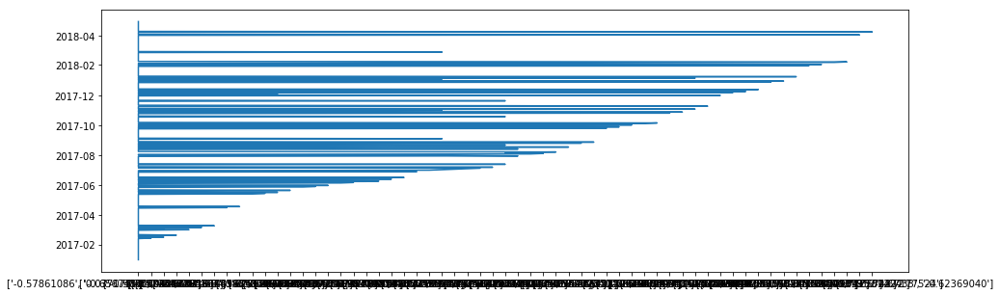

In [201]:
n = 1
f, axs = plt.subplots(nrows=n, ncols=1, sharex=False, sharey=False, figsize=(15, 5*n))

axs.plot(new_df.iloc[0][3:], new_df.columns[3:])



# for name, group in grouped:
# #     print(name)
#     group = group.sort_values(by = 'purchase_date')
#     axs[counter].plot(group['purchase_date'], group['purchase_amount'], '-o', c='c', 
#                       markerfacecolor='m', mec = 'm', markersize=4)
#     axs[counter].set_title(name)
#     axs[counter].grid(color='grey', linestyle='-', linewidth=0.3)
    
    
#     counter += 1


# new_df.iloc[0]

In [187]:
new_df = new_df.set_index(['index'])

In [189]:
new_df = new_df.T